# Isar EDA

## Outline

<a href="#step1"><h2> I.) Describing The Topic And General Questions</h2></a>
<a href="#step2"><h2> II.) Data Selection</h2></a>
<a href="#step3"><h2> III.) Data Merging Process</h2></a>
<a href="#river"><h3> A.) River</h3></a>
<a href="#flowrate"><h4>1.) Water Flow Rate</h4>
<a href="#waterlevel"><h4> 2.) Water Level</h4>
<a href="#watertemp"><h4> 3.) Water Temperature</h4>
<a href="#concentration"><h4>4.) Concentration Of Suspended Solids</h4>
<a href="#join"><h4>5.) Joining All Variables</h4>
<a href="#flood"><h4>6.) Marking Alert Levels and Flood events</h4>
<a href="#reservoir"><h3>B.) Water Level Of The Reservoir "Sylvensteinspeicher"</h3>
<a href="#weather"><h3>B.) Weather</h3>
<a href="#datacleaning"><h2> V.) Data cleaning</h2></a>
<a href="#outliers"><h3>A.) Handling Outliers</h3>
<a href="#approach"><h4>Approach</h4>
<a href="#outliersriver"><h4>1.) Outlier of the Data of the River</h4>
<a href="#outliersweather"><h4>2.) Outliers in the Weather Data</h3></h4>
<a href="#duplicates"><h4>B.) Removing Duplicates</h4>
<a href="#nans"><h4>C.) Handling NaNs</h4>
<a href="#calcdays"><h2> IV.) Calculating the Days for Swimming and Taking an Ice Bath</h2></a>

<h2 id="step1">I. Describing the Topic and General Questions</h2>
Topic: Changes of the river in Munich "Isar"

Data of the river "Isar" in Munich and general data of the weather are observed to get a good overview, how the Isar is an activity ressource for the poeple's quality time in Munich.
Especially also regarding the new health trend to take "ice-baths".
Also observing the benefits of the restoration of the river after June 2011 and the impact of the "Sylvensteinspeicher", a reservoir, an artificial lake for managing the water level of the Isar between "Bad Tölz" and Munich. It supports controling the Isar to prevent floods and also low water level. 

Following questions will be answered:
1. How suitable is the Isar for swimming and taking an ice-bath?
- When is the best time to start taking ice baths?
- When is the best time to go on vacations (because you can't take a lot of swims in the Isar)?
- In which months/time frame is it the hardest to take an ice bath?
- In which months is it likely that you can achieve going 3 times per week taking an ice bath?
- In which month is it likely that it becomes easier to take an ice bath?
- How many days are you able to swim (with and without ice-baths) in the Isar?
- t.b.c.
2. How have the water levels of the Isar changed over time, particularly since the river restauration in 2011? Is there a noticeable trend year by year?
3. Are there noticeable trends over time in the other variables, such as river flow rate, daily water and air temperatures, precipitation, snow depth, and sunshine duration? Are there any correlations?

(maybe later: 
Are there noticeable trends in these changes that correlate with weather patterns or broader climate change indicators?
What are the potential future scenarios for the Isar, considering ongoing climate change?)

<h2 id="step2">II. Description Of The Data Sources</h2>

The Data of the Isar is available on the website of the "Bayerisches Landesamt für Umwelt" (Bavarian State Office for Environment) https://www.hnd.bayern.de and the data of the weather on https://meteostat.net.


1. River "Isar":

- `river flow rate`[m3/s]: average, minimum, maximum, data stage per day: 01.01.1958 - now (18.11.2024)
- `water level`[cm]: average, minimum, maximum, data stage per day: 01.11.1973 - now (18.11.2024)
- `water temperatures`[°C]: average, minimum, maximum, data stage per day: 01.11.1980 - now (18.11.2024)
- `water pollution: suspended solids concentration`[g/m3]: 31.10.1965 - 21.08.2024 (note: there are problems at the station)

<p> I am additionally also going to calculate the water level limits. There are official numbers declared by the Bavarian government to activate a support system (e.g. water level alert 2: inform homeless people under the bridges to leave).</p>

2. Weather:
- `air temperatures`[°C]: average, minimum, maximum per day: 01.01.1958 - now (18.11.2024)`
- `total precipitation`[mm]: 01.01.1958 - now (18.11.2024)`
- `snow depth`[cm]: 01.01.1985 - now (18.11.2024)`
- `average wind speed`[km/h]: 01.01.1985 - now (18.11.2024)`
- `wind peak gust`[km/h]: 01.01.1985 - now (18.11.2024)`

the following values I will exclude, because there is no need for answering the questions:
- `wind direction`[°C]
- `sun duration`[°C]
- `pressure`[mm]


The timeframe with all variables available is: from 1985-01-01 - 2023-12-31

In [38]:
import pandas as pd
pd.options.mode.chained_assignment = None

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mp
import plotly.express as px

# for the automatically generated Report
import ydata_profiling

import warnings
warnings.filterwarnings('ignore')

# access to my own functions:
import sys
sys.path.insert(0, '../../_functions_')

from Functions_EDA import *

<h2 id="step3"> III. Data Preparation and Merging</h2>

<ol>
    <li>Downloading csv-files for the river, the reservoir and the weather</li>
    <li>Transforming the csv-files in Excel:</li>
    <ul>
        <li>Formatting datatypes (date, float)</li>
        <li>Removing the first line</li></li>
        <li>Checking the numbers of the year (”millennial problem”)
    </ul>
    <li>Concatenating the provided files</li>
    <li>Dropping column “Prüfstand” (“validation status”)</li>
    <li>Renaming columns (English)</li>
    <li>NaNs: before merging, looking, if there are any</li>
</ol>

<span style='color: violet'>ASKING SOFÍA!!!</span>
<p>Notes regarding to dropping "Prüfstand" (validation status):<br>
If I want to analyze only validated data, I could not investigate the concentration of suspended solids. So I decided to remove the column, because I can't do anything with. So I just dropped it. <br> 
TO BE DISCUSSED!!!<br></p>
<p>Details:<br>
validated data time frames: <br>
<ul>
    <li>for flow rate: until 1st of January in 2022</li>
    <li>for concentration of suspended solids: only raw data </li>
    <li>for water level: until 30th of September in 2024</li>
    <li>for water level of the reservoir: unitl 1st of August in 2024</li>
</ul>

<h2 id="river">A. River</h2>
<ol>
    <li>Concatenating the 3 xlsx-files per variable</li>
    <li>Deleting "Prüfstatus"</li>
    <li>Renaming the variables</li>
    <li>Joining all variables by date and create a wholesome dataframe for all variables of the river</li>
</ol>

<h3 id="flowrate"> 1. Water Flow Rate</h3>

<span style='color: red;'>This df_concat_excel function is ok but I would probably follow a slighly different approach. The most simplier approach is to use a for loop inside your code. You're creating three dataframes copying three times pd.read_excel(). This function be written once inside the for loop. You can use the position to create the dataframes all together. If this is a bit complicated for you, we can do it together.
Also, you don't need to put path1 = path1. If this is included in the parameters inside the declaration of the function, there is no need to mention them again inside the code. </span>

<span style='color: yellow;'>If you want a ++A grade, something interesting would be using the glob library. This way you don't need to write the path of each file individually, just the folder were they three files are stored. This will upload and convert into dataframe with pd.read_excel(). This way you can append them to a list of dataframes and, after that, use pd.concat() to concatenate the three dataframes. This will allow you to concat a different variable number of files! </span>

In [39]:
# YOU CAN REMOVE IT LATER, THIS IS ONLY FOR ME TO HAVE THE CODE HERE
def df_concat_excel(path1, path2, path3):
    """
    it loads the data that is in multiple excel-files
    and put it together in one file by giving the paths
    """
    path1 = path1
    path2 = path2
    path3 = path3

    df_1 = pd.read_excel(path1)
    df_2 = pd.read_excel(path2)
    df_3 = pd.read_excel(path3)

    df = pd.concat([df_1, df_2, df_3])
    
    sum_rows = df_1.shape[0] + df_2.shape[0] + df_3.shape[0]

    if df.shape[0] == sum_rows:
        print("dataframe for is completed. There are", sum_rows, "rows.");
    else:
        print("there's a mistake")
        print("Sum of the rows of each df:", sum_rows)
        print("Rows of the new dataframe:", df.shape[0])
    return df  

In [40]:
# concatenating RIVER - flow rate
# the data is divided by 3 xlsx files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_flow_rate_beginn_2023 = "../data/Isar/fluesse-abfluss/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_flow_rate_to_10_2023 = "../data/Isar/fluesse-abfluss/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_flow_rate_to_241118 = "../data/Isar/fluesse-abfluss/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_flow_rate = df_concat_excel(path_flow_rate_beginn_2023, path_flow_rate_to_10_2023, path_flow_rate_to_241118)

dataframe for is completed. There are 24125 rows.


In [41]:
df_flow_rate.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1958-11-01,74.4,NaN,NaN,Geprueft
1,1958-11-02,77.9,NaN,NaN,Geprueft
2,1958-11-03,72.2,NaN,NaN,Geprueft
3,1958-11-04,93.0,NaN,NaN,Geprueft
4,1958-11-05,121.0,NaN,NaN,Geprueft


<span style='color: red;'>It would be great to mentioned at this point that you do a .info() and there is no data type to change, but that you have nulls.<br> 
</span><span style='color: green'>done</span>

In [42]:
df_flow_rate.info()
# There are no Nans in flow rate average in the DataFrame (but maybe missing whole records, because it is recorded by day, see chapter "Handling NaNs")
# There are missing values in flow rate maximum and minimum -> handling later, after handling outliers
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
 4   Prüfstatus  24125 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 1.1+ MB


<span style='color: red;'>Why do you remove Prüfstatus? Is this variable not of your interest? Why? Reasoning the steps is important!</span><br>
<apan style='color: green'>done, see comment</span>

In [43]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_flow_rate = df_flow_rate.drop(columns= ['Prüfstatus'])
df_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 942.4 KB


In [44]:
# looking into the NaNs deeper, because there are less non-null values in maximum and minimum
df_flow_rate.isna().sum()

Datum            0
Mittelwert       0
Maximum       4383
Minimum       4383
dtype: int64

<span style='color: violet'><b>Note</b>The recording of the maximum and minum started later, so I will fill in a zero in the section "Handling NaNs"</span>

In [45]:
# renaming the columns, because all the values of the variables have the same name and, changing into English expressions
df_flow_rate = df_flow_rate.rename(columns={'Datum':'date',
                             'Mittelwert':'flow_avg',
                             'Maximum':'flow_max',
                             'Minimum':'flow_min'})

<h3 id=waterlevel> 2. Water Level</h3>

In [46]:
# concatenating RIVER - water level
# the data is divided by 3 xlsx-files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_water_level_beginn_2023 = "../data/Isar/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_level_to_10_2023 = "../data/Isar/fluesse-wasserstand/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_level_to_241118 = "../data/Isar/fluesse-wasserstand/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_level = df_concat_excel(path_water_level_beginn_2023, path_water_level_to_10_2023, path_water_level_to_241118)


dataframe for is completed. There are 18646 rows.


<span style='color: red;'>I would say here you follow the same procedure (remove prüfstatus, all variables are ok) as with the previous data! You don't need to repeat everything again. Say for this one you don't have nulls!</span><br>
<span style='color: green;'>done</span>

In [47]:
df_water_level.info()
# There are no Nans in water level average in the DataFrame (but maybe missing whole records, because it is recorded by day, see chapter "Handling NaNs")
# All datatypes are right.
# There are no NaNs.

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
 4   Prüfstatus  18646 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 874.0+ KB


In [48]:
df_water_level.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1973-11-01,50,58,44,Geprueft
1,1973-11-02,45,53,43,Geprueft
2,1973-11-03,49,57,43,Geprueft
3,1973-11-04,45,57,31,Geprueft
4,1973-11-05,46,52,35,Geprueft


In [49]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so I would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_water_level = df_water_level.drop(columns= ['Prüfstatus'])
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 728.4 KB


In [50]:
# renaming redundant names for the whole final dataset and changing them into English expressions
df_water_level = df_water_level.rename(columns={'Datum':'date',
                               'Mittelwert':'level_avg',
                               'Maximum':'level_max',
                               'Minimum':'level_min'})

<h3 id=watertemp> 3. Water Temperature

<span style='color: red;'>I would say here you follow the same procedure (remove prüfstatus, all variables are ok) as with the previous data! You don't need to repeat everything again. Say for this one you don't have nulls!</span><br>
<span style='color: green;'>done</span>

In [51]:
# concatenating RIVER - water temperature
# the data is divided by 3 xlsx-files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_water_temperature_beginn_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_temperature_to_10_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_temperature_to_241118 = "../data/Isar/fluesse-wassertemperatur/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_temperature = df_concat_excel(path_water_temperature_beginn_2023, path_water_temperature_to_10_2023, path_water_temperature_to_241118)


dataframe for is completed. There are 15367 rows.


In [52]:
df_water_temperature.info()
# There are no NaNs, maybe missing records, I will check that later (see handling NaNs)
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
 4   Prüfstatus  15367 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 720.3+ KB


In [53]:
df_water_temperature.head(10)

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1980-11-01,8.1,8.1,8.1,Geprueft
1,1980-11-02,7.3,7.3,7.3,Geprueft
2,1980-11-03,5.8,5.8,5.8,Geprueft
3,1980-11-04,5.6,5.6,5.6,Geprueft
4,1980-11-05,4.8,4.8,4.8,Geprueft
5,1980-11-06,4.7,4.7,4.7,Geprueft
6,1980-11-07,6.1,6.1,6.1,Geprueft
7,1980-11-08,7.7,7.7,7.7,Geprueft
8,1980-11-09,7.5,7.5,7.5,Geprueft
9,1980-11-10,7.6,7.6,7.6,Geprueft


In [54]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so I would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_water_temperature = df_water_temperature.drop(columns= ['Prüfstatus'])
df_water_temperature.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 600.3 KB


In [55]:
#renaming redundant variable names and changing into English expressions
df_water_temperature = df_water_temperature.rename(columns={'Datum':'date',
                                     'Mittelwert':'water_temp_avg',
                                     'Maximum':'water_temp_max',
                                     'Minimum':'water_temp_min'})

<span style='color: yellow;'>If you want a ++A grade, I would have done this process different. In the end, you are repeating the same exact process three times. You concat from the excel the three dataframes, then remove the same column three times, check the .info() three times and do a .head() over each dataframe three times too. You could do all these process once with a list of dataframes! I know this is a more complex approach, but this is an approach you could explore to improve your coding skills!</span><br>
<span style='color: green'>I will definitel do that, but not now. I don't have the time and prioritized other tasks higher</span>

<h3 id=concentration> 4. Concentration Of Suspended Solids

<span style='color: red;'>Here you're not using the df_concat_excel() function you created for the previous files. You can reuse it here!</span><br>
<span style='color: green;'>I haven't used it because I've only got 2 files, doesn't work, does it????</span>

In [56]:
# concentration of suspended solids
# the data is divided by 2 xls files:
# 1. beginning until 2023
# 2. 01/2023 until 08/21/2023

path_concent_solids_begin_to_2023 = "../data/Isar/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_concent_solids_to_240821 = "../data/Isar/fluesse-schwebstoff/16005701_01.01.2024_21.08.2024_tmw_0.xlsx"

df_concent_solids = pd.concat([pd.read_excel(path_concent_solids_begin_to_2023), pd.read_excel(path_concent_solids_to_240821)])

print("There are", df_concent_solids.shape[0], "rows.")

There are 21250 rows.


<span style='color: red;'>I would say here what you're finding: no nulls, data types are fine, you'll remove several columns. Great to say why: for example, in here you have several measures and you choose only the concentration of solid. Why did you choose this one?</span><br>
<span style='color: green;'>done</span>

In [57]:
# To estimate how suitable the Isar is for swimming, the factor of water pollution should be considered.
# No one wants to get into the water when it is brownish.
# After conducting research, I decided to focus on the concentration of suspended solids ("Schwebstoff_Konzentration").
# This is the most important factor and simplifies comparisons. A high concentration indicates water pollution,
# visibly affects the color of the water, and may carry toxic substances. All of this influences how suitable the Isar is for swimming.
# Therefore, I will remove all other variables. The remaining variables are more relevant for long-term ecological monitoring,
# which is not the goal of this analysis. Additionally, there should be a correlation between precipitation and increasing suspended solids,
# which I will investigate further in the analysis.
# source: https://info.bml.gv.at/dam/jcr:479ff2f0-b143-4560-a9a9-36c464c25125/Leitfaden_Schwebstoffmessung_2te-Auflage.pdf
# There are no NaNs.
# Also deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, therefor it contains no usable information

df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Zeitpunkt                          21250 non-null  datetime64[ns]
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  float64       
 2   Prüfstatus                         21250 non-null  object        
 3   Schwebstoff-Fracht [t]             21250 non-null  float64       
 4   Prüfstatus.1                       21250 non-null  object        
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  float64       
 6   Prüfstatus.2                       21250 non-null  object        
 7   Schwebstoff-Transport [kg/s]       21250 non-null  float64       
 8   Prüfstatus.3                       21250 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 1.6+ MB


In [58]:
df_concent_solids.head()

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,1965-10-31,25.00,Rohdaten,47.85,Rohdaten,0.02,Rohdaten,0.55,Rohdaten
1,1965-11-01,18.06,Rohdaten,32.47,Rohdaten,0.01,Rohdaten,0.38,Rohdaten
2,1965-11-02,11.57,Rohdaten,20.55,Rohdaten,0.01,Rohdaten,0.24,Rohdaten
3,1965-11-03,11.11,Rohdaten,27.77,Rohdaten,0.01,Rohdaten,0.32,Rohdaten
4,1965-11-04,9.88,Rohdaten,26.54,Rohdaten,0.01,Rohdaten,0.31,Rohdaten


In [59]:
# just go with "Zeitpunkt" and "Schwebstoff-Konzentration [g/m^3]""
df_concent_solids = df_concent_solids[['Zeitpunkt', 'Schwebstoff-Konzentration [g/m^3]']]
# renaming the columns and using English expressions
df_concent_solids = df_concent_solids.rename(columns={'Zeitpunkt': 'date',
                                                      'Schwebstoff-Konzentration [g/m^3]':'concent_solids'})
df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            21250 non-null  datetime64[ns]
 1   concent_solids  21250 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 498.0 KB


<h3 id="join">5. Joining All Variables</h3>

<span style='color: red;'>Use a for loop in here! You could do a list with all your dataframes and itinerate over the list (for df in list_dfs). Inside the loop, you could just add the merge, like this: df_river = df_river.merge(df, on='date', how='left').</span><br>
<span style='color: green;'>done</span>

In [60]:
# creating a list with all dataframes of the river to use it in a loop for merging them
# Attention: right order is important to get all the values (and also producing NaNs: asking Sofía, if this is the right and most efficient approach!)
list_dfs_river = [df_flow_rate, df_water_level, df_concent_solids, df_water_temperature]

In [61]:
# merging all river DataFrames:
df_river = list_dfs_river[0]

for df in list_dfs_river[1:]:
    df_river = df_river.merge(df, on='date', how='left')

In [62]:
# looking into the new dataframe:
df_river.info()
# question to Sofía: where do you write down the results? Do you create a new comment (or mark-up) above the code?
# ToDo: looking into Sofía's code example!!!
# like ecpected: 
# "real" NaNs in: flow_max, flow_min
# artificial NaNs in all variables of level and water temperature and concententration of suspended solids (due to the different timeframes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            24125 non-null  datetime64[ns]
 1   flow_avg        24125 non-null  float64       
 2   flow_max        19742 non-null  float64       
 3   flow_min        19742 non-null  float64       
 4   level_avg       18646 non-null  float64       
 5   level_max       18646 non-null  float64       
 6   level_min       18646 non-null  float64       
 7   concent_solids  21250 non-null  float64       
 8   water_temp_avg  15367 non-null  float64       
 9   water_temp_max  15367 non-null  float64       
 10  water_temp_min  15367 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.0 MB


In [63]:
# Adding variable 'month' and 'year' to ease the handling
df_river['year'] = df_river['date'].dt.year
df_river['month'] = df_river['date'].dt.month
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            24125 non-null  datetime64[ns]
 1   flow_avg        24125 non-null  float64       
 2   flow_max        19742 non-null  float64       
 3   flow_min        19742 non-null  float64       
 4   level_avg       18646 non-null  float64       
 5   level_max       18646 non-null  float64       
 6   level_min       18646 non-null  float64       
 7   concent_solids  21250 non-null  float64       
 8   water_temp_avg  15367 non-null  float64       
 9   water_temp_max  15367 non-null  float64       
 10  water_temp_min  15367 non-null  float64       
 11  year            24125 non-null  int32         
 12  month           24125 non-null  int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 2.2 MB


In [64]:
# Chosing a different timeframe: 
# When I am calculating later the days for swimming and icebathing, you need values of each variables.
# The start date of the recording of each variable differs, so I chose the maximum timeframe, in which are the most available values.
# Also I decided to only go with whole years, so I take the data unto 2023 (included)
# The new timeframe is: 1985-01-01 - 2023-12-31
df_river = df_river[(df_river['date'] >= '1985-01-01') & (df_river['date'] <= '2023-12-31')]
df_river.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14244 entries, 9558 to 23801
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            14244 non-null  datetime64[ns]
 1   flow_avg        14244 non-null  float64       
 2   flow_max        14244 non-null  float64       
 3   flow_min        14244 non-null  float64       
 4   level_avg       14244 non-null  float64       
 5   level_max       14244 non-null  float64       
 6   level_min       14244 non-null  float64       
 7   concent_solids  14014 non-null  float64       
 8   water_temp_avg  13522 non-null  float64       
 9   water_temp_max  13522 non-null  float64       
 10  water_temp_min  13522 non-null  float64       
 11  year            14244 non-null  int32         
 12  month           14244 non-null  int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 1.4 MB


In [65]:
df_river.isna().sum()

date                0
flow_avg            0
flow_max            0
flow_min            0
level_avg           0
level_max           0
level_min           0
concent_solids    230
water_temp_avg    722
water_temp_max    722
water_temp_min    722
year                0
month               0
dtype: int64

In [66]:
# looking deeper into the NaNs of water temperatue and concentration of suspended solids to check if I chose the timeframe right.
# if there are a lot of NaNs in the beginning it could be the wrong timeframe.
df_river[['water_temp_avg', 'water_temp_max', 'water_temp_min', 'concent_solids']].isna().groupby(df_river['year']).sum()

,water_temp_avg,water_temp_max,water_temp_min,concent_solids
year,,,,
1985,0,0,0,0
1986,0,0,0,0
1987,0,0,0,0
1988,0,0,0,0
1989,0,0,0,0
1990,0,0,0,0
1991,0,0,0,0
1992,0,0,0,0
1993,0,0,0,0


<span style='color: violet'>Result: There are a lot of NaNs in 2012, 2013 and 2022. In 2021 there are no values at all.<br>
Looking deeper into it, when handling the NaNs.</span>

In [67]:
df_river_copy = df_river.copy()

<h2 id="weather"> B. WEATHER </h2>
<p>Concentating the all xlsx-files</p>

In [68]:
# 6 xls files from 1958 to 2024
# paths:

path_weather_58_to_67 = "../data/weather/weather1958-1967.xlsx"
path_weather_68_to_77 = "../data/weather/weather1968-1977.xlsx"
path_weather_78_to_87 = "../data/weather/weather1978-1987.xlsx"
path_weather_88_to_97 = "../data/weather/weather1988-1997.xlsx"
path_weather_98_to_07 = "../data/weather/weather1998-2007.xlsx"
path_weather_08_to_17 = "../data/weather/weather2008-2017.xlsx"
path_weather_18_to_24 = "../data/weather/weather2018-241118.xlsx"

df_weather1 = df_concat_excel(path_weather_58_to_67, path_weather_68_to_77, path_weather_78_to_87)
df_weather2 = df_concat_excel(path_weather_88_to_97, path_weather_98_to_07, path_weather_08_to_17)
df_weather3 = pd.read_excel(path_weather_18_to_24)

df_weather = pd.concat([df_weather1, df_weather2, df_weather3])

dataframe for is completed. There are 10952 rows.
dataframe for is completed. There are 10952 rows.


In [69]:
df_weather.info()
# There are NaNs in snow, wdir (wind direction), wspd (wind speed), wpgt (wind peak gust), pres (pressure) and tsun (total sunshine duration)
# I think, the NaNs in snow are just "O" - when there isn't snow, need to varify it in the section "handling NaNs"
# date is an object, I need to transform it into datetime format
# all other variables' datatypes are right

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    24417 non-null  object 
 1   tavg    24417 non-null  float64
 2   tmin    24417 non-null  float64
 3   tmax    24417 non-null  float64
 4   prcp    24417 non-null  float64
 5   snow    22849 non-null  float64
 6   wdir    9785 non-null   float64
 7   wspd    14490 non-null  float64
 8   wpgt    14475 non-null  float64
 9   pres    14554 non-null  float64
 10  tsun    24412 non-null  float64
dtypes: float64(10), object(1)
memory usage: 2.2+ MB


In [70]:
# Removing the columns wind direction ('wdir'), pressure ('pres') and sun duration ('tsun'), because I don't need them for the analysis
df_weather = df_weather.drop(columns=['wdir','pres', 'tsun'])
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    24417 non-null  object 
 1   tavg    24417 non-null  float64
 2   tmin    24417 non-null  float64
 3   tmax    24417 non-null  float64
 4   prcp    24417 non-null  float64
 5   snow    22849 non-null  float64
 6   wspd    14490 non-null  float64
 7   wpgt    14475 non-null  float64
dtypes: float64(7), object(1)
memory usage: 1.7+ MB


In [71]:
df_weather.head(10)

,date,tavg,tmin,tmax,prcp,snow,wspd,wpgt
0,1958-01-01,0.9,-1.0,6.4,0.0,0.0,NaN,NaN
1,1958-01-02,0.8,-4.7,5.6,0.1,0.0,NaN,NaN
2,1958-01-03,-1.6,-2.2,0.6,0.8,0.0,NaN,NaN
3,1958-01-04,-5.4,-7.5,-2.0,0.9,10.0,NaN,NaN
4,1958-01-05,1.7,-5.2,4.0,6.8,10.0,NaN,NaN
5,1958-01-06,6.3,1.5,9.0,20.7,0.0,NaN,NaN
6,1958-01-07,3.3,1.9,11.3,4.3,0.0,NaN,NaN
7,1958-01-08,0.6,-1.6,2.4,1.1,30.0,NaN,NaN
8,1958-01-09,2.5,1.0,3.7,5.5,30.0,NaN,NaN
9,1958-01-10,1.4,-0.8,4.0,0.0,0.0,NaN,NaN


In [72]:
# formatting the column date into Panda's datetime-format
df_weather['date'] = pd.to_datetime(arg=df_weather['date'])
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    24417 non-null  datetime64[ns]
 1   tavg    24417 non-null  float64       
 2   tmin    24417 non-null  float64       
 3   tmax    24417 non-null  float64       
 4   prcp    24417 non-null  float64       
 5   snow    22849 non-null  float64       
 6   wspd    14490 non-null  float64       
 7   wpgt    14475 non-null  float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 1.7 MB


In [73]:
# to get an overview of the data and correlations
profile_report = df_weather.profile_report()
profile_report.to_file(output_file='weather_output.html')

profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

2️⃣ 👉 Wichtige Fragen, die du nach dem Report beantworten solltest:
💡 Allgemeine Checks:
✔️ Sind Min/Max-Werte realistisch? (Falls nicht, markieren!)
✔️ Gibt es ungewöhnlich viele Nullwerte oder konstante Spalten?
✔️ Gibt es stark schiefe Verteilungen oder Ausreißer?
✔️ Hat eine Variable sehr hohe Korrelationen mit einer anderen?
✔️ Sind zeitliche Trends erkennbar?

💡 Konkrete Beispiele für Dokumentation:
📌 Falls du extreme Maximalwerte findest (z. B. 500 cm Schnee in München), notiere das:
➡️ "Maximalwert für Schneehöhe mit 500 cm erscheint unrealistisch, muss weiter überprüft werden."

📌 Falls eine Variable über 80% Nullwerte hat, überlege: Löschen oder mit NaN-Handling arbeiten?
➡️ "Die Variable xyz hat 85% NaNs, daher wird sie in der Analyse nicht berücksichtigt."

📌 Falls du eine sehr hohe Korrelation (z. B. 0.95) zwischen zwei Variablen findest:
➡️ "Starke Korrelation zwischen prcp und flow_rate, daher könnte eine von beiden redundant sein."

In [74]:
# Actually I want to remove wind direction, pressure and total sunshine duration, because these variables don't imply my data analysis. 
# Why? 
# 1. the wind direction and pressure have no influence to the suitability
# 2. the total sunshine duration is not a good factor, the air temperature is a better one, more accurate and sun duration correlates strong with the air temperature
# TO BE DISCUSSED!

In [75]:
# Adding variable 'month' and 'year' to ease the handling
df_weather['year'] = df_weather['date'].dt.year
df_weather['month'] = df_weather['date'].dt.month
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    24417 non-null  datetime64[ns]
 1   tavg    24417 non-null  float64       
 2   tmin    24417 non-null  float64       
 3   tmax    24417 non-null  float64       
 4   prcp    24417 non-null  float64       
 5   snow    22849 non-null  float64       
 6   wspd    14490 non-null  float64       
 7   wpgt    14475 non-null  float64       
 8   year    24417 non-null  int32         
 9   month   24417 non-null  int32         
dtypes: datetime64[ns](1), float64(7), int32(2)
memory usage: 1.9 MB


In [76]:
# Chosing the same timeframe as for the river data:
# The new timeframe is: 1985-01-01 - 2023-12-31
df_weather = df_weather[(df_weather['date'] >= '1985-01-01') & (df_weather['date'] <= '2023-12-31')]
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14236 entries, 2556 to 2189
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    14236 non-null  datetime64[ns]
 1   tavg    14236 non-null  float64       
 2   tmin    14236 non-null  float64       
 3   tmax    14236 non-null  float64       
 4   prcp    14236 non-null  float64       
 5   snow    12671 non-null  float64       
 6   wspd    14167 non-null  float64       
 7   wpgt    14152 non-null  float64       
 8   year    14236 non-null  int32         
 9   month   14236 non-null  int32         
dtypes: datetime64[ns](1), float64(7), int32(2)
memory usage: 1.1 MB


In [77]:
# looking into the NaNs:
df_weather.isna().sum()

date        0
tavg        0
tmin        0
tmax        0
prcp        0
snow     1565
wspd       69
wpgt       84
year        0
month       0
dtype: int64

In [78]:
# looking deeper into the NaNs of snow, windspeed, windpeak gust to check if I chose the timeframe right.
# if there are a lot of NaNs in the beginning it could be the wrong timeframe.
df_weather[['snow', 'wspd', 'wpgt']].isna().groupby(df_weather['year']).sum()

,snow,wspd,wpgt
year,,,
1985,0,3,0
1986,0,0,0
1987,0,0,0
1988,0,0,1
1989,0,0,0
1990,0,0,0
1991,0,0,0
1992,0,0,0
1993,0,0,0


<span style='color: violet'>Result: There are a lot of NaNs in the variable "snow" and in general in 2015.<br>
Looking deeper into it, when handling the NaNs.</span>

In [79]:
df_weather_copy = df_weather.copy()

<h1 id="datacleaning"> V.) Data Cleaning </h1>

<h2 id="outliers">A.) Handling Outliers</h2>

<p>Outliers can strongly affect statistical measures and analyses.  
To ensure that extreme values do not affect the dataset, outliers will be checked and handled carefully.</p>

<h3 id="approach">1.) Approach: How Outliers Are Detected</h3>

<p>To decide whether an outlier should be removed or not, the following steps are taken:</p>

<h5>IQR - 75% Quantile Method</h5>
<ol>
    <li>Marking potential outliers using the interquartile range (IQR).</li>
    <li>Checking the distribution of the data to decide whether the mean or median is more reliable.</li>
    <li><b>Choosing median or mean:</b> The median is better for skewed variables, while the mean remains valid for normally distributed variables.</li>
    <li>Comparing the medians of the dataset with and without outliers.</li>
    <li>Analyzing the differences: The difference should be below 10%.</li>
    <li>Confirming outliers if the threshold is exceeded.</li>
</ol>

<h3 id="initialcheck">2.) Initial Check</h3>

<p>Each column in both datasets (*df_river* and *df_weather*) is analyzed for outliers using the function <code>outliers_box</code>, which creates a boxplot for every column.</p>

In [80]:
# List of all variables to check for outliers
exclude_cols = ['year', 'month']
list_col_river = [col for col in df_river.select_dtypes(include=['number']).columns if col not in exclude_cols]
list_col_river

['flow_avg',
 'flow_max',
 'flow_min',
 'level_avg',
 'level_max',
 'level_min',
 'concent_solids',
 'water_temp_avg',
 'water_temp_max',
 'water_temp_min']

In [81]:
# df_river: checking for outliers in df_river

#for col in list_col_river:
   #outliers_box(df_river, col)

In [82]:
list_col_weather = [col for col in df_weather.select_dtypes(include=['number']).columns if col not in exclude_cols]
list_col_weather

['tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wspd', 'wpgt']

In [83]:
# df_weather: checking for outliers in df_weather

#for col in list_col_weather:
  #outliers_box(df_weather, col)

<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <ol>
        <li><b>River Data:</b></li>
        <ul>
            <li>No outliers in water temperature.</li>
            <li>Water Flow Rate: Outliers above the upper limit in all variables (avg, min, max).</li>
            <li>Water Level: Outliers above the upper limit in all variables (avg, min, max).</li>
            <li>Concentration of suspended solids: Outliers above the upper limit.</li>
        </ul>
        <li><b>Weather Data:</b></li>
        <ul>
            <li>Air temperature: Outliers below the lower limit in all variables (avg, min, max).</li>
            <li>Precipitation: Outliers above the upper limit.</li>
            <li>Snow: Outliers above the upper limit.</li>
            <li>Wind Speed (wspd): Outliers above the upper limit.</li>
            <li>Wind Peak Gust (wpgt): Outliers above the upper limit.</li>
        </ul>
    </ol>
</span>


<h3 id="outliersriver">3.) Outliers in the River Data</h3>

In [84]:
# Get help for mark_outliers_IQR function (to understand its parameters)
help(mark_outliers_IQR)

Help on function mark_outliers_IQR in module Functions_EDA:

mark_outliers_IQR(df, col_name, outlier_col, multiplier=1.5, verbose=True)
    Marks outliers in a DataFrame column using the IQR method.
    
    This function calculates the interquartile range (IQR) to determine outliers
    in the given column and flags them in the specified outlier column.
    
    Parameters:
    ----------
    df : pd.DataFrame
        The DataFrame containing the data to analyze.
    col_name : str
        The name of the column to check for outliers.
    outlier_col : str
        The name of the column where outlier flags will be stored.
    multiplier : float, optional (default=1.5)
        The multiplier for the IQR to determine outlier limits.
    verbose = bool, optional (default=True)
        Whether to print the details of the operation.
    
    Returns:
    -------
    None
        The function modifies the DataFrame in place by updating the outlier_column
        with 'suspected' for detecte

In [85]:
# Create a dictionary for the river variables where outliers will be checked

dict_river_outliers = {col : f"is_outlier_{col}" for col in list_col_river}
dict_river_outliers

{'flow_avg': 'is_outlier_flow_avg',
 'flow_max': 'is_outlier_flow_max',
 'flow_min': 'is_outlier_flow_min',
 'level_avg': 'is_outlier_level_avg',
 'level_max': 'is_outlier_level_max',
 'level_min': 'is_outlier_level_min',
 'concent_solids': 'is_outlier_concent_solids',
 'water_temp_avg': 'is_outlier_water_temp_avg',
 'water_temp_max': 'is_outlier_water_temp_max',
 'water_temp_min': 'is_outlier_water_temp_min'}

In [86]:
# Create columns for marking outliers and apply the function

for col_name, outlier_col in dict_river_outliers.items():
    df_river[outlier_col] = 'normal'
    mark_outliers_IQR(df_river, col_name, outlier_col, 1.5, True)


flow_avg:
Lower limit: -35.39999999999999, Upper limit: 143.79999999999998
Number of outliers: 787 out of 14244
is_outlier_flow_avg
normal       13457
suspected      787
Name: count, dtype: int64
_________________________
flow_max:
Lower limit: -35.649999999999984, Upper limit: 162.34999999999997
Number of outliers: 868 out of 14244
is_outlier_flow_max
normal       13376
suspected      868
Name: count, dtype: int64
_________________________
flow_min:
Lower limit: -32.60000000000001, Upper limit: 124.20000000000002
Number of outliers: 712 out of 14244
is_outlier_flow_min
normal       13532
suspected      712
Name: count, dtype: int64
_________________________
level_avg:
Lower limit: 0.0, Upper limit: 160.0
Number of outliers: 511 out of 14244
is_outlier_level_avg
normal       13733
suspected      511
Name: count, dtype: int64
_________________________
level_max:
Lower limit: 8.0, Upper limit: 168.0
Number of outliers: 661 out of 14244
is_outlier_level_max
normal       13583
suspected   

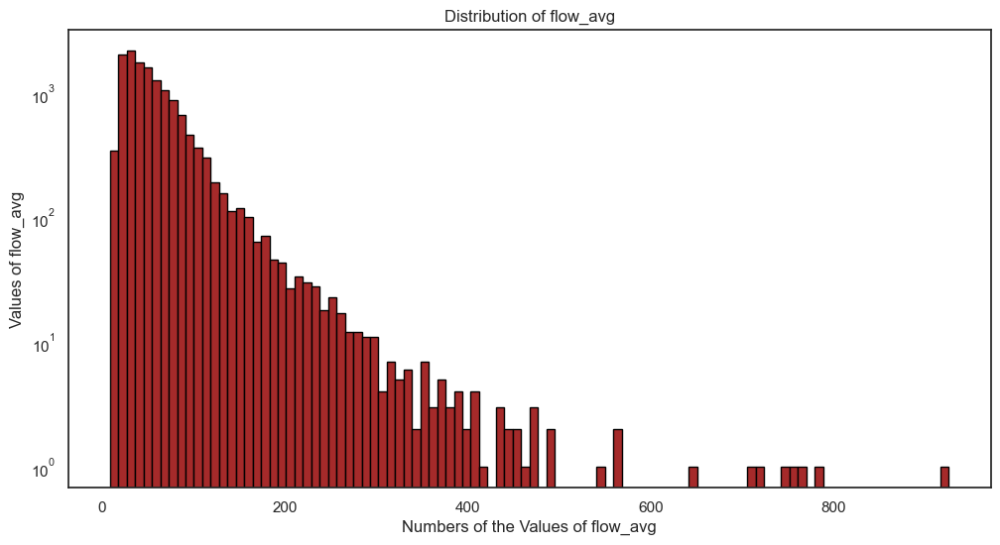

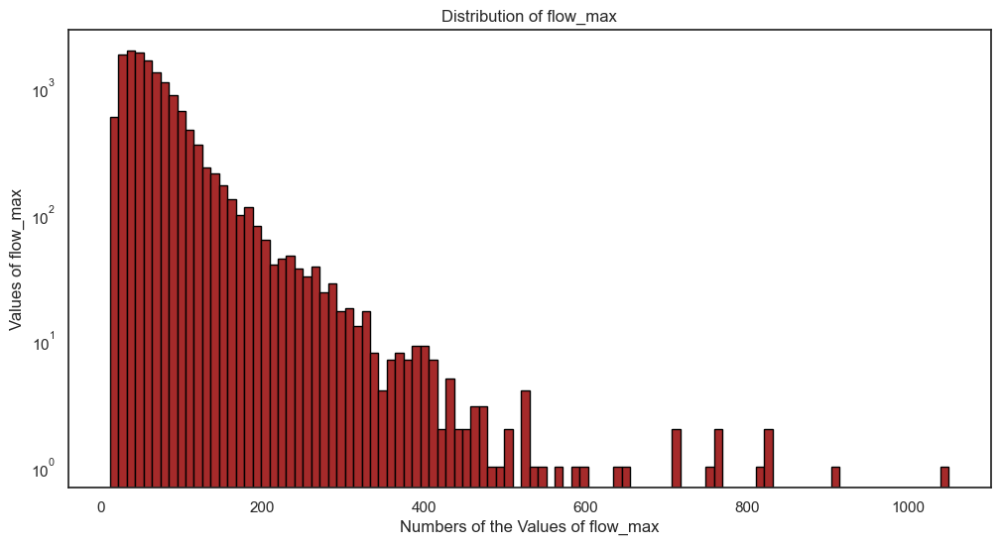

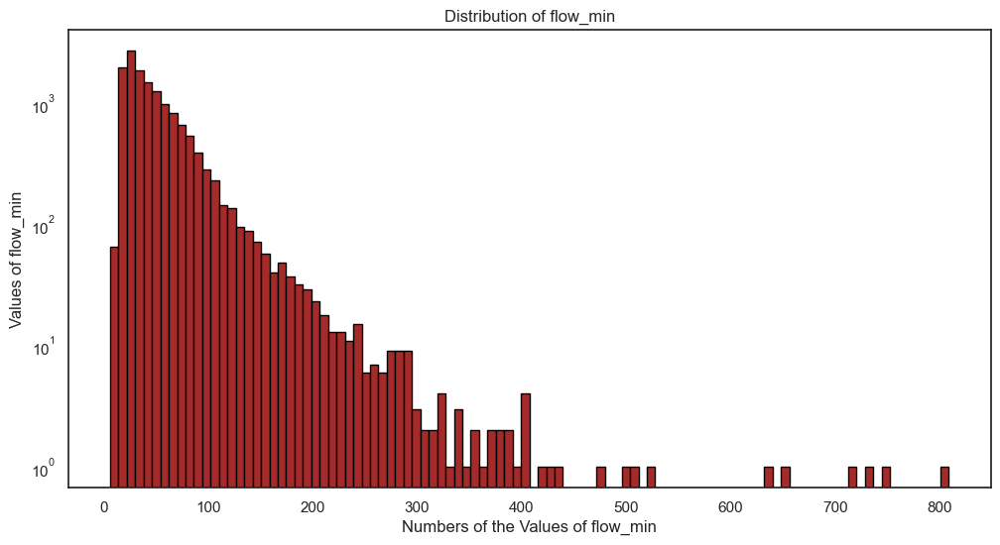

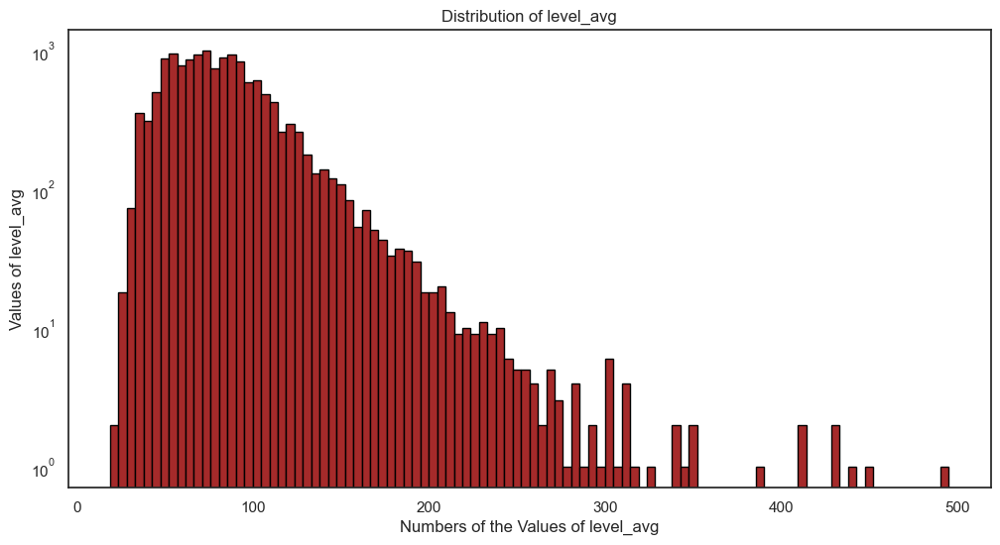

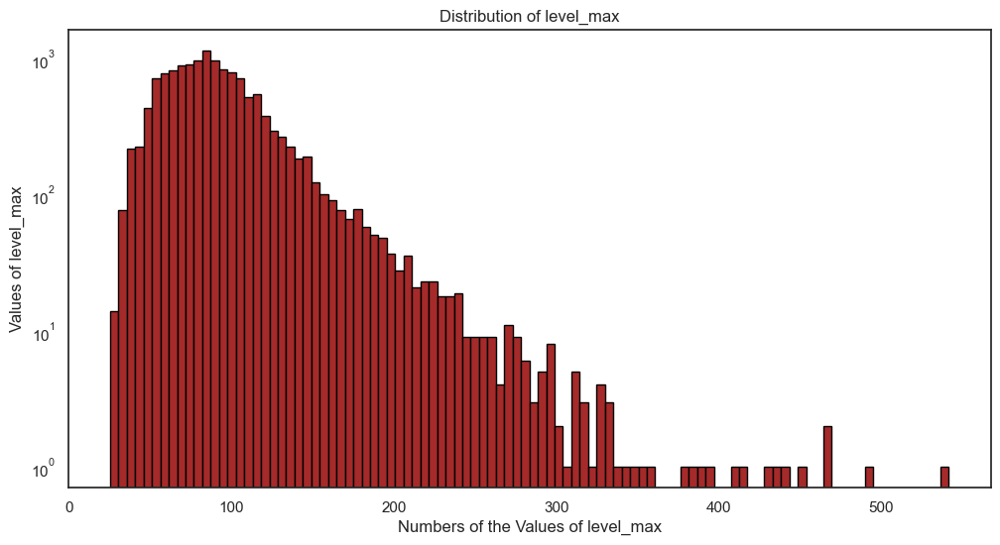

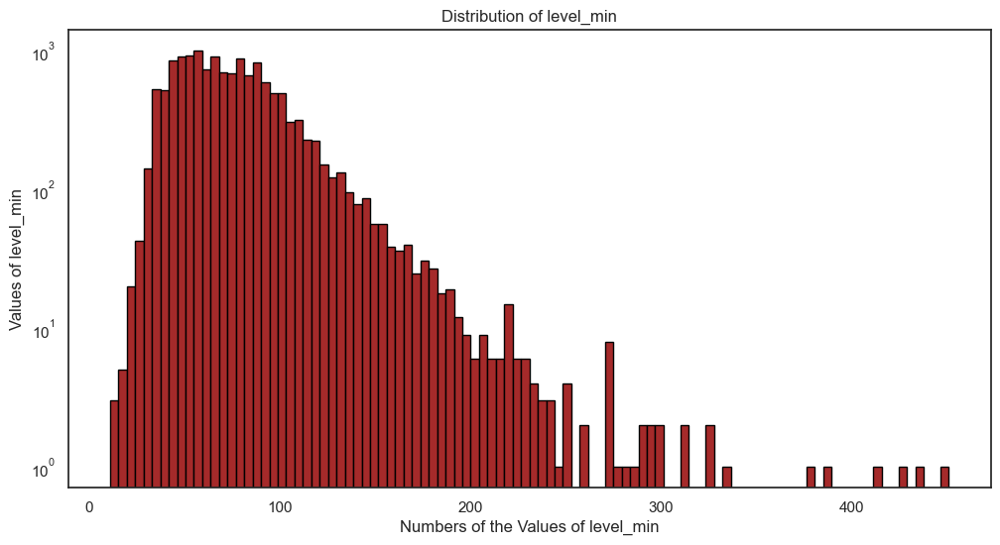

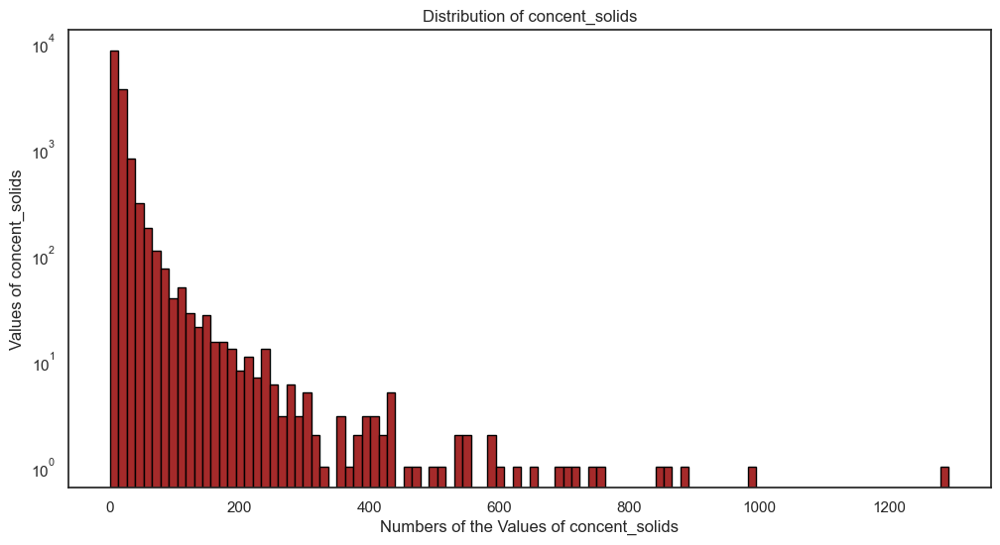

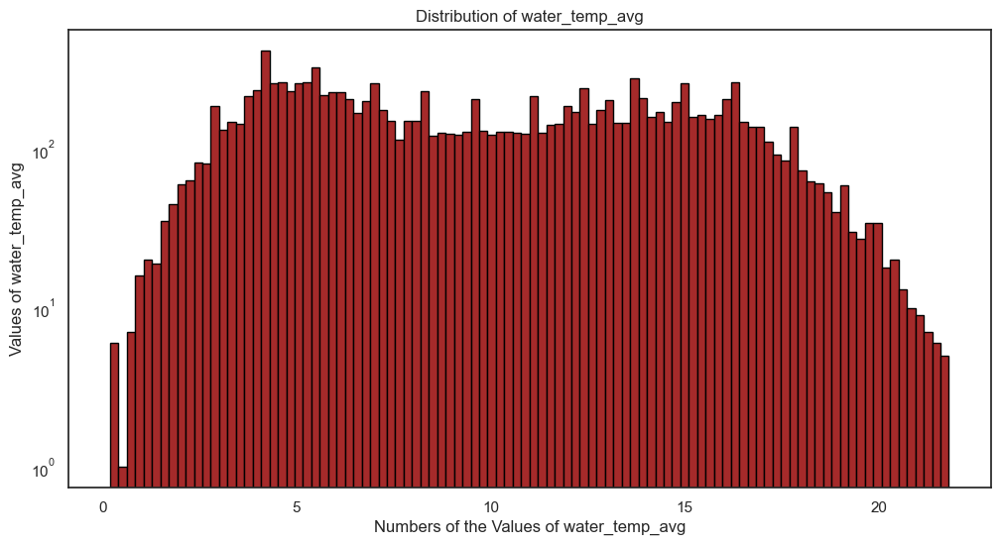

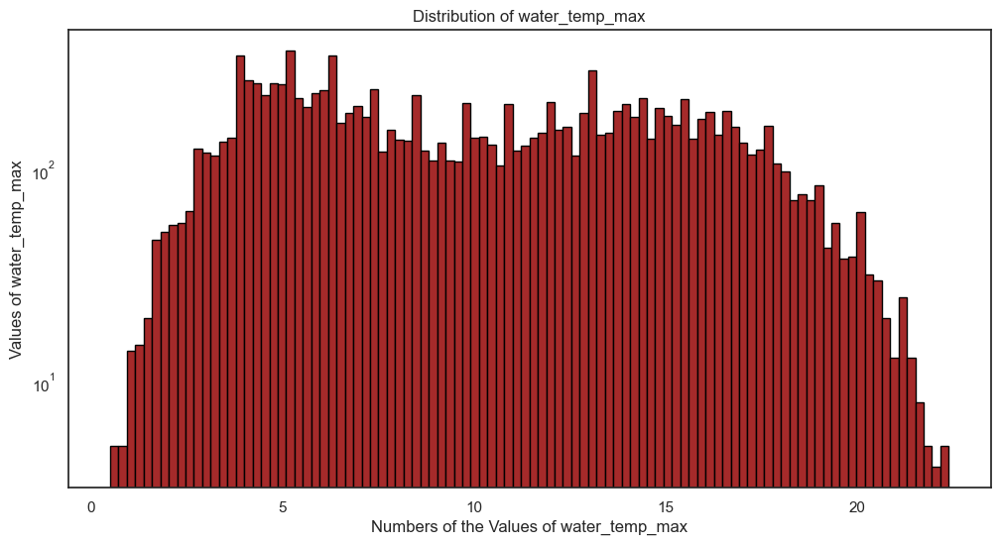

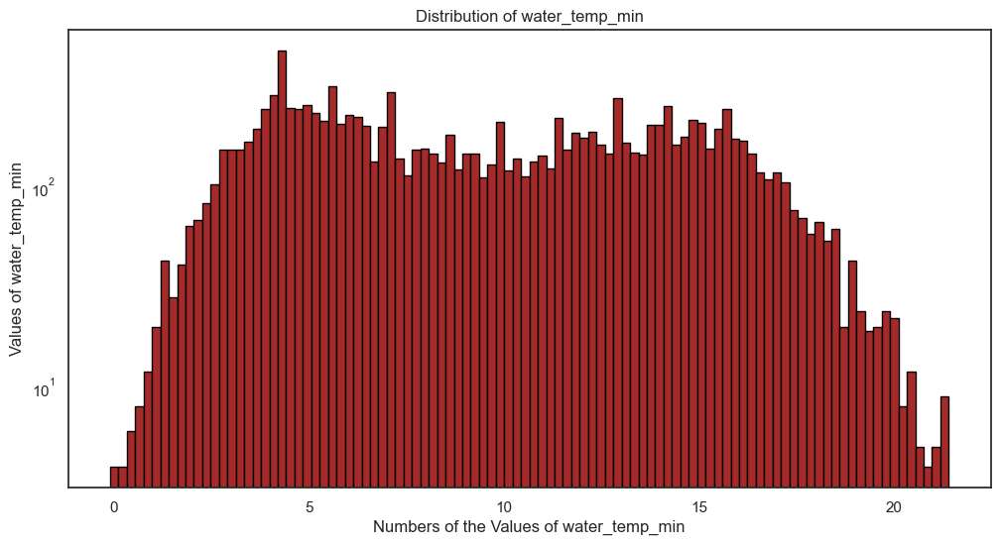

In [87]:
# Plot the distribution of all river variables to decide whether to use the mean or median
for col_name in dict_river_outliers.keys():
    
    plt.figure(figsize=(12,6))
    plt.title(f"Distribution of {col_name}")
    plt.hist(df_river[col_name], bins=100,log=True, edgecolor="black",color='brown')
    plt.xlabel(f"Numbers of the Values of {col_name}")
    plt.ylabel(f"Values of {col_name}")
    plt.show()

<span style="color:#00BFFF;">
    <h3>Distribution Analysis:</h3>
    <p><b>Skewed distributions:</b> Water flow, water level, concentration of suspended solids.</p>
    <p><b>Normally distributed:</b> Water temperature.</p>
    <h3>Conclusion:</h3>
    <p>For skewed variables, the median is a better choice than the mean.</p>
    <p>For normally distributed variables (water temperature), the mean remains a valid option.</p>
</span>

In [88]:
# Get help for diff_medians_outliers function (to understand its parameters)
help(diff_medians_outliers)

Help on function diff_medians_outliers in module Functions_EDA:

diff_medians_outliers(df, col_name, outlier_col)
    Compares the medians of columns with or without outliers.
    Parameters:
    ----------
    df : pd.DataFrame
          The DataFrame containing the data to analyze.
    col_name : str
          The name of the column to investigate.
    outlier_col : str
          The name of the column where outlier flags.
      
    Returns:
    -------
    None
          Prints the medians (with and without outliers) and the percentage difference between them.
    
    Notes:
    -----
    - This function assumes the target column (`col_name`) contains numeric data.
    - The `outlier_col` should flag normal values with 'normal'. Other values are considered outliers.



In [89]:
# Compare the median for skewed distributions
skewed_variables = ['flow_avg', 'flow_max', 'flow_min', 
                    'level_avg', 'level_max', 'level_min', 
                    'concent_solids']

print("Checking median differences for skewed distributions:")
for col in skewed_variables:
    diff_medians_outliers(df_river, col, f"is_outlier_{col}")

Checking median differences for skewed distributions:
flow_avg:
Median:49.7         
Median without outliers:47.5         
The Difference is: 4.43%         
________________
flow_max:
Median:58.45         
Median without outliers:55.8         
The Difference is: 4.53%         
________________
flow_min:
Median:40.7         
Median without outliers:38.9         
The Difference is: 4.42%         
________________
level_avg:
Median:79.0         
Median without outliers:78.0         
The Difference is: 1.27%         
________________
level_max:
Median:87.0         
Median without outliers:85.0         
The Difference is: 2.3%         
________________
level_min:
Median:71.0         
Median without outliers:70.0         
The Difference is: 1.41%         
________________
concent_solids:
Median:11.0         
Median without outliers:10.19         
The Difference is: 7.36%         
________________


In [90]:
# Compare the mean for normally distributed variables (water temperature)
normal_variables = ['water_temp_avg', 'water_temp_max', 'water_temp_min']

print("\nChecking mean differences for normally distributed variables:")
for col in normal_variables:
    diff_means_outliers(df_river, col, f"is_outlier_{col}")


Checking mean differences for normally distributed variables:
water_temp_avg:
Mean:9.967135039195384         
Mean without outliers:9.967135039195384         
The Difference is: 0.0%         
________________
water_temp_max:
Mean:10.278849282650496         
Mean without outliers:10.278849282650496         
The Difference is: 0.0%         
________________
water_temp_min:
Mean:9.661928708770892         
Mean without outliers:9.661928708770892         
The Difference is: 0.0%         
________________


<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <p>The differences in <b>medians</b> (for skewed distributions) and <b>means</b> (for normally distributed variables) are all below 10%.</p>
    <h3>Conclusion:</h3>
    <p>Outliers do not significantly impact the statistical measures. Therefore, there is no need to remove or replace them in the river data.</p>
</span>

<h3 id="outliersweather"> 4.) Outliers in the Weather Data</h3>

In [91]:
# Create a dictionary for the river variables where outliers will be checked

dict_weather_outliers = {col : f"is_outlier_{col}" for col in list_col_weather}
dict_weather_outliers

{'tavg': 'is_outlier_tavg',
 'tmin': 'is_outlier_tmin',
 'tmax': 'is_outlier_tmax',
 'prcp': 'is_outlier_prcp',
 'snow': 'is_outlier_snow',
 'wspd': 'is_outlier_wspd',
 'wpgt': 'is_outlier_wpgt'}

In [92]:
# Create columns for marking outliers and apply the function

for col_name, outlier_col in dict_weather_outliers.items():
    df_weather[outlier_col] = 'normal'
    mark_outliers_IQR(df_weather, col_name, outlier_col, 1.5, True)

tavg:
Lower limit: -14.450000000000003, Upper limit: 34.75
Number of outliers: 5 out of 14236
is_outlier_tavg
normal       14231
suspected        5
Name: count, dtype: int64
_________________________
tmin:
Lower limit: -15.950000000000003, Upper limit: 28.450000000000003
Number of outliers: 13 out of 14236
is_outlier_tmin
normal       14223
suspected       13
Name: count, dtype: int64
_________________________
tmax:
Lower limit: -14.049999999999999, Upper limit: 43.15
Number of outliers: 3 out of 14236
is_outlier_tmax
normal       14233
suspected        3
Name: count, dtype: int64
_________________________
prcp:
Lower limit: -3.9000000000000004, Upper limit: 6.5
Number of outliers: 1814 out of 14236
is_outlier_prcp
normal       12422
suspected     1814
Name: count, dtype: int64
_________________________
snow:
Lower limit: 0.0, Upper limit: 0.0
Number of outliers: 1558 out of 12671
is_outlier_snow
normal       12678
suspected     1558
Name: count, dtype: int64
_________________________


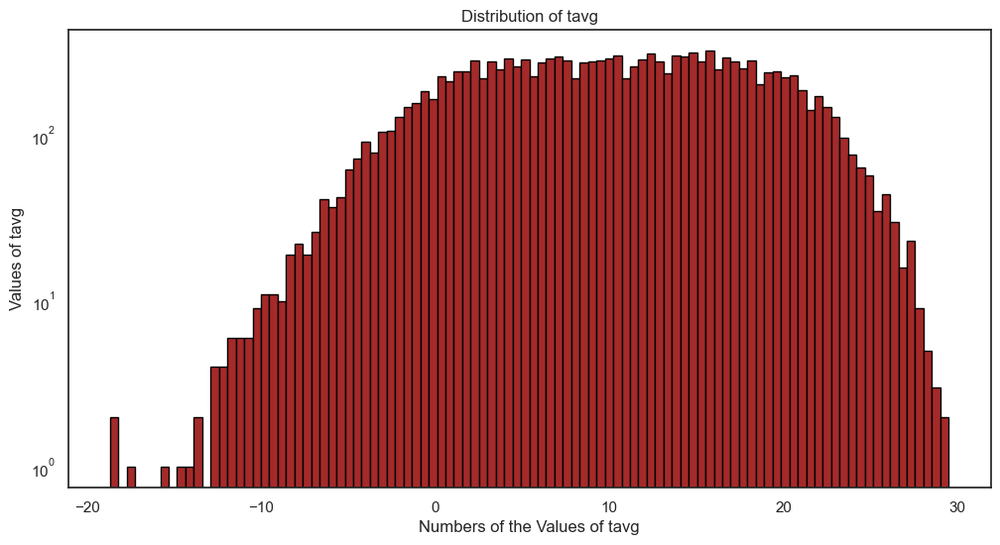

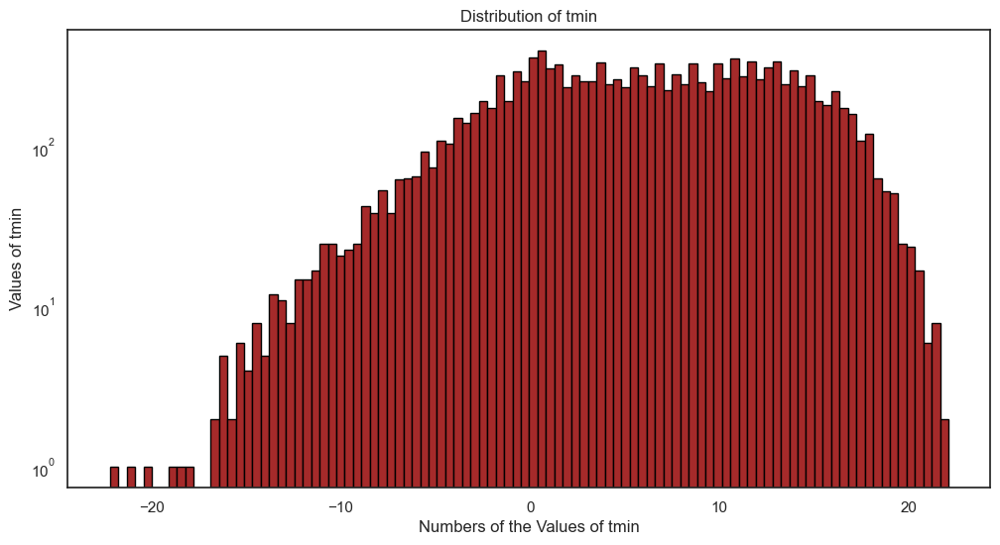

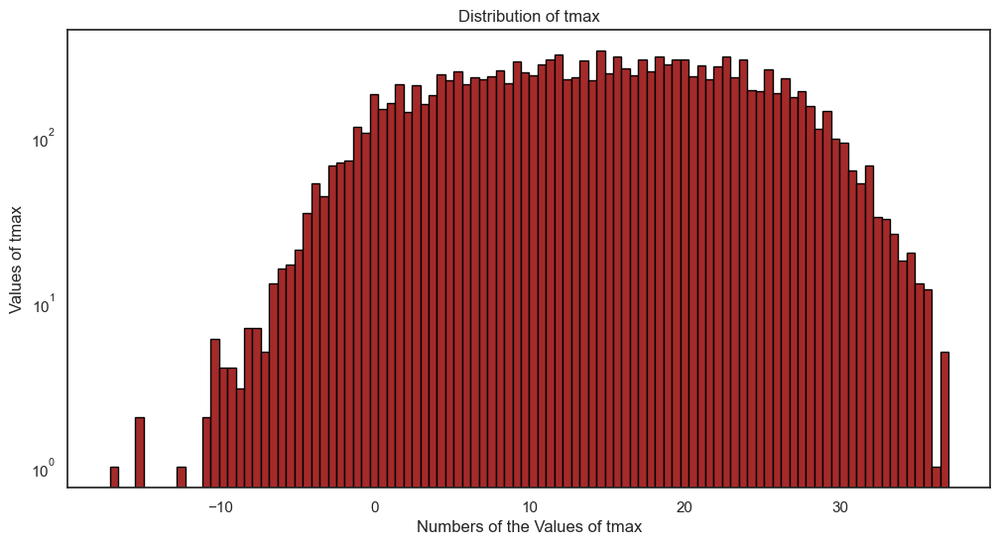

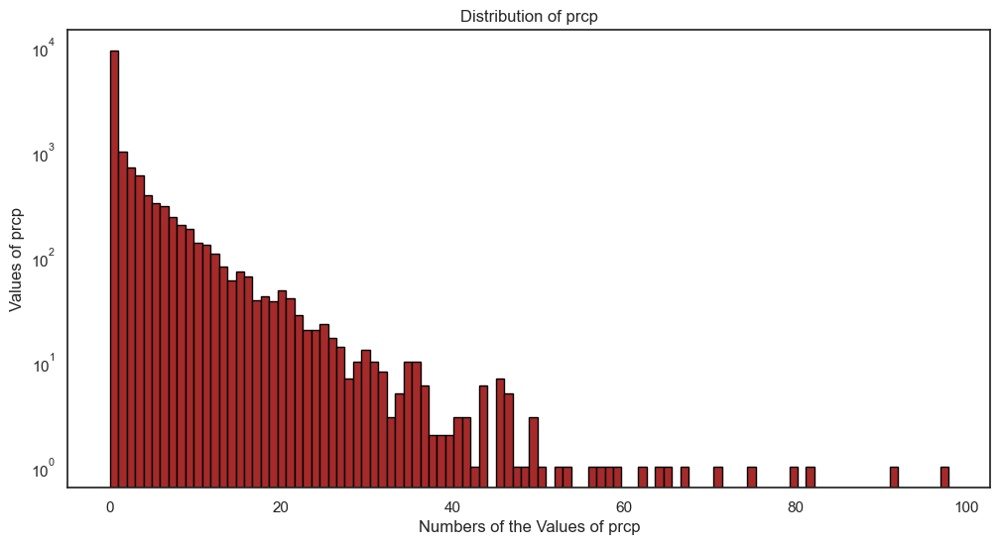

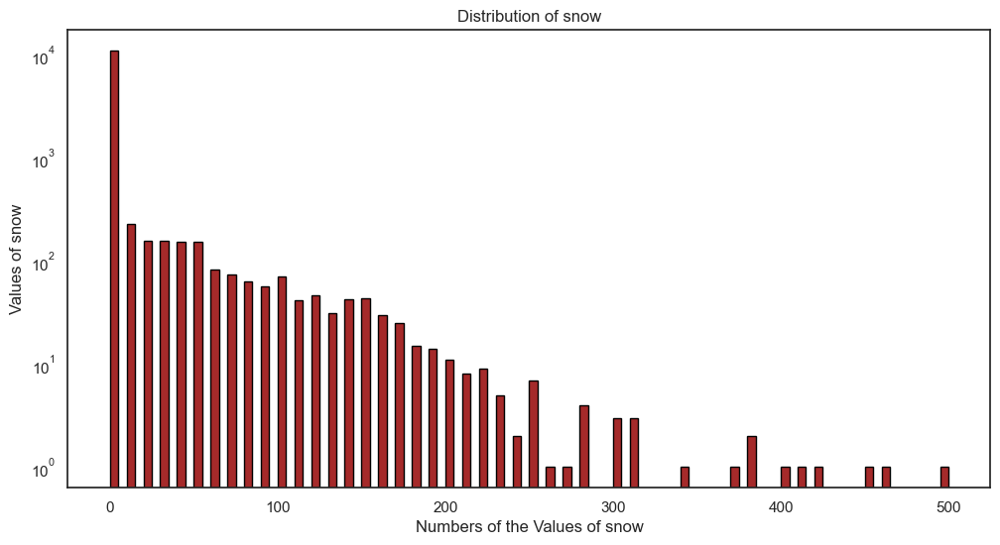

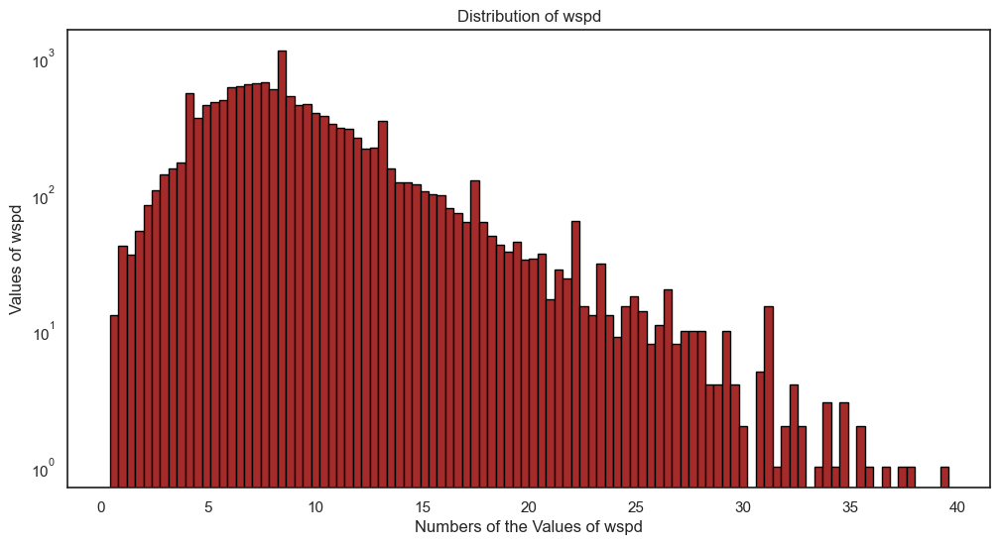

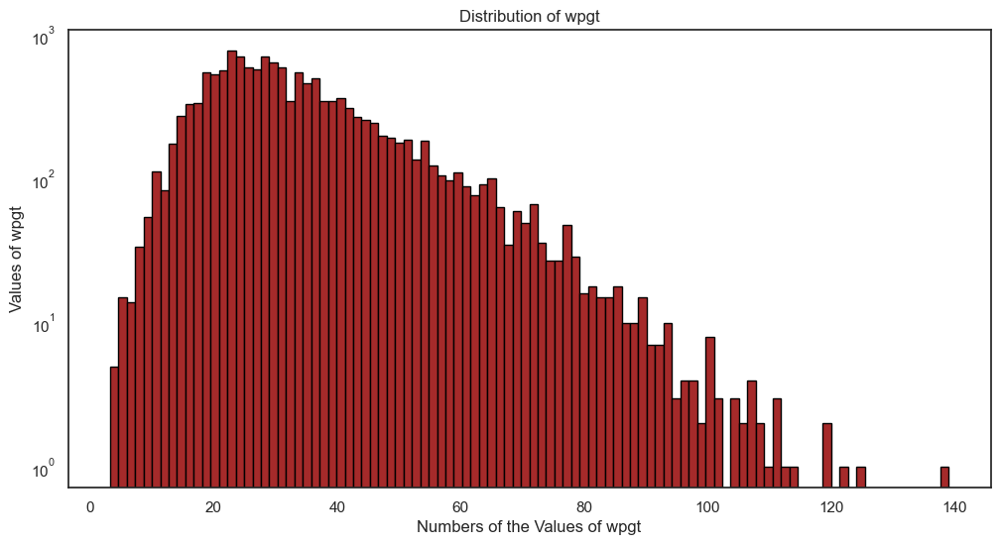

In [93]:
# Plot the distribution of all river variables to decide whether to use the mean or median
for col_name in dict_weather_outliers.keys():
    
    plt.figure(figsize=(12,6))
    plt.title(f"Distribution of {col_name}")
    plt.hist(df_weather[col_name], bins=100,log=True, edgecolor="black",color='brown')
    plt.xlabel(f"Numbers of the Values of {col_name}")
    plt.ylabel(f"Values of {col_name}")
    plt.show()

<span style="color:#00BFFF;">
    <h3>Distribution Analysis:</h3>
     <p><b>Normally distributed:</b> Air temperature.</p>
    <p><b>Skewed distributions:</b> Precipitation, snow depth, wind speed, wind peak gust.</p>
    <h3>Conclusion:</h3>
    <p>For normally distributed variables (water temperature), the mean remains a valid option.</p>
    <p>For skewed variables, the median is a better choice than the mean.</p>
</span>

In [94]:
# Compare the mean for normally distributed variables (water temperature)
normal_variables = ['tavg', 'tmax', 'tmin']

print("\nChecking mean differences for normally distributed variables:")
for col in normal_variables:
    diff_means_outliers(df_weather, col, f"is_outlier_{col}")


Checking mean differences for normally distributed variables:
tavg:
Mean:10.110002809778027         
Mean without outliers:10.11950671070199         
The Difference is: -0.09%         
________________
tmax:
Mean:14.49376931722394         
Mean without outliers:14.500168622215977         
The Difference is: -0.04%         
________________
tmin:
Mean:6.108162405169991         
Mean without outliers:6.1301413203965405         
The Difference is: -0.36%         
________________


In [95]:
# Compare the median for skewed distributions
skewed_variables = ['prcp', 'snow', 'wspd', 'wpgt']

print("Checking median differences for skewed distributions:")
for col in skewed_variables:
    diff_medians_outliers(df_weather, col, f"is_outlier_{col}")

Checking median differences for skewed distributions:
prcp:
Median:0.0         
Median without outliers:0.0         
The Difference is: nan%         
________________
snow:
Median:0.0         
Median without outliers:0.0         
The Difference is: nan%         
________________
wspd:
Median:8.3         
Median without outliers:7.9         
The Difference is: 4.82%         
________________
wpgt:
Median:30.6         
Median without outliers:29.9         
The Difference is: 2.29%         
________________


<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <p>The differences in <b>means</b> for <b>air temperature (average, minimum, and maximum)</b>, 
    and the <b>medians</b> in <b>windspeed and wind peak gust</b> are less than 10%.</p>
    <p>For <b>precipitation and snow depth</b>, the median comparison could not be calculated (NaN result, likely due to division by zero).</p>
    <h3>Conclusion:</h3>
    <p>Outliers in air temperature (avg, min, max), windspeed, and wind peak gust <b>do not need to be replaced</b>.<br>
    Further analysis is required for precipitation and snow depth.</p>
</span>


<h3 id='approachPrcpSnow'>Approach for Precipitation and Snow Depth</h3>

<p>The main challenge is that the median/mean comparison fails due to a high number of zero values.</p>

<h4>Steps:</h4>
<ol>
    <li>Exclude zero values for a meaningful median/mean comparison.</li>
    <li>Recalculate the median and mean.</li>
    <li>Check whether outliers significantly impact statistical values.</li>
</ol>

<p><b>First, precipitation is analyzed, followed by snow depth.</b></p>


<h3 id='prcpOutliers'>3.1 Outliers in Precipitation:</h3>

In [96]:
# Checking the total number of values, zeros, and NaNs

print(f"PRECIPITATION\
      \nTotal numbers of values:\
      \n{df_weather['prcp'].count()}\
      \n_________________________\
      \nZeros:\
      \n{df_weather[df_weather['prcp'] == 0]['prcp'].count()}\
      \n_________________________\
      \nMissing values:\
      \n{df_weather['prcp'].isna().sum()}\
      \n_________________________\
      \nDifference (total - missing values and zeros):\
      \n{df_weather[['prcp']].count() - df_weather[(df_weather['prcp'] == 0) | (df_weather['prcp'].isna())][['prcp']].count()}\
      \n_________________________\
      \nMedian:{df_weather['prcp'].median()}")

PRECIPITATION      
Total numbers of values:      
14236      
_________________________      
Zeros:      
7137      
_________________________      
Missing values:      
0      
_________________________      
Difference (total - missing values and zeros):      
prcp    7099
dtype: int64      
_________________________      
Median:0.0


<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <p>There are <b>7,137 zero values</b> in precipitation out of <b>14,236 total values</b>.</p>
    <p>The median of precipitation is <b>0.0</b>, making direct median/mean comparisons impossible.</p>
    <h3>Conclusion:</h3>
    <p>To analyze outliers, we first exclude zero values.</p>
</span>

In [97]:
# Create a new DataFrame without the zeros
df_prcp_no_zeros = df_weather[df_weather['prcp'] != 0]

In [98]:
# Mark outliers in precipitation data (excluding zeros)
df_weather['is_outlier_prcp'] = 'normal'
mark_outliers_IQR(df_prcp_no_zeros, 'prcp', 'is_outlier_prcp', 1.5, True)

prcp:
Lower limit: -8.3, Upper limit: 15.7
Number of outliers: 522 out of 7099
is_outlier_prcp
normal       6577
suspected     522
Name: count, dtype: int64
_________________________


In [99]:
# Compare the medians with and without outliers
diff_medians_outliers(df_prcp_no_zeros, 'prcp', 'is_outlier_prcp')

prcp:
Median:2.6         
Median without outliers:2.3         
The Difference is: 11.54%         
________________


In [100]:
# Calculate absolute difference
absolute_diff = df_prcp_no_zeros['prcp'].median() - df_prcp_no_zeros[df_prcp_no_zeros['is_outlier_prcp'] != 'suspected']['prcp'].median()
print(f"Absolute difference in median: {absolute_diff:.2f} mm")

Absolute difference in median: 0.30 mm


In [101]:
# Check full statistics for precipitation (without zeros)
df_prcp_no_zeros['prcp'].describe()

count    7099.000000
mean        5.204705
std         7.326174
min         0.100000
25%         0.700000
50%         2.600000
75%         6.700000
max        97.900000
Name: prcp, dtype: float64

<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <p>There are <b>7,137 zero values</b> in precipitation out of <b>14,236 total values</b>.</p>
    <p>After excluding zero values, <b>522 outliers</b> remain.</p>
    <p>The difference in median (with and without outliers) is <b>0.3 mm</b>, which is very small.</p>
    <h3>Statistical Overview:</h3>
    <ul>
        <li><b>Mean:</b> 5.20 mm</li>
        <li><b>Standard deviation:</b> 7.33 mm</li>
        <li><b>Minimum:</b> 0.1 mm</li>
        <li><b>25%-Quantile:</b> 0.7 mm</li>
        <li><b>Median:</b> 2.6 mm</li>
        <li><b>75%-Quantile:</b> 6.7 mm</li>
        <li><b>Maximum:</b> 97.9 mm</li>
    </ul>
    <h3>Conclusion:</h3>
    <p>The outliers do not significantly impact the statistical values.<br>
    The absolute median difference is only 0.3 mm, which is just <b>0.3% of the maximum precipitation</b> (97.9 mm) and <b>5.8% of the mean</b> (5.20 mm).<br>
    Given the standard deviation (7.33 mm), this difference is statistically irrelevant.</p>  
    <p><b>Final Decision:</b> Outliers in precipitation <b>do not need to be removed or replaced.</b></p>
</span>

<h3>

<h3 id='snowOutliers'>Outliers in Snow Depth:</h3>

## Outline

<a href="#step1"><h2> I.) Describing The Topic And General Questions</h2></a>
<a href="#step2"><h2> II.) Data Selection</h2></a>
<a href="#step3"><h2> III.) Data Merging Process</h2></a>
<a href="#datacleaning"><h2> IV.) Data Cleaning</h2></a>

<a href="#outliers"><h3>A.) Handling Outliers</h3></a>
<a href="#approach"><h4>1.) Approach: How Outliers Are Detected</h4></a>
<a href="#outliersriver"><h4>2.) Outliers in the River Data</h4></a>
<a href="#outliersweather"><h4>3.) Outliers in the Weather Data</h4></a>
<a href="#prcpOutliers"><h4>→ 3.1 Outliers in Precipitation</h4></a>
<a href="#snowOutliers"><h4>→ 3.2 Outliers in Snow Depth</h4></a>

<a href="#duplicates"><h3>B.) Removing Duplicates</h3></a>
<a href="#nans"><h3>C.) Handling NaNs</h3></a>

<a href="#calcdays"><h2>V.) Calculating the Days for Swimming and Taking an Ice Bath</h2></a>

<h3 id='snowOutliers'>3.2 Outliers in Snow Depth:</h3>

In [102]:
# Checking the total number of values, zeros, and NaNs

print(f"PRECIPITATION\
      \nTotal numbers of values:\
      \n{df_weather['snow'].count()}\
      \n_________________________\
      \nZeros:\
      \n{df_weather[df_weather['snow'] == 0]['snow'].count()}\
      \n_________________________\
      \nMissing values:\
      \n{df_weather['snow'].isna().sum()}\
      \n_________________________\
      \nDifference (total - missing values and zeros):\
      \n{df_weather[['snow']].count() - df_weather[(df_weather['prcp'] == 0) | (df_weather['snow'].isna())][['snow']].count()}\
      \n_________________________\
      \nMedian:{df_weather['snow'].median()}")

PRECIPITATION      
Total numbers of values:      
12671      
_________________________      
Zeros:      
11113      
_________________________      
Missing values:      
1565      
_________________________      
Difference (total - missing values and zeros):      
snow    6355
dtype: int64      
_________________________      
Median:0.0


<span style='color:#00BFFF;'>
    <h3>Results:</h3>
    <p>There are <b>11,113 zero values</b> in precipitation out of <b>12,671 total values</b>.</p>
    <p>The median of snow depth is <b>0.0</b>, making direct median/mean comparisons impossible.</p>
    <h3>Conclusion:</h3>
    <p>To analyze outliers, we first exclude zero values.</p>
</span>

In [103]:
# Create a new DataFrame without the zeros
df_snow_no_zeros = df_weather[df_weather['snow'] != 0]

In [104]:
# Mark outliers in precipitation data (excluding zeros)
df_weather['is_outlier_snow'] = 'normal'
mark_outliers_IQR(df_snow_no_zeros, 'snow', 'is_outlier_snow', 1.5, True)

snow:
Lower limit: -75.0, Upper limit: 205.0
Number of outliers: 53 out of 1558
is_outlier_snow
normal       3070
suspected      53
Name: count, dtype: int64
_________________________


In [105]:
# Compare the medians with and without outliers
diff_medians_outliers(df_snow_no_zeros, 'snow', 'is_outlier_snow')

snow:
Median:50.0         
Median without outliers:50.0         
The Difference is: 0.0%         
________________


In [106]:
# Calculate absolute median difference
absolute_diff = df_snow_no_zeros['snow'].median() - df_snow_no_zeros[df_snow_no_zeros['is_outlier_snow'] != 'suspected']['snow'].median()
print(f"Absolute difference in median: {absolute_diff:.2f} cm")

Absolute difference in median: 0.00 cm


<span style='color:#00BFFF;'>
    <h3>Result:</h3>
    <p>Although the difference between the medians with and without outliers in snow (excluded zeros) is less than 10%, it is exactly 0.0%, because the medians of the values with and without outliers are equal (50.0 cm).<br>
    To reassure that there isn't any mistakes in the data or previous calculations, further analyses are required.<p>
    <h3>Next steps:</h3>
    <ol>
        <li>Check oft the statistical values of snow depth without 0s with and without outliers.</li>
        <li>Count the number of values smaller than 50.0 cm.</li>
        <li>Show the number of different values smaller than 50.0 cm.</li>
        <li>Decide based on the results, if it needs more analysis</li>
    </ol>

In [107]:
# Look into the statistical values of snow without 0s and with outliers
df_snow_no_zeros['snow'].describe()

count    1558.000000
mean       70.468549
std        62.901162
min        10.000000
25%        30.000000
50%        50.000000
75%       100.000000
max       500.000000
Name: snow, dtype: float64

In [108]:
# Count numbers of values under 50.0 cm in snow without 0s and with outliers
df_snow_no_zeros[df_snow_no_zeros['snow']<= 50]['snow'].count()

854

In [109]:
# Look into the statistical values of snow without 0s and without outliers
df_snow_no_zeros[df_snow_no_zeros['is_outlier_snow'] != 'suspected']['snow'].describe()

count    1505.000000
mean       63.229236
std        48.599440
min        10.000000
25%        20.000000
50%        50.000000
75%        90.000000
max       200.000000
Name: snow, dtype: float64

In [113]:
# Count numbers of values under 50.0 cm in snow without 0s and with outliers
df_snow_no_zeros[df_snow_no_zeros['snow']<= 50]['snow'].count()

854

In [114]:
# Count numbers of values under 50.0 cm in snow without 0s and without outliers
df_snow_no_zeros[(df_snow_no_zeros['is_outlier_snow'] != 'suspected') &\
                (df_snow_no_zeros['snow']<= 50)]['snow'].count()

854

In [ ]:
# Look into the values of snow without 0s and without outliers
df_snow_no_zeros[df_snow_no_zeros['is_outlier_snow'] != 'suspected']['snow'].value_counts().head(10)

snow
10.0     228
20.0     158
30.0     157
40.0     156
50.0     155
60.0      83
70.0      75
100.0     71
80.0      63
90.0      57
Name: count, dtype: int64

In [115]:
# Look into the values of snow without 0s and without outliers
df_snow_no_zeros['snow'].value_counts().head(10)

snow
10.0     228
20.0     158
30.0     157
40.0     156
50.0     155
60.0      83
70.0      75
100.0     71
80.0      63
90.0      57
Name: count, dtype: int64

<span style='color:#00BFFF;'>
    <h3>Results: Outlier Analysis for Snow Depth</h3>
    <h4>1. Impact of Outliers on Values Below 50 cm</h4>
    <ul>
        <li><b>With Outliers:</b> 854 values below 50 cm</li>
        <li><b>Without Outliers:</b> 854 values below 50 cm</li>
    </ul>
    <p>The removal of outliers had no effect on values below 50 cm.</p>
    <ul>
        <li><b>With Outliers:</b> 704 values ≥ 50 cm</li>
        <li><b>Without Outliers:</b> 651 values ≥ 50 cm</li>
    </ul>
    <p>➡ The difference of 53 values corresponds exactly to the number of removed outliers, confirming that all removed values were above 50 cm.</p>
    <h4>2️. Stability of the Median</h4>
    <ul>
        <li>The median remains at <b>50.0 cm</b> with and without outliers.</li>
        <li>The fact that the median does not change, despite removing 53 extreme values, indicates:</li>
        <ul>
            <li>Most values are clustered around 50 cm.</li>
            <li>A large portion of the dataset lies between 30 and 100 cm, keeping the median stable.</li>
        </ul>
    </ul>
    <h3>Conclusion</h3>
    <ul>
        <li>The removed outliers exclusively affected values above 50 cm.</li>
        <li>The distribution below 50 cm remains unchanged.</li>
        <li>The median of <b>50.0 cm</b> is accurate and representative of the dataset.</li>
        <li><b>No replacement of outliers is needed for snow depth.</b></li>
    </ul>
</span>

In [ ]:
df_snow_no_zeros[(df_snow_no_zeros['is_outlier_snow'] == 'suspected')]['snow'].value_counts()

snow
220.0    9
210.0    8
250.0    7
230.0    5
280.0    4
310.0    3
300.0    3
240.0    2
380.0    2
450.0    1
420.0    1
410.0    1
400.0    1
340.0    1
460.0    1
500.0    1
270.0    1
260.0    1
370.0    1
Name: count, dtype: int64

In [126]:
df_snow_no_zeros[(df_snow_no_zeros['is_outlier_snow'] == 'suspected')]['snow'].value_counts()

snow
220.0    9
210.0    8
250.0    7
230.0    5
280.0    4
310.0    3
300.0    3
240.0    2
380.0    2
450.0    1
420.0    1
410.0    1
400.0    1
340.0    1
460.0    1
500.0    1
270.0    1
260.0    1
370.0    1
Name: count, dtype: int64

<h2 id=duplicates>B.) Removing Duplicates</h2>

<h3>Approach:</h3>

<p>I will take a look into the single DataFrames of the river, becauses if I would take the merged DataFrame, because it would be mixed up (with all the data of the other river data.
To check if there are any, I will write a function that prints the differences between the DataFrames before and after dropping.</p>

In [80]:
# Creating a functions for droppimg and checking the duplicates of all DataFrames 

def dropping_dupllicates_list(dict_dataframes_names):
    for name, df in dict_dataframes_names.items():
        
        print("\Differences in the dataframes before and after dropping duplicates: ",
              "\n", name,
              "\Differences in Data: ", 
              "\n", (df.count()-df.drop_duplicates().count()),
              "\n---------------------------------")

In [81]:
# creating a dictionary with all DataFrames and their names for the loop
dataframes_names = {'water level' : df_water_level, 
                    'flow rate' : df_flow_rate,
                    'water temperature' : df_water_temperature,
                    'concentration of suspended solids' : df_concent_solids,
                    'weather' : df_weather}
dropping_dupllicates_list(dataframes_names)

\Differences in the dataframes before and after dropping duplicates:  
 water level \Differences in Data:  
 date         0
level_avg    0
level_max    0
level_min    0
dtype: int64 
---------------------------------
\Differences in the dataframes before and after dropping duplicates:  
 flow rate \Differences in Data:  
 date        0
flow_avg    0
flow_max    0
flow_min    0
dtype: int64 
---------------------------------
\Differences in the dataframes before and after dropping duplicates:  
 water temperature \Differences in Data:  
 date              0
water_temp_avg    0
water_temp_max    0
water_temp_min    0
dtype: int64 
---------------------------------
\Differences in the dataframes before and after dropping duplicates:  
 concentration of suspended solids \Differences in Data:  
 date              0
concent_solids    0
dtype: int64 
---------------------------------
\Differences in the dataframes before and after dropping duplicates:  
 weather \Differences in Data:  
 date 

<span style='color:violet'><b>Result:</b><br>
There are no duplicates.<br>
<b>NOTE:</b> Question for Sofía (see also ticket in clickup): Now I am lucky that there aren't no duplicates. If so, I would have needed to update the merged DataFrame.<b>
I think, the order of my steps is not right!?!</span>

<h2 id="nans">B.) Handling Missing Values</h2>
<h3 id="nansapproach">1. Approach:</h3>

<ol>
    <li>Merge river and weather data into a single dataset, making sure the timestamps match and the data lines up correctly.</li>
    <li>Verify that the DataFrame is complete and no day is missing, as each row represents a single day.</li>
    <li>Analyze missing values for each variable to detect patterns and periods with higher NaN occurrences.</li>
    <li>Choose the most suitable imputation method for each variable to maintain data integrity.</li>
    <li>Validate the imputed values by comparing trends before and after filling to detect potential biases or distortions.</li>
</ol>

### Initial Check: Identifying Missing Values and Data Structure

<p>Before merging, I check the structure of both DataFrames to ensure:</p>

<ul>
    <li>All expected columns are present.</li>
    <li>The correct data types are used.</li>
    <li>The number of missing values per column.</li>
</ul>

```python
df_river.info()
df_weather.info()

In [82]:
df_river.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14244 entries, 9558 to 23801
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       14244 non-null  datetime64[ns]
 1   flow_avg                   14244 non-null  float64       
 2   flow_max                   14244 non-null  float64       
 3   flow_min                   14244 non-null  float64       
 4   level_avg                  14244 non-null  float64       
 5   level_max                  14244 non-null  float64       
 6   level_min                  14244 non-null  float64       
 7   concent_solids             14014 non-null  float64       
 8   water_temp_avg             13522 non-null  float64       
 9   water_temp_max             13522 non-null  float64       
 10  water_temp_min             13522 non-null  float64       
 11  year                       14244 non-null  int32         
 12  month 

In [83]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14236 entries, 0 to 14235
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   date                14236 non-null  datetime64[ns]
 1   tavg                14236 non-null  float64       
 2   tmin                14236 non-null  float64       
 3   tmax                14236 non-null  float64       
 4   prcp                14236 non-null  float64       
 5   snow                12671 non-null  float64       
 6   wspd                14167 non-null  float64       
 7   wpgt                14152 non-null  float64       
 8   year                14236 non-null  int32         
 9   month               14236 non-null  int32         
 10  is_outlier_tavg     14236 non-null  object        
 11  is_outlier_tmin     14236 non-null  object        
 12  is_outlier_tmax     14236 non-null  object        
 13  is_outlier_snow     14236 non-null  object    

<h3 id="nansmerge">2. Merging River and Weather Data</h3>

<p>To ensure a complete dataset, the river and weather data are merged using an <strong>outer join</strong>.  
This approach keeps all available data from both sources, even if some dates are missing in one of the DataFrames.</p>

<p>Since each row represents a single day, it is crucial that timestamps match correctly.  
Any missing dates will be addressed in the next step.</p>

<p>Some columns exist in both datasets, so suffixes <code>_river</code> and <code>_weather</code>  
are added to differentiate them. Any redundant columns will be removed later.</p>

In [84]:
# Merging the river and weather data using an outer join
df_river_weather = pd.merge(df_river, df_weather, how='outer', on='date', suffixes=('_river', '_weather'))

In [85]:
# Checking, if the merged DataFrame is complete:
df_river_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14244 entries, 0 to 14243
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       14244 non-null  datetime64[ns]
 1   flow_avg                   14244 non-null  float64       
 2   flow_max                   14244 non-null  float64       
 3   flow_min                   14244 non-null  float64       
 4   level_avg                  14244 non-null  float64       
 5   level_max                  14244 non-null  float64       
 6   level_min                  14244 non-null  float64       
 7   concent_solids             14014 non-null  float64       
 8   water_temp_avg             13522 non-null  float64       
 9   water_temp_max             13522 non-null  float64       
 10  water_temp_min             13522 non-null  float64       
 11  year_river                 14244 non-null  int32         
 12  mont

In [86]:
# Dropping redundant columns:
redundant_cols = ['year_weather', 'month_weather']
df_river_weather = df_river_weather.drop(columns=redundant_cols)

# Checking the DataFrame after dropping the columns
df_river_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14244 entries, 0 to 14243
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       14244 non-null  datetime64[ns]
 1   flow_avg                   14244 non-null  float64       
 2   flow_max                   14244 non-null  float64       
 3   flow_min                   14244 non-null  float64       
 4   level_avg                  14244 non-null  float64       
 5   level_max                  14244 non-null  float64       
 6   level_min                  14244 non-null  float64       
 7   concent_solids             14014 non-null  float64       
 8   water_temp_avg             13522 non-null  float64       
 9   water_temp_max             13522 non-null  float64       
 10  water_temp_min             13522 non-null  float64       
 11  year_river                 14244 non-null  int32         
 12  mont

In [87]:
# renaming 'year_river' and 'month_river' for consistency
df_river_weather = df_river_weather.rename(columns=
                        {'year_river' : 'year',
                         'month_river' : 'month'})

# Final check of the cleaned DataFrame structure
df_river_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14244 entries, 0 to 14243
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       14244 non-null  datetime64[ns]
 1   flow_avg                   14244 non-null  float64       
 2   flow_max                   14244 non-null  float64       
 3   flow_min                   14244 non-null  float64       
 4   level_avg                  14244 non-null  float64       
 5   level_max                  14244 non-null  float64       
 6   level_min                  14244 non-null  float64       
 7   concent_solids             14014 non-null  float64       
 8   water_temp_avg             13522 non-null  float64       
 9   water_temp_max             13522 non-null  float64       
 10  water_temp_min             13522 non-null  float64       
 11  year                       14244 non-null  int32         
 12  mont

<h3 id="checkcomplete">3. Checking DataFrame Completeness</h3>
<p>Before analyzing missing values, I verify that the dataset covers the entire timeframe (1985-2023) with no missing days.</p> 
<ol>
    <h4>Steps:</h4>
    <ol>
    <li>Generate a complete <code>DatetimeIndex</code> from January 1, 1985, to December 31, 2023.</li>
    <li>Convert both the expected date range and the DataFrame's <code>'date'</code> column into sets.</li>
    <li>Compare these sets to detect any missing dates.</li>
    <li>Check for duplicate entries in the <code>'date'</code> column.</li>
</ol>

In [88]:
# Creating a DatetimeIndex for the expected timeframe
pd.date_range(start='1985-01-01', end='2023-12-31', freq='D')

DatetimeIndex(['1985-01-01', '1985-01-02', '1985-01-03', '1985-01-04',
               '1985-01-05', '1985-01-06', '1985-01-07', '1985-01-08',
               '1985-01-09', '1985-01-10',
               ...
               '2023-12-22', '2023-12-23', '2023-12-24', '2023-12-25',
               '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29',
               '2023-12-30', '2023-12-31'],
              dtype='datetime64[ns]', length=14244, freq='D')

In [89]:
# Create a complete DatetimeIndex for the expected timeframe
set_dateTimeIndex = set(pd.date_range(start='1985-01-01', end='2023-12-31', freq='D'))

# Convert the existing 'date' column to a set
set_date_river_weather = set(df_river_weather['date'])

# Identify missing days by calculating the difference between the sets
missing_days = set_dateTimeIndex - set_date_river_weather

# Display the missing dates (if any)
missing_days

set()

In [90]:
# Check for duplicate date entries
df_river_weather[df_river_weather['date'].duplicated()]

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,...,wpgt,is_outlier_tavg,is_outlier_tmin,is_outlier_tmax,is_outlier_snow,is_outlier_wspd,is_outlier_wpgt,is_outlier_prcp,prcp_original,prcp_filled_status


<span style="color:##00BFFF;">
    <b>Result:</b><br>
    ✅ The <code>missing_days</code> set is empty, meaning that no dates are missing in the timeframe (1985–2023).<br>
    ✅ Additionally, no duplicate entries were found in the <code>'date'</code> column.<br><br>
    <b>Conclusion:</b> The DataFrame <code>df_river_weather</code> provides a complete and unique daily record for the given timeframe.<br><br>
    <b>Next step:</b> Analyze the distribution of NaN values to determine the most appropriate imputation methods.
</span>


<h3 id="nansanalysis">4. Analyze the Missing Values in Each Variable</h3> 

In [91]:
# Checking the numbers of NaNs in each variable:
df_river_weather.isna().sum()

date                             0
flow_avg                         0
flow_max                         0
flow_min                         0
level_avg                        0
level_max                        0
level_min                        0
concent_solids                 230
water_temp_avg                 722
water_temp_max                 722
water_temp_min                 722
year                             0
month                            0
is_outlier_flow_avg              0
is_outlier_flow_max              0
is_outlier_flow_min              0
is_outlier_level_avg             0
is_outlier_level_max             0
is_outlier_level_min             0
is_outlier_concent_solids        0
tavg                             8
tmin                             8
tmax                             8
prcp                             8
snow                          1573
wspd                            77
wpgt                            92
is_outlier_tavg                  8
is_outlier_tmin     

<span style="color:#00BFFF;">
    <b>Result:</b><br>
    <h3>No missing values in:</h3>
    <ol>
        <li>Water flow (all variables)</li>
        <li>Water level (all variables)</li>
    </ol>
    <h3>Missing values found in:</h3>
    <ul>
        <li><code>concent_solids:</code> 230</li>
        <li><code>water_temp_avg:</code> 722</li>
        <li><code>water_temp_max:</code> 722</li>
        <li><code>water_temp_min:</code> 722</li>
        <li><code>tavg:</code> 8</li>
        <li><code>tmin:</code> 8</li>
        <li><code>tmax:</code> 8</li>
        <li><code>snow:</code> 1573</li>
        <li><code>wspd:</code> 77</li>
        <li><code>wpgt:</code> 92</li>
    </ul>

<h3>Next Steps:</h3>
<ol>
    <li>Prioritize: <b>snow</b>, then <b>water temperature</b>, <b>concent_solids</b>, <b>wind speed</b>, and <b>precipitation & air temperature</b>.</li>
    <li>Analyze seasonal patterns of missing values.</li>
</ol>


<p>In the column <code>snow</code> there need to be a special handling, because like I already discoverd in the section of Handling outliers there is a mix between NaNs and '0'. Especially in summer months, when there isn't any snow in Munich.<br>
Following steps are made with the column <code>'snow'</code>.</p>
    <ol>
        <li>Looking into the all over sum of the snow depth to identify, when there is absolutely now snow in Munich</li>
        <li>Checking if there are zeros in summertime</li>
        <li>Checking if there are NaNs in summertime</li>
        <li>Deciding what to do with missing values in summertime, if they should be filled in with zeros or be ignored (defining masks e.g. in analyses)</li>
    </ol>

### Step 1: Investigating the Seasonal Pattern of Snow Depth

In [92]:
# Checking the total sum of snow depth per month
snow_per_month = df_river_weather.groupby(df_river_weather['month'])['snow'].sum()
snow_per_month

month
1     31670.0
2     33180.0
3     15480.0
4      1170.0
5         0.0
6         0.0
7         0.0
8         0.0
9         0.0
10      160.0
11     8670.0
12    19460.0
Name: snow, dtype: float64

In [93]:
# Checking the number of NaNs in 'snow' per month
df_river_weather['snow'].isna().groupby(df_river_weather['month']).sum()

month
1       7
2      28
3      31
4      31
5     279
6     276
7     279
8     279
9     244
10     54
11     30
12     35
Name: snow, dtype: int64

In [94]:
# Checking, if there are zeros in the summer months
df_river_weather[df_river_weather['snow'] == 0].groupby(df_river_weather['month'])['snow'].count()

month
1      710
2      672
3      998
4     1107
5      930
6      894
7      930
8      930
9      926
10    1151
11    1008
12     857
Name: snow, dtype: int64

<span style="color:#00BFFF;">
    <b>Result:</b> - A mix of <b>NaNs and zeros</b> exists in the <code>snow</code> column.<br>
    - During summer months <b>(May to September)</b>, snow is <b>absent</b>.<br><br>
    <b>Next steps:</b>
    <ol>
        <li>Replace NaNs in the <code>snow</code> column with 0 for the months <b>May to September</b>.</li>
        <li>Analyze patterns the pattern of remaining NaNs.</li>
    </ol>
</span>

### Step 2: Replacing NaNs in Summer (May to September) with Zero

In [95]:
# creating a condition for NaNs in snow during summer (May to September)
cond_snow_summer = (df_river_weather['snow'].isna()) & (df_river_weather['month'] >= 5) & (df_river_weather['month'] <= 9)

# Checking how many values match the condition
df_river_weather[cond_snow_summer][['snow', 'month']].groupby(df_river_weather['month']).count()

,snow,month
month,,
5,0,279
6,0,276
7,0,279
8,0,279
9,0,244


In [96]:
# Replacing the NaNs with 0
df_river_weather.loc[cond_snow_summer, 'snow'] = 0

In [97]:
# Verifying that all NaNs in summer have been replaced
df_river_weather['snow'].isna().groupby(df_river_weather['month']).sum()

month
1      7
2     28
3     31
4     31
5      0
6      0
7      0
8      0
9      0
10    54
11    30
12    35
Name: snow, dtype: int64

<span style='color:#00BFFF;'>
    <b>Result:</b><br>
    - All Nans in <b>summer (May to September)</b> are now replaced.<br><br>
    <b>Next steps:</b><br>
    - Analyze the the remaining missing values across all variables.
</span>

After analyzing the specific requirements for the snow depth variable, the missing values of the remaining variables need to be handled.<br>
<ol>
    <li>Investigating the remaining missing values</li>
    <li>Identifying patterns by plotting heatmaps that show the numer of NaNs per months</li>
    <li>Deciding how to fill them in</li>
    <li>Filling them in</li>
</ol>

### Step 1: Investigating Missing Values
Before handling NaN values, let's check how many are present in each column.

In [98]:
# Count missing values per column
df_river_weather.isna().sum()

date                             0
flow_avg                         0
flow_max                         0
flow_min                         0
level_avg                        0
level_max                        0
level_min                        0
concent_solids                 230
water_temp_avg                 722
water_temp_max                 722
water_temp_min                 722
year                             0
month                            0
is_outlier_flow_avg              0
is_outlier_flow_max              0
is_outlier_flow_min              0
is_outlier_level_avg             0
is_outlier_level_max             0
is_outlier_level_min             0
is_outlier_concent_solids        0
tavg                             8
tmin                             8
tmax                             8
prcp                             8
snow                           216
wspd                            77
wpgt                            92
is_outlier_tavg                  8
is_outlier_tmin     

### Step 2: Visualizing NaN Distribution with Heatmaps
To understand patterns in missing values, we plot heatmaps per variable.

In [99]:
# List of variables with missing values (NaNs)
list_nans = [col for col in df_river_weather.columns if df_river_weather[col].isna().any()\
                and not col.startswith("is_outlier")\
                and not col.startswith("prcp")]
list_nans

['concent_solids',
 'water_temp_avg',
 'water_temp_max',
 'water_temp_min',
 'tavg',
 'tmin',
 'tmax',
 'snow',
 'wspd',
 'wpgt']

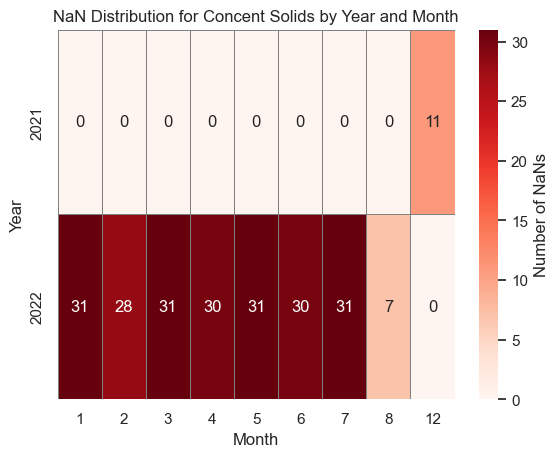

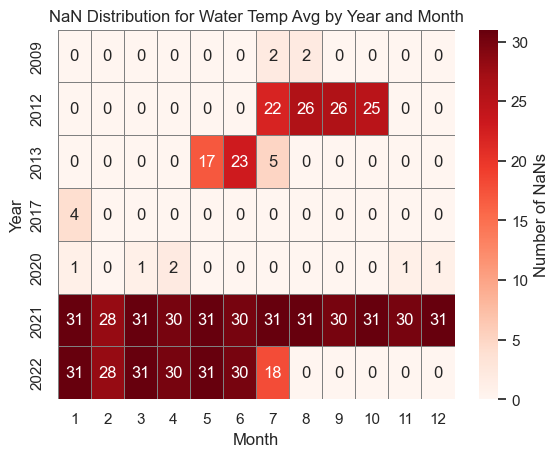

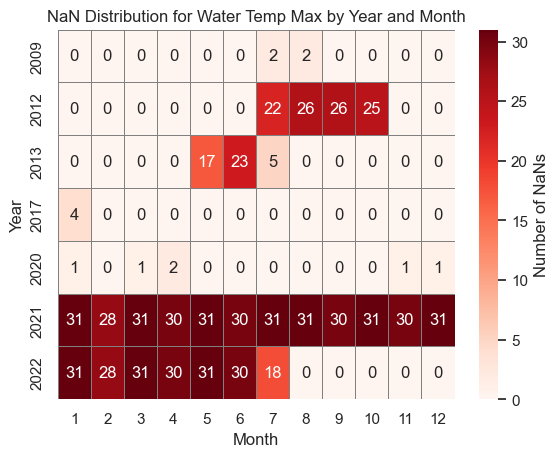

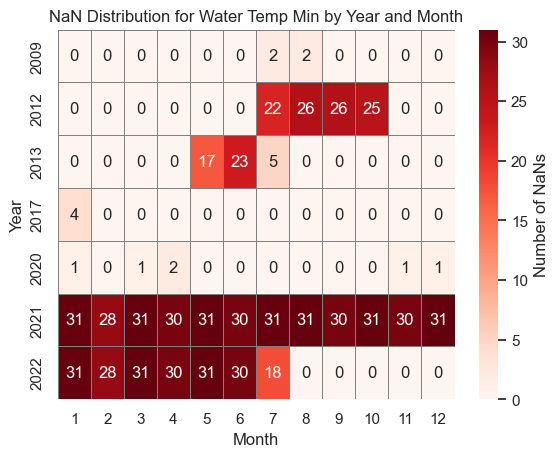

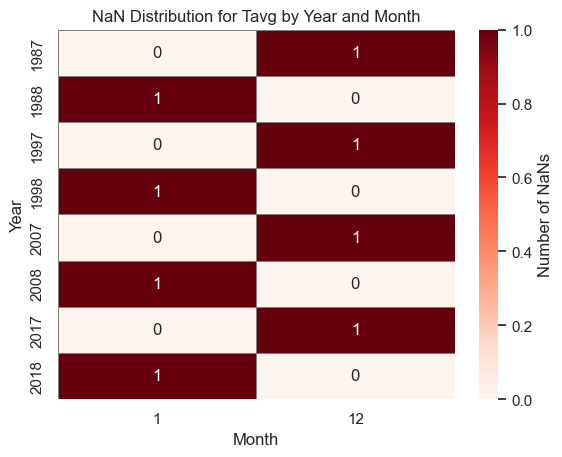

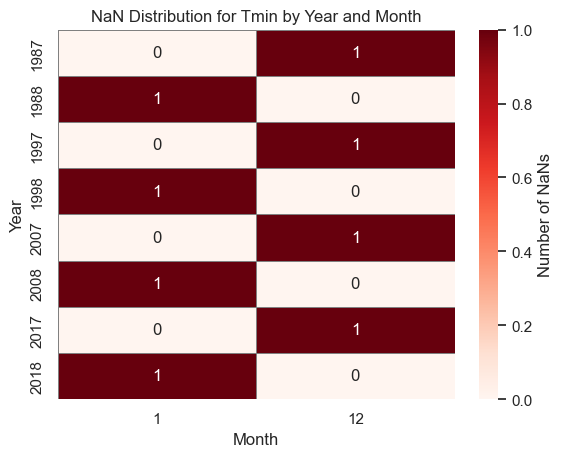

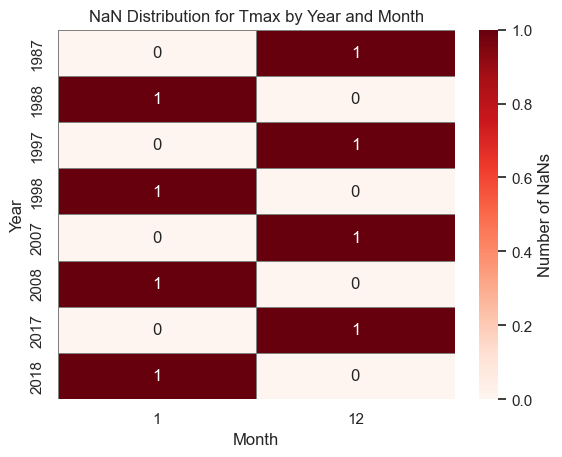

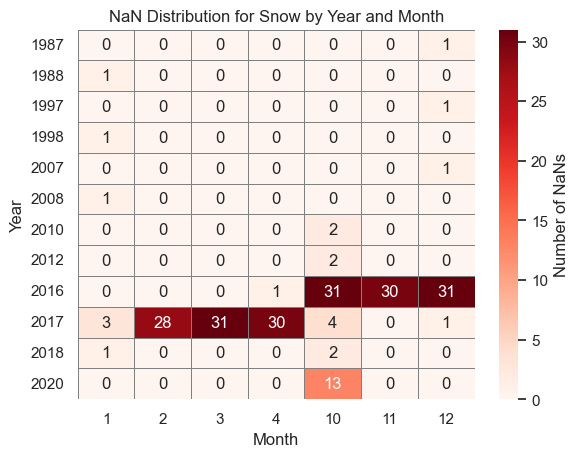

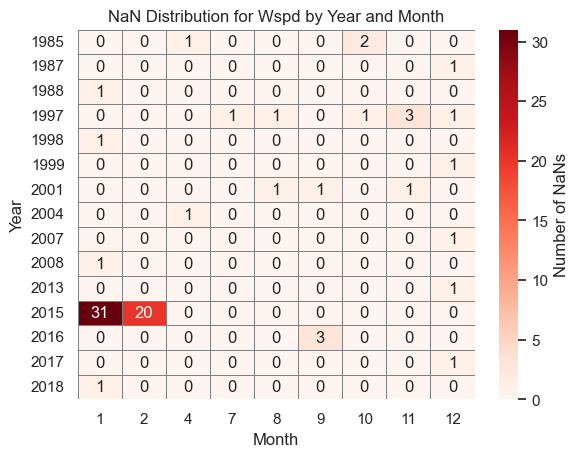

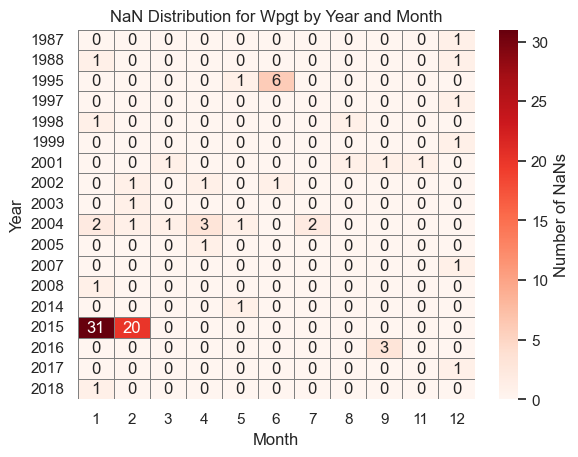

In [ ]:
# Plot heatmaps for each variable in list_nans to visualize missing values across time

for col in list_nans:
    # Count NaNs per year and month
    nan_per_month_year = df_river_weather[df_river_weather[col].isna()].groupby(['year', 'month']).size().unstack(fill_value=0)

    # Create heatmap
    sns.heatmap(nan_per_month_year, cmap='Reds', annot=True, fmt='d', linewidths=0.5, linecolor='gray', cbar_kws={'label': 'Number of NaNs'})
    
    # Title & Labels
    plt.title(f"NaN Distribution for {col.replace('_', ' ').title()} by Year and Month")
    plt.xlabel("Month")
    plt.ylabel("Year")
    
    plt.show()  # Display each heatmap


<span style="color:#00BFFF;">
    <h3><b>Results:</b></h3>
    <ul>
        <li>Throughout <b>2021</b> and from <b>January to July 2022</b>, there are extensive missing values in 
        <b>water temperature</b> (avg, min, and max) and <b>concentration of suspended solids</b>.</li>
        <li>These gaps span <b>1.5 years of critical data</b>, which are essential for determining suitable days for 
        <b>swimming and ice bathing</b>.</li>
        <li>To ensure <b>consistent and reliable analyses</b>, the decision has been made to <b>exclude 2021 and 2022 entirely</b>.</li>
        <li>Due to the missing data in <b>2021 and 2022</b>, including <b>2023</b> would not be meaningful.</li>
        <li>The <b>two-year gap</b>, combined with 2023 being the last year available, would result in an <b>inconsistent timeframe</b>.</li>
    </ul>
    <h3><b>Conclusion:</b></h3>
    <ul>
        <li>The years <b>2021, 2022, and 2023</b> will be <b>excluded</b> from further analyses due to 
        <b>incomplete and insufficient data</b>.</li>
        <li>This ensures a <b>consistent timeframe (1985–2020)</b> with <b>complete yearly data and no gaps</b>.</li>
        <li>The <b>next steps</b> include addressing any <b>remaining NaNs</b> in the dataset by applying 
        <b>suitable interpolation methods</b> for smaller gaps.</li>
    </ul>
</span>


In [101]:
# Create a backup copy before removing data from 2021–2023
df_river_weather_before_drop = df_river_weather.copy()


In [102]:
# Exclude the years 2021, 2022, and 2023 to ensure a consistent timeframe (1985–2020)
df_river_weather= df_river_weather[df_river_weather['year'] <= 2020]

# Display updated DataFrame info to verify changes
df_river_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13149 entries, 0 to 13148
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   date                       13149 non-null  datetime64[ns]
 1   flow_avg                   13149 non-null  float64       
 2   flow_max                   13149 non-null  float64       
 3   flow_min                   13149 non-null  float64       
 4   level_avg                  13149 non-null  float64       
 5   level_max                  13149 non-null  float64       
 6   level_min                  13149 non-null  float64       
 7   concent_solids             13149 non-null  float64       
 8   water_temp_avg             12991 non-null  float64       
 9   water_temp_max             12991 non-null  float64       
 10  water_temp_min             12991 non-null  float64       
 11  year                       13149 non-null  int32         
 12  month    

In [103]:
# Count missing values per column
df_river_weather[list_nans].isna().sum()

concent_solids      0
water_temp_avg    158
water_temp_max    158
water_temp_min    158
tavg                8
tmin                8
tmax                8
snow              216
wspd               77
wpgt               92
dtype: int64

<span style="color:#00BFFF;">
    <h2><b>Results:</b></h2>
    <h3>No NaNs in:</h3>
    <ul>
        <li>Water flow (all variables)</li>
        <li>Water level (all variables)</li>
        <li>Concentration of suspended solids</li>
    </ul>
    <h3>NaNs detected in:</h3>
    <ul>
        <li><code>water_temp_avg:</code> 158</li>
        <li><code>water_temp_max:</code> 158</li>
        <li><code>water_temp_min:</code> 158</li>
        <li><code>tavg:</code> 8</li>
        <li><code>tmin:</code> 8</li>
        <li><code>tmax:</code> 8</li>
        <li><code>snow:</code> 216</li>
        <li><code>wspd:</code> 77</li>
        <li><code>wpgt:</code> 92</li>
    </ul>
    <h2>Next Steps:</h2>
    <ol>
        <li><b>Prioritized order:</b> Snow, water_temp, wpgt, wspd, prcp, and tavg</li>
        <li>Check for <b>seasonal patterns</b> in NaNs</li>
        <li>Analyze if certain <b>years</b> have more NaNs than others</li>
    </ol>
</span>


In [104]:
# Updated list of variables with missing values (NaNs)
list_nans_filtered = [col for col in df_river_weather.columns if df_river_weather[col].isna().any()\
                and not col.startswith("is_outlier")\
                and not col.startswith("prcp")]
list_nans_filtered

['water_temp_avg',
 'water_temp_max',
 'water_temp_min',
 'tavg',
 'tmin',
 'tmax',
 'snow',
 'wspd',
 'wpgt']

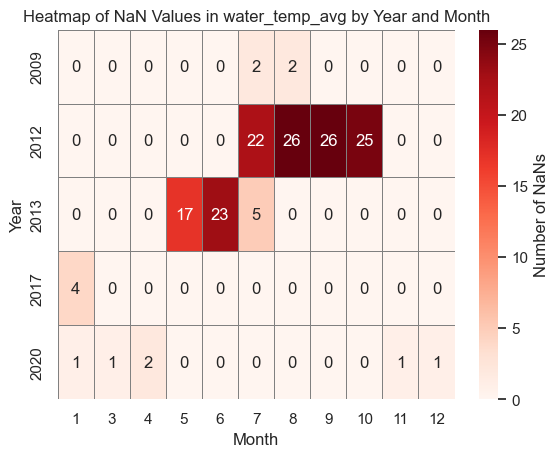

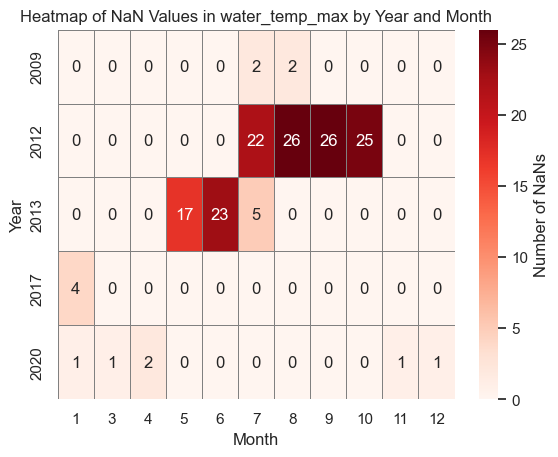

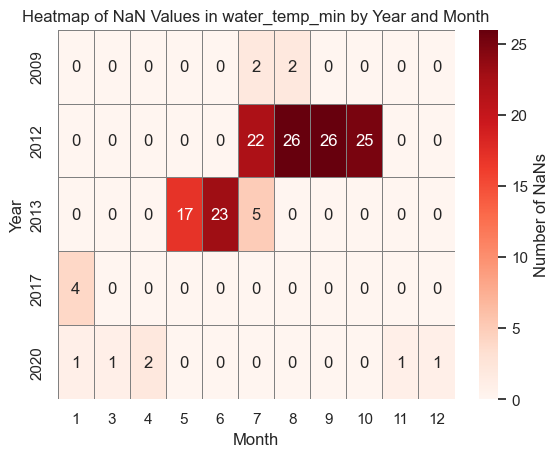

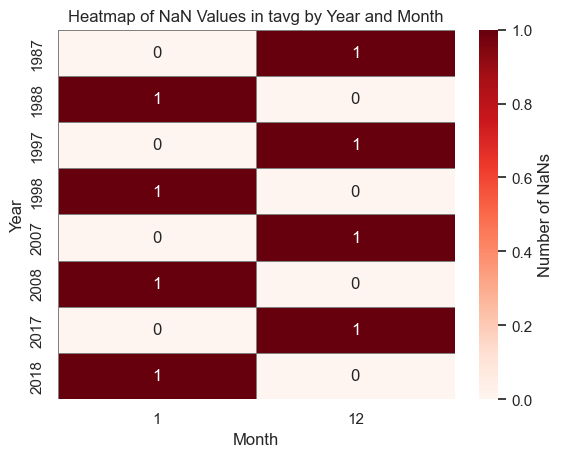

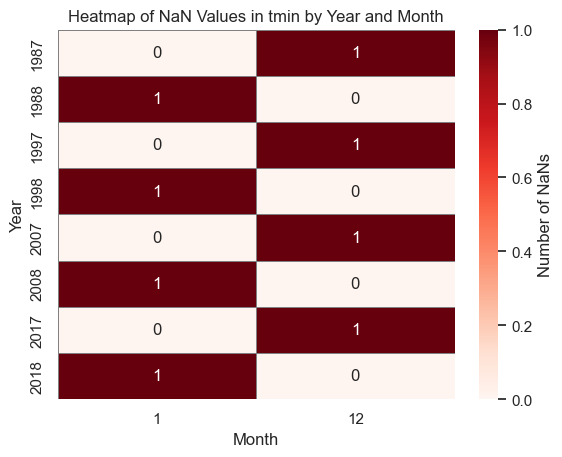

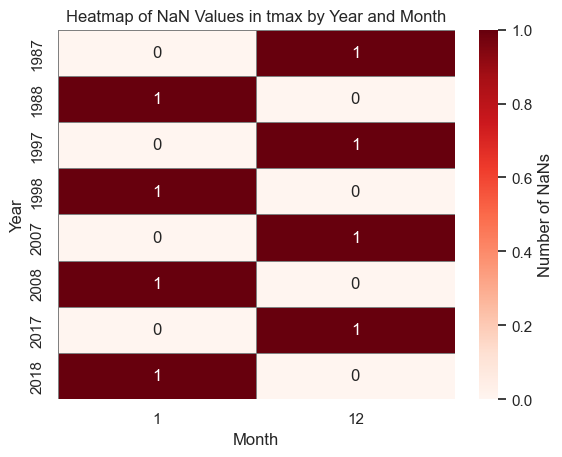

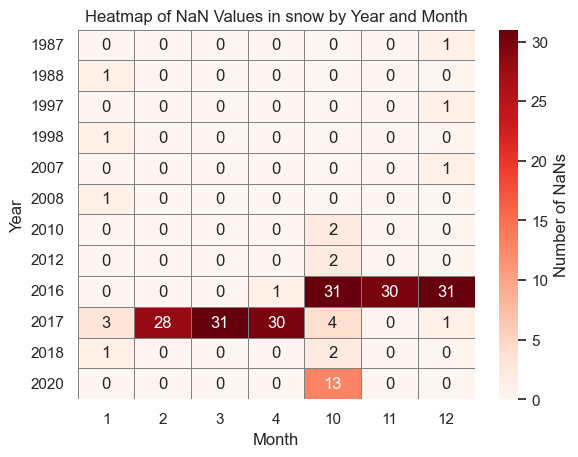

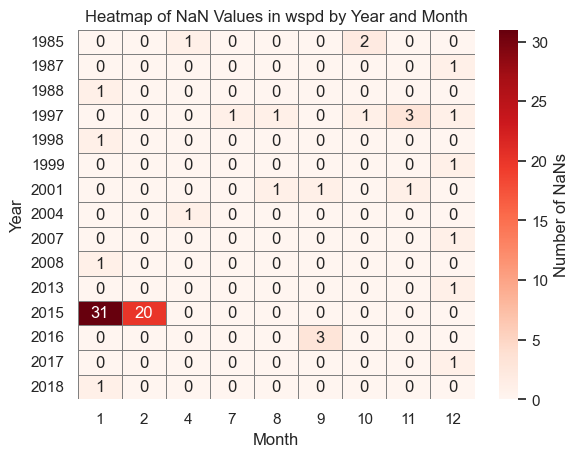

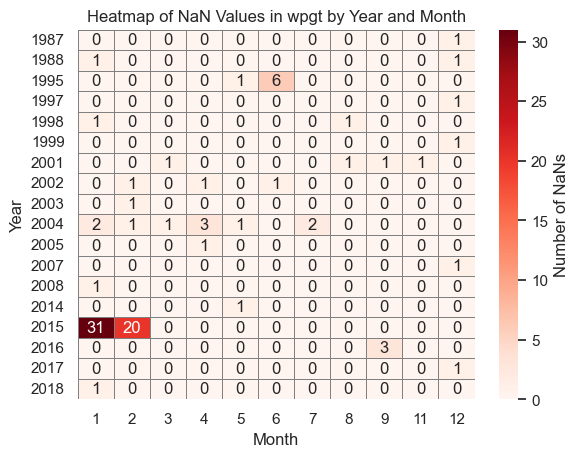

In [106]:
# Plot heatmaps for each variable in list_nans to visualize missing values across time

for col in list_nans_filtered:
    # Count NaNs per year and month
    nan_per_month_year = df_river_weather[df_river_weather[col].isna()].groupby(['year', 'month']).size().unstack(fill_value=0)

    # Create heatmap
    sns.heatmap(nan_per_month_year, cmap='Reds', annot=True, fmt='d', linewidths=0.5, linecolor='gray', cbar_kws={'label': 'Number of NaNs'})

    # Title & Labels
    plt.title(f"Heatmap of NaN Values in {col} by Year and Month")
    plt.xlabel("Month")
    plt.ylabel("Year")

    plt.show()  # Display each heatmap

<span style="color:#00BFFF;">
    <b>Result:</b><br>
    <p>Two different approaches were chosen for handling missing values, based on the observed patterns in the data.</p>
    <ol>
        <li><b>Water temperature (avg, max, min):</b>  
            <p>Since water temperature is a continuous variable with strong temporal dependencies, a tailored imputation method was required:</p>
            <ol>
                <li><b>Isolated missing values:</b> Filled using the mean of the previous and next values (neighbors' mean).</li>
                <li><b>Consecutive missing values (time series gaps):</b> Filled using <code>.interpolate('time')</code> to preserve seasonal and temporal trends.</li>
            </ol>
            <p>Water temperature had longer periods of missing data and a clear seasonal pattern in NaN occurrences. This approach ensures trend continuity while preventing abrupt jumps.</p>
        </li>
        <li><b>Air temperature (avg, min, max), precipitation, snow depth, wind speed, wind peak gust:</b>  
            <p>For these meteorological variables, missing values were more sporadic and showed no strong seasonal patterns in NaN occurrences. Therefore, a different approach was chosen:</p>
            <ol>
                <li><b>Isolated missing values:</b> Filled using the neighbors' mean.</li>
                <li><b>Consecutive missing values (≤7 days):</b> Filled using <code>.interpolate('time')</code> to maintain short-term trend continuity.</li>
                <li><b>Consecutive missing values (>7 days):</b> Replaced with <b>0</b>, assuming no valid measurement was taken during these periods.</li>
            </ol>
            <p>Unlike water temperature, these variables did not exhibit structured seasonal NaN patterns, making a simpler imputation strategy sufficient.</p>
            <p><b>Note:</b> The decision to replace gaps >7 days with 0 was made after extensive testing. Various imputation methods were considered, but setting these gaps to 0 was found to be the most robust and interpretable approach for this dataset.</p>
        </li>
    </ol>
    <p>After analyzing missing value patterns using time-series visualization and heatmaps, it was determined that water temperature required a different imputation strategy than the other variables.</p>
</span>

<span style="color:#00BFFF;">
    <h3>1. Filling Missing Values for Water Temperature</h3>
    <p>Since water temperature has strong temporal dependencies, two imputation methods are applied:</p>
    <ol>
        <li><b>Isolated missing values:</b> Filled using the mean of neighboring values.</li>
        <li><b>Consecutive missing values:</b> Interpolated using the time-based method.</li>
    </ol>
    <p>Additionally, a new column is created for each water temperature variable to store the imputation method used.</p>
</span>

In [108]:
# Create a dictionary to map each water temperature column to its corresponding "filled_status" column
dict_water_temp = {col: f"filled_status_{col}" for col in list_nans_filtered if col.startswith("water_temp")}
dict_water_temp

{'water_temp_avg': 'filled_status_water_temp_avg',
 'water_temp_max': 'filled_status_water_temp_max',
 'water_temp_min': 'filled_status_water_temp_min'}

In [109]:
# Loop through each water temperature column and fill in missing values
for col, status in dict_water_temp.items():

    # Count missing values before filling them (to check later)
    col_nan_counts = df_river_weather[col].isna().sum()
    filled_counts = 0  

    # Create a new column that marks missing values (1 = missing, 0 = not missing)
    df_river_weather['is_nan'] = df_river_weather[col].isna().astype(int)

    # Give each group number of missing values a number
    df_river_weather['nan_group'] = (df_river_weather['is_nan'].diff() != 0).cumsum()

    # Count how many missing values are in each group and save the result
    nan_group_sizes = df_river_weather[df_river_weather['is_nan'] == 1].groupby('nan_group').size().reset_index()
    nan_group_sizes.columns = ['nan_group', 'nan_group_size']  # Rename for clarity

    # Add this information back to the main dataset
    df_river_weather = df_river_weather.merge(nan_group_sizes, on='nan_group', how='left')

    # Fill in missing values if only one value is missing (using the mean of neighboring values)
    mask_1 = (df_river_weather['nan_group_size'] == 1)
    df_river_weather.loc[mask_1, col] = calculate_neighbours_mean(df_river_weather, col)    
    df_river_weather.loc[mask_1, status] = 'filled_with_neighbors_mean'
    filled_counts += df_river_weather[mask_1][col].count()  

    # Set the date column as index before interpolation
    df_river_weather['date_for_index'] = df_river_weather['date']
    df_river_weather.set_index('date_for_index', inplace=True) 

    # Fill in missing values if multiple consecutive values are missing (using time-based interpolation)
    mask_2 = (df_river_weather['nan_group_size'] > 1)
    df_river_weather.loc[mask_2, col] = df_river_weather[col].interpolate('time')
    df_river_weather.loc[mask_2, status] = 'interpolated_value_time'
    filled_counts += df_river_weather[mask_2][col].count()  

    # Remove the extra columns used to find missing value groups
    df_river_weather.drop(columns=['is_nan', 'nan_group', 'nan_group_size'], inplace=True)

    # Print summary to check the results
    print(f"Variable {col}:\
          \nNumber of NaNs before filling: {col_nan_counts}\
          \nNumber of filled values: {filled_counts}\
          \n{df_river_weather[status].value_counts()}\
          \n_______________________________________________")

Variable water_temp_avg:          
Number of NaNs before filling: 158          
Number of filled values: 158          
filled_status_water_temp_avg
interpolated_value_time       152
filled_with_neighbors_mean      6
Name: count, dtype: int64          
_______________________________________________
Variable water_temp_max:          
Number of NaNs before filling: 158          
Number of filled values: 158          
filled_status_water_temp_max
interpolated_value_time       152
filled_with_neighbors_mean      6
Name: count, dtype: int64          
_______________________________________________
Variable water_temp_min:          
Number of NaNs before filling: 158          
Number of filled values: 158          
filled_status_water_temp_min
interpolated_value_time       152
filled_with_neighbors_mean      6
Name: count, dtype: int64          
_______________________________________________


<span style="color:#00BFFF;">
    <h3>2. Filling Missing Values for the Remaining Variables</h3>
    <p>For air temperature, precipitation, snow depth, wind speed, and wind peak gust, a different approach is used.</p>
    <p>These variables do not have a clear seasonal pattern in their missing values, so a simpler method is applied:</p>
    <ol>
        <li><b>Single missing values:</b> Filled using the average of the values before and after.</li>
        <li><b>Up to 7 missing values in a row:</b> Filled using time-based interpolation.</li>
        <li><b>More than 7 missing values in a row:</b> Replaced with 0, assuming no valid measurement was available.</li>
    </ol>
    <p>A new column is added for each variable to show how its missing values were filled.</p>
</span>

In [ ]:
# Make a dictionary that connects each variable (except water temperature) to its "filled_status" column

dict_remaining_variables = {
    col: f"filled_status_{col}" for col in list_nans_filtered\
    if not (col.startswith("water_temp"))
    }
dict_remaining_variables

{'tavg': 'filled_status_tavg',
 'tmin': 'filled_status_tmin',
 'tmax': 'filled_status_tmax',
 'snow': 'filled_status_snow',
 'wspd': 'filled_status_wspd',
 'wpgt': 'filled_status_wpgt'}

In [ ]:
# Loop through each variable and fill missing values
for col, status in dict_remaining_variables.items():

    # Count missing values before filling them (to check later)
    col_nan_counts = df_river_weather[col].isna().sum()
    filled_counts = 0  

    # Create a new column that marks missing values (1 = missing, 0 = not missing)
    df_river_weather['is_nan'] = df_river_weather[col].isna().astype(int)

    # Give each group number of missing values a number
    df_river_weather['nan_group'] = (df_river_weather['is_nan'].diff() != 0).cumsum()

    # Count how many missing values are in each group and save the result
    nan_group_sizes = df_river_weather[df_river_weather['is_nan'] == 1].groupby('nan_group').size().reset_index()
    nan_group_sizes.columns = ['nan_group', 'nan_group_size']  # Rename for clarity

    # Add this information back to the main dataset
    df_river_weather = df_river_weather.merge(nan_group_sizes, on='nan_group', how='left')

    # Fill in missing values if only one value is missing (using the mean of neighboring values)
    mask_1 = (df_river_weather['nan_group_size'] == 1)
    df_river_weather.loc[mask_1, col] = calculate_neighbours_mean(df_river_weather, col)    
    df_river_weather.loc[mask_1, status] = 'filled_with_neighbors_mean'
    filled_counts += df_river_weather[mask_1][col].count()  

    # Set the date column as index before interpolation
    df_river_weather['date_for_index'] = df_river_weather['date']
    df_river_weather.set_index('date_for_index', inplace=True) 

    # Fill in missing values if multiple consecutive values are missing (using time-based interpolation)
    mask_2 = ((df_river_weather['nan_group_size'] > 1) & (df_river_weather['nan_group_size'] <= 7))
    df_river_weather.loc[mask_2, col] = df_river_weather[col].interpolate('time')
    df_river_weather.loc[mask_2, status] = 'interpolated_value_time'
    filled_counts += df_river_weather[mask_2][col].count()  

    # If more than 7 values are missing in a row, fill with zeros:
    mask_3 = (df_river_weather['nan_group_size'] > 7)
    df_river_weather.loc[mask_3, col] = 0
    df_river_weather.loc[mask_3, status] = 'filled_with_zero'
    filled_counts += df_river_weather[mask_3][col].count()  

    # Remove the extra columns used to find missing value groups
    df_river_weather.drop(columns=['is_nan', 'nan_group', 'nan_group_size'], inplace=True)

    # Print summary to check the results
    print(f"Variable {col}:\
          \nNumber of NaNs before filling: {col_nan_counts}\
          \nNumber of filled values: {filled_counts}\
          \n{df_river_weather[status].value_counts()}\
          \n_______________________________________________")

Variable tavg:          
Number of NaNs before filling: 8          
Number of filled values: 8          
filled_status_tavg
interpolated_value_time    8
Name: count, dtype: int64          
_______________________________________________
Variable tmin:          
Number of NaNs before filling: 8          
Number of filled values: 8          
filled_status_tmin
interpolated_value_time    8
Name: count, dtype: int64          
_______________________________________________
Variable tmax:          
Number of NaNs before filling: 8          
Number of filled values: 8          
filled_status_tmax
interpolated_value_time    8
Name: count, dtype: int64          
_______________________________________________
Variable snow:          
Number of NaNs before filling: 216          
Number of filled values: 216          
filled_status_snow
filled_with_zero              196
interpolated_value_time        18
filled_with_neighbors_mean      2
Name: count, dtype: int64          
_______________________

In [112]:
df_river_weather[list_nans].isna().sum()

concent_solids    0
water_temp_avg    0
water_temp_max    0
water_temp_min    0
tavg              0
tmin              0
tmax              0
snow              0
wspd              0
wpgt              0
dtype: int64

# ARCHIVE

In [214]:
# for the function I need for each column the name of the column, the status, the start_date
dict_col_status_startdate_river = {
    'flow_avg': {'status_col' : 'filled_status_flow_avg','status' : 'filled_with_median', 'start_date' : '01.01.1958'},
    'flow_max': {'status_col' : 'filled_status_flow_max','status' : 'filled_with_median', 'start_date' : '01.11.1970'},
    'flow_min': {'status_col' : 'filled_status_flow_min','status' : 'filled_with_median', 'start_date' : '01.11.1970'},
    'level_avg': {'status_col' : 'filled_status_level_avg','status' : 'filled_with_median', 'start_date' : '01.11.1973'},
    'level_max': {'status_col' : 'filled_status_level_max','status' : 'filled_with_median', 'start_date' : '01.11.1973'},
    'level_min': {'status_col' : 'filled_status_level_min','status' : 'filled_with_median', 'start_date' : '01.11.1973'},
    'concent_solids': {'status_col' : 'filled_status_concent_solids','status' : 'filled_with_median', 'start_date' : '31.10.1965'},
    'water_temp_avg': {'status_col' : 'filled_status_water_temp_avg','status' : 'filled_with_median', 'start_date' : '01.11.1980'},
    'water_temp_max': {'status_col' : 'filled_status_water_temp_max','status' : 'filled_with_median', 'start_date' :'01.11.1980'},
    'water_temp_min': {'status_col' : 'filled_status_temp_min','status' : 'filled_with_median', 'start_date' :'01.11.1980'}
}

In [215]:
# creating new columns to document the filled_in_status:

for col, values in dict_col_status_startdate_river.items():
    new_col = values['status_col']
    df_river[new_col] = "original"


In [216]:
test_dict = {
    'concent_solids': {'status_col' : 'filled_status_concent_solids',
                       'status' : 'filled_with_median',
                       'start_date' : '31.10.1965'}
}

In [217]:
# Function to fill NaNs with the overall median and track the filled status
def filling_with_overall_median(df, dict_cols):
    """
    This function fills NaN values in specified columns with the overall median
    and updates a corresponding status column to indicate the replacement.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    dict_cols (dict): A dictionary containing the columns, their status columns, 
                      the replacement status message, and the start date for filling.
                      Example: {'water_temp_min': {'status_col': 'filled_status_water_temp_min',
                                                  'status': 'filled_with_median',
                                                  'start_date': '1980-11-01'}}
    """
    
    for col, values in dict_cols.items():

        # Extract parameters from the dictionary
        start_date = values['start_date']
        status_col = values['status_col']
        status = values['status']

        # Define the condition for replacing NaNs
        condition = (df[col].isna()) & (df['date'] >= start_date)

        # Count the number of NaNs before filling
        num_nans_before = df[condition][col].isna().sum()
        
        # Calculate the overall median for the column
        col_median = df[col].median()

        # Perform the replacement with the median and update the status column     
        df.loc[condition, col] = col_median
        df.loc[condition, status_col] = status

        # Count how many rows have been filled by checking the status column
        num_marked_filled_status = df.loc[condition, status_col].eq(status).sum()
        
        print(f"Column: {col}:")
        # Check if the number of filled rows matches the number of NaNs identified earlier
        if num_nans_before - num_marked_filled_status != 0:
            print(f"❗ Warning: Not all NaNs were replaced! Difference: {num_nans_before - num_marked_filled_status}")
        else:
            print("✅ All NaNs have been successfully replaced!")

        # Print a summary to verify the correctness of the operation
   
        print(f"Number of NaNs before filling: {num_nans_before}")
        print(f"Number of rows filled and marked: {num_marked_filled_status}")
        print("-" * 50)    


In [218]:
filling_with_overall_median(df_river, dict_col_status_startdate_river)

Column: flow_avg:
✅ All NaNs have been successfully replaced!
Number of NaNs before filling: 0
Number of rows filled and marked: 0
--------------------------------------------------
Column: flow_max:
✅ All NaNs have been successfully replaced!
Number of NaNs before filling: 294
Number of rows filled and marked: 294
--------------------------------------------------
Column: flow_min:
✅ All NaNs have been successfully replaced!
Number of NaNs before filling: 294
Number of rows filled and marked: 294
--------------------------------------------------
Column: level_avg:
✅ All NaNs have been successfully replaced!
Number of NaNs before filling: 294
Number of rows filled and marked: 294
--------------------------------------------------
Column: level_max:
✅ All NaNs have been successfully replaced!
Number of NaNs before filling: 294
Number of rows filled and marked: 294
--------------------------------------------------
Column: level_min:
✅ All NaNs have been successfully replaced!
Number of

In [219]:
# Creating the DataFrame for calculating all days of swimming, taking an ice bath. 
# Water temperature's recording started the latest: 1980-11-01
# First creating the DataFrame only for river, 

In [220]:
# creating a new column "fill_in_nans_state"
df_river['nans_filled_status'] = np.nan

In [221]:
# writing a function for all NaN values of one variable, which has to be filled with a zero:
# creating "fill_in_nans_status"

def fill_in_zeros_nans (df, date_start, date_end, col):
    """
    """
    filter = ((df['date'] >= date_start) & (df['date'] <= date_end))
    df.loc[filter, col] = 0
    df.loc[filter, 'fill_in_nans_status'] = 'filled_with_zero'

In [222]:
# fill in conc_solids with zeros from 01.01.1958 until 31.10.1965
# first checking:
df_river[(df_river['date'] >= '01.01.1958') & (df_river['date'] <= '31.10.1965')]['concent_solids'].isna().sum()


2556

In [223]:
# now filling in zeros into the concent_solids from 01.01.1958 until 31.10.1965
fill_in_zeros_nans(df_river, '01.01.1958', '31.10.1965', 'concent_solids')

In [224]:
# checking, if it worked:
df_river[(df_river['date'] >= '01.01.1958') & (df_river['date'] <= '31.10.1965')]['concent_solids'].isna().sum()

0

In [225]:
# also checking, if the status is filled in right:
df_river[df_river['fill_in_nans_status'] == 'filled_with_zero']['concent_solids'].count()

2557

In [226]:
df_river.isna().sum()

date                                     0
flow_avg                                 0
flow_max                              4089
flow_min                              4089
level_avg                             5185
level_max                             5185
level_min                             5185
concent_solids                           0
water_temp_avg                        7741
water_temp_max                        7741
water_temp_min                        7741
alert_level                              0
is_flood_event                           0
flood_group                              0
year                                     0
month                                    0
is_outlier_level_max                     0
is_outlier_level_max_extreme             0
is_outlier_flow_max                      0
is_outlier_flow_max_extreme              0
is_outlier_level_avg                     0
is_outlier_level_avg_extreme             0
is_outlier_flow_avg                      0
is_outlier_

In [227]:
# checking, the NaNs of flow rate to verify that they are ok:
df_flow_rate.isna().sum()

date           0
flow_avg       0
flow_max    4383
flow_min    4383
dtype: int64

In [228]:
# checking the NaNs of water level by looking into the timeframe, in which they started recording:
df_river[df_river['date'] >= '31.10.1965'].isna().sum()

date                                     0
flow_avg                                 0
flow_max                              1533
flow_min                              1533
level_avg                             2629
level_max                             2629
level_min                             2629
concent_solids                           0
water_temp_avg                        5185
water_temp_max                        5185
water_temp_min                        5185
alert_level                              0
is_flood_event                           0
flood_group                              0
year                                     0
month                                    0
is_outlier_level_max                     0
is_outlier_level_max_extreme             0
is_outlier_flow_max                      0
is_outlier_flow_max_extreme              0
is_outlier_level_avg                     0
is_outlier_level_avg_extreme             0
is_outlier_flow_avg                      0
is_outlier_

In [229]:
# checking the NaNs of water level by looking into the timeframe, in which they started recording:
df_river[df_river['date'] >= '01.11.1973'].isna().sum()

date                                     0
flow_avg                                 0
flow_max                                 0
flow_min                                 0
level_avg                                0
level_max                                0
level_min                                0
concent_solids                           0
water_temp_avg                        2556
water_temp_max                        2556
water_temp_min                        2556
alert_level                              0
is_flood_event                           0
flood_group                              0
year                                     0
month                                    0
is_outlier_level_max                     0
is_outlier_level_max_extreme             0
is_outlier_flow_max                      0
is_outlier_flow_max_extreme              0
is_outlier_level_avg                     0
is_outlier_level_avg_extreme             0
is_outlier_flow_avg                      0
is_outlier_

In [230]:
# checking the NaNs of water level by looking into the timeframe, in which they started recording:
df_river[df_river['date'] >= '01.11.1980'].isna().sum()

date                                     0
flow_avg                                 0
flow_max                                 0
flow_min                                 0
level_avg                                0
level_max                                0
level_min                                0
concent_solids                           0
water_temp_avg                           0
water_temp_max                           0
water_temp_min                           0
alert_level                              0
is_flood_event                           0
flood_group                              0
year                                     0
month                                    0
is_outlier_level_max                     0
is_outlier_level_max_extreme             0
is_outlier_flow_max                      0
is_outlier_flow_max_extreme              0
is_outlier_level_avg                     0
is_outlier_level_avg_extreme             0
is_outlier_flow_avg                      0
is_outlier_

In [231]:
# Check the numbers of data per year of every variable of flow rate, to check if there are missing values by missing data
# creating a DataFrame with the numbers of rows in each year:

data_per_year = df_flow_rate.groupby(df_flow_rate['date'].dt.year)['flow_max'].count()

In [232]:
# plotting the number of nans per year and month
print("The number of Nans of concentration of suspended solids is: ", df_river['concent_solids'].isna().sum(), "out of:", df_river['concent_solids'].size,
      ", percentage: ", round(df_river['concent_solids'].isna().sum()/df_river['concent_solids'].size*100, 2), "%")

The number of Nans of concentration of suspended solids is:  0 out of: 24125 , percentage:  0.0 %


In [233]:
number_concent_solids_per_year = df_river.groupby(df_river['year'])[['concent_solids']].count()
number_concent_solids_per_year.value_counts().reset_index()

,concent_solids,count
0,365,49
1,366,16
2,61,1
3,323,1


In [234]:
number_concent_solids_per_year[number_concent_solids_per_year <= 365]
# all years where the number of values is < 365
#df_river.loc[df_river.groupby(df_river['year'])['concent_solids'].count()<365, ['year']]
#print("Jahre, bei denen die Anzahl der Datensätze kleiner als 365 ist:", number_concent_solids_per_year < 365)

,concent_solids
year,
1958,61.0
1959,365.0
1960,NaN
1961,365.0
1962,365.0
...,...
2020,NaN
2021,365.0
2022,365.0


In [235]:
number_concent_solids_per_month = df_river.groupby(df_river['month'])[['concent_solids']].count()
number_concent_solids_per_month.value_counts()

concent_solids
2046              7
1980              3
1865              1
1998              1
Name: count, dtype: int64

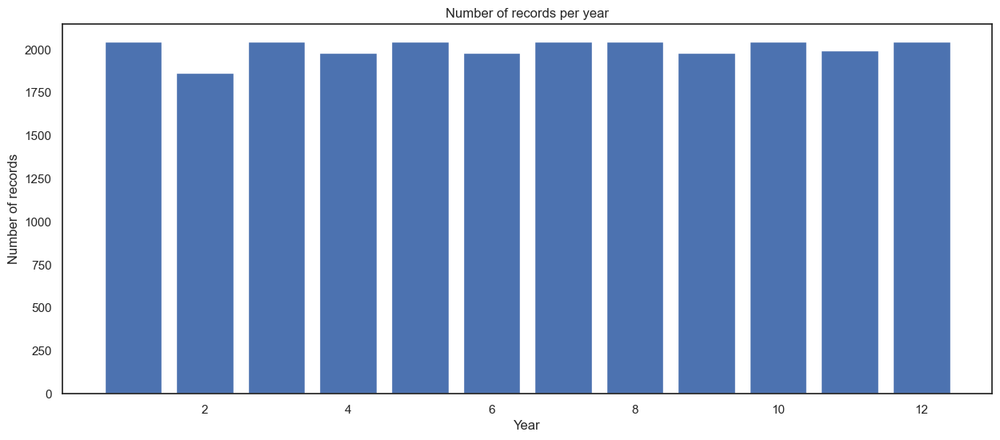

In [236]:
# plot of records per month:

plt.figure(figsize=(15, 6))

plt.bar(number_concent_solids_per_month.index, number_concent_solids_per_month['concent_solids'])

plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()

<span style='color: red;'>I always recommend to do the group by in one cell, print the result dataframe to see the output is what you wanted and, in another cell, do the plot!</span>
<span style='color: green;'>done</span>

<span style='color: red;'>What do you want to check with this plot? If you have missing days from a specific year? It would be great to know why you are plotting this and what you interpret from it. Probably if that's what you want to check (if you have data for all days in all years), I would have use a different title.</span><br>
<span style='color: green;'>that's plot show that there are rows for every year, except 1958 - I assume the recording startet later in that year - and except in 2024, because the year <br>is still ongoing! Maybe a plot isn't really necessary: To count the numbers, could be also an approach and would be more acurate</span>

In [237]:
df_reservoir.isna().sum()

date                                0
reservoir_avg                       0
reservoir_max                       7
reservoir_min                       7
is_outlier_reservoir_avg            0
is_outlier_reservoir_avg_extreme    0
is_outlier_reservoir_max            0
is_outlier_reservoir_max_extreme    0
is_outlier_reservoir_min            0
is_outlier_reservoir_min_extreme    0
dtype: int64

In [238]:
df_weather.isna().sum()

date                   0
tavg                   0
tmin                   0
tmax                   0
prcp                   0
snow                 490
wdir               14632
wspd                9927
wpgt                9942
pres                9863
tsun                   5
year                   0
month                  0
is_outlier_tavg        0
is_outlier_tmin        0
is_outlier_tmax        0
is_outlier_prcp        0
is_outlier_snow        0
is_outlier_wspd        0
is_outlier_wpgt        0
is_outlier_pres        0
dtype: int64

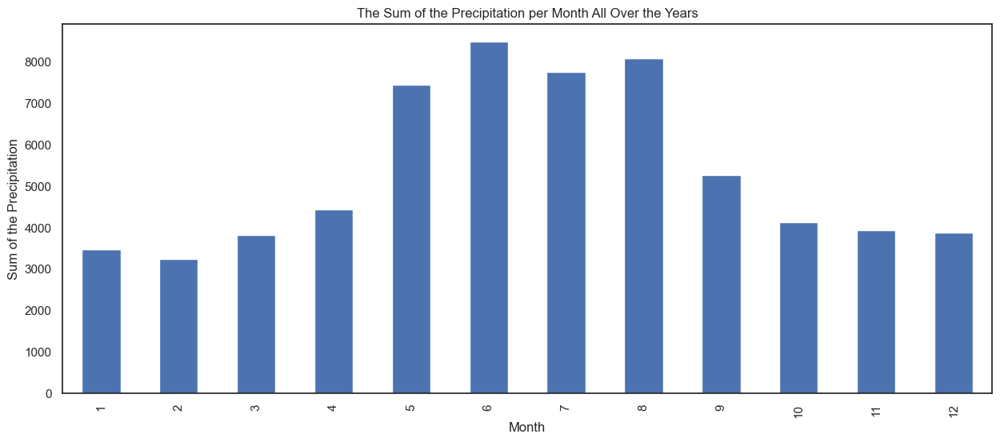

In [239]:
prcp_per_month = df_weather.groupby(df_weather['month'])['prcp'].sum()
plt.figure(figsize=(15, 6))
prcp_per_month.plot(kind='bar')
plt.title('The Sum of the Precipitation per Month All Over the Years')
plt.xlabel('Month')
plt.ylabel('Sum of the Precipitation')
plt.show()

In [240]:
# checking NaNs:
df_river_flow_rate.isna().sum()

NameError: name 'df_river_flow_rate' is not defined

In [ ]:
# checking, if there are NaNs after June 2011
df_river_flow_rate_nans = df_river_flow_rate[(df_river_flow_rate['Maximum']).isna() | (df_river_flow_rate['Minimum'].isna())]
df_river_flow_rate_nans

# NaNs of Maximum and Minimum after 31.10.1970, afterwards no NaNs

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.58,"74,4",NaN,NaN,Geprueft
1,02.11.58,"77,9",NaN,NaN,Geprueft
2,03.11.58,"72,2",NaN,NaN,Geprueft
3,04.11.58,93,NaN,NaN,Geprueft
4,05.11.58,121,NaN,NaN,Geprueft
...,...,...,...,...,...
4378,27.10.70,"56,2",NaN,NaN,Geprueft
4379,28.10.70,"59,5",NaN,NaN,Geprueft
4380,29.10.70,"67,4",NaN,NaN,Geprueft
4381,30.10.70,"74,9",NaN,NaN,Geprueft


In [ ]:
# loading and putting all dataframes together: water_quality
df_water_quality = df_concat('../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv','../datasets/river/fluesse-schwebstoff/16005701_01.01.2024_31.08.2024_tmw_0.csv', ";")


dataframe for is completed. There are 21250 rows.


In [ ]:
df_water_quality.head(10)
# first data from 01.10.1965

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,31.10.65,25,Rohdaten,"47,85",Rohdaten,"0,02",Rohdaten,"0,55",Rohdaten
1,01.11.65,"18,06",Rohdaten,"32,47",Rohdaten,"0,01",Rohdaten,"0,38",Rohdaten
2,02.11.65,"11,57",Rohdaten,"20,55",Rohdaten,"0,01",Rohdaten,"0,24",Rohdaten
3,03.11.65,"11,11",Rohdaten,"27,77",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten
4,04.11.65,"9,88",Rohdaten,"26,54",Rohdaten,"0,01",Rohdaten,"0,31",Rohdaten
5,05.11.65,"5,87",Rohdaten,"16,67",Rohdaten,"0,01",Rohdaten,"0,19",Rohdaten
6,06.11.65,"5,56",Rohdaten,"14,31",Rohdaten,"0,01",Rohdaten,"0,17",Rohdaten
7,07.11.65,"5,56",Rohdaten,"12,34",Rohdaten,0,Rohdaten,"0,14",Rohdaten
8,08.11.65,"6,79",Rohdaten,"13,54",Rohdaten,"0,01",Rohdaten,"0,16",Rohdaten
9,09.11.65,"12,04",Rohdaten,"27,42",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten


In [ ]:
df_water_quality.info()
# no NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Zeitpunkt                          21250 non-null  object
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  object
 2   Prüfstatus                         21250 non-null  object
 3   Schwebstoff-Fracht [t]             21250 non-null  object
 4   Prüfstatus.1                       21250 non-null  object
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  object
 6   Prüfstatus.2                       21250 non-null  object
 7   Schwebstoff-Transport [kg/s]       21250 non-null  object
 8   Prüfstatus.3                       21250 non-null  object
dtypes: object(9)
memory usage: 1.6+ MB


In [ ]:
# loading and putting all dataframes together: water_level
df_water_level = df_concat('../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv', '../datasets/river/fluesse-wasserstand/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 18567 rows.


In [ ]:
df_water_level.head(10)
# first data from 01.11.1973

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.73,50,58,44,Geprueft
1,02.11.73,45,53,43,Geprueft
2,03.11.73,49,57,43,Geprueft
3,04.11.73,45,57,31,Geprueft
4,05.11.73,46,52,35,Geprueft
5,06.11.73,49,54,43,Geprueft
6,07.11.73,51,54,43,Geprueft
7,08.11.73,48,54,40,Geprueft
8,09.11.73,46,53,33,Geprueft
9,10.11.73,43,50,38,Geprueft


In [ ]:
df_water_level.info()
# no NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       18567 non-null  object
 1   Mittelwert  18567 non-null  int64 
 2   Maximum     18567 non-null  int64 
 3   Minimum     18567 non-null  int64 
 4   Prüfstatus  18567 non-null  object
dtypes: int64(3), object(2)
memory usage: 870.3+ KB


In [ ]:
# loading and putting all dataframes together: daily_water_temperature
df_daily_water_temperature = df_concat('/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv','/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 15288 rows.


In [ ]:
df_daily_water_temperature.head(10)
# data from 01.11.1980

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.80,"8,1","8,1","8,1",Geprueft
1,02.11.80,"7,3","7,3","7,3",Geprueft
2,03.11.80,"5,8","5,8","5,8",Geprueft
3,04.11.80,"5,6","5,6","5,6",Geprueft
4,05.11.80,"4,8","4,8","4,8",Geprueft
5,06.11.80,"4,7","4,7","4,7",Geprueft
6,07.11.80,"6,1","6,1","6,1",Geprueft
7,08.11.80,"7,7","7,7","7,7",Geprueft
8,09.11.80,"7,5","7,5","7,5",Geprueft
9,10.11.80,"7,6","7,6","7,6",Geprueft


In [ ]:
df_daily_water_temperature.info()
# non NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 15288 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       15288 non-null  object
 1   Mittelwert  15288 non-null  object
 2   Maximum     15288 non-null  object
 3   Minimum     15288 non-null  object
 4   Prüfstatus  15288 non-null  object
dtypes: object(5)
memory usage: 716.6+ KB


In [ ]:
# creating 1 dataframe for the water-variables river flow rate, water quality: suspended solids, water level, daily water temperatures
# checking all columns and potientially rename them:
#df_river_flow_rate.columns: done
#df_water_level.columns
#df_water_quality.columns
#df_daily_water_temperature.columns

In [ ]:
# how much data is missing in 1980, 2012, 2013 and 2022?
num_missing_records_1980 =  366 - df_river['year'][df_river['year']==1980].count()
num_missing_records_2012 =  366 - df_river['year'][df_river['year']==2012].count()
num_missing_records_2013 =  365 - df_river['year'][df_river['year']==2013].count()
num_missing_records_2022 =  365 - df_river['year'][df_river['year']==2022].count()
num_missing_records_2024 =  365 - df_river['year'][df_river['year']==2024].count()

print('Missing data for: 1980:', num_missing_records_1980, '2012:', num_missing_records_2012, '2013:', num_missing_records_2013, '2022:', num_missing_records_2022, '2024:', num_missing_records_2024)

Missing data for: 1980: 305 2012: 99 2013: 45 2022: 199 2024: 121


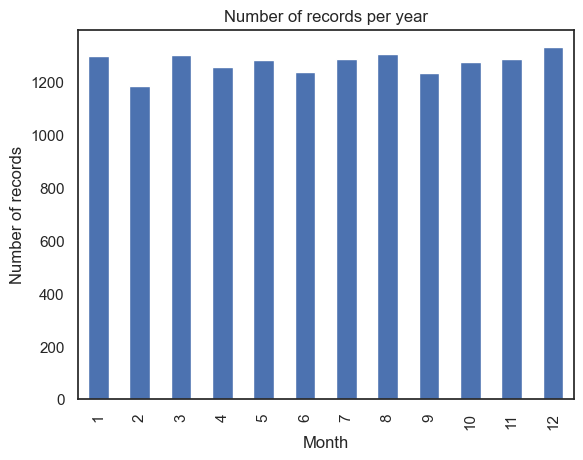

In [ ]:
# plot of records per month:
data_per_month_river = df_river.groupby('month').size()

data_per_month_river.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Month')
plt.ylabel('Number of records')
#plt.show()

In [ ]:
df_river_suspended_nans = df_river[df_river['suspended_solids_concentration'].isna()]
df_river_suspended_nans

# no data of water quality from 19.07.2022 until 07.08.22 and after 21.08.24
# deleting all rows after 21.08.
# what shall I do with the data in 2022? Maybe fill them with the mean of 2 weeks before and 2 weeks after?
# looking into it:

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of suspended solids concentration the monthly mean
df_river.groupby('month')['suspended_solids_concentration'].mean()


month
1     11.566006
2     13.412763
3     17.059093
4     15.863943
5     26.262615
6     35.792935
7     52.707526
8     34.954255
9     15.906783
10    13.360877
11    11.295578
12    11.554039
Name: suspended_solids_concentration, dtype: float64

In [ ]:
# getting the mean of suspended concentration in the month July:
mean_concentration_july = df_river['suspended_solids_concentration'][df_river['month'] == 7].mean()
round(mean_concentration_july,2)

52.71

In [ ]:
# getting the right part of the dataframe for the july NaNs:
df_river_suspended_nans_july = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==7)]
df_river_suspended_nans_july

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [ ]:
# fill in the July-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month'] == 7), 'suspended_solids_concentration'] = round(mean_concentration_july,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15271 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
# getting the mean of suspended concentration in the month august:
mean_concentration_august = df_river['suspended_solids_concentration'][df_river['month'] == 8].mean()
round(mean_concentration_august,2)

34.95

In [ ]:
# getting the right part of the dataframe for the august NaNs:
df_river_suspended_nans_august = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8)]
df_river_suspended_nans_august

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14526,2022-08-01,19.4,19.8,18.9,90,92,86,NaN,NaN,NaN,NaN,29.8,31.7,26.9,2022,8
14527,2022-08-02,20.0,20.7,19.5,91,93,89,NaN,NaN,NaN,NaN,30.9,32.6,29.2,2022,8
14528,2022-08-03,20.4,21.1,19.8,96,103,90,NaN,NaN,NaN,NaN,35.5,42.6,30.0,2022,8
14529,2022-08-04,20.7,21.5,19.7,98,103,93,NaN,NaN,NaN,NaN,31.8,36.0,27.8,2022,8
14530,2022-08-05,21.1,21.5,20.5,93,96,90,NaN,NaN,NaN,NaN,27.9,30.3,25.5,2022,8
14531,2022-08-06,20.4,21.2,19.4,89,97,86,NaN,NaN,NaN,NaN,24.7,30.3,22.8,2022,8
14532,2022-08-07,19.0,19.4,18.6,87,89,85,NaN,NaN,NaN,NaN,23.4,24.8,22.8,2022,8
15278,2024-08-22,17.6,18.4,16.7,131,136,125,NaN,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,NaN,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,NaN,NaN,NaN,NaN,60.5,67.7,51.6,2024,8


In [ ]:
# fill in the august-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8), 'suspended_solids_concentration'] = round(mean_concentration_august,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
df_river.tail(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
15278,2024-08-22,17.6,18.4,16.7,131,136,125,34.95,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,34.95,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,34.95,NaN,NaN,NaN,60.5,67.7,51.6,2024,8
15281,2024-08-25,18.3,19.7,17.5,121,144,111,34.95,NaN,NaN,NaN,52.7,87.5,39.7,2024,8
15282,2024-08-26,16.4,17.4,16.1,142,150,131,34.95,NaN,NaN,NaN,84.2,96.9,67.7,2024,8
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8
15287,2024-08-31,19.1,19.7,18.2,109,115,104,34.95,NaN,NaN,NaN,37.7,44.8,32.0,2024,8


In [ ]:
df_river.shape

(15288, 16)

In [ ]:
df_river_raw= df_river.copy()

## WEATHER:

In [ ]:
# WEATHER:
# Loading the xls-files into DataFrames (first: 2011-06-01 to 2016, second: 2017 to 2024-09-05)
path_weather_2017_to_now = "../datasets/weather/weather20170102-20240905.xlsx"
path_weather_jun2011_to_2016 = "../datasets/weather/weather20110601-20161231.xlsx"

df_weather_jun2011_to_2016 = pd.read_excel(path_weather_jun2011_to_2016)
df_weather_2017_to_now = pd.read_excel(path_weather_2017_to_now)


In [ ]:
# dataframe 2011 - 2016:
df_weather_jun2011_to_2016

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480
...,...,...,...,...,...,...,...,...,...,...,...
2036,2016-12-27,2.7,0.8,4.2,0.0,NaN,274.0,17.3,47.9,1040.5,90
2037,2016-12-28,2.9,-1.4,5.0,0.0,NaN,272.0,10.8,34.9,1043.3,108
2038,2016-12-29,0.7,-2.4,5.8,0.0,NaN,104.0,7.2,24.5,1041.1,402
2039,2016-12-30,-3.6,-5.3,-1.1,0.0,NaN,322.0,5.0,13.7,1040.2,336


In [ ]:
# dataframe 2017 - now:
df_weather_2017_to_now

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2017-01-02,-2.4,-5.4,0.8,3.2,NaN,279.0,10.4,33.5,1022.7,18.0
1,2017-01-03,-0.9,-2.1,0.6,0.0,40.0,257.0,11.2,37.1,1026.7,216.0
2,2017-01-04,0.4,-0.9,1.3,2.2,30.0,260.0,26.6,73.1,1016.0,0.0
3,2017-01-05,-3.3,-7.1,-0.2,0.0,50.0,318.0,15.1,63.7,1025.9,0.0
4,2017-01-06,-9.3,-13.0,-6.5,0.0,50.0,25.0,5.8,19.4,1040.9,300.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# checking if they were loades completely:
print("rows for 2011 until 2016:", df_weather_jun2011_to_2016.shape[0])
print("rows for 2017 until now:", df_weather_2017_to_now.shape[0])

rows for 2011 until 2016: 2041
rows for 2017 until now: 2804


In [ ]:
#one dataframe with all the data of the weather:
df_weather = pd.concat([df_weather_jun2011_to_2016, df_weather_2017_to_now])
df_weather.head()

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0


In [ ]:
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_weather.columns

Index(['date', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt',
       'pres', 'tsun'],
      dtype='object')

In [ ]:
# How much NaNs do we have?
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow    2749
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
dtype: int64

In [ ]:
# changing date into a dateformat:
df_weather['datenew'] = pd.to_datetime(df_weather['date'])
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,datenew
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0,2011-06-01
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0,2011-06-02
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0,2011-06-03
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0,2011-06-04
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0,2011-06-05
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0,2024-09-01
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0,2024-09-02
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024-09-03
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-04


In [ ]:
# putting datenew on the first position:
cols_weather = df_weather.columns.to_list()
cols_weather.insert(0, cols_weather.pop(cols_weather.index('datenew')))
df_weather = df_weather[cols_weather]
df_weather


,datenew,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# dropping 'date'
df_weather = df_weather.drop(columns='date')

In [ ]:
# renaming datenew into date
df_weather = df_weather.rename(columns={'datenew':'date'})
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# NaNs in windspeed and tmax and wpgt: I will do the same as for the missing values in the water dataframe. filling it with the means of the month. So first I have to add the columns year and month:
# adding columns year and month:
df_weather['year'] = df_weather['date'].dt.year
df_weather['month'] = df_weather['date'].dt.month
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    2096 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4788 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


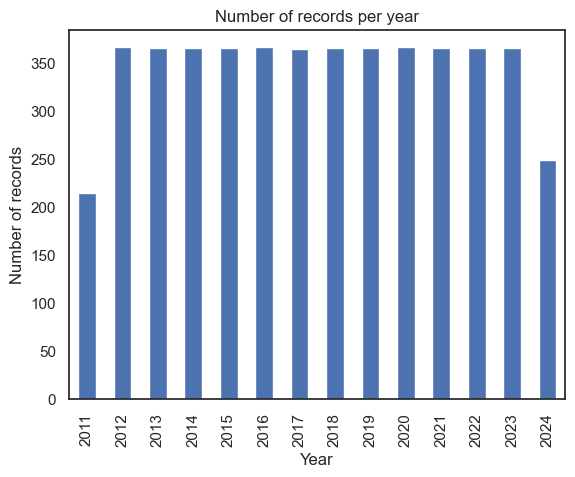

In [ ]:
# plot of records per year:
data_per_year_weather = df_weather.groupby('year').size()

data_per_year_weather.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()

In [ ]:
missing_records = {}
# For-Schleife für die Jahre 2011 bis 2024
for year in range(2011, 2024):
    # Bestimme, ob das Jahr ein Schaltjahr ist
    days_in_year = 366 if year % 4 == 0 else 365
    
    # Berechne die Anzahl der fehlenden Datensätze für das jeweilige Jahr
    num_missing_records = days_in_year - df_weather['year'][df_weather['year'] == year].count()
    
    # Speichere die fehlenden Datensätze im Dictionary
    missing_records[year] = num_missing_records

# Ausgabe der fehlenden Datensätze
print(missing_records)

{2011: 151, 2012: 0, 2013: 0, 2014: 0, 2015: 0, 2016: 0, 2017: 1, 2018: 0, 2019: 0, 2020: 0, 2021: 0, 2022: 0, 2023: 0}


In [ ]:
# es fehlt nur ein Datensatz in 2017. I will leave it by that.

In [ ]:
# NaNs snow: I will fill in for everry missing value a '0', because it is obvious, that it isn't documented in summer
df_weather['snow'] = df_weather['snow'].fillna(0)
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,0.0,65.0,7.2,22.0,1013.9,564.0,2024,9
2800,2024-09-02,22.0,18.4,27.2,0.0,0.0,328.0,7.6,30.2,1012.8,493.0,2024,9
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024,9
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2024,9


In [ ]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow       0
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
year       0
month      0
dtype: int64

In [ ]:
# tmax is only in September 2024, so I leave it (because I will cut it off)
# then look into wspd
df_weather_wspd_nans = df_weather[df_weather['wspd'].isna()]
df_weather_wspd_nans

# no data of wspd in Dez, Jan, Feb and Sept
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
927,2013-12-14,0.9,-4.1,7.3,2.3,0.0,NaN,NaN,46.4,1030.9,306.0,2013,12
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wspd'].mean()


month
1     11.504852
2     11.704310
3     11.221092
4     10.548974
5     10.032754
6      9.601429
7      9.421429
8      8.710369
9      8.426410
10     8.732506
11     9.210000
12    10.619900
Name: wspd, dtype: float64

In [ ]:
# getting the mean of wspd in the month January:
mean_wspd_jan = df_weather['wspd'][df_weather['month'] == 1].mean()
round(mean_wspd_jan,2)


11.5

In [ ]:
# getting the right part of the dataframe for the july NaNs:
df_weather_wspd_nans_jan = df_weather[(df_weather['wspd'].isna()) & (df_weather['month']==1)]
df_weather_wspd_nans_jan

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1
1319,2015-01-10,13.6,10.5,16.3,6.2,0.0,NaN,NaN,NaN,1016.1,342.0,2015,1


In [ ]:
# fill in the July-NaNs with the mean:
df_weather.loc[(df_weather['wspd'].isna()) & (df_weather['month'] == 1), 'wspd'] = round(mean_wspd_jan,2)
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4819 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
def fillna_mean_month(col, month):

    # getting the mean of wspd in the month January:
    mean_variable_month = df_weather[col][df_weather['month'] == month].mean()
    mean_varibale_month = round(mean_variable_month,2)

    df_weather.loc[(df_weather[col].isna()) & (df_weather['month'] == month), col] = round(mean_variable_month,2)
    df_weather.info()

In [ ]:
fillna_mean_month('wspd',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4824 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
fillna_mean_month('wspd',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4844 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
fillna_mean_month('wspd',12)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wpgt'].mean()

month
1     37.428571
2     38.334483
3     37.491067
4     36.617436
5     36.278055
6     36.292143
7     36.726959
8     34.092379
9     29.828462
10    30.134491
11    30.587179
12    35.424566
Name: wpgt, dtype: float64

In [ ]:
# looking into wpgt
df_weather_wpgt_nans = df_weather[df_weather['wpgt'].isna()]
df_weather_wpgt_nans

# no data of wpgt in may, jan, feb, sept, august
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1084,2014-05-20,18.0,9.4,25.7,0.0,0.0,131.0,7.90,NaN,1012.3,756.0,2014,5
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,11.50,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,11.50,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,11.50,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,11.50,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,11.50,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,11.50,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,11.50,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,11.50,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,11.50,NaN,1026.1,0.0,2015,1


In [ ]:
# filling the missing data in january with the all over mean of january
fillna_mean_month('wpgt',1)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4817 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in february with the all over mean of january
fillna_mean_month('wpgt',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4837 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in may with the all over mean of may
fillna_mean_month('wpgt',5)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4839 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in sept with the all over mean of september
fillna_mean_month('wpgt',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4844 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in august with the all over mean of august
fillna_mean_month('wpgt',8)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# then look into prcp
df_weather_prcp_nans = df_weather[df_weather['prcp'].isna()]
df_weather_prcp_nans

# no data of prcp in april (September I will delete)
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
455,2018-04-02,9.5,1.9,16.5,NaN,0.0,178.0,9.00,25.20,1011.2,600.0,2018,4
456,2018-04-03,15.9,10.0,22.6,NaN,0.0,178.0,9.70,45.40,1005.8,480.0,2018,4
457,2018-04-04,15.4,8.8,23.3,NaN,0.0,199.0,12.60,65.20,1005.2,576.0,2018,4
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9
2803,2024-09-05,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9


In [ ]:
# filling the missing data in april with the all over mean of april
fillna_mean_month('prcp',4)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
df_weather.shape

(4845, 13)

In [ ]:
df_river.shape

(15288, 16)

In [ ]:
# copy of weather data:
df_weather_raw = df_weather.copy()

## Step 3: deeper look into the data
### a. river:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [ ]:
# looking into the datatypes
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8


In [ ]:
df_river.describe().T

,count,mean,min,25%,50%,75%,max,std
date,15288,2001-12-09 16:02:21.287284224,1980-11-01 00:00:00,1991-04-19 18:00:00,2001-10-05 12:00:00,2012-03-27 06:00:00,2024-08-31 00:00:00,NaN
avg_water_temperature,15288.0,9.912055,0.2,5.5,9.6,14.1,21.8,4.830674
max_water_temperature,15288.0,10.198947,0.5,5.7,9.9,14.3,22.4,4.955
min_water_temperature,15288.0,9.631279,-0.1,5.3,9.3,13.8,21.4,4.732989
avg_water_level,15288.0,84.137232,19.0,59.0,78.0,99.0,495.0,35.951824
max_water_level,15288.0,93.129579,25.0,68.0,86.0,108.0,542.0,39.541371
min_water_level,15288.0,75.599359,11.0,52.0,70.0,91.0,451.0,33.177899
suspended_solids_concentration,15288.0,21.659735,1.05,6.66,10.82,17.75,2000.97,74.59221
suspended_solid_load,15258.0,231.565058,1.49,21.4525,43.35,98.615,50194.83,1305.091107
suspended_sediment_erosion,15258.0,0.082023,0.0,0.01,0.02,0.04,17.68,0.459831


In [ ]:
# creating a report, automatically in an html-file:
# profile_report_river = df_river.profile_report()
# profile_report_river.to_file(output_file='output_river_level.html')

In [ ]:
#profile_report_river

## Step 3: deeper look into the data
### b. weather:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [ ]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
df_weather.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4845,2018-01-17 13:53:23.219814144,2011-06-01 00:00:00,2014-09-24 00:00:00,2018-01-18 00:00:00,2021-05-13 00:00:00,2024-09-05 00:00:00,NaN
tavg,4843.0,10.959529,-12.6,4.9,10.9,17.1,29.5,7.643796
tmin,4843.0,6.705245,-16.6,1.4,6.7,12.2,21.5,6.633847
tmax,4843.0,15.640058,-9.7,8.6,15.6,22.9,36.9,9.034461
prcp,4843.0,2.631505,0.0,0.0,0.0,2.5,91.5,5.945939
snow,4845.0,4.945304,0.0,0.0,0.0,0.0,420.0,24.262493
wdir,4653.0,197.098431,0.0,100.0,233.0,265.0,359.0,92.313677
wspd,4845.0,9.955102,0.7,7.2,9.0,11.5,36.7,4.202105
wpgt,4845.0,34.937653,9.4,24.1,31.7,42.1,119.9,14.691284
pres,4841.0,1016.882813,980.0,1012.1,1016.8,1021.7,1044.9,8.139639


In [ ]:
# creating a report, automatically in an html-file:
#profile_report_weather = df_weather.profile_report()
#profile_report_weather.to_file(output_file='output_weather.html')

In [ ]:
#profile_report_weather

 ## Step 4: Data cleaning

## 4.1 Nans


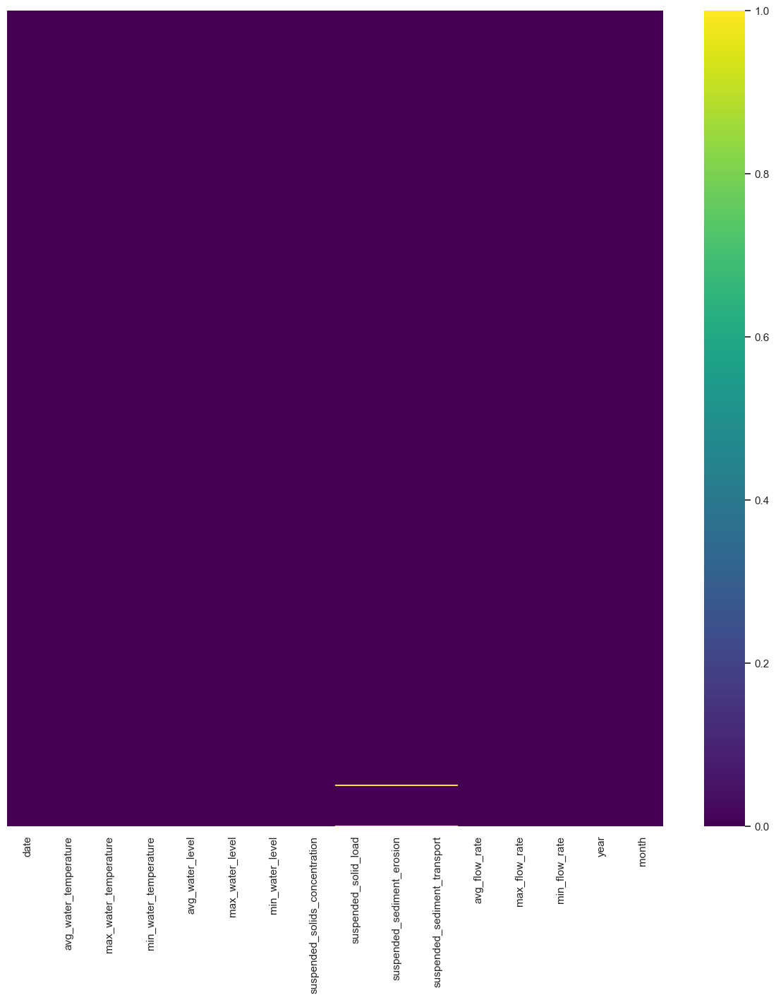

In [ ]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_river.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

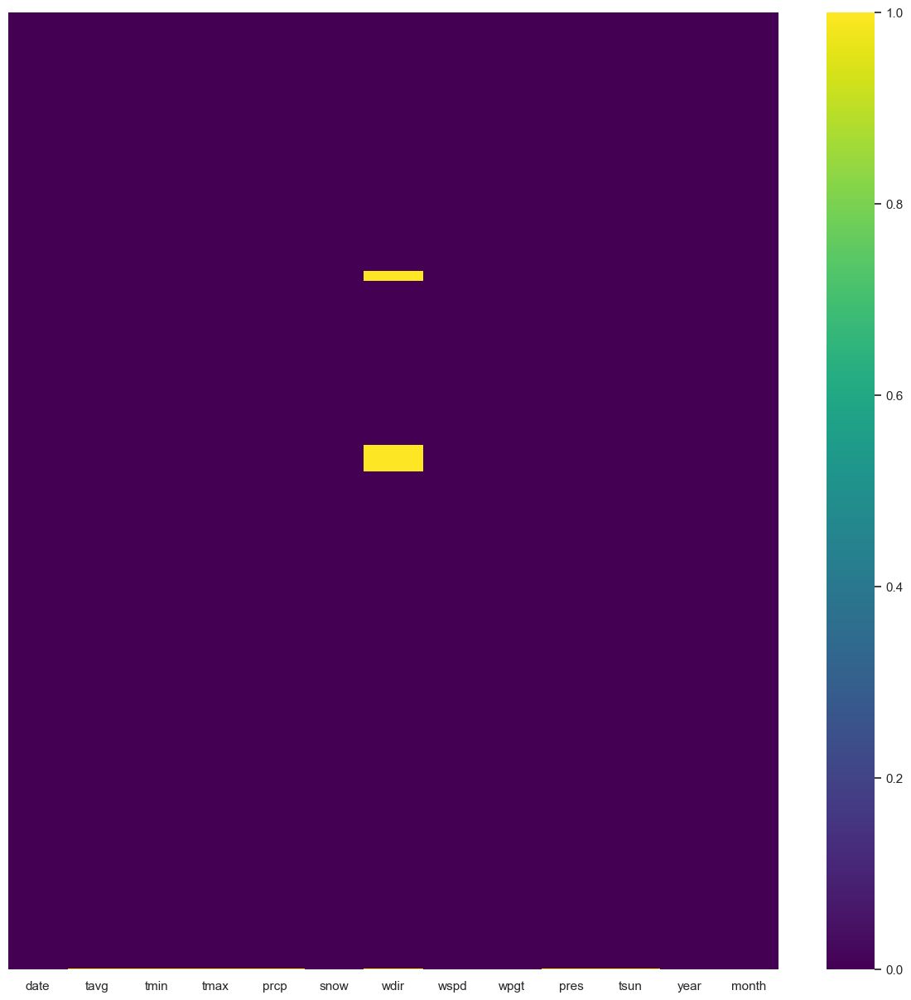

In [ ]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_weather.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

In [ ]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       2
snow       0
wdir     192
wspd       0
wpgt       0
pres       4
tsun       2
year       0
month      0
dtype: int64

## 4.2 dropping duplicates

In [ ]:
# check the number of rows before dropping duplicates RIVER
df_river.shape

(15288, 16)

In [ ]:
# drop duplicates RIVER
df_river_duplicates= df_river.drop_duplicates()
df_river_duplicates.shape

(15288, 16)

In [ ]:
# check the number of rows before dropping duplicates WEATHER
df_weather.shape

(4845, 13)

In [ ]:
df_weather_duplicates = df_weather.drop_duplicates()
df_weather_duplicates.shape

(4845, 13)

In [ ]:
### NO DUPLICATES AT ALL

## 4.3 managing outliers

In [ ]:
df_river.head(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
5,1980-11-06,4.7,4.7,4.7,75,82,64,5.59,22.19,0.01,0.26,51.4,58.8,41.3,1980,11
6,1980-11-07,6.1,6.1,6.1,62,72,44,4.58,16.04,0.01,0.19,39.4,48.8,24.8,1980,11
7,1980-11-08,7.7,7.7,7.7,56,65,43,11.34,40.00,0.01,0.46,34.5,42.2,24.0,1980,11
8,1980-11-09,7.5,7.5,7.5,55,64,43,13.53,42.45,0.02,0.49,33.3,41.2,24.0,1980,11
9,1980-11-10,7.6,7.6,7.6,48,60,40,15.29,42.92,0.02,0.50,27.8,37.6,21.8,1980,11


In [ ]:
df_weather.head(10)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
5,2011-06-06,16.9,12.7,24.6,13.1,0.0,244.0,8.6,55.1,1005.6,264.0,2011,6
6,2011-06-07,19.4,12.1,25.2,0.0,0.0,121.0,9.0,34.9,1004.3,624.0,2011,6
7,2011-06-08,15.5,12.5,19.3,1.9,0.0,261.0,12.6,51.5,1006.3,18.0,2011,6
8,2011-06-09,13.7,12.3,15.4,0.4,0.0,310.0,7.6,19.8,1014.9,0.0,2011,6
9,2011-06-10,14.4,10.9,18.6,0.0,0.0,329.0,6.8,21.2,1015.5,150.0,2011,6


In [ ]:
# don't have to differate in categorical and numerical, because there are only numerical variables
# RIVER:
#for col in df_river:
#  OutLiersBox(df_river, col)

In [ ]:
# looking deeper into the outliers water_level, suspendeds_solids-concentration, flow_rate
Q1 = df_river['avg_water_level'].quantile(.25)
Q3 = df_river['avg_water_level'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("water_level (avg): ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_water_level = df_river[(df_river['avg_water_level']) > upper_limit]
num_outliers_avg_water_level.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 563 rows -> a lot! in 43 years

water_level (avg):  40.0 lower limit=  -1.0 upper_limit=  159.0


563

In [ ]:
df_river['year'][df_river['avg_water_level']>159.0].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
# looking deeper into the outliers suspendeds_solids-concentration, flow_rate
Q1 = df_river['suspended_solids_concentration'].quantile(.25)
Q3 = df_river['suspended_solids_concentration'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'suspended_solids_concentration': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_sus_solids_concentration = df_river[(df_river['suspended_solids_concentration']) > upper_limit]
num_outliers_sus_solids_concentration.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 1390 rows -> a lot, in 43 years

'suspended_solids_concentration':  11.09 lower limit=  -9.974999999999998 upper_limit=  34.385


1390

In [ ]:
df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
df_river['date'][df_river['suspended_solids_concentration']>34.385] == df_river['date'][df_river['avg_water_level']>159.0]

ValueError: Can only compare identically-labeled Series objects

In [ ]:
# looking deeper into the outliers of flow_rate
Q1 = df_river['avg_flow_rate'].quantile(.25)
Q3 = df_river['avg_flow_rate'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'avg_flow_rate': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_flow_rate = df_river[(df_river['avg_flow_rate']) > upper_limit]
num_outliers_avg_flow_rate.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 854 rows -> a lot! in 43 years

'avg_flow_rate':  43.9 lower limit=  -33.74999999999999 upper_limit=  141.85


854

In [ ]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique() == df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [ ]:
# WEATHER:
#for col in df_weather:
   # OutLiersBox(df_weather, col)

# Creating the final dataframe

columns for swimming: 
- `max water temperature`
- `avg water level`
- `suspended solids concentration`
- `max flow rate`
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


## 1. river
- max water temperature: > 18 °C*
- avg water level: < 120 cm
- suspended solids concentration < 25 m3/s
- max flow rate: < 75 m3/s*


In [ ]:
df_river_final = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_river_final

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [ ]:
df_river_final.tail(20)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
15268,2024-08-12,21.3,108,487.95,43.5
15269,2024-08-13,21.4,113,487.97,48.8
15270,2024-08-14,21.0,118,487.96,54.5
15271,2024-08-15,20.8,134,487.95,87.5
15272,2024-08-16,20.6,117,487.95,60.3
15273,2024-08-17,20.3,115,487.97,53.0
15274,2024-08-18,20.2,117,487.88,67.7
15275,2024-08-19,18.6,167,487.77,167.0
15276,2024-08-20,17.3,165,487.72,155.0
15277,2024-08-21,18.0,143,481.78,95.4


In [ ]:
df_river_final.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

## 2. weather
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


In [ ]:
# creating dataframe to observate the suitability to go swimming in the Isar, values of the weather:
#df_swimming_weather = 
cols_weather_drop = ['tavg', 
                     'tmin',
                     'wdir',
                     'pres', 
                     'tsun',
                     'year',
                     'month'
                    ]
cols_weather_drop
df_weather_final = df_weather.drop(columns=cols_weather_drop)
df_weather_final


,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.00,44.60
1,2011-06-02,17.1,0.0,0.0,10.80,32.80
2,2011-06-03,23.8,0.0,0.0,15.10,43.60
3,2011-06-04,27.8,0.0,0.0,12.20,31.30
4,2011-06-05,27.1,4.7,0.0,9.70,67.70
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,0.0,7.20,22.00
2800,2024-09-02,27.2,0.0,0.0,7.60,30.20
2801,2024-09-03,28.9,0.0,0.0,5.40,18.70
2802,2024-09-04,NaN,NaN,0.0,8.43,29.83


In [ ]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   snow    4845 non-null   float64       
 4   wspd    4845 non-null   float64       
 5   wpgt    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [ ]:
df_weather_final.isna().sum()

date    0
tmax    2
prcp    2
snow    0
wspd    0
wpgt    0
dtype: int64

In [ ]:
# rows in Septemeber 2024 I drop:
df_weather_final = df_swimming_weather[df_swimming_weather['date']<='2024-08-31']
df_weather_final

,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.0,44.60
1,2011-06-02,17.1,0.0,0.0,10.8,32.80
2,2011-06-03,23.8,0.0,0.0,15.1,43.60
3,2011-06-04,27.8,0.0,0.0,12.2,31.30
4,2011-06-05,27.1,4.7,0.0,9.7,67.70
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,0.0,8.6,31.70
2795,2024-08-28,29.6,0.0,0.0,5.0,34.09
2796,2024-08-29,31.2,0.0,0.0,6.1,23.80
2797,2024-08-30,30.8,0.0,0.0,6.1,24.50


In [ ]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4840 entries, 0 to 2798
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4840 non-null   datetime64[ns]
 1   tmax    4840 non-null   float64       
 2   prcp    4840 non-null   float64       
 3   snow    4840 non-null   float64       
 4   wspd    4840 non-null   float64       
 5   wpgt    4840 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 264.7 KB


## 3. creating df_final

In [ ]:
#joining swimming-water and swimming-weather to one dataframe 

df_final= pd.merge(df_weather_final, df_river_final, 
                       how='left', on='date')
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 378.2 KB


In [ ]:
df_final.isna().sum()

date                                0
tmax                                0
prcp                                0
snow                                0
wspd                                0
wpgt                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

# 4. adding a variable "swimming" yes/no (1/0), "swimming_hardcore" yes/no (1/0) and "ice-bath" yes/no(1/0)

`swimming = 1, if...`
- `max water temperature: > 18 °C`
- `avg water level: > 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 75 m3/s`
- `max temperature: > 25 °C`
- `total precipitation < 30 mm/day`
- `avg windspeed <30km/h`
- `peak gust <50km/h`


In [ ]:
def determine_swimming(row):
	if (row['max_water_temperature'] > 18.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 75.0) and \
		(row['tmax'] > 25.0) and \
		(row['prcp'] < 30.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming']=df_final.apply(determine_swimming,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.swimming.value_counts()

swimming
0    4639
1     201
Name: count, dtype: int64

In [ ]:
def determine_swimming_hardcore_new(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0) and \
		(row['swimming'] == 0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore_new']=df_final.apply(determine_swimming_hardcore_new,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.swimming_hardcore_new.value_counts()

swimming_hardcore_new
0    4404
1     436
Name: count, dtype: int64

In [ ]:
df_final['swimming_hardcore'].value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [ ]:
# creating a 2nd variable swimming_hardcore with other conditions
def determine_swimming_hardcore(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore']=df_final.apply(determine_swimming_hardcore,axis=1)

In [ ]:
df_final.swimming_hardcore.value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [ ]:
# creating a 3rd variable "ice_bath":

def determine_ice_bath(row):
	if (row['max_water_temperature'] < 11.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 65.0) and \
		(row['tmax'] > -10.0) and \
		(row['prcp'] < 15.0) and \
		(row['wspd'] < 11.0) and \
		(row['wpgt'] < 50.0) and \
		(row['snow'] < 30.0):
		return 1
	return 0

#Apply to each row
df_final['ice_bath']=df_final.apply(determine_ice_bath,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.ice_bath.value_counts()

ice_bath
0    4087
1     753
Name: count, dtype: int64

In [ ]:
df_final = df_final.drop(columns=['swimming_harcore_new', 'swimming_harcore_new_new'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  swimming                        4840 non-null   int64         
 11  swim

In [ ]:
df_final.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4840,2018-01-15 01:52:45.619834624,2011-06-01 00:00:00,2014-09-22 18:00:00,2018-01-15 12:00:00,2021-05-09 06:00:00,2024-08-31 00:00:00,NaN
tmax,4840.0,15.632066,-9.7,8.6,15.6,22.9,36.9,9.031521
prcp,4840.0,2.633136,0.0,0.0,0.0,2.5,91.5,5.947421
snow,4840.0,4.950413,0.0,0.0,0.0,0.0,420.0,24.274503
wspd,4840.0,9.957729,0.7,7.2,9.0,11.5,36.7,4.203328
wpgt,4840.0,34.946771,9.4,24.1,31.7,42.1,119.9,14.695314
max_water_temperature,4122.0,11.254755,0.5,6.5,11.0,15.8,21.9,5.104476
avg_water_level,4122.0,91.763464,27.0,67.0,87.0,108.0,339.0,36.047982
suspended_solids_concentration,4122.0,28.684668,1.39,5.1825,8.805,14.57,2000.97,128.84849
max_flow_rate,4122.0,72.761815,14.8,35.4,56.2,89.475,603.0,57.466374


In [ ]:
df_final.head(20)

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath
0,2011-06-01,13.3,4.2,0.0,14.0,44.6,16.1,107.0,126.14,192.0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.8,13.2,82.0,114.69,98.7,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.6,14.8,62.0,90.89,60.0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.3,16.4,52.0,67.09,42.4,0,1,0
4,2011-06-05,27.1,4.7,0.0,9.7,67.7,17.1,49.0,43.29,43.6,0,0,0
5,2011-06-06,24.6,13.1,0.0,8.6,55.1,17.1,63.0,21.59,70.4,0,0,0
6,2011-06-07,25.2,0.0,0.0,9.0,34.9,16.7,56.0,16.26,45.5,0,1,0
7,2011-06-08,19.3,1.9,0.0,12.6,51.5,16.5,52.0,14.40,42.3,0,0,0
8,2011-06-09,15.4,0.4,0.0,7.6,19.8,14.9,52.0,12.55,45.2,0,0,0
9,2011-06-10,18.6,0.0,0.0,6.8,21.2,13.8,61.0,11.20,59.6,0,0,0


In [ ]:
df_final.to_csv("data_isar.csv", sep=';', decimal=',', index=False)

In [ ]:
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath,swimming_hardcore_new
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0,0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7,0,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0,0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4,0,1,0,1
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7,0,1,0,1
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0,0,1,0,1
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1,0,1,0,1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1,0,1,0,1


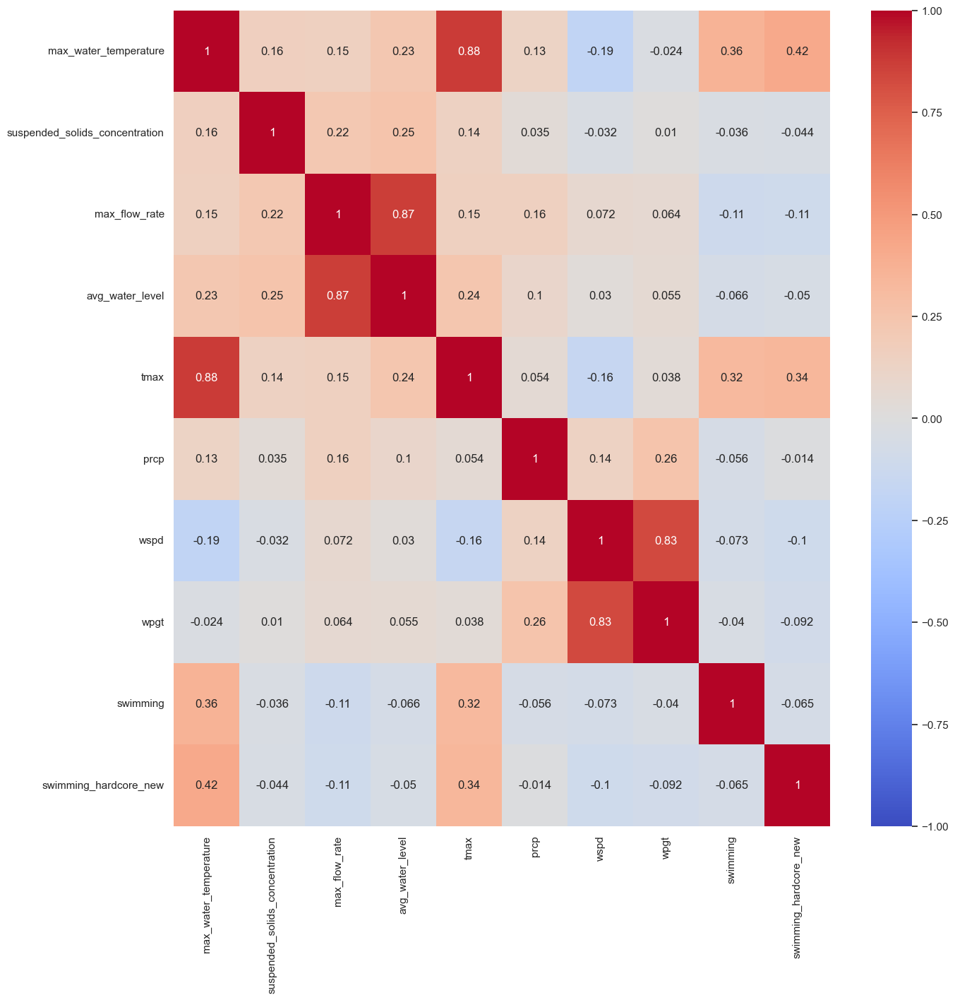

In [ ]:
# heatmap with all the variables and swimming-variables:
df_final_heatmap_swimming = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','swimming', 'swimming_hardcore_new']]
# Berechne die Korrelationsmatrix
correlation_matrix = df_final_heatmap_swimming.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

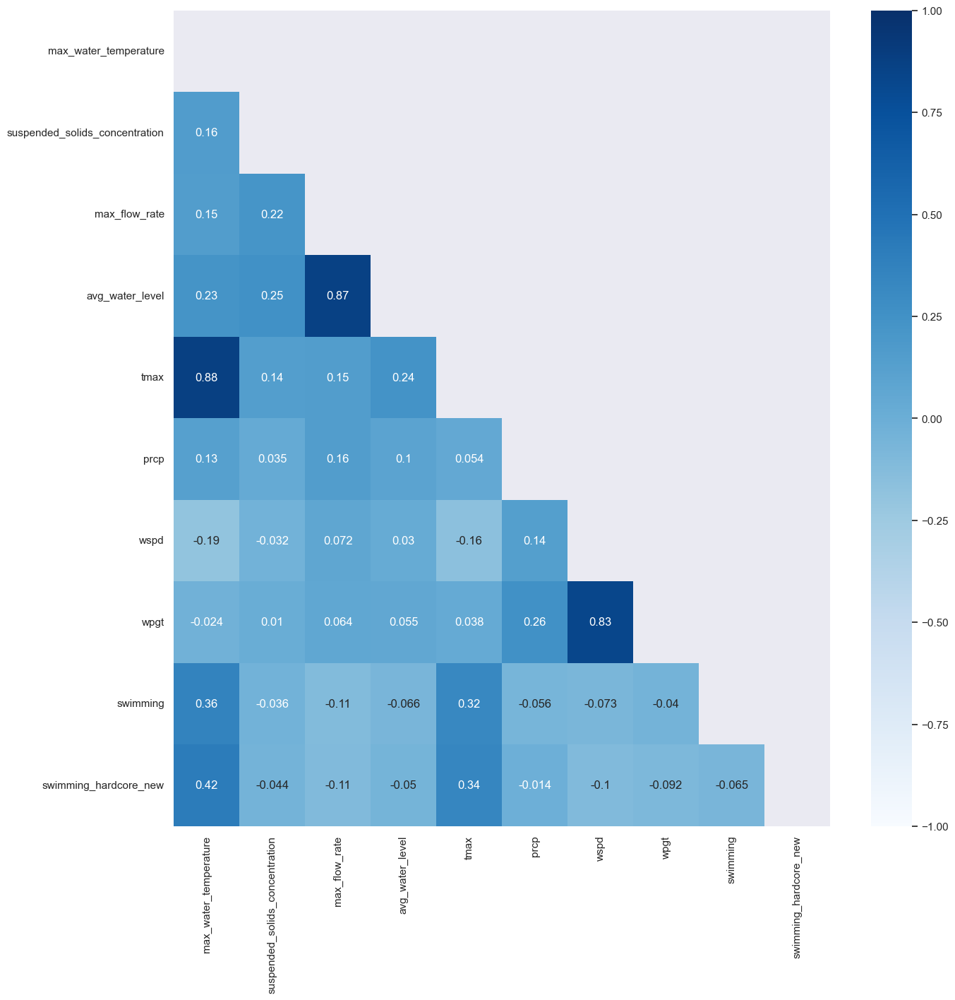

In [ ]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

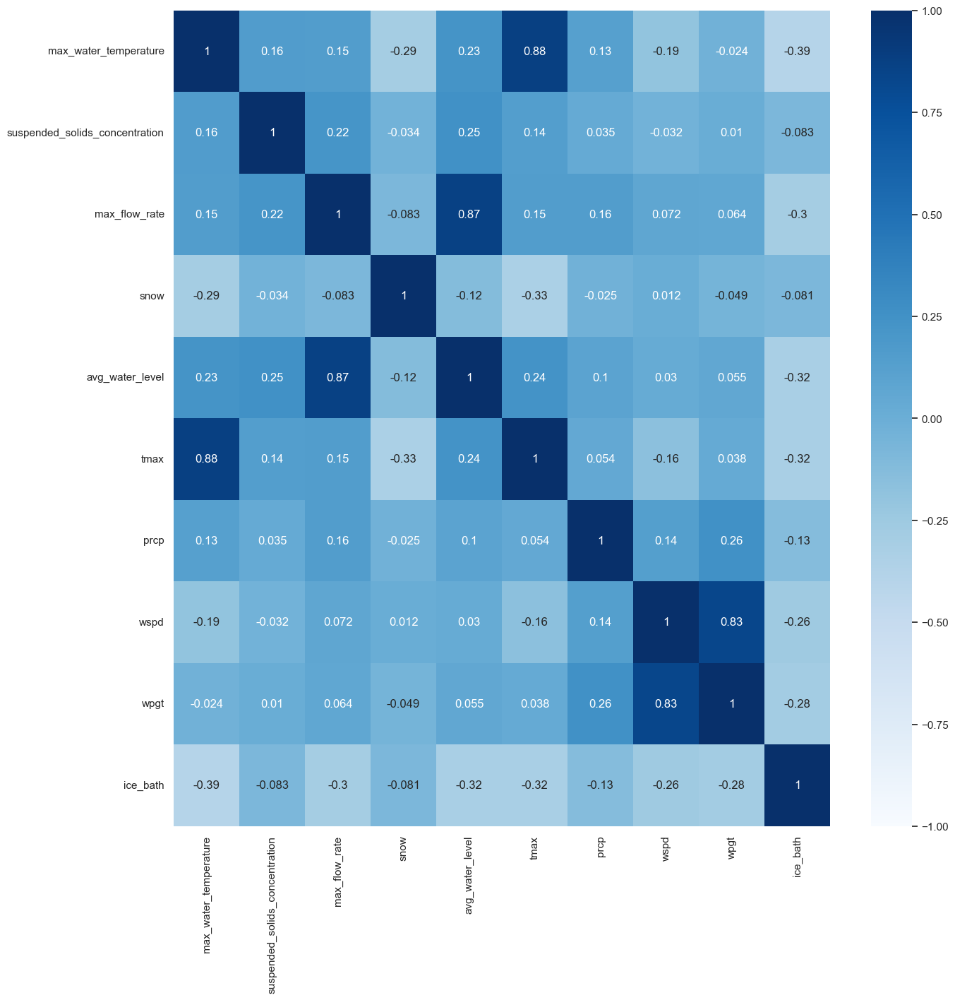

In [ ]:
# heatmap with all the variables and ice-bath-variables:
df_final_heatmap_ice = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','snow','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','ice_bath']]
# Berechne die Korrelationsmatrix
correlation_matrix_ice = df_final_heatmap_ice.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix_ice, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

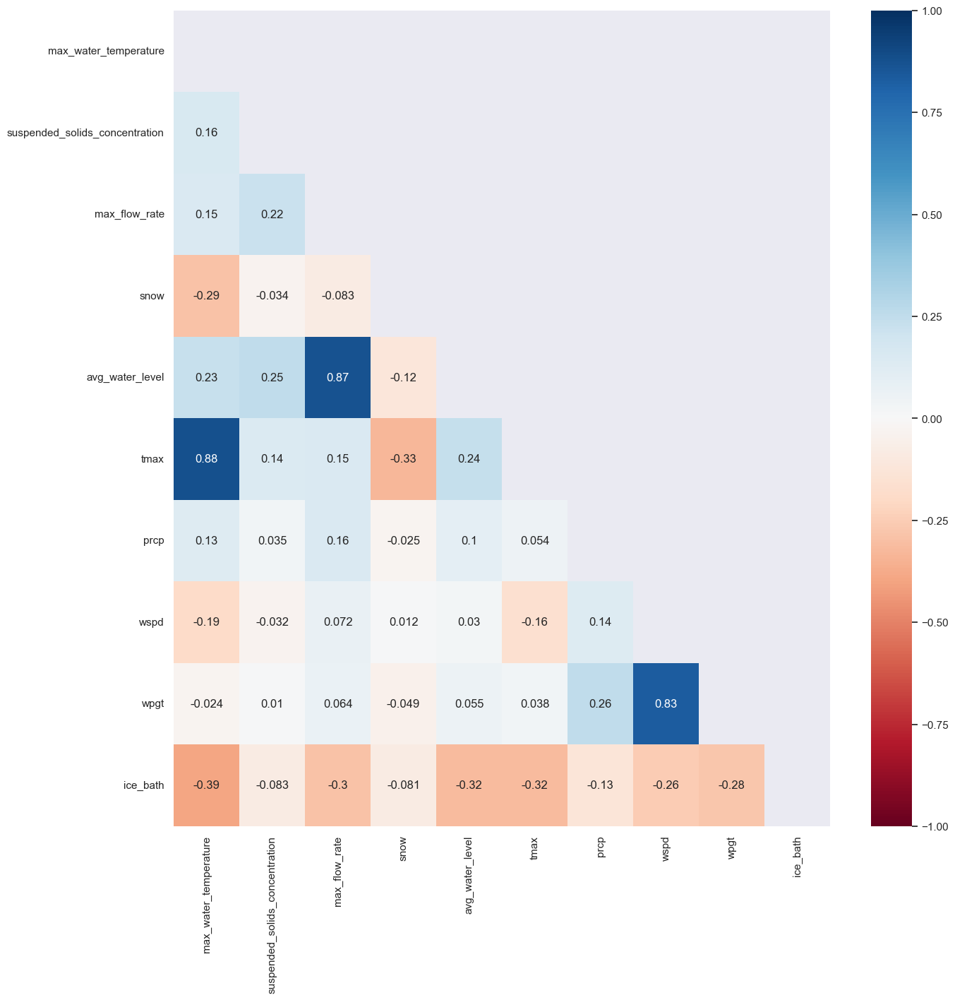

In [ ]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix_ice, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix_ice, mask=mask, annot=True, cmap="RdBu", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

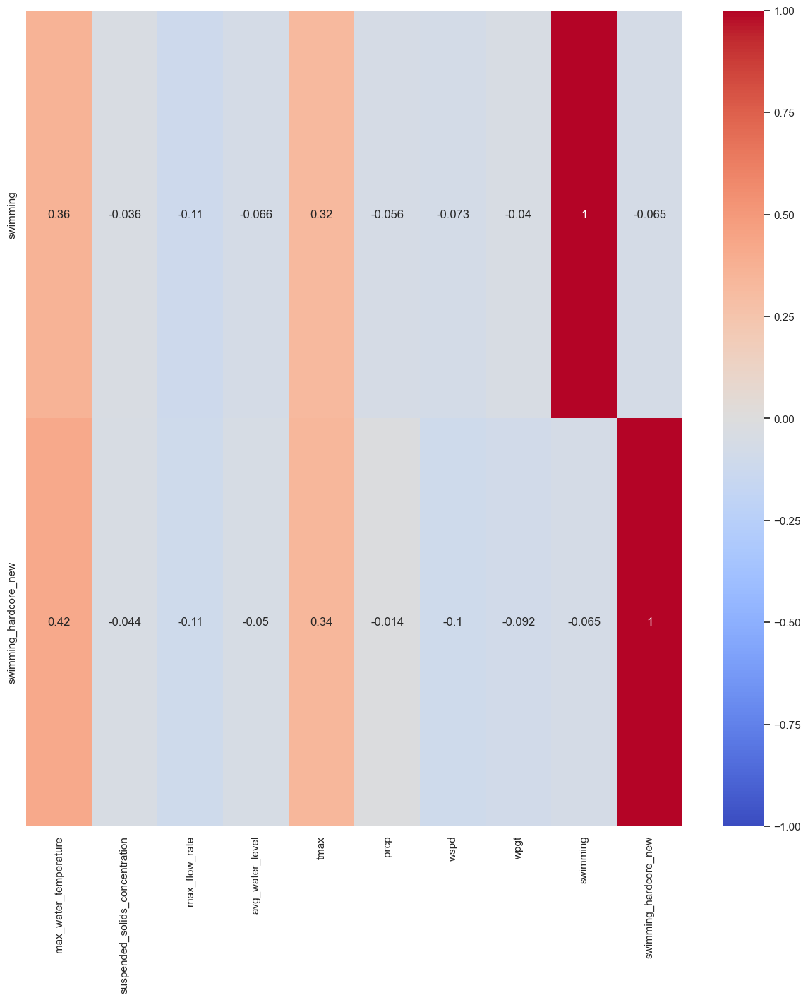

In [ ]:
# Filtere die Korrelationen nur für die zwei Zielvariablen (Var1, Var2)
correlation_focus = correlation_matrix.loc[['swimming', 'swimming_hardcore_new'], :]

# Heatmap für die zwei Variablen erstellen
sns.heatmap(correlation_focus, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

plt.show()

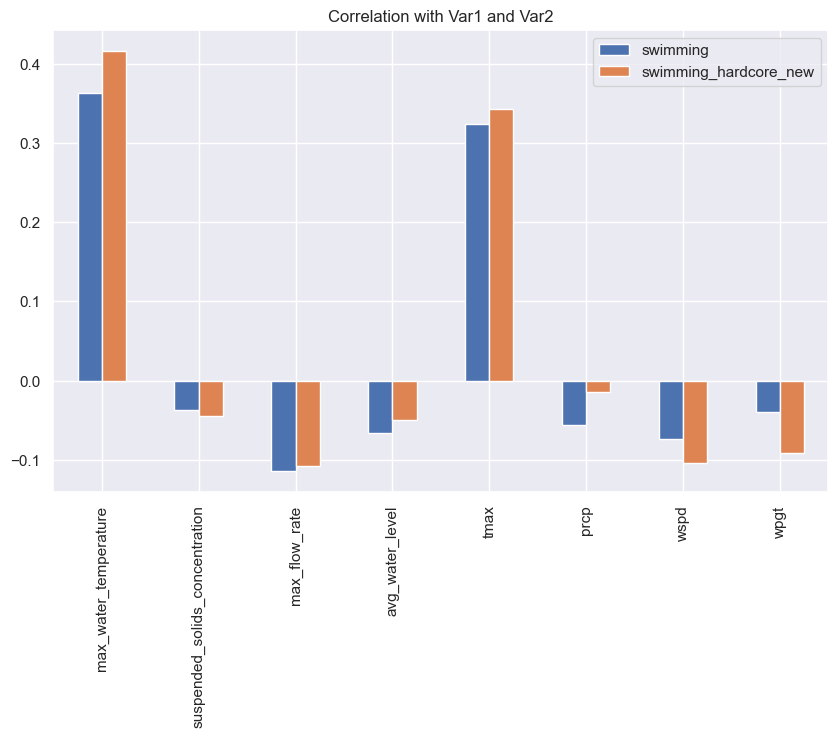

In [ ]:
# Korrelationen berechnen
correlation_focus = correlation_matrix[['swimming', 'swimming_hardcore_new']].drop(['swimming', 'swimming_hardcore_new'])

# Balkendiagramm erstellen
correlation_focus.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation with Var1 and Var2')
plt.show()

AttributeError: 'AxesImage' object has no property 'mask'

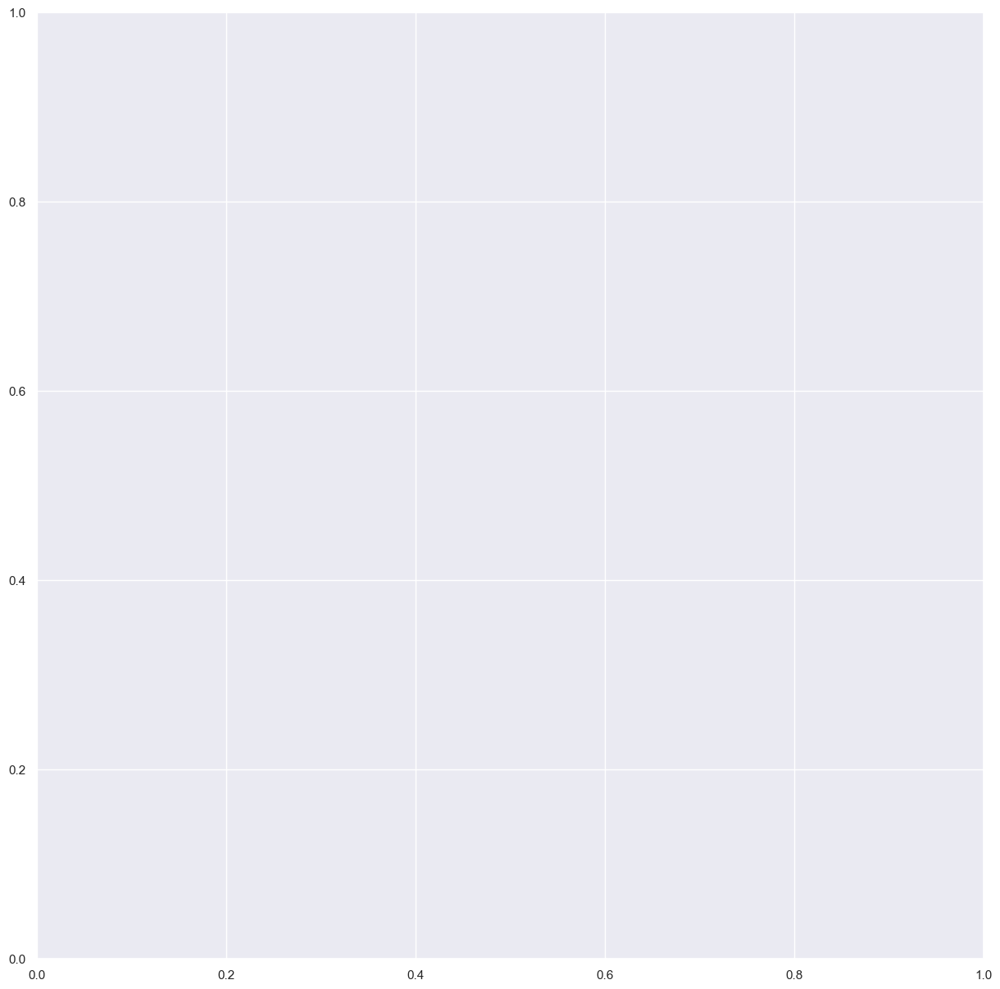

In [ ]:
# Heatmap mit Matplotlib und benutzerdefinierten Anpassungen
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest', vmax=1, vmin=0)
plt.colorbar()
plt.title('Custom Heatmap')
plt.grid(which='major', color='black', linestyle='-', linewidth=1)
plt.show()

## Creating A DataFrame For Water Quality

In [ ]:
df_water_quality

,Datum,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport
0,31.10.65,25,"47,85","0,02","0,55"
1,01.11.65,"18,06","32,47","0,01","0,38"
2,02.11.65,"11,57","20,55","0,01","0,24"
3,03.11.65,"11,11","27,77","0,01","0,32"
4,04.11.65,"9,88","26,54","0,01","0,31"
...,...,...,...,...,...
229,17.08.24,"487,97","1909,53","0,67","22,1"
230,18.08.24,"487,88","2010,8","0,71","23,27"
231,19.08.24,"487,77","5288,8","1,86","61,21"
232,20.08.24,"487,72","5090,98","1,79","58,92"


In [ ]:
df_concentration = df_water_quality[['Datum','suspended_solids_concentration']]
df_concentration

,Datum,suspended_solids_concentration
0,31.10.65,25
1,01.11.65,"18,06"
2,02.11.65,"11,57"
3,03.11.65,"11,11"
4,04.11.65,"9,88"
...,...,...
229,17.08.24,"487,97"
230,18.08.24,"487,88"
231,19.08.24,"487,77"
232,20.08.24,"487,72"


In [ ]:
# changing "Datum" into datetime for analyzing
df_concentration['date'] = pd.to_datetime(df_concentration['Datum'], dayfirst=True)
df_concentration

,Datum,suspended_solids_concentration,date
0,31.10.65,25,2065-10-31
1,01.11.65,"18,06",2065-11-01
2,02.11.65,"11,57",2065-11-02
3,03.11.65,"11,11",2065-11-03
4,04.11.65,"9,88",2065-11-04
...,...,...,...
229,17.08.24,"487,97",2024-08-17
230,18.08.24,"487,88",2024-08-18
231,19.08.24,"487,77",2024-08-19
232,20.08.24,"487,72",2024-08-20


In [ ]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [ ]:
# adding year, month into the dataframe
df_concentration['year']= df_concentration['date'].dt.year
df_concentration['month'] = df_concentration['date'].dt.month
df_concentration

,Datum,suspended_solids_concentration,date,year,month
0,31.10.65,25,2065-10-31,2065,10
1,01.11.65,"18,06",2065-11-01,2065,11
2,02.11.65,"11,57",2065-11-02,2065,11
3,03.11.65,"11,11",2065-11-03,2065,11
4,04.11.65,"9,88",2065-11-04,2065,11
...,...,...,...,...,...
229,17.08.24,"487,97",2024-08-17,2024,8
230,18.08.24,"487,88",2024-08-18,2024,8
231,19.08.24,"487,77",2024-08-19,2024,8
232,20.08.24,"487,72",2024-08-20,2024,8


In [ ]:
# dropping "Datum"
df_concentration= df_concentration.drop(columns='Datum')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,"18,06",2065-11-01,2065,11
2,"11,57",2065-11-02,2065,11
3,"11,11",2065-11-03,2065,11
4,"9,88",2065-11-04,2065,11
...,...,...,...,...
229,"487,97",2024-08-17,2024,8
230,"487,88",2024-08-18,2024,8
231,"487,77",2024-08-19,2024,8
232,"487,72",2024-08-20,2024,8


In [ ]:
# replacing komma into dot
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].str.replace(',', '.')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [ ]:
df_concentration_test = df_concentration[df_concentration['date']object.freq1000]
df_concentration

TypeError: Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`

In [ ]:
#changing suspended_solids_concentration into a float
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].astype(dtype='float64')
df_concentration


,suspended_solids_concentration,date,year,month
0,25.00,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


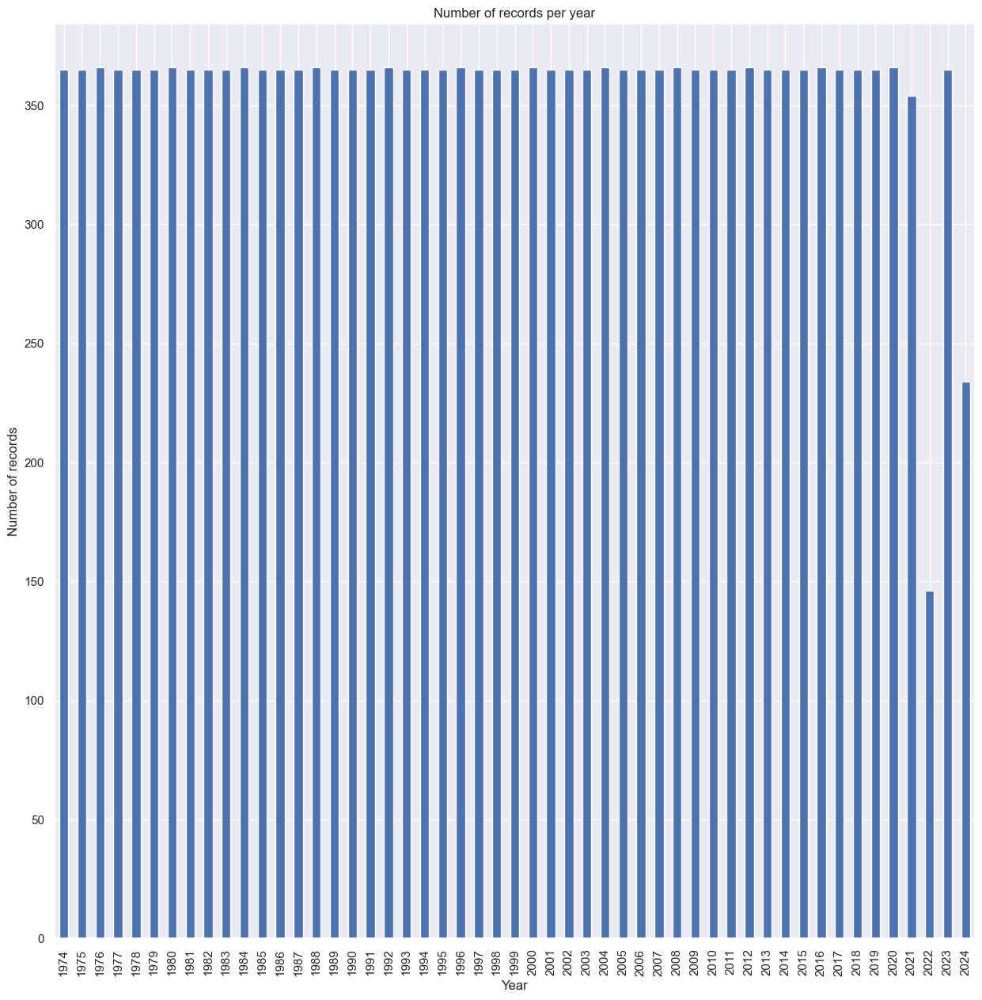

In [ ]:
# plot of records per year to find out, if there's a lot of missing data
concentration_per_year = df_concentration.groupby('year').size()

concentration_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [ ]:
df_concentration.year.unique()

array([2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021, 2022, 2023, 2024], dtype=int32)

In [ ]:
duplicate_indices = df_concentration[df_concentration.index.duplicated()]
print(duplicate_indices)

     suspended_solids_concentration       date  year  month
0                              9.24 2024-01-01  2024      1
1                              9.23 2024-01-02  2024      1
2                              9.22 2024-01-03  2024      1
3                              9.15 2024-01-04  2024      1
4                              9.02 2024-01-05  2024      1
..                              ...        ...   ...    ...
229                          487.97 2024-08-17  2024      8
230                          487.88 2024-08-18  2024      8
231                          487.77 2024-08-19  2024      8
232                          487.72 2024-08-20  2024      8
233                          481.78 2024-08-21  2024      8

[234 rows x 4 columns]


In [ ]:
df_concentration = df_concentration[df_concentration['year'] <= 2024]
df_concentration

,suspended_solids_concentration,date,year,month
2984,7.77,1974-01-01,1974,1
2985,8.38,1974-01-02,1974,1
2986,10.34,1974-01-03,1974,1
2987,16.67,1974-01-04,1974,1
2988,18.40,1974-01-05,1974,1
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [ ]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [ ]:
# exporting the quality data
df_concentration.to_csv("data_quality.csv", sep=';', decimal=',', index=False)

## Creating A DataFrame For Water Level

In [ ]:
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level
0,01.11.73,50,58,44
1,02.11.73,45,53,43
2,03.11.73,49,57,43
3,04.11.73,45,57,31
4,05.11.73,46,52,35
...,...,...,...,...
239,27.08.24,130,137,121
240,28.08.24,117,121,113
241,29.08.24,114,116,110
242,30.08.24,114,116,108


In [ ]:
# changing "Datum" into datetime for analyzing
df_water_level['date'] = pd.to_datetime(df_water_level['Datum'], dayfirst=True)
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date
0,01.11.73,50,58,44,2073-11-01
1,02.11.73,45,53,43,2073-11-02
2,03.11.73,49,57,43,2073-11-03
3,04.11.73,45,57,31,2073-11-04
4,05.11.73,46,52,35,2073-11-05
...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27
240,28.08.24,117,121,113,2024-08-28
241,29.08.24,114,116,110,2024-08-29
242,30.08.24,114,116,108,2024-08-30


In [ ]:
# adding year, month into the dataframe
df_water_level['year'] = df_water_level['date'].dt.year
df_water_level['month'] = df_water_level['date'].dt.month
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
0,01.11.73,50,58,44,2073-11-01,2073,11
1,02.11.73,45,53,43,2073-11-02,2073,11
2,03.11.73,49,57,43,2073-11-03,2073,11
3,04.11.73,45,57,31,2073-11-04,2073,11
4,05.11.73,46,52,35,2073-11-05,2073,11
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [ ]:
# no replacing necessesary, because they are integers
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Datum            18567 non-null  object        
 1   avg_water_level  18567 non-null  int64         
 2   max_water_level  18567 non-null  int64         
 3   min_water_level  18567 non-null  int64         
 4   date             18567 non-null  datetime64[ns]
 5   year             18567 non-null  int32         
 6   month            18567 non-null  int32         
dtypes: datetime64[ns](1), int32(2), int64(3), object(1)
memory usage: 1015.4+ KB


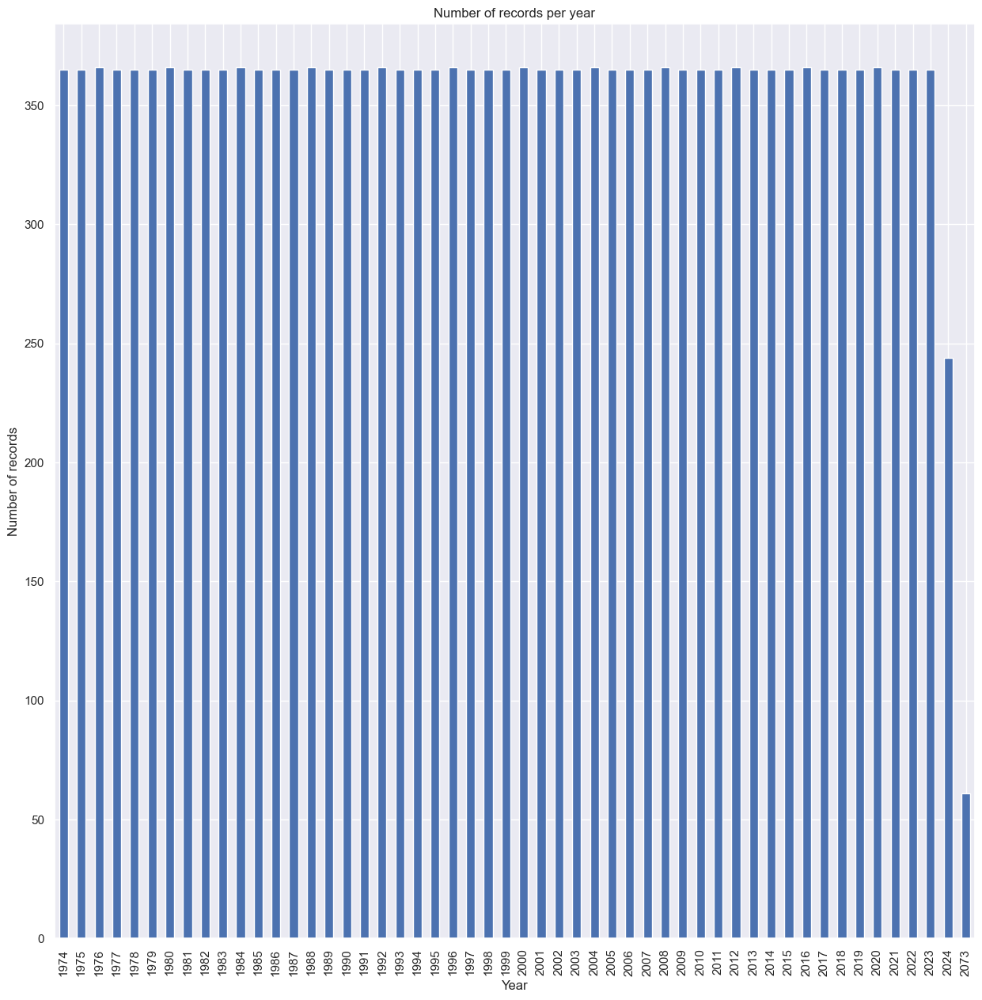

In [ ]:
# finding out, if there a missing data:
# plot of records per year to find out, if there's a lot of missing data
water_level_per_year = df_water_level.groupby('year').size()

water_level_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [ ]:
df_water_level_new = df_water_level[df_water_level['year'] <= 2024]
df_water_level_new

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
61,01.01.74,46,54,38,1974-01-01,1974,1
62,02.01.74,44,55,35,1974-01-02,1974,1
63,03.01.74,51,55,47,1974-01-03,1974,1
64,04.01.74,56,64,45,1974-01-04,1974,1
65,05.01.74,53,57,33,1974-01-05,1974,1
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [ ]:
# adding 3 columns: water alert level 1, 2, 3 and 4
# there are specific actions the city of munich take if the water level reaches one of them
# water alert level 1 = 240 cm, 300 cm, 380 cm, 520 cm

df_water_level_new['water_alert_level1'] = df_water_level_new['max_water_level']

In [ ]:
def determine_alert(row):
	if (row['max_water_level'] > 520.0):
		return 4
	elif (row['max_water_level'] > 380.0):
	    return 3
	elif (row['max_water_level'] > 300.0):
		return 2
	elif (row['max_water_level'] > 240.0):
		return 1
	return 0


#Apply to each row
df_water_level_new['water_alert_level']=df_water_level_new.apply(determine_alert,axis=1)


In [ ]:
df_water_level_new.isna().sum()

Datum                0
avg_water_level      0
max_water_level      0
min_water_level      0
date                 0
year                 0
month                0
water_alert_level    0
dtype: int64

In [ ]:
df_water_level_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18506 entries, 61 to 243
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Datum              18506 non-null  object        
 1   avg_water_level    18506 non-null  int64         
 2   max_water_level    18506 non-null  int64         
 3   min_water_level    18506 non-null  int64         
 4   date               18506 non-null  datetime64[ns]
 5   year               18506 non-null  int32         
 6   month              18506 non-null  int32         
 7   water_alert_level  18506 non-null  int64         
dtypes: datetime64[ns](1), int32(2), int64(4), object(1)
memory usage: 1.1+ MB


In [ ]:
df_water_level_new['water_alert_level'].value_counts()

water_alert_level
0    18336
1      116
2       36
3       17
4        1
Name: count, dtype: int64

In [ ]:

df_water_level_new[df_water_level_new['max_water_level']>520.0]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level
11619,24.08.05,495,542,451,2005-08-24,2005,8,1


In [ ]:
# creating 4 variables: 

def determine_alert1(row):
	if (row['water_alert_level'] == 1):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert1']=df_water_level_new.apply(determine_alert1,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 1]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
259,18.07.74,255,295,201,1974-07-18,1974,7,1,1,1.0,1.0,1.0,1,0
261,20.07.74,254,273,238,1974-07-20,1974,7,1,1,1.0,1.0,1.0,1,0
262,21.07.74,237,250,228,1974-07-21,1974,7,1,1,1.0,1.0,1.0,1,0
263,22.07.74,222,244,202,1974-07-22,1974,7,1,1,1.0,1.0,1.0,1,0
607,01.07.75,237,278,177,1975-07-01,1975,7,1,1,1.0,1.0,1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,06.06.24,230,247,221,2024-06-06,2024,6,1,1,1.0,1.0,1.0,1,0
158,07.06.24,262,266,247,2024-06-07,2024,6,1,1,1.0,1.0,1.0,1,0
159,08.06.24,240,268,220,2024-06-08,2024,6,1,1,1.0,1.0,1.0,1,0
161,10.06.24,239,250,212,2024-06-10,2024,6,1,1,1.0,1.0,1.0,1,0


In [ ]:
df_water_level_new['alert1'].value_counts()

alert1
0    18390
1      116
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert2(row):
	if (row['water_alert_level'] == 2):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert2']=df_water_level_new.apply(determine_alert2,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 2]



,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
260,19.07.74,275,301,257,1974-07-19,1974,7,2,0,1,NaN,NaN,0,1
1369,01.08.77,286,330,195,1977-08-01,1977,8,2,0,1,NaN,NaN,0,1
2054,17.06.79,238,312,181,1979-06-17,1979,6,2,0,1,NaN,NaN,0,1
2057,20.06.79,304,322,283,1979-06-20,1979,6,2,0,1,NaN,NaN,0,1
2817,19.07.81,247,317,175,1981-07-19,1981,7,2,0,1,NaN,NaN,0,1
2821,23.07.81,308,358,267,1981-07-23,1981,7,2,0,1,NaN,NaN,0,1
4297,07.08.85,313,351,273,1985-08-07,1985,8,2,0,1,NaN,NaN,0,1
4298,08.08.85,299,347,273,1985-08-08,1985,8,2,0,1,NaN,NaN,0,1
7883,02.06.95,276,313,227,1995-06-02,1995,6,2,0,1,NaN,NaN,0,1
7884,03.06.95,316,334,296,1995-06-03,1995,6,2,0,1,NaN,NaN,0,1


In [ ]:
df_water_level_new['alert2'].value_counts()

alert2
0    18470
1       36
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert3(row):
	if (row['water_alert_level'] == 3):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert3']=df_water_level_new.apply(determine_alert3,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 3]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
2055,18.06.79,383,424,312,1979-06-18,1979,6,3,0,0,1,NaN,0,0
2056,19.06.79,358,402,322,1979-06-19,1979,6,3,0,0,1,NaN,0,0
2818,20.07.81,389,424,317,1981-07-20,1981,7,3,0,0,1,NaN,0,0
2819,21.07.81,387,395,382,1981-07-21,1981,7,3,0,0,1,NaN,0,0
2820,22.07.81,376,390,358,1981-07-22,1981,7,3,0,0,1,NaN,0,0
9333,22.05.99,442,469,334,1999-05-22,1999,5,3,0,0,1,NaN,0,0
9334,23.05.99,450,467,434,1999-05-23,1999,5,3,0,0,1,NaN,0,0
9335,24.05.99,432,436,425,1999-05-24,1999,5,3,0,0,1,NaN,0,0
9336,25.05.99,414,439,389,1999-05-25,1999,5,3,0,0,1,NaN,0,0
9337,26.05.99,350,391,311,1999-05-26,1999,5,3,0,0,1,NaN,0,0


In [ ]:
df_water_level_new.alert3.value_counts()

alert3
0    18489
1       17
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert4(row):
	if (row['water_alert_level'] == 4):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert4']=df_water_level_new.apply(determine_alert4,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 4]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
11619,24.08.05,495,542,451,2005-08-24,2005,8,4,0,0,0,1,0,0


In [ ]:
df_water_level_new.to_csv("waterlevel.csv", sep=';', decimal=",", index=False)

In [ ]:
df_water_level_new[df_water_level_new['month']==12].describe().T
                   # df_water_level_new['max_water_level']>200) &

,count,mean,min,25%,50%,75%,max,std
avg_water_level,1550.0,67.024516,20.0,48.0,61.0,82.0,206.0,27.55415
max_water_level,1550.0,74.153548,21.0,54.0,69.0,89.0,223.0,30.060123
min_water_level,1550.0,60.507097,16.0,43.0,54.0,75.0,188.0,25.581115
date,1550,1999-06-16 17:45:36,1974-12-01 00:00:00,1986-12-16 06:00:00,1999-06-16 12:00:00,2011-12-15 18:00:00,2023-12-31 00:00:00,NaN
year,1550.0,1998.5,1974.0,1986.0,1998.5,2011.0,2023.0,14.435527
month,1550.0,12.0,12.0,12.0,12.0,12.0,12.0,0.0
water_alert_level,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert1,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert2,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert3,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## DataFrame Floods (water level, flow rate and precitation)


In [ ]:
#

# Looking deeper into the data

# HiER NOCHMAL CHECKEN UND DANN RAUSWERFEN!!!!

# ICE BATH
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`


In [ ]:
df_river.columns

Index(['date', 'avg_water_temperature', 'max_water_temperature',
       'min_water_temperature', 'avg_water_level', 'max_water_level',
       'min_water_level', 'suspended_solids_concentration',
       'suspended_solid_load', 'suspended_sediment_erosion',
       'suspended_sediment_transport', 'avg_flow_rate', 'max_flow_rate',
       'min_flow_rate', 'year', 'month'],
      dtype='object')

In [ ]:
df_ice_bath_river = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_ice_bath_river

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [ ]:
df_ice_bath_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 5 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   max_water_temperature           15288 non-null  float64       
 2   avg_water_level                 15288 non-null  int64         
 3   suspended_solids_concentration  15288 non-null  float64       
 4   max_flow_rate                   15288 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 597.3 KB


In [ ]:
df_ice_bath_river.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath_weather = df_weather[['date', 'tmax', 'prcp', 'wspd', 'wpgt', 'snow']]
df_ice_bath_weather

,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.00,44.60,0.0
1,2011-06-02,17.1,0.0,10.80,32.80,0.0
2,2011-06-03,23.8,0.0,15.10,43.60,0.0
3,2011-06-04,27.8,0.0,12.20,31.30,0.0
4,2011-06-05,27.1,4.7,9.70,67.70,0.0
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,7.20,22.00,0.0
2800,2024-09-02,27.2,0.0,7.60,30.20,0.0
2801,2024-09-03,28.9,0.0,5.40,18.70,0.0
2802,2024-09-04,NaN,NaN,8.43,29.83,0.0


In [ ]:
df_ice_bath_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   wspd    4845 non-null   float64       
 4   wpgt    4845 non-null   float64       
 5   snow    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [ ]:
# rows in Septemeber 2024 I drop:
df_ice_bath_weather = df_ice_bath_weather[df_ice_bath_weather['date']<='2024-08-31']
df_ice_bath_weather


,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.0,44.60,0.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0
2,2011-06-03,23.8,0.0,15.1,43.60,0.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0
4,2011-06-05,27.1,4.7,9.7,67.70,0.0
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,8.6,31.70,0.0
2795,2024-08-28,29.6,0.0,5.0,34.09,0.0
2796,2024-08-29,31.2,0.0,6.1,23.80,0.0
2797,2024-08-30,30.8,0.0,6.1,24.50,0.0


In [ ]:
#joining water and weather datasets by date:
df_ice_bath = pd.merge(df_ice_bath_weather, df_ice_bath_river, how='left', on='date')
df_ice_bath

,date,tmax,prcp,wspd,wpgt,snow,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,14.0,44.60,0.0,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,15.1,43.60,0.0,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,9.7,67.70,0.0,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,8.6,31.70,0.0,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,5.0,34.09,0.0,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,6.1,23.80,0.0,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,6.1,24.50,0.0,19.8,114.0,34.95,46.1


In [ ]:
df_ice_bath.isna().sum()

date                                0
tmax                                0
prcp                                0
wspd                                0
wpgt                                0
snow                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

## Adding a variable "ice_bath"
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath['ice_bath'].value_counts()

ice_bath
0    3874
1     966
Name: count, dtype: int64

In [ ]:
df_ice_bath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   wspd                            4840 non-null   float64       
 4   wpgt                            4840 non-null   float64       
 5   snow                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  ice_bath                        4840 non-null   int64         
dtypes: d

In [ ]:
df_ice_bath.to_csv("ice_bath.csv", index=False)

# TESTSTATION

## result over all columns by using OutLiersBox:
- variables with suspected outliers: Social support, Generosity, Perceptions of corruption
- should I substitute them with the frequent value? 

In [ ]:
# other observations for the outliers:
data_social_support = happy_data_clean['Social support']
data_social_support
sns.distplot(data_social_support)#, kde=True)
plt.title('Histogram of social support')
plt.show()

NameError: name 'happy_data_clean' is not defined

In [ ]:
# how much outliers are there in social Support?
Q1 = happy_data_clean['Social support'].quantile(.25)
Q3 = happy_data_clean['Social support'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For social support: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Social support']) < lower_limit]
num_outliers_social_support#.shape[0] #['Social support'].counts()

# Conclusion: only 7 outliers. delete?

In [ ]:
# how much outliers are there in perception of corruption?
Q1 = happy_data_clean['Perceptions of corruption'].quantile(.25)
Q3 = happy_data_clean['Perceptions of corruption'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Perceptions of corruption: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Perceptions of corruption']) > upper_limit]
num_outliers_social_support.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 31 rows -> not that few. so I have to substitute the outliers with the mode? Median?

In [ ]:
# how much outliers are there in generosity?
Q1 = happy_data_clean['Generosity'].quantile(.25)
Q3 = happy_data_clean['Generosity'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Generosity: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Generosity']) > upper_limit]
num_outliers_social_support#.shape[0] #['Generosity'].counts()

# Conclusion: only 4 rows. Delete?

In [ ]:
happy_data_IQR = happy_data_clean.copy()
for column in happy_data_IQR:
    #print(column)
    if happy_data_IQR[column].dtype != 'object':
        Q1 = happy_data_IQR[column].quantile(.25)
        Q3 = happy_data_IQR[column].quantile(.75)
        IQR = Q3 - Q1
        lower_limit = (Q1 - 1.5 * IQR)
        upper_limit = (Q3 + 1.5 * IQR)
        
        print(column,lower_limit, upper_limit)
        happy_data_IQR=happy_data_IQR[(happy_data_IQR[column] > lower_limit) &
                      (happy_data_IQR[column] < upper_limit)]

In [ ]:
data_social_support.describe()

In [ ]:
# using apply and lambda to do it for all columns faster.

happy_data_clean.apply(lambda col: OutLiersBox(happy_data_clean, happy_data_clean.columns[col]))

In [ ]:
# Exercise 1.Tell a story with your dataset, to try to answer the following question:

"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

## Step 5: Formating the data for answering the questions
- creating new datasats, selected one
- trying out graphs

In [ ]:
# because there are 2 years I split the dataset in 2 years
happy_data_2018 = happy_data_clean[(happy_data.year == 2018)]
happy_data_2019 = happy_data_clean[(happy_data.year == 2019)]

In [ ]:
happy_data_2018

In [ ]:
happy_data_2019

In [ ]:
# nans in healthy life expectancy: are they distributed over the 2 years?
happy_data_2018['Healthy life expectancy'].isnull().sum()
happy_data_2018 = happy_data_2018.drop(columns='year')
happy_data_2018

In [ ]:
happy_data_2019['Healthy life expectancy'].isnull().sum()
happy_data_2019 = happy_data_2019.drop(columns='year')
happy_data_2019

In [ ]:
#looking into the dataset of Healthy life expectancy, where are values:
happy_data_2018_country_health = happy_data_2018[['Country or region', 'Healthy life expectancy']]
happy_data_2018_country_health['Healthy life expectancy'].unique()

# später weiter! Gerade nicht so wichtig.

In [ ]:
# numerical variables

numerical_happy_data = happy_data_clean.select_dtypes(include=['int64','float'])
numerical_happy_data
numerical_happy_data1 = numerical_happy_data.drop(columns="Healthy life expectancy")

In [ ]:
# categorical variables

categorical_happy_data = happy_data_clean.select_dtypes(include=['category', 'object'])
categorical_happy_data

In [ ]:
"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

In [ ]:
# plotting correlations between the score and the dimensions
sns.pairplot(numerical_happy_data1)
plt.show()

In [ ]:
# because nothing works, I start with on variable: score and GDP per capita
#fig = sns.scatterplot(happy_data_2018, x='Score', y='GDP per capita')
#fig.show()
#Healthy life expectancy	Freedom to make life choices	Generosity	Perceptions of corruption

fig, ax = plt.subplot(3, 2, figsize=(20, 20))

# Option 1 : Scatter plot by default
sns.scatterplot(data=happy_data_clean, x='Score', y='GDP per capita', 
                alpha=0.7, ax=ax[0][0])


# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Social support', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

# Option 3 : Add style & color
sns.scatterplot(data=happy_data_clean, x='Score', y='Freedom to make life choices', 
                style=df['gender'].to_list(), 
                color='green',
                alpha=0.5, ax=ax[1][0])

# Option 4 : add size & color 
sns.scatterplot(data=happy_data_clean, x='Score', y='Generosity', 
                size=df['parental level of education'].to_list(), 
                color='brown', alpha=0.5, ax=ax[1][1])
sns:scatterplot(data=happy_data_clean, x="Score", y=)

# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Perception of corruption', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

plt.show()

In [ ]:
# - 2 Variables
# - visualizations is the focus
# - find questions I want to answer

In [ ]:
import plotly.express as px
fig = px.histogram(df_river, x="year", y="suspended_sediment_transport")
fig.show()

#suspended_solids_concentration  15258 non-null  object        
# 11  suspended_solid_load            15258 non-null  object        
## 12  suspended_sediment_erosion      15258 non-null  object        
# 13  suspended_sediment_transport    15258 non-null  object 

In [ ]:
# suspended solids under 20, 25
df_solids_under_25 = df_river[df_river['suspended_solids_concentration'] < 25]
df_solids_under_20 = df_river[df_river['suspended_solids_concentration'] <= 20]


In [ ]:
df_solids_under_20.shape[0]

12125

In [ ]:
df_solids_under_25.shape[0]

13104

In [ ]:
# river flow rate under 75
df_river_flowrate_under_50 = df_river[df_river['avg_flow_rate'] < 50]

In [ ]:
df_river_flowrate_under_50.shape[0]

7663

In [ ]:
# precipitation:
df_weather_prcp_under_40 = df_weather[df_weather['prcp']<40]

In [ ]:
df_weather_prcp_under_40.shape[0]

4821

In [ ]:
# temperature (avg) over 25°C
df_temp_over_25 = df_weather[df_weather['tmax']>=25]

In [ ]:
df_temp_over_25.shape[0]

873

In [ ]:
# distribution temperature:
fig_temp = px.histogram(df_weather, x="date", y="tavg")
fig_temp.show()

In [ ]:
# RIVER - water quality
# first loading all the files into seperate DataFrames for each variable
# Jan - August 2024:
path_water_quality = "../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv"
path_water_level = "../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv"
path_daily_water_temperatures = "../datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv"

df_river_flow_rate = pd.read_csv(path_river_flow_rate, sep=";")
#df_river_water_quality = pd.read_csv(path_water_quality, sep=";")
df_river_water_level = pd.read_csv(path_water_level, sep=";")
#df_river_daily_water_temperatures = pd.read_csv(path_daily_water_temperatures, sep=";")

df_river_flow_rate
#df_river_water_quality
#df_river_water_level
#df_river_daily_water_temperatures

# JOINING RIVER AND WEATHER

In [ ]:
df_merged = pd.merge(df_river, df_weather, how='left', on = 'date')
df_merged

ValueError: The column label 'date' is not unique.

In [ ]:
df_merged.shape

(15288, 27)

In [ ]:
df_merged.tail(20)

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
15268,2024-08-12,8,2024,12.08.24,"20,6","21,3","19,8",108,114,104,...,25.5,18.4,31.7,0.0,0.0,49.0,5.8,28.1,1012.3,660.0
15269,2024-08-13,8,2024,13.08.24,"20,7","21,4","19,7",113,118,108,...,24.8,18.9,32.6,1.2,0.0,168.0,9.7,57.2,1010.2,656.0
15270,2024-08-14,8,2024,14.08.24,"20,2",21,"19,1",118,122,113,...,23.0,17.1,31.0,4.1,0.0,235.0,9.0,54.7,1011.6,654.0
15271,2024-08-15,8,2024,15.08.24,"19,8","20,8","18,5",134,144,117,...,22.4,16.7,28.2,0.0,0.0,38.0,6.5,23.8,1016.4,786.0
15272,2024-08-16,8,2024,16.08.24,"19,7","20,6","18,7",117,126,107,...,24.5,19.0,29.8,0.5,0.0,313.0,5.0,23.4,1015.1,558.0
15273,2024-08-17,8,2024,17.08.24,"19,8","20,3","19,1",115,121,106,...,22.4,19.1,26.1,2.4,0.0,309.0,6.1,27.4,1012.5,303.0
15274,2024-08-18,8,2024,18.08.24,"19,3","20,2","18,6",117,131,105,...,19.1,16.3,21.9,54.5,0.0,269.0,9.7,40.7,1009.0,20.0
15275,2024-08-19,8,2024,19.08.24,"17,5","18,6","16,7",167,192,127,...,15.7,14.6,17.0,5.7,0.0,293.0,9.7,31.7,1016.1,0.0
15276,2024-08-20,8,2024,20.08.24,"16,9","17,3","16,5",165,185,148,...,17.3,15.7,20.1,0.0,0.0,102.0,6.1,22.3,1013.5,59.0
15277,2024-08-21,8,2024,21.08.24,"17,3",18,"16,7",143,149,135,...,17.7,12.5,22.2,0.4,0.0,263.0,9.7,43.2,1016.6,276.0


In [ ]:
df_merged.head(30)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,...,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,...,107.0,153.0,52.0,"126,14","1803,93","0,64","20,88",116,192,"36,4"
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,...,82.0,98.0,69.0,"114,69","1619,08","0,57","18,74","74,9","98,7","57,1"
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,...,62.0,71.0,54.0,"90,89","1239,12","0,44","14,34",49,60,"38,7"
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,...,52.0,57.0,44.0,"67,09","859,16","0,3","9,94","36,7","42,4","28,6"
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,...,49.0,58.0,41.0,"43,29","479,2","0,17","5,55","33,5","43,6","25,7"
5,2011-06-06,16.9,12.7,24.6,13.1,NaN,244.0,8.6,55.1,1005.6,...,63.0,78.0,51.0,"21,59","134,88","0,05","1,56","49,9","70,4","35,2"
6,2011-06-07,19.4,12.1,25.2,0.0,NaN,121.0,9.0,34.9,1004.3,...,56.0,60.0,50.0,"16,26","68,38","0,02","0,79","41,8","45,5","34,6"
7,2011-06-08,15.5,12.5,19.3,1.9,NaN,261.0,12.6,51.5,1006.3,...,52.0,57.0,47.0,"14,4","60,78","0,02","0,7","37,3","42,3","31,7"
8,2011-06-09,13.7,12.3,15.4,0.4,NaN,310.0,7.6,19.8,1014.9,...,52.0,59.0,44.0,"12,55","53,18","0,02","0,62","37,5","45,2","28,5"
9,2011-06-10,14.4,10.9,18.6,0.0,NaN,329.0,6.8,21.2,1015.5,...,61.0,70.0,47.0,"11,2","48,66","0,02","0,56","48,3","59,6","31,4"


In [ ]:
df_merged.isna().sum()

date                                  0
month                                 0
year                                  0
Datum                                 0
avg_water_temperature                 0
max_water_temperature                 0
min_water_temperature                 0
avg_water_level                       0
max_water_level                       0
min_water_level                       0
suspended_solids_concentration       30
suspended_solid_load                 30
suspended_sediment_erosion           30
suspended_sediment_transport         30
avg_flow_rate                         0
max_flow_rate                         0
min_flow_rate                         0
tavg                              11166
tmin                              11166
tmax                              11166
prcp                              11169
snow                              13751
wdir                              11355
wspd                              11221
wpgt                              11222


In [ ]:
# looking only into the timeframe june 2011 until August 2024:
df_merged_2011_2024 = df_merged[(df_merged['date']>= '2011-06-01') & (df_merged['date']<='2024-08-31')]
df_merged_2011_2024

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,6.0,2011.0,01.06.11,"14,3","16,1","12,9",107.0,153.0,52.0,...,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,6.0,2011.0,02.06.11,"12,8","13,2","12,5",82.0,98.0,69.0,...,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,6.0,2011.0,03.06.11,"13,6","14,8","12,7",62.0,71.0,54.0,...,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,6.0,2011.0,04.06.11,"15,1","16,4","13,9",52.0,57.0,44.0,...,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,6.0,2011.0,05.06.11,"16,3","17,1","15,3",49.0,58.0,41.0,...,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,8.0,2024.0,27.08.24,"16,6","17,6","15,8",130.0,137.0,121.0,...,18.3,12.9,24.6,0.0,NaN,87.0,8.6,31.7,1019.9,380.0
4836,2024-08-28,8.0,2024.0,28.08.24,"17,8",19,"16,6",117.0,121.0,113.0,...,21.3,14.3,29.6,0.0,NaN,NaN,5.0,NaN,1017.0,691.0
4837,2024-08-29,8.0,2024.0,29.08.24,"18,7","19,6","17,7",114.0,116.0,110.0,...,22.9,15.6,31.2,0.0,NaN,138.0,6.1,23.8,1017.4,773.0
4838,2024-08-30,8.0,2024.0,30.08.24,"19,1","19,8","18,1",114.0,116.0,108.0,...,22.5,15.2,30.8,0.0,NaN,93.0,6.1,24.5,1016.9,763.0


In [ ]:
df_merged_2011_2024.isna().sum()

date                                 0
month                              718
year                               718
Datum                              718
avg_water_temperature              718
max_water_temperature              718
min_water_temperature              718
avg_water_level                    718
max_water_level                    718
min_water_level                    718
suspended_solids_concentration     748
suspended_solid_load               748
suspended_sediment_erosion         748
suspended_sediment_transport       748
avg_flow_rate                      718
max_flow_rate                      718
min_flow_rate                      718
tavg                                 0
tmin                                 0
tmax                                 0
prcp                                 3
snow                              2745
wdir                               190
wspd                                55
wpgt                                57
pres                     

In [ ]:
df_river_nans = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration','max_flow_rate']][
    (df_river['month'].isna() | 
     df_river['year'].isna() | 
     df_river['max_water_temperature'].isna() |
     df_river['avg_water_level'].isna() | 
     df_river['suspended_solids_concentration'].isna() | 
     df_river['max_flow_rate'].isna()
     )
     ]
df_river_nans.tail(30)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
14513,2022-07-19,20.5,94,NaN,42.6
14514,2022-07-20,21.4,99,NaN,47.3
14515,2022-07-21,21.3,98,NaN,41.6
14516,2022-07-22,20.5,92,NaN,34.4
14517,2022-07-23,20.4,89,NaN,30.9
14518,2022-07-24,20.7,89,NaN,33.5
14519,2022-07-25,21.5,89,NaN,31.7
14520,2022-07-26,21.3,100,NaN,49.8
14521,2022-07-27,19.7,93,NaN,34.4
14522,2022-07-28,20.2,93,NaN,38.3


In [ ]:
df_swimming_nans = df_swimming[
    (df_swimming['month'].isna() | 
     df_swimming['year'].isna() | 
     df_swimming['max_water_temperature'].isna() |
     df_swimming['avg_water_level'].isna() | 
     df_swimming['suspended_solids_concentration'].isna() | 
     df_swimming['max_flow_rate'].isna()
     )
     ]
df_swimming_nans.head()


,date,tmax,prcp,wspd,wpgt,month,year,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
401,2012-07-06,24.6,18.5,8.6,32.4,NaN,NaN,NaN,NaN,NaN,NaN
402,2012-07-07,24.5,0.6,7.9,22.7,NaN,NaN,NaN,NaN,NaN,NaN
403,2012-07-08,26.5,2.5,11.2,62.3,NaN,NaN,NaN,NaN,NaN,NaN
404,2012-07-09,24.2,0.0,6.1,22.3,NaN,NaN,NaN,NaN,NaN,NaN
405,2012-07-10,26.8,0.3,7.9,27.7,NaN,NaN,NaN,NaN,NaN,NaN


## Outline

<a href="#step1"><h2> I.) Describing The Topic And General Questions</h2></a>
<a href="#step2"><h2> II.) Data Selection</h2></a>
<a href="#step3"><h2> III.) Data Merging Process</h2></a>
<a href="#river"><h3> A.) River</h3></a>
<a href="#flowrate"><h4>1.) Water Flow Rate</h4>
<a href="#waterlevel"><h4> 2.) Water Level</h4>
<a href="#watertemp"><h4> 3.) Water Temperature</h4>
<a href="#concentration"><h4>4.) Concentration Of Suspended Solids</h4>
<a href="#join"><h4>5.) Joining All Variables</h4>
<a href="#flood"><h4>6.) Marking Alert Levels and Flood events</h4>
<a href="#reservoir"><h3>B.) Water Level Of The Reservoir "Sylvensteinspeicher"</h3>
<a href="#weather"><h3>C.) Weather</h3>
<a href="#datacleaning"><h2> V.) Data cleaning</h2></a>
<a href="#outliers"><h3>A.) Handling Outliers</h3>
<a href="#approach"><h4>1.) Approach</h4>
<a href="#outlierslevelmax"><h4>2.) Water Level Maximum</h4>
<a href="#outliersflowmax"><h4>3.) Flow Rate Maximum</h4>
<a href="#outlierslevelavg"><h4>4.) Water Level Average</h4>
<a href="#outliersflowavg"><h4>5.) Flow Rate Average</h4>
<a href="#outliersconcent"><h4>6.) Concentration Of Suspended Solids</h4>
<a href="#outliersreservoir"><h4>7.) Reservoir "Sylvensteinspeicher"</h4>
<a href="#outliersweather"><h4>8.) Weather</h4>
<a href="#comparingmedian"> <h4> 9.) Comparing The Median Of Data With And Without The Outliers</h2>
<a href="#comparingriver"> <h5> 9.1.) Comparing The Median of The River Data</h5>
<a href="#comparingweather"> <h5> 9.2.) Comparing The Median of The Weather Data</h5>
<a href="#duplicates"><h4>B.) Removing Duplicates</h4>
<a href="#nans"><h4>C.) Handling NaNs</h4>
<a href="#calcdays"><h2> IV.) Calculating the Days for Swimming and Taking an Ice Bath</h2></a>

<h2 id="step1">I. Describing the Topic and General Questions</h2>
Topic: Changes of the river in Munich "Isar"

Data of the river "Isar" in Munich and general data of the weather are observed to get a good overview, how the Isar is an activity ressource for the poeple's quality time in Munich.
Especially also regarding the new health trend to take "ice-baths".
Also observing the benefits of the restoration of the river after June 2011 and the impact of the "Sylvensteinspeicher", a reservoir, an artificial lake for managing the water level of the Isar between "Bad Tölz" and Munich. It supports controling the Isar to prevent floods and also low water level. 

Following questions will be answered:
1. How suitable is the Isar for swimming and taking an ice-bath?
- When is the best time to start taking ice baths?
- When is the best time to go on vacations (because you can't take a lot of swims in the Isar)?
- In which months/time frame is it the hardest to take an ice bath?
- In which months is it likely that you can achieve going 3 times per week taking an ice bath?
- In which month is it likely that it becomes easier to take an ice bath?
- How many days are you able to swim (with and without ice-baths) in the Isar?
- t.b.c.
2. How have the water levels of the Isar changed over time, particularly since the river restauration in 2011? Is there a noticeable trend year by year?
3. Are there noticeable trends over time in the other variables, such as river flow rate, daily water and air temperatures, precipitation, snow depth, and sunshine duration? Are there any correlations?

(maybe later: 
Are there noticeable trends in these changes that correlate with weather patterns or broader climate change indicators?
What are the potential future scenarios for the Isar, considering ongoing climate change?)

<h2 id="step2">II. Description Of The Data Sources</h2>

The Data of the Isar is available on the website of the "Bayerisches Landesamt für Umwelt" (Bavarian State Office for Environment) https://www.hnd.bayern.de and the data of the weather on https://meteostat.net.


1. River "Isar":

- `river flow rate`[m3/s]: average, minimum, maximum, data stage per day: 01.01.1958 - now (18.11.2024)
- `water level`[cm]: average, minimum, maximum, data stage per day: 01.11.1973 - now (18.11.2024)
- `water temperatures`[°C]: average, minimum, maximum, data stage per day: 01.11.1980 - now (18.11.2024)
- `water pollution: suspended solids concentration`[g/m3]: 31.10.1965 - 21.08.2024 (note: there are problems at the station)

2. Reservoir "Sylvensteinspeicher"
- `water level`[cm]: average, minimum, maximum, data stage per day: 01.11.1959 - now (18.11.2024)

3. Weather:
- `air temperatures`[°C]: average, minimum, maximum per day`
- `total precipitation`[mm]
- `snow depth`[cm]
- `average wind speed`[km/h]
- `wind peak gust`[km/h]
all data for weather is available from 01.01.1958 until now (18.11.2024)

<p> I am also going to calculate the water level limits. There are official numbers declared by the Bavarian government to activate a support system (e.g. water level alert 2: inform homeless people under the bridges to leave).
Having the water alert levels also helps for ensuring values, that are marked as extreme outliers (99% quantile). I will explain the approach directly within the commentsin my code.</p>

In [1]:
import pandas as pd
pd.options.mode.chained_assignment = None

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mp

# for the automatically generated Report
import ydata_profiling

import warnings
warnings.filterwarnings('ignore')

# access to my own functions:
import sys
sys.path.insert(0, '../../../_functions_')

from Functions_EDA import *

<h2 id="step3"> III. Data Merging Process</h2>

<ol>
    <li>Downloading csv-files for the river, the reservoir and the weather</li>
    <li>Transforming the csv-files in Excel:</li>
    <ul>
        <li>Formatting datatypes (date, float)</li>
        <li>Removing the first line</li></li>
        <li>Checking the numbers of the year (”millennial problem”)
    </ul>
    <li>Concatenating the provided files</li>
    <li>Dropping column “Prüfstand” (“validation status”)</li>
    <li>Renaming columns (English)</li>
</ol>

<span style='color: violet'> TO BE DISCUSSED WITH SOFÍA! Question: is the explanation sufficient? Is this a good decision?</span>
<p>Notes regarding to dropping "Prüfstand" (validation status):<br>
If I want to analyze only validated data, I could not investigate the concentration of suspended solids. So I decided to remove the column, because I can't do anything with. So I just dropped it. <br> 
TO BE DISCUSSED!!!<br></p>
<p>Details:<br>
validated data time frames: <br>
<ul>
    <li>for flow rate: until 1st of January in 2022</li>
    <li>for concentration of suspended solids: only raw data </li>
    <li>for water level: until 30th of September in 2024</li>
    <li>for water level of the reservoir: unitl 1st of August in 2024</li>
</ul>

<h2 id="river">A. River</h2>
<ol>
    <li>Concatenating the 3 xlsx-files per variable</li>
    <li>Deleting "Prüfstatus"</li>
    <li>Renaming the variables</li>
    <li>Joining all variables by date and create a wholesome dataframe for all variables of the river</li>
</ol>

<h3 id="flowrate"> 1. Water Flow Rate</h3>

<span style='color: red;'>This df_concat_excel function is ok but I would probably follow a slighly different approach. The most simplier approach is to use a for loop inside your code. You're creating three dataframes copying three times pd.read_excel(). This function be written once inside the for loop. You can use the position to create the dataframes all together. If this is a bit complicated for you, we can do it together.
Also, you don't need to put path1 = path1. If this is included in the parameters inside the declaration of the function, there is no need to mention them again inside the code. </span>

<span style='color: yellow;'>If you want a ++A grade, something interesting would be using the glob library. This way you don't need to write the path of each file individually, just the folder were they three files are stored. This will upload and convert into dataframe with pd.read_excel(). This way you can append them to a list of dataframes and, after that, use pd.concat() to concatenate the three dataframes. This will allow you to concat a different variable number of files! </span>

In [2]:
# YOU CAN REMOVE IT LATER, THIS IS ONLY FOR ME TO HAVE THE CODE HERE
def df_concat_excel(path1, path2, path3):
    """
    it loads the data that is in multiple excel-files
    and put it together in one file by giving the paths
    """
    path1 = path1
    path2 = path2
    path3 = path3

    df_1 = pd.read_excel(path1)
    df_2 = pd.read_excel(path2)
    df_3 = pd.read_excel(path3)

    df = pd.concat([df_1, df_2, df_3])
    
    sum_rows = df_1.shape[0] + df_2.shape[0] + df_3.shape[0]

    if df.shape[0] == sum_rows:
        print("dataframe for is completed. There are", sum_rows, "rows.");
    else:
        print("there's a mistake")
        print("Sum of the rows of each df:", sum_rows)
        print("Rows of the new dataframe:", df.shape[0])
    return df  

In [3]:
# concatenating RIVER - flow rate
# the data is divided by 3 xlsx files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_flow_rate_beginn_2023 = "../data/Isar/fluesse-abfluss/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_flow_rate_to_10_2023 = "../data/Isar/fluesse-abfluss/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_flow_rate_to_241118 = "../data/Isar/fluesse-abfluss/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_flow_rate = df_concat_excel(path_flow_rate_beginn_2023, path_flow_rate_to_10_2023, path_flow_rate_to_241118)

dataframe for is completed. There are 24125 rows.


In [4]:
df_flow_rate.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1958-11-01,74.4,NaN,NaN,Geprueft
1,1958-11-02,77.9,NaN,NaN,Geprueft
2,1958-11-03,72.2,NaN,NaN,Geprueft
3,1958-11-04,93.0,NaN,NaN,Geprueft
4,1958-11-05,121.0,NaN,NaN,Geprueft


<span style='color: red;'>It would be great to mentioned at this point that you do a .info() and there is no data type to change, but that you have nulls.<br> 
</span><span style='color: green'>done</span>

In [5]:
df_flow_rate.info()
# There are no Nans in flow rate average in the DataFrame (but maybe missing whole records, because it is recorded by day, see chapter "Handling NaNs")
# There are missing values in flow rate maximum and minimum -> handling later, after handling outliers
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
 4   Prüfstatus  24125 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 1.1+ MB


<span style='color: red;'>Why do you remove Prüfstatus? Is this variable not of your interest? Why? Reasoning the steps is important!</span><br>
<apan style='color: green'>done, see comment</span>

In [6]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_flow_rate = df_flow_rate.drop(columns= ['Prüfstatus'])
df_flow_rate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24125 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       24125 non-null  datetime64[ns]
 1   Mittelwert  24125 non-null  float64       
 2   Maximum     19742 non-null  float64       
 3   Minimum     19742 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 942.4 KB


In [7]:
# renaming the columns, because all the values of the variables have the same name and, changing into English expressions
df_flow_rate = df_flow_rate.rename(columns={'Datum':'date',
                             'Mittelwert':'flow_avg',
                             'Maximum':'flow_max',
                             'Minimum':'flow_min'})

<h3 id=waterlevel> 2. Water Level</h3>

In [8]:
# concatenating RIVER - water level
# the data is divided by 3 xlsx-files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_water_level_beginn_2023 = "../data/Isar/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_level_to_10_2023 = "../data/Isar/fluesse-wasserstand/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_level_to_241118 = "../data/Isar/fluesse-wasserstand/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_level = df_concat_excel(path_water_level_beginn_2023, path_water_level_to_10_2023, path_water_level_to_241118)


dataframe for is completed. There are 18646 rows.


<span style='color: red;'>I would say here you follow the same procedure (remove prüfstatus, all variables are ok) as with the previous data! You don't need to repeat everything again. Say for this one you don't have nulls!</span><br>
<span style='color: green;'>done</span>

In [9]:
df_water_level.info()
# There are no Nans in water level average in the DataFrame (but maybe missing whole records, because it is recorded by day, see chapter "Handling NaNs")
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
 4   Prüfstatus  18646 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 874.0+ KB


In [10]:
df_water_level.head()

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1973-11-01,50,58,44,Geprueft
1,1973-11-02,45,53,43,Geprueft
2,1973-11-03,49,57,43,Geprueft
3,1973-11-04,45,57,31,Geprueft
4,1973-11-05,46,52,35,Geprueft


In [11]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so I would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_water_level = df_water_level.drop(columns= ['Prüfstatus'])
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       18646 non-null  datetime64[ns]
 1   Mittelwert  18646 non-null  int64         
 2   Maximum     18646 non-null  int64         
 3   Minimum     18646 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 728.4 KB


In [12]:
# renaming redundant names for the whole final dataset and changing them into English expressions
df_water_level = df_water_level.rename(columns={'Datum':'date',
                               'Mittelwert':'level_avg',
                               'Maximum':'level_max',
                               'Minimum':'level_min'})

<h3 id=watertemp> 3. Water Temperature

<span style='color: red;'>I would say here you follow the same procedure (remove prüfstatus, all variables are ok) as with the previous data! You don't need to repeat everything again. Say for this one you don't have nulls!</span><br>
<span style='color: green;'>done</span>

In [13]:
# concatenating RIVER - water temperature
# the data is divided by 3 xlsx-files:
# 1. beginning until 2023
# 2. 01/2023 until 10/2023
# 3. 11-01-2024 until 11-18-2024

path_water_temperature_beginn_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_water_temperature_to_10_2023 = "../data/Isar/fluesse-wassertemperatur/16005701_01.01.2024_31.10.2024_tmw_0.xlsx"
path_water_temperature_to_241118 = "../data/Isar/fluesse-wassertemperatur/16005701_01.11.2024_18.11.2024_tmw_0.xlsx"

df_water_temperature = df_concat_excel(path_water_temperature_beginn_2023, path_water_temperature_to_10_2023, path_water_temperature_to_241118)


dataframe for is completed. There are 15367 rows.


In [14]:
df_water_temperature.info()
# There are no NaNs, maybe missing records, I will check that later (see handling NaNs)
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
 4   Prüfstatus  15367 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 720.3+ KB


In [15]:
df_water_temperature.head(10)

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,1980-11-01,8.1,8.1,8.1,Geprueft
1,1980-11-02,7.3,7.3,7.3,Geprueft
2,1980-11-03,5.8,5.8,5.8,Geprueft
3,1980-11-04,5.6,5.6,5.6,Geprueft
4,1980-11-05,4.8,4.8,4.8,Geprueft
5,1980-11-06,4.7,4.7,4.7,Geprueft
6,1980-11-07,6.1,6.1,6.1,Geprueft
7,1980-11-08,7.7,7.7,7.7,Geprueft
8,1980-11-09,7.5,7.5,7.5,Geprueft
9,1980-11-10,7.6,7.6,7.6,Geprueft


In [16]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so I would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_water_temperature = df_water_temperature.drop(columns= ['Prüfstatus'])
df_water_temperature.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15367 entries, 0 to 17
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       15367 non-null  datetime64[ns]
 1   Mittelwert  15367 non-null  float64       
 2   Maximum     15367 non-null  float64       
 3   Minimum     15367 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 600.3 KB


In [17]:
#renaming redundant variable names and changing into English expressions
df_water_temperature = df_water_temperature.rename(columns={'Datum':'date',
                                     'Mittelwert':'water_temp_avg',
                                     'Maximum':'water_temp_max',
                                     'Minimum':'water_temp_min'})

<span style='color: yellow;'>If you want a ++A grade, I would have done this process different. In the end, you are repeating the same exact process three times. You concat from the excel the three dataframes, then remove the same column three times, check the .info() three times and do a .head() over each dataframe three times too. You could do all these process once with a list of dataframes! I know this is a more complex approach, but this is an approach you could explore to improve your coding skills!</span><br>
<span style='color: green'>I will definitel do that, but not now. I don't have the time and prioritized other tasks higher</span>

<h3 id=concentration> 4. Concentration Of Suspended Solids

<span style='color: red;'>Here you're not using the df_concat_excel() function you created for the previous files. You can reuse it here!</span><br>
<span style='color: green;'>I haven't used it because I've only got 2 files, doesn't work, does it????</span>

In [18]:
# concentration of suspended solids
# the data is divided by 2 xls files:
# 1. beginning until 2023
# 2. 01/2023 until 08/21/2023

path_concent_solids_begin_to_2023 = "../data/Isar/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.xlsx"
path_concent_solids_to_240821 = "../data/Isar/fluesse-schwebstoff/16005701_01.01.2024_21.08.2024_tmw_0.xlsx"

df_concent_solids = pd.concat([pd.read_excel(path_concent_solids_begin_to_2023), pd.read_excel(path_concent_solids_to_240821)])

print("There are", df_concent_solids.shape[0], "rows.")

There are 21250 rows.


<span style='color: red;'>I would say here what you're finding: no nulls, data types are fine, you'll remove several columns. Great to say why: for example, in here you have several measures and you choose only the concentration of solid. Why did you choose this one?</span><br>
<span style='color: green;'>done</span>

In [19]:
# To estimate how suitable the Isar is for swimming, the factor of water pollution should be considered.
# No one wants to get into the water when it is brownish.
# After conducting research, I decided to focus on the concentration of suspended solids ("Schwebstoff_Konzentration").
# This is the most important factor and simplifies comparisons. A high concentration indicates water pollution,
# visibly affects the color of the water, and may carry toxic substances. All of this influences how suitable the Isar is for swimming.
# Therefore, I will remove all other variables. The remaining variables are more relevant for long-term ecological monitoring,
# which is not the goal of this analysis. Additionally, there should be a correlation between precipitation and increasing suspended solids,
# which I will investigate further in the analysis.
# source: https://info.bml.gv.at/dam/jcr:479ff2f0-b143-4560-a9a9-36c464c25125/Leitfaden_Schwebstoffmessung_2te-Auflage.pdf
# Also deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, therefor it contains no usable information

df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Zeitpunkt                          21250 non-null  datetime64[ns]
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  float64       
 2   Prüfstatus                         21250 non-null  object        
 3   Schwebstoff-Fracht [t]             21250 non-null  float64       
 4   Prüfstatus.1                       21250 non-null  object        
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  float64       
 6   Prüfstatus.2                       21250 non-null  object        
 7   Schwebstoff-Transport [kg/s]       21250 non-null  float64       
 8   Prüfstatus.3                       21250 non-null  object        
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 1.6+ MB


In [20]:
df_concent_solids.head()

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,1965-10-31,25.00,Rohdaten,47.85,Rohdaten,0.02,Rohdaten,0.55,Rohdaten
1,1965-11-01,18.06,Rohdaten,32.47,Rohdaten,0.01,Rohdaten,0.38,Rohdaten
2,1965-11-02,11.57,Rohdaten,20.55,Rohdaten,0.01,Rohdaten,0.24,Rohdaten
3,1965-11-03,11.11,Rohdaten,27.77,Rohdaten,0.01,Rohdaten,0.32,Rohdaten
4,1965-11-04,9.88,Rohdaten,26.54,Rohdaten,0.01,Rohdaten,0.31,Rohdaten


In [21]:
# just go with "Zeitpunkt" and "Schwebstoff-Konzentration [g/m^3]""
df_concent_solids = df_concent_solids[['Zeitpunkt', 'Schwebstoff-Konzentration [g/m^3]']]
# renaming the columns and using English expressions
df_concent_solids = df_concent_solids.rename(columns={'Zeitpunkt': 'date',
                                                      'Schwebstoff-Konzentration [g/m^3]':'concent_solids'})
df_concent_solids.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            21250 non-null  datetime64[ns]
 1   concent_solids  21250 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 498.0 KB


<h3 id="join">5. Joining All Variables</h3>

<span style='color: red;'>Use a for loop in here! You could do a list with all your dataframes and itinerate over the list (for df in list_dfs). Inside the loop, you could just add the merge, like this: df_river = df_river.merge(df, on='date', how='left').</span><br>
<span style='color: green;'>done</span>

In [22]:
# creating a list with all dataframes of the river to use it in a loop for merging them
# Attention: right order is important to get all the values (and also producing NaNs: asking Sofía, if this is the right and most efficient approach!)
list_dfs_river = [df_flow_rate, df_water_level, df_concent_solids, df_water_temperature]

In [23]:
# merging all river DataFrames:
df_river = list_dfs_river[0]

for df in list_dfs_river[1:]:
    df_river = df_river.merge(df, on='date', how='left')

In [24]:
# looking into the new dataframe:
df_river.info()
# question to Sofía: where do you write down the results? Do you create a new comment (or mark-up) above the code?
# ToDo: looking into Sofía's code example!!!
# like ecpected: 
# "real" NaNs in: flow_max, flow_min
# artificial NaNs in all variables of level and water temperature and concententration of suspended solids (due to the different timeframes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            24125 non-null  datetime64[ns]
 1   flow_avg        24125 non-null  float64       
 2   flow_max        19742 non-null  float64       
 3   flow_min        19742 non-null  float64       
 4   level_avg       18646 non-null  float64       
 5   level_max       18646 non-null  float64       
 6   level_min       18646 non-null  float64       
 7   concent_solids  21250 non-null  float64       
 8   water_temp_avg  15367 non-null  float64       
 9   water_temp_max  15367 non-null  float64       
 10  water_temp_min  15367 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.0 MB


In [25]:
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24125 entries, 0 to 24124
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            24125 non-null  datetime64[ns]
 1   flow_avg        24125 non-null  float64       
 2   flow_max        19742 non-null  float64       
 3   flow_min        19742 non-null  float64       
 4   level_avg       18646 non-null  float64       
 5   level_max       18646 non-null  float64       
 6   level_min       18646 non-null  float64       
 7   concent_solids  21250 non-null  float64       
 8   water_temp_avg  15367 non-null  float64       
 9   water_temp_max  15367 non-null  float64       
 10  water_temp_min  15367 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.0 MB


<h3 id="flood">6. Marking Alert Levels and Flood Events</h3>
<p>To find out, if the extreme outliers (99% quantiles) are correct values, I decided to create variables, that show rows of date, where the water level is at least 1. These time rows are flood events. In the outliers sections
I am looking, if these extreme outliers are lying within theses detected flood events. If it is so, I decided to confirm them. If not, I mark them as valid. Regarding this kind of approach it is very likely that the values are right and not a result of mistakes (issues in the measuring station)</p>
<h4>Following steps I am going to do:</h4>
<ol>
    <li>Creating a new variable for marking the alert levels: aler level 1 = 240cm, alert level 2 = 300cm, alert level 3 = 380cm, alert level 4 = 520cm (declared by the Bavarian government)</li>
    <li>Identifying time rows: following days, where the water level alert >= 1</li>
    <li>Marking them</li>
</ol>

<span style='color: yellow;'>It's great that you create this alert_level this column, but you're checking outlier. Probably I would have done this on a previous step when you're removing columns and checking data types. Also, I know it's on the comment, but it would be great to mention this official limits from the goverment in a markdown, so it's clear. Sometimes code comment are not read.</span>

<span style='color: yellow;'>I see you do more things with this column, event plotting. Please, create a specific section for this before the outliers! I have the feeling this just appears here out of the blue!</span>

In [26]:
# First checking the water level alerts (official limits of the Bavarian government) for each day and label it:
# water level alerts
alert_levels = {
    'level_1': 240,
    'level_2': 300,
    'level_3': 380,
    'level_4': 520
}

def determine_alert_level(value):
    if value >= alert_levels['level_4']:
        return 4
    elif value >= alert_levels['level_3']:
        return 3
    elif value >= alert_levels['level_2']:
        return 2
    elif value >= alert_levels['level_1']:
        return 1
    else:
        return 0

# adding a new column to fill it with the current water level alert
df_river['alert_level'] = df_river['level_max'].apply(determine_alert_level)

In [27]:
# checking the number of values, where water level is over the limits
df_river[df_river['alert_level'] > 0]['alert_level'].count()

180

In [28]:
# checking the distribution of the specific water level alerts:
df_river['alert_level'].value_counts()

alert_level
0    23945
1      122
2       39
3       18
4        1
Name: count, dtype: int64

<span style='color: red;'>Here, you should remove the floats from the y axis and fix the plot. It doesn't make sense. You only have 4 integers in alert column: 1, 2, 3, 4.</span><span style='color: green'>done, but in a very complicated, inefficient way</span>>

<span style='color: red;'>Please, add a title and also the variables on the axis. This can be difficult to see if you don't understand the code. Adding a different color to each alert would also be great. In that case, add a legend. Explain what you see on the plots!</span><span style='color: green'>I think, a histogram is all wrong, can't do in plotly different colors!</span>


<span style='color: green'>wasted too much time on that chart... to be discussed with Sofía!! Also: I don't really need it!</span>

In [29]:
# plotting the distribution of all 4 water levels
#plt.hist(df_river['alert_level'], bins=[0,1,2,3,4], log=True, color= edgecolor='black')
#plt.title("Distribution of the Four Water Level Alerts")
#plt.xlabel("water level alerts", labelpad=10)
#plt.ylabel()
#plt.xticks([0,1,2,3,4])
#plt.show()


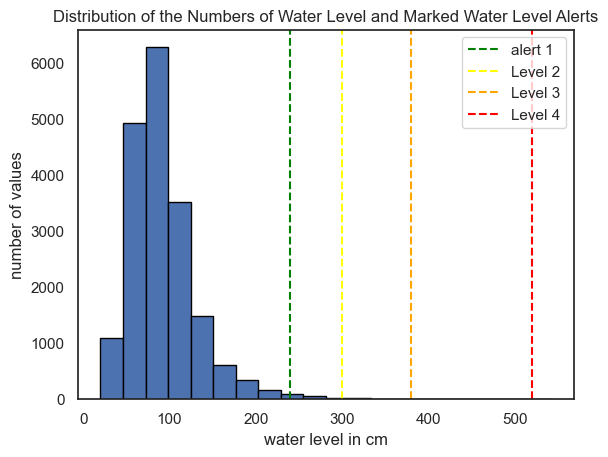

In [30]:
# plotting the distribution of all 4 water levels to have a better overview

plt.hist(df_river['level_max'], bins=20, edgecolor='black')
plt.axvline(x=alert_levels['level_1'], color='green', linestyle='--', label='alert 1')
plt.axvline(x=alert_levels['level_2'], color='yellow', linestyle='--', label='Level 2')
plt.axvline(x=alert_levels['level_3'], color='orange', linestyle='--', label='Level 3')
plt.axvline(x=alert_levels['level_4'], color='red', linestyle='--', label='Level 4')
plt.xlabel("water level in cm")
plt.ylabel("number of values")
plt.title("Distribution of the Numbers of Water Level and Marked Water Level Alerts")
plt.legend()
plt.show()

In [31]:
# now I want to identify and mark follwing days, where the water_levels are over 0
# new variable, that marks, if it is a flood event
df_river['is_flood_event'] = False

# creating groups for changes in water alert and setting counting integers
df_river['flood_group'] = (df_river['alert_level'] > 0).astype(int).diff().ne(0).cumsum()

# marking the days where water_alert > 0 as a flood event
df_river.loc[df_river['alert_level'] > 0, 'is_flood_event'] = True


<span style='color: yellow;'>It's great that you're doing this, very interesting. However, if you're reviewing outliers, probably this should be done outside this section on the analysis!</span><span style='color: green'>done</span>>

In [32]:
# now finding the beginning and ending of flood events:
# analyzing the flood groups, to later have a look into the flood events (for the comparison)
flood_groups = df_river[df_river['is_flood_event']].groupby('flood_group').agg({
    'date': ['min', 'max', 'count'],
    'alert_level': 'max'
}).reset_index()

flood_groups.columns = ['flood_group', 'start_date', 'end_date', 'duration', 'max_alert_level']
flood_groups

,flood_group,start_date,end_date,duration,max_alert_level
0,2,1974-07-18,1974-07-22,5,2
1,4,1975-07-01,1975-07-03,3,1
2,6,1976-06-02,1976-06-03,2,1
3,8,1977-08-01,1977-08-03,3,2
4,10,1978-07-05,1978-07-05,1,1
...,...,...,...,...,...
57,116,2023-05-17,2023-05-18,2,1
58,118,2023-08-28,2023-08-31,4,2
59,120,2024-06-01,2024-06-08,8,2
60,122,2024-06-10,2024-06-11,2,1


In [33]:
# creating a report, automatically in an html-file to get an overview:
profile_report = df_river.profile_report()
profile_report.to_file(output_file='river_output.html')
#profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<span style='color: red;'>I always suggest not use this type of profiling (at least, only to gather a sense of your data! Like for a personal use) I would remove this line if you already created it. If you want to use it and mention details of what is inside is fine. But comment it! Say something interesting about it!</span>
<span style='color: green;'>Yes, did it for personal use, to just get an overview. Like I wrote in the beginning I will remove it. But for now it is very convenient to get an idea of the variables, correlations etc.</span>

In [34]:
df_river_copy = df_river.copy()

<h2 id="reservoir"> B. Water Level Of The Reservoir "Sylvensteinspeicher"</h2>
<ol>
    <li>Concentating the all xlsx-files</li>
    <li> Deleting "Prüfstatus"</li>
    <li>Renaming all columns in translating them into English</li>
<ol>

In [35]:
# Reservoir "Sylvensteinspeicher" water level:
# the data is divided by 3 xlsx files:
# 1. beginning until 2023
# 2. 01/2024 until 10/2024
# 3. 11-01-2024 until 11-18-2024

path_reservoir_beginn_2023 = "../data/Sylvensteinspeicher/fluesse-wasserstand/16002500_beginn_bis_31.12.2023_tmw_0.xlsx"
path_reservoir_to_10_2023 = "../data/Sylvensteinspeicher/fluesse-wasserstand/16002500_01.01.2024_31.10.2024_tmw_0.xlsx"
path_reservoir_to_241118 = "../data/Sylvensteinspeicher/fluesse-wasserstand/16002500_01.11.2024_19.11.2024_tmw_0.xlsx"

df_reservoir = df_concat_excel(path_reservoir_beginn_2023, path_reservoir_to_10_2023, path_reservoir_to_241118)

dataframe for is completed. There are 23761 rows.


In [36]:
df_reservoir.info()
# There are few NaNs in maximum and minimum, the rest of the data is complete
# But: I have to check, if there are missing values/rows, because the data is recorded by day.
# All datatypes are right.

<class 'pandas.core.frame.DataFrame'>
Index: 23761 entries, 0 to 18
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datum       23761 non-null  datetime64[ns]
 1   Mittelwert  23761 non-null  int64         
 2   Maximum     23754 non-null  float64       
 3   Minimum     23754 non-null  float64       
 4   Prüfstatus  23761 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 1.1+ MB


In [37]:
df_reservoir = df_reservoir.drop(columns="Prüfstatus")

In [38]:
# deleting "Prüfstatus" ("validation status"), because for concentration of suspended solids there is only raw data, and the rest is limited, so I would lose a lot of data
# so for comparison reasons I decided to go ignore the status: DEFINITELY TO BE DISCUSSED!!! Because no I am realizing that I am mixing up... that procedure isn't consistent
df_reservoir = df_reservoir.rename(columns={'Datum' : 'date',
                              'Mittelwert' : 'reservoir_avg',
                              'Maximum' : 'reservoir_max',
                              'Minimum' : 'reservoir_min'})

In [39]:
df_reservoir.head(10)

,date,reservoir_avg,reservoir_max,reservoir_min
0,1959-11-01,248,249.0,244.0
1,1959-11-02,248,251.0,247.0
2,1959-11-03,246,247.0,246.0
3,1959-11-04,248,249.0,246.0
4,1959-11-05,250,252.0,249.0
5,1959-11-06,253,253.0,252.0
6,1959-11-07,253,253.0,253.0
7,1959-11-08,252,253.0,250.0
8,1959-11-09,249,250.0,249.0
9,1959-11-10,249,250.0,248.0


In [40]:
df_reservoir_copy = df_reservoir.copy()

<h2 id="weather"> C. WEATHER </h2>
<p>Concentating the all xlsx-files</p>

<span style='color: red;'>It's WEATHER not WHEATHER!</span><br>
<span style='color: green;'>I KNOW!!! Just mixing it up all the time</span>

<span style='color: red;'>This code needs to be improved! In this case, as you have 7 files, I would recommend to use the library glob. We can do this together if you want. This is a great learning for you. However, you cannot read 7 files and concat them with a function that only allows you to concat 3 per time. At least, it would have been great to use a loop to concat them in groups of 3. However, as I said, here you need to use the glob library.</span><br>
<span style='color: green'> I will try to use it on my own, but it has a low priority. Maybe doing it together in a session</span>

In [41]:
# 6 xls files from 1958 to 2024
# paths:

path_weather_58_to_67 = "../data/weather/weather1958-1967.xlsx"
path_weather_68_to_77 = "../data/weather/weather1968-1977.xlsx"
path_weather_78_to_87 = "../data/weather/weather1978-1987.xlsx"
path_weather_88_to_97 = "../data/weather/weather1988-1997.xlsx"
path_weather_98_to_07 = "../data/weather/weather1998-2007.xlsx"
path_weather_08_to_17 = "../data/weather/weather2008-2017.xlsx"
path_weather_18_to_24 = "../data/weather/weather2018-241118.xlsx"

df_weather1 = df_concat_excel(path_weather_58_to_67, path_weather_68_to_77, path_weather_78_to_87)
df_weather2 = df_concat_excel(path_weather_88_to_97, path_weather_98_to_07, path_weather_08_to_17)
df_weather3 = pd.read_excel(path_weather_18_to_24)

df_weather = pd.concat([df_weather1, df_weather2, df_weather3])

dataframe for is completed. There are 10952 rows.
dataframe for is completed. There are 10952 rows.


<span style='color: red;'>Please, add a title and also the variables on the axis. This can be difficult to see if you don't understand the code. Explain what you see on the plots!</span>

<span style='color: red;'>I'm missing the steps you're doing again and why: checking data type, nulls, changing data types, etc.</span>

In [42]:
df_weather.info()
# There are NaNs in snow, wdir (wind direction), wspd (wind speed), wpgt (wind peak gust), pres (pressure) and tsun (total sunshine duration)
# I think, the NaNs in snow are just "O" - when there isn't snow, need to varify it in the section "handling NaNs"
# date is an object, I need to transform it into datetime format
# all other variables' datatypes are right

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    24417 non-null  object 
 1   tavg    24417 non-null  float64
 2   tmin    24417 non-null  float64
 3   tmax    24417 non-null  float64
 4   prcp    24417 non-null  float64
 5   snow    22849 non-null  float64
 6   wdir    9785 non-null   float64
 7   wspd    14490 non-null  float64
 8   wpgt    14475 non-null  float64
 9   pres    14554 non-null  float64
 10  tsun    24412 non-null  float64
dtypes: float64(10), object(1)
memory usage: 2.2+ MB


In [43]:
df_weather.head(10)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,1958-01-01,0.9,-1.0,6.4,0.0,0.0,NaN,NaN,NaN,NaN,444.0
1,1958-01-02,0.8,-4.7,5.6,0.1,0.0,NaN,NaN,NaN,NaN,414.0
2,1958-01-03,-1.6,-2.2,0.6,0.8,0.0,NaN,NaN,NaN,NaN,0.0
3,1958-01-04,-5.4,-7.5,-2.0,0.9,10.0,NaN,NaN,NaN,NaN,0.0
4,1958-01-05,1.7,-5.2,4.0,6.8,10.0,NaN,NaN,NaN,NaN,0.0
5,1958-01-06,6.3,1.5,9.0,20.7,0.0,NaN,NaN,NaN,NaN,144.0
6,1958-01-07,3.3,1.9,11.3,4.3,0.0,NaN,NaN,NaN,NaN,156.0
7,1958-01-08,0.6,-1.6,2.4,1.1,30.0,NaN,NaN,NaN,NaN,0.0
8,1958-01-09,2.5,1.0,3.7,5.5,30.0,NaN,NaN,NaN,NaN,0.0
9,1958-01-10,1.4,-0.8,4.0,0.0,0.0,NaN,NaN,NaN,NaN,408.0


In [44]:
# formatting the column date into Panda's datetime-format
df_weather['date'] = pd.to_datetime(arg=df_weather['date'])
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    24417 non-null  datetime64[ns]
 1   tavg    24417 non-null  float64       
 2   tmin    24417 non-null  float64       
 3   tmax    24417 non-null  float64       
 4   prcp    24417 non-null  float64       
 5   snow    22849 non-null  float64       
 6   wdir    9785 non-null   float64       
 7   wspd    14490 non-null  float64       
 8   wpgt    14475 non-null  float64       
 9   pres    14554 non-null  float64       
 10  tsun    24412 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.2 MB


In [45]:
# to get an overview of the data and correlations
profile_report = df_weather.profile_report()
profile_report.to_file(output_file='weather_output.html')

#profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
# Actually I want to remove wind direction, pressure and total sunshine duration, because these variables don't imply my data analysis. 
# Why? 
# 1. the wind direction and pressure have no influence to the suitability
# 2. the total sunshine duration is not a good factor, the air temperature is a better one, more accurate and sun duration correlates strong with the air temperature
# TO BE DISCUSSED!

In [47]:
df_weather_copy = df_weather.copy()

<h1 id="datacleaning"> V.) Data Cleaning </h1>

<h2 id="outliers"> A. Handling Outliers</h2>

In [48]:
# df_river: looking into every variable for outliers

#for col in df_river:
   # OutLiersBox(df_river, col)
# no outliers for water temperature
# flow_avg, min, max: upper limit
# level avg, min, max: upper limit
# concent_solids: upper limit


In [49]:
# checking, if there are outliers:
# looking into every variable for outliers

#for col in df_reservoir:
   # OutLiersBox(df_reservoir, col)

# outliers in all variables:
# avg: lower and upper limit
# max: only upper limit
# min: lower and upper limit

In [50]:
# checking, if there are outliers in the weather data:
# looking into every variable for outliers

#for col in df_weather:
 #  OutLiersBox(df_weather, col)

# outliers in: 
# tavg: lower limit
# tmin: lower limit
# tmax: lower limit
# prcp: upper limit
# snow: upper limit
# wspd: upper limit
# wpgt: upper limit
# pres: both

<span style='color: green;'>Great!! Here you explain the approach very well and what are going to be the nex steps!</span><br><span style='color: violet'>whoowhoo, thanks!!!</span>

<h3 id="approach">1. Approach</h3>

<h4> Dected Outliers:</h4>
<h5>River:</h5>
<li>flow_avg, min, max: upper limit</li>
<li> level avg, min, max: upper limit</li>
<li> concent_solids: upper limit</li>
<li> water temperature: no oultiers</li>

<h5>Reservoir "Sylvensteinspeicher"</h5>
<li>avg: lower and upper limit</li>
<li>max: only upper limit</li>
<li>min: lower and upper limit</li>

<h4>Procedure</h4>
<p> To have a good base of data it is important, to 1.) identify how much the outliers are implicating all statistical numbers and 2. to make sure, that the values are real and in this case that they aren't mistakes regarding to issues at the measuring station. To find that out the following steps are take:</p>
<h5>1. IQR - 75% quantile</h5>
<ol>
    <li>Marking the outliers as 'suspected'</li>
    <li>Comparing the medians of the datasat with and without outliers</li>
    <li>Checking the differences: should be under 10%</li>
    <li>Marking them as confirmed</li>
</ol>
<h5>2. IQR - 99% quantile to look for measurement mistakes</h5>
<ol>
    <li>Marking them as "suspected"</li>
    <li>Creating a variable with the values of water level alerts</li>
    <li>Comparing the outliers with flood events: if they are lying within a flood event: mark them as 'confirmed', if not as invalid'</li>

<p>Question for Sofía: Would you do this additionally for water level, water flow rate and suspended solids? They are correlating in generall. If the outliers also are correlating that it is very unlikely that there are outliers. I think especially for the concentration of suspended solids it might make sense, because I know about certain measuring problems!</p>

<span style='color: yellow;'>Probably this function could be directly on your FUNCTIONS_EDA file.</span><br>
<span style='color: green;'>I thought I "collect" in the external function file only functions that I will use a lot - over all this project. I don't think I will need that again!?!</span>

In [51]:
# function that marks the outlier of a variable using IQR 75% and 99%

def outliers_IQR_extreme(df, observed_col, is_outlier, is_outlier_extreme):

    # step 1: finding Q1, Q3, Q01, Q99 for calculating IQR
    Q1 = df[observed_col].quantile(.25) 
    Q3 = df[observed_col].quantile(.75)
    Q01 = df[observed_col].quantile(.01)
    Q99 = df[observed_col].quantile(.99)

    IQR = Q3 - Q1

    # step 2: calculating the lower and upper limmits to detect the outliers (lying outside these limits)

    lower_limit = Q1 - 1.5 * IQR
    lower_limit_99 = Q01 - 3 * IQR

    upper_limit = Q3 + 1.5 * IQR
    upper_limit_99 = Q99 + 3 * IQR
    
    # step 3: getting the amount of data of all outliers

    num_outliers_lower_limit = df[df[observed_col] < lower_limit]
    num_outliers_lower_limit_extreme = df[df[observed_col] < lower_limit_99]

    num_outliers_upper_limit = df[df[observed_col] > upper_limit]
    num_outliers_upper_limit_extreme = df[df[observed_col] > upper_limit_99]

    # step 4: marking all outliers (and also extreme outliers) as 'suspected'
    outlier_condition = ((df[observed_col] > upper_limit) | (df[observed_col] < lower_limit))
    df.loc[outlier_condition, is_outlier] = 'suspected'
    df[(df[is_outlier] == 'suspected')]
    df[is_outlier].value_counts()    

    outlier_extreme_condition = ((df[observed_col] > upper_limit_99) | (df[observed_col] < lower_limit_99))
    df.loc[outlier_extreme_condition, is_outlier_extreme] = 'suspected'
    df[(df[is_outlier_extreme] == 'suspected')]
    df[is_outlier_extreme].value_counts()   
    
    # printing the results for checking
    print("lower limit: ", lower_limit, "number of outliers: " , num_outliers_lower_limit.shape[0], "out of " ,df[observed_col].count(),
          "\nlower limit 99%: ", lower_limit_99, "number of outliers: " , num_outliers_lower_limit_extreme.shape[0], "out of " ,df[observed_col].count(),
          "\nupper limit: ", upper_limit, "number of outliers: " , num_outliers_upper_limit.shape[0], "out of " ,df[observed_col].count(),
          "\nupper limit 99%: ", upper_limit_99, "number of outliers: " , num_outliers_upper_limit_extreme.shape[0], "out of " ,df[observed_col].count(),
          "\noutliers:\n",   df[is_outlier].value_counts(),
          "\noutliers extreme (99% quantile):\n", df[is_outlier_extreme].value_counts())

<h3 id=outlierslevelmax> 2.) Water Level Maximum</h3>

In [52]:
# new columns for marking outliers:
df_river['is_outlier_level_max'] = 'normal'
df_river['is_outlier_level_max_extreme'] = 'normal'

In [53]:
# marking all outliers of water level (max)
outliers_IQR_extreme(df_river, 'level_max', 'is_outlier_level_max','is_outlier_level_max_extreme')

lower limit:  5.5 number of outliers:  0 out of  18646 
lower limit 99%:  -90.0 number of outliers:  0 out of  18646 
upper limit:  169.5 number of outliers:  850 out of  18646 
upper limit 99%:  361.0 number of outliers:  20 out of  18646 
outliers:
 is_outlier_level_max
normal       23275
suspected      850
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_level_max_extreme
normal       24105
suspected       20
Name: count, dtype: int64


<span style='color: red;'>Explain better what you're going to do here and why. It took me a while to understand the next steps.</span><br><span style='color: green'>done</span>

In [54]:
# function to check, if a date is lying within a flood event
def check_flood(date, flood_groups):
    for _, row in flood_groups.iterrows():  # iterating through all flood events
        if date >= row['start_date'] and date <= row['end_date']:
            return 'confirmed'  # date is lying within a flood event: 'confirmed'
    return 'invalid'  # date is lying outside a flood event: 'invalid'

## percentil 99% water level max


In [55]:
# looking into all suspected outliers of water level (max) and checking if the values are in between floods
df_river.loc[df_river['is_outlier_level_max_extreme'] == 'suspected', 'is_outlier_level_max_extreme'] = df_river.loc[
    df_river['is_outlier_level_max_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_level_max_extreme'].value_counts()

is_outlier_level_max_extreme
normal       24105
confirmed       20
Name: count, dtype: int64

<h3 id=outliersflowmax> 3.) Water Flow Rate Maximum</h2>

<span style='color: red;'>Explain a bit what have you found!!</span>

In [56]:
# new columns for the states of outliers:
df_river['is_outlier_flow_max'] = 'normal'
df_river['is_outlier_flow_max_extreme'] = 'normal'

In [57]:
# marking all outliers of flow rate (max)
outliers_IQR_extreme(df_river, 'flow_max', 'is_outlier_flow_max','is_outlier_flow_max_extreme')

lower limit:  -33.050000000000004 number of outliers:  0 out of  19742 
lower limit 99%:  -127.5 number of outliers:  0 out of  19742 
upper limit:  160.15 number of outliers:  1218 out of  19742 
upper limit 99%:  454.6700000000004 number of outliers:  51 out of  19742 
outliers:
 is_outlier_flow_max
normal       22907
suspected     1218
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_flow_max_extreme
normal       24074
suspected       51
Name: count, dtype: int64


<span style='color: red;'>Explain a bit what have you found!!</span><br>
<span style='color: green;'>done</span>

In [58]:
# Check, if the extreme outliers of flow rate (max) are lying in time of floods
df_river.loc[df_river['is_outlier_flow_max_extreme'] == 'suspected', 'is_outlier_flow_max_extreme'] = df_river.loc[
    df_river['is_outlier_flow_max_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_flow_max_extreme'].value_counts()

is_outlier_flow_max_extreme
normal       24074
confirmed       51
Name: count, dtype: int64

<span style='color: violet'>There are 1.218 outliers regarding 75% out of 19.742 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> Extreme outliers are confirmed: they are all lying within flood events. So they will remain, as long as the impact on the median is not too big. I need this numbers to identify the maximum all over time.</b></span>

<h3 id="outlierslevelavg"> 4.) Water Level Average</h3>

<span style='color: red;'>Explain a bit what have you found!!</span><br>
<span style='color: green;'>done</span>

In [59]:
# new columns for the states of outliers:
df_river['is_outlier_level_avg'] = 'normal'
df_river['is_outlier_level_avg_extreme'] = 'normal'

In [60]:
# marking all outliers of water level (average)
outliers_IQR_extreme(df_river, 'level_avg', 'is_outlier_level_avg','is_outlier_level_avg_extreme')

lower limit:  -2.5 number of outliers:  0 out of  18646 
lower limit 99%:  -95.0 number of outliers:  0 out of  18646 
upper limit:  161.5 number of outliers:  667 out of  18646 
upper limit 99%:  335.0 number of outliers:  18 out of  18646 
outliers:
 is_outlier_level_avg
normal       23458
suspected      667
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_level_avg_extreme
normal       24107
suspected       18
Name: count, dtype: int64


In [61]:
# Check, if the extreme outliers of water level (average) are lying in time of floods
df_river.loc[df_river['is_outlier_level_avg_extreme'] == 'suspected', 'is_outlier_level_avg_extreme'] = df_river.loc[
    df_river['is_outlier_level_avg_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_level_avg_extreme'].value_counts()

is_outlier_level_avg_extreme
normal       24107
confirmed       18
Name: count, dtype: int64

<span style='color: violet'>There are 667 outliers regarding 75% out of 18.646 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> Extreme outliers are confirmed: they are all lying within flood events. So they will remain, as long as the impact on the median is not too big. I need this numbers to identify the maximum all over time.</b></span>

<h3 id=outliersflowavg> 5.) Flow Rate Average</h3>

<span style='color: red;'>Explain a bit what have you found!!</span>

<span style='color: red;'>You have done five times the same process, using exactly the same functions. You should automate this into a for loop. We can talk about it if you don't know how to proceed.</span>

In [62]:
# new columns for the states of outliers:
df_river['is_outlier_flow_avg'] = 'normal'
df_river['is_outlier_flow_avg_extreme'] = 'normal'

In [63]:
# marking all outliers of flow rate (average)
outliers_IQR_extreme(df_river, 'flow_avg', 'is_outlier_flow_avg','is_outlier_flow_avg_extreme')

lower limit:  -36.85000000000001 number of outliers:  0 out of  24125 
lower limit 99%:  -123.50000000000001 number of outliers:  0 out of  24125 
upper limit:  146.75 number of outliers:  1330 out of  24125 
upper limit 99%:  399.70000000000005 number of outliers:  54 out of  24125 
outliers:
 is_outlier_flow_avg
normal       22795
suspected     1330
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_flow_avg_extreme
normal       24071
suspected       54
Name: count, dtype: int64


In [309]:
# Check, if the extreme outliers of flow rate (average) are lying in time of floods
df_river.loc[df_river['is_outlier_flow_avg_extreme'] == 'suspected', 'is_outlier_flow_avg_extreme'] = df_river.loc[
    df_river['is_outlier_flow_avg_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_flow_avg_extreme'].value_counts()

is_outlier_flow_avg_extreme
normal       24071
confirmed       43
invalid         11
Name: count, dtype: int64

<span style='color: violet'>There are 1.330 outliers regarding 75% out of 24.125 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> 43 of the extreme outliers are confirmed: they are all lying within flood events. So they will remain, as long as the impact on the median is not too big. I need this numbers to identify the maximum all over time.<br>
11 are invalid. The next step is look deepr into these 11 invalid values</b></span>

In [310]:
# Looking into the invalid outliers
df_outliers_flow_avg_extreme = df_river[df_river['is_outlier_flow_avg_extreme'] == 'invalid']
df_outliers_flow_avg_extreme

,date,flow_avg,flow_max,flow_min,level_avg,level_max,level_min,concent_solids,water_temp_avg,water_temp_max,...,is_flood_event,flood_group,is_outlier_level_max,is_outlier_level_max_extreme,is_outlier_flow_max,is_outlier_flow_max_extreme,is_outlier_level_avg,is_outlier_level_avg_extreme,is_outlier_flow_avg,is_outlier_flow_avg_extreme
2392,1965-05-20,432.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2414,1965-06-11,582.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2415,1965-06-12,569.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2416,1965-06-13,495.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2417,1965-06-14,458.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2418,1965-06-15,422.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
2822,1966-07-24,485.0,NaN,NaN,NaN,NaN,NaN,705.05,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
4300,1970-08-10,542.0,NaN,NaN,NaN,NaN,NaN,927.90,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
4301,1970-08-11,485.0,NaN,NaN,NaN,NaN,NaN,404.03,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid
4302,1970-08-12,482.0,NaN,NaN,NaN,NaN,NaN,350.17,NaN,NaN,...,False,1,normal,normal,normal,normal,normal,normal,suspected,invalid


<p>It is obvious that there are a lot of time rows and the water level alert is 0, because there are NaNs in level_max.<br>
Next step: searching for information about floods before.
</p> 

<span style='color: red;'>This dataframe should be done automatically with filters. Why are you doing this manually?</span><br>
<span style='color: green;'>I created a DataFrame with all officially recorded floods, before there are recorded in the measurement station.</span>

In [311]:
# Df with data of extreme values for flow rate and water level, to check if the outlier of flow avg are lying within the "official" floods, 
# because there are no data of water level maximum before 1972:
df_floods = pd.DataFrame(
    {
        "date" : ['2005-08-24', '1999-05-22', '2013-06-03', '1981-07-20', '1979-06-18', '1965-06-11'],
        "water_level_flood": [542, 469, 432, 424, 424, np.nan],
        "flow_rate_flood": [1050, 830, 761, np.nan, 728, 705]},
        index=[1,2,3,4,5,6])
df_floods

,date,water_level_flood,flow_rate_flood
1,2005-08-24,542.0,1050.0
2,1999-05-22,469.0,830.0
3,2013-06-03,432.0,761.0
4,1981-07-20,424.0,NaN
5,1979-06-18,424.0,728.0
6,1965-06-11,NaN,705.0


<span style='color: red;'>What are you trying to do here? I need more details, it was hard to understand!</span><br>
<span style='color: green;'>Checking "manually", if the outliers are lying within flood events before 1972</span>

In [312]:
# Checking, if the invalid outliers of flow rate avg are lying in between official flood events before 1972 or are within a daterow
# Condition for checking if the date of the extreme outliers of flow rate averages are lying within the floods before 1972 (which I manually created, because there were no data to download)
cond_flood_event = df_outliers_flow_avg_extreme['date'].isin(df_floods['date'])
# Creating a new column that calculates the differences between the dates to identify time rows
df_outliers_flow_avg_extreme['date_diff'] = df_outliers_flow_avg_extreme['date'].diff().dt.days
# Condition for filtering time rows: differences of the dates = 1
cond_date_rows = df_outliers_flow_avg_extreme['date_diff'] == 1

# if the first or second condition is true: set the outlier "confirmed"
df_outliers_flow_avg_extreme.loc[cond_flood_event | cond_date_rows, 'is_outlier_flow_avg_extreme'] = 'confirmed'
# if not, then set it 'invalid'
df_outliers_flow_avg_extreme.loc[~(cond_flood_event | cond_date_rows), 'is_outlier_flow_avg_extreme'] = 'invalid'

df_outliers_flow_avg_extreme[['date', 'flow_avg', 'is_outlier_flow_avg_extreme']]

,date,flow_avg,is_outlier_flow_avg_extreme
2392,1965-05-20,432.0,invalid
2414,1965-06-11,582.0,confirmed
2415,1965-06-12,569.0,confirmed
2416,1965-06-13,495.0,confirmed
2417,1965-06-14,458.0,confirmed
2418,1965-06-15,422.0,confirmed
2822,1966-07-24,485.0,invalid
4300,1970-08-10,542.0,invalid
4301,1970-08-11,485.0,confirmed
4302,1970-08-12,482.0,confirmed


<span style='color: violet'>There are still 3 invalid outliers, which cannot be related to flood events.<br><br>
<b> To be discussed with Sofía</b></span>

In [372]:
# filtering the 3 invalid outliers:
df_river['is_outlier_level_avg_extreme'].value_counts()

is_outlier_level_avg_extreme
normal       24107
confirmed       18
Name: count, dtype: int64

<h3 id="outliersconcent">6.) Concentration Of Suspended Solids</h3>

<span style='color: red;'>Explain a bit what have you found!!</span>

In [313]:
# creating 2 new variables for the outliers
df_river['is_outlier_concent_solids'] = 'normal'
df_river['is_outlier_concent_solids_extreme'] = 'normal'

In [314]:
# marking all outliers of the water pollution:
outliers_IQR_extreme(df_river, 'concent_solids', 'is_outlier_concent_solids','is_outlier_concent_solids_extreme')

lower limit:  -14.005000000000004 number of outliers:  0 out of  21250 
lower limit 99%:  -40.92000000000001 number of outliers:  0 out of  21250 
upper limit:  42.275000000000006 number of outliers:  1880 out of  21250 
upper limit 99%:  293.89059999999995 number of outliers:  146 out of  21250 
outliers:
 is_outlier_concent_solids
normal       22245
suspected     1880
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_concent_solids_extreme
normal       23979
suspected      146
Name: count, dtype: int64


<span style='color: violet'>note: there is a very big difference between the two upper limits!<br>
Do I need to do something about it? Question for Sofá</span>

In [315]:
# looking into the extreme outliers of the water pollution, if they are lying within flood event:
df_river.loc[df_river['is_outlier_concent_solids_extreme'] == 'suspected', 'is_outlier_concent_solids_extreme'] = df_river.loc[
    df_river['is_outlier_concent_solids_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_river['is_outlier_concent_solids_extreme'].value_counts()

is_outlier_concent_solids_extreme
normal       23979
invalid        108
confirmed       38
Name: count, dtype: int64

In [316]:
# There's a note on the website that there are problems with the measurement station of suspended solids
# since July of 2024. Therefor they have to be replaced, removed (question for Sofía? see also note 2 lines further)
# filtering all extreme outliers after 2024-07-01:
df_river[(df_river['is_outlier_concent_solids_extreme'] == "invalid") & (df_river['date'] > '2024-07-01')][['date', 'concent_solids', 'is_outlier_concent_solids_extreme']]

,date,concent_solids,is_outlier_concent_solids_extreme
23998,2024-07-15,1119.19,invalid
23999,2024-07-16,2000.86,invalid
24000,2024-07-17,2000.42,invalid
24001,2024-07-18,2000.53,invalid
24002,2024-07-19,2000.78,invalid
24003,2024-07-20,2000.51,invalid
24004,2024-07-21,2000.97,invalid
24005,2024-07-22,2000.41,invalid
24006,2024-07-23,2000.49,invalid
24007,2024-07-24,2000.71,invalid


In [317]:
# looking into the extreme outliers before 24-07-01:
df_river[(df_river['is_outlier_concent_solids_extreme'] == "invalid") & (df_river['date'] <= '2024-07-01')][['date', 'concent_solids', 'is_outlier_concent_solids_extreme']]
# 70 rows - a lot

,date,concent_solids,is_outlier_concent_solids_extreme
2736,1966-04-29,564.26,invalid
2765,1966-05-28,403.73,invalid
2766,1966-05-29,378.02,invalid
2798,1966-06-30,470.49,invalid
2821,1966-07-23,1059.96,invalid
...,...,...,...
20364,2014-08-03,397.11,invalid
20365,2014-08-04,381.58,invalid
23357,2022-10-13,538.11,invalid
23827,2024-01-26,774.61,invalid


<span style='color: red;'>Mention this! This is very important! </span>

<span style='color: violet'>
<p><b>Note:</b></p>
<ul>
    <li>since July 2024 the measuring station is shut down because of technical issues</li>
    <li>I would delete them</li>
    <li>in the following histogram you can see a very strange distribution... I don't know how to interprete it</li>
    <li>the medians (with and without outliers 75%) differ about 7%: that would be ok.</li>
    <li>the outliers within 99% quantile couldn't be totally confirmed, but if I delete all values of 2024, there are 70 left</li>
</span>

<span style='color: red;'>Please, add a title, variable names, etc on the plot!</span><br>
<span style='color: green;'>done</span>

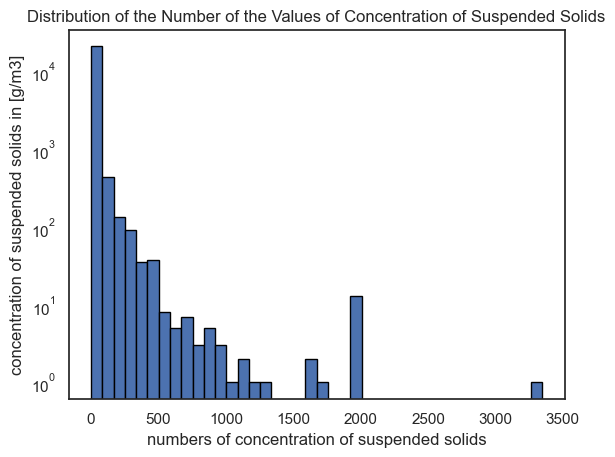

In [318]:
plt.hist(df_river['concent_solids'], bins=40,log=True, edgecolor='black')
plt.title("Distribution of the Number of the Values of Concentration of Suspended Solids")
plt.xlabel("numbers of concentration of suspended solids")
plt.ylabel("concentration of suspended solids in [g/m3]")
plt.show()

<span style='color: red;'>I have the feeling this plot doesn't go here. You haven't handle missing values/outlier yet, but you're already looking in to relationship between variables? So, if you have any comments about why this is here, you can leave it if it makes sense, but explain why!</span><br>
<span style='color: green;'>Totally agreed! Just forgotten to move it to the NaNs-Section. I want to look into the correlations between flow rate, water level and suspended solids. If there is in general a correlation, than I could look into the outliers. And if there is also a correlation, it could be plausible and proving them as "real" (no mistaken) values. It was just an idea, and maybe it leads nowhere...</span>

<AxesSubplot:xlabel='flow_avg', ylabel='level_avg'>

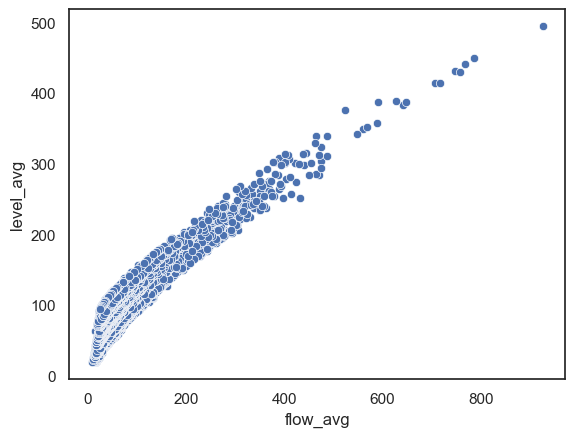

In [319]:
# looking into correlations flow_rate and water_level,
sns.scatterplot(data=df_river, x='flow_avg', y='level_avg')

<h3 id="outliersreservoir"> 7.) Reservoir Sylvenstein Water Level</h3>

<span style='color: red;'>This could be done on a for loop (creating all these columns and filling them with the string 'normal'.</span>
<br><span style='color: green;'>yes, reserved for later ;)  see the task in clickup</span>
<span style='color: red;'>Explain what you're doing!</span>
<br><span style='color: green;'>done</span>


In [320]:
# creating new variables for the outliers of each variable for outliers and "extreme" outliers
df_reservoir['is_outlier_reservoir_avg'] = 'normal'
df_reservoir['is_outlier_reservoir_avg_extreme'] = 'normal'
df_reservoir['is_outlier_reservoir_max'] = 'normal'
df_reservoir['is_outlier_reservoir_max_extreme'] = 'normal'
df_reservoir['is_outlier_reservoir_min'] = 'normal'
df_reservoir['is_outlier_reservoir_min_extreme'] = 'normal'

In [321]:
# marking all outliers of water level of the reservoir (average)
outliers_IQR_extreme(df_reservoir, 'reservoir_avg', 'is_outlier_reservoir_avg', 'is_outlier_reservoir_avg_extreme')

lower limit:  229.0 number of outliers:  197 out of  23761 
lower limit 99%:  199.0 number of outliers:  0 out of  23761 
upper limit:  269.0 number of outliers:  1788 out of  23761 
upper limit 99%:  349.0 number of outliers:  72 out of  23761 
outliers:
 is_outlier_reservoir_avg
normal       21776
suspected     1985
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_reservoir_avg_extreme
normal       23689
suspected       72
Name: count, dtype: int64


In [322]:
# looking into the extreme outliers of water level of the reservoir (average), if they are lying within flood event:
df_reservoir.loc[df_reservoir['is_outlier_reservoir_avg_extreme'] == 'suspected', 'is_outlier_reservoir_avg_extreme'] = df_reservoir.loc[
    df_reservoir['is_outlier_reservoir_avg_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_reservoir['is_outlier_reservoir_avg_extreme'].value_counts()

is_outlier_reservoir_avg_extreme
normal       23689
confirmed       45
invalid         27
Name: count, dtype: int64

<span style='color: violet'>There are 1985 outliers regarding 75% out of 23.761 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> Extreme outliers: 45 are confirmed (they are lying within flood events), 27 are set "invalid": TO BE DISCUSSED: WHAT DOING NOW?</b></span>

In [323]:
# marking all outliers of water level of the reservoir (maximum)
outliers_IQR_extreme(df_reservoir, 'reservoir_max', 'is_outlier_reservoir_max', 'is_outlier_reservoir_max_extreme')

lower limit:  226.0 number of outliers:  0 out of  23754 
lower limit 99%:  193.0 number of outliers:  0 out of  23754 
upper limit:  274.0 number of outliers:  1835 out of  23754 
upper limit 99%:  369.0 number of outliers:  67 out of  23754 
outliers:
 is_outlier_reservoir_max
normal       21926
suspected     1835
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_reservoir_max_extreme
normal       23694
suspected       67
Name: count, dtype: int64


In [324]:
# looking into the extreme outliers of the water level of the reservoir (maximum), if they are lying within flood event:
df_reservoir.loc[df_reservoir['is_outlier_reservoir_max_extreme'] == 'suspected', 'is_outlier_reservoir_max_extreme'] = df_reservoir.loc[
    df_reservoir['is_outlier_reservoir_max_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_reservoir['is_outlier_reservoir_max_extreme'].value_counts()

is_outlier_reservoir_max_extreme
normal       23694
confirmed       41
invalid         26
Name: count, dtype: int64

<span style='color: violet'>There are 1835 outliers regarding 75% out of 23.754 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> Extreme outliers: 41 are confirmed (they are lying within flood events), 21 are set "invalid": TO BE DISCUSSED: WHAT DOING NOW?</b></span>

In [325]:
# marking all outliers of water level of the reservoir (minimum)
outliers_IQR_extreme(df_reservoir, 'reservoir_min', 'is_outlier_reservoir_min','is_outlier_reservoir_min_extreme')

lower limit:  228.0 number of outliers:  80 out of  23754 
lower limit 99%:  198.0 number of outliers:  0 out of  23754 
upper limit:  268.0 number of outliers:  1448 out of  23754 
upper limit 99%:  338.0 number of outliers:  70 out of  23754 
outliers:
 is_outlier_reservoir_min
normal       22233
suspected     1528
Name: count, dtype: int64 
outliers extreme (99% quantile):
 is_outlier_reservoir_min_extreme
normal       23691
suspected       70
Name: count, dtype: int64


In [326]:
# looking into the extreme outliers of water level of the reservoir (minimum), if they are lying within flood event:
df_reservoir.loc[df_reservoir['is_outlier_reservoir_min_extreme'] == 'suspected', 'is_outlier_reservoir_min_extreme'] = df_reservoir.loc[
    df_reservoir['is_outlier_reservoir_min_extreme'] == 'suspected', 'date'
].apply(lambda date: check_flood(date, flood_groups))
df_reservoir['is_outlier_reservoir_min_extreme'].value_counts()

is_outlier_reservoir_min_extreme
normal       23691
confirmed       40
invalid         30
Name: count, dtype: int64

<span style='color: violet'>There are 1.528 outliers regarding 75% out of 23.754 rows. I will look into them later to compare the medians with and without outliers and find out, if there is a huge impact on the median if by excluding the outliers.<br><br>
<b> Extreme outliers: 40 are confirmed (they are lying within flood events), 30 are set "invalid": TO BE DISCUSSED: WHAT DOING NOW?</b></span>

<h3 id="outliersweather"> 8.) Outliers Weather</h3>

In [327]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24417 entries, 0 to 2512
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    24417 non-null  datetime64[ns]
 1   tavg    24417 non-null  float64       
 2   tmin    24417 non-null  float64       
 3   tmax    24417 non-null  float64       
 4   prcp    24417 non-null  float64       
 5   snow    22849 non-null  float64       
 6   wdir    9785 non-null   float64       
 7   wspd    14490 non-null  float64       
 8   wpgt    14475 non-null  float64       
 9   pres    14554 non-null  float64       
 10  tsun    24412 non-null  float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 2.2 MB


<span style='color: red;'>This could be done on a for loop (creating all these columns and filling them with the string 'normal').</span><br>
<span style='color: green;'>Yes, later (I created a task in cklick-up with low priority)</span><br>
<span style='color: red;'>Explain what you're doing!</span>

In [328]:
# creating new variables for marking the outliers. Setting the default value to "normal"
df_weather['is_outlier_tavg'] = 'normal'
df_weather['is_outlier_tmin'] = 'normal'
df_weather['is_outlier_tmax'] = 'normal'
df_weather['is_outlier_prcp'] = 'normal'
df_weather['is_outlier_snow'] = 'normal'
df_weather['is_outlier_wspd'] = 'normal'
df_weather['is_outlier_wpgt'] = 'normal'
df_weather['is_outlier_pres'] = 'normal'

<span style='color: red;'>What is the difference with the previous one?</span><br>
<span style='color: green;'>I called it "normal", because I am only checking the common Quantiles 25% and 75%. I don't need that for the  weather, because I don't have the same requirments as for ther river data and reservoir.</span>

<span style='color: yellow;'>Probably adding this to the functions EDA would be better.</span><br>
<span style='color: green;'>same queastion: the function is so special, don't think I will nee that again... but maybe this one I could need. TO BE DISCUSSED WITH SOFÍA.</span>


In [329]:
# function that marks the outlier of a variable using IQR

def outliers_IQR_normal(df, observed_col, is_outlier):

    # step 1: finding Q1, Q3, Q01, Q99 for calculating IQR
    Q1 = df[observed_col].quantile(.25) 
    Q3 = df[observed_col].quantile(.75)

    IQR = Q3 - Q1

    # step 2: calculating the lower and upper limmits to detect the outliers (lying outside these limits)

    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    # step 3: getting the amount of data of all outliers

    num_outliers_lower_limit = df[df[observed_col] < lower_limit]

    num_outliers_upper_limit = df[df[observed_col] > upper_limit]

    # step 4: marking all outliers (and also extreme outliers) as 'suspected'
    outlier_condition = ((df[observed_col] > upper_limit) | (df[observed_col] < lower_limit))
    df.loc[outlier_condition, is_outlier] = 'suspected'
    df[(df[is_outlier] == 'suspected')]
    df[is_outlier].value_counts()     
    
    # printing the results for checking
    print("lower limit: ", lower_limit, "number of outliers: " , num_outliers_lower_limit.shape[0], "out of " ,df[observed_col].count(),
          "\nupper limit: ", upper_limit, "number of outliers: " , num_outliers_upper_limit.shape[0], "out of " ,df[observed_col].count(),
          "\noutliers:\n",   df[is_outlier].value_counts())

In [330]:
# Pseudo-code (later!): To not write so much times the same (as following for all variables of weather)
# one dataframe, of what all variables need one outlier-column
# loop through the dataframe
# using outliers_IQR_normal 
# - marking the outliers
# - printing the results
# but how to get the right outlier-variable?

<span style='color: green'>Do I really need to document the results of all this following code sections? It feels so redundant :(</span)>

In [331]:
# Marking all outliers for the average air temperature:
outliers_IQR_normal(df_weather, 'tavg', 'is_outlier_tavg')

lower limit:  -15.000000000000002 number of outliers:  10 out of  24417 
upper limit:  34.6 number of outliers:  0 out of  24417 
outliers:
 is_outlier_tavg
normal       24407
suspected       10
Name: count, dtype: int64


In [332]:
# Marking all outliers for the minimums of air temperature:
outliers_IQR_normal(df_weather, 'tmin', 'is_outlier_tmin')

lower limit:  -15.850000000000001 number of outliers:  48 out of  24417 
upper limit:  27.75 number of outliers:  0 out of  24417 
outliers:
 is_outlier_tmin
normal       24369
suspected       48
Name: count, dtype: int64


In [333]:
# Marking all outliers for the maximums of air temperature:
outliers_IQR_normal(df_weather, 'tmax', 'is_outlier_tmax')

lower limit:  -14.249999999999998 number of outliers:  3 out of  24417 
upper limit:  42.15 number of outliers:  0 out of  24417 
outliers:
 is_outlier_tmax
normal       24414
suspected        3
Name: count, dtype: int64


In [334]:
# Marking all outliers for the precipitation:
outliers_IQR_normal(df_weather, 'prcp', 'is_outlier_prcp')

lower limit:  -3.9000000000000004 number of outliers:  0 out of  24417 
upper limit:  6.5 number of outliers:  3147 out of  24417 
outliers:
 is_outlier_prcp
normal       21270
suspected     3147
Name: count, dtype: int64


In [335]:
df_weather[df_weather['prcp'] == 0]['prcp'].count()

12428

Text(0, 0.5, 'Sum of the Precipitation')

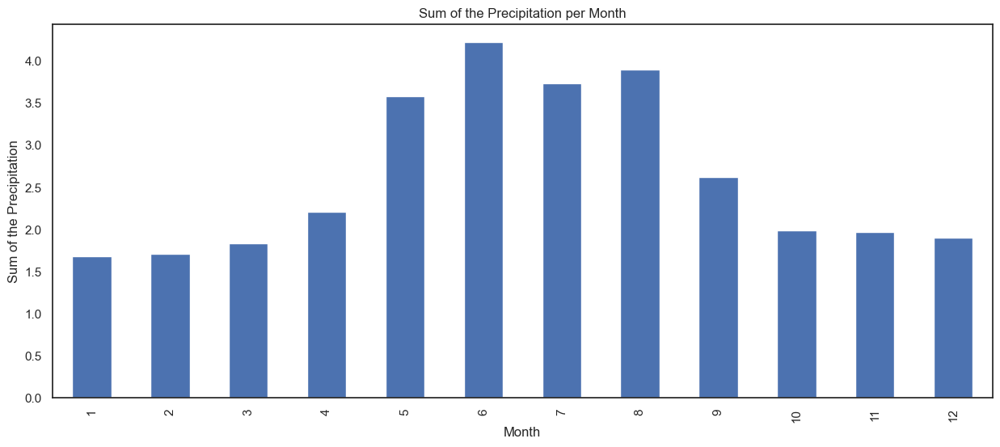

In [336]:
prcp_per_month = df_weather.groupby(df_weather['date'].dt.month)['prcp'].mean()
plt.figure(figsize=(15, 6))
prcp_per_month.plot(kind='bar')
plt.title('Sum of the Precipitation per Month')
plt.xlabel('Month')
plt.ylabel('Sum of the Precipitation')

In [337]:
# snow depth hast to be handled in a different way, because the column is only filled, when there is snow. Then I need to filter the data and just look into filtered data
# first I will take a look into the sums of the snow depth per month

snow_per_month = df_weather.groupby(df_weather['date'].dt.month)['snow'].sum()
snow_per_month


date
1     79960.0
2     62140.0
3     27250.0
4      2720.0
5        10.0
6         0.0
7         0.0
8         0.0
9         0.0
10      170.0
11    11920.0
12    45170.0
Name: snow, dtype: float64

Text(0, 0.5, 'Sum of the Snow Depth')

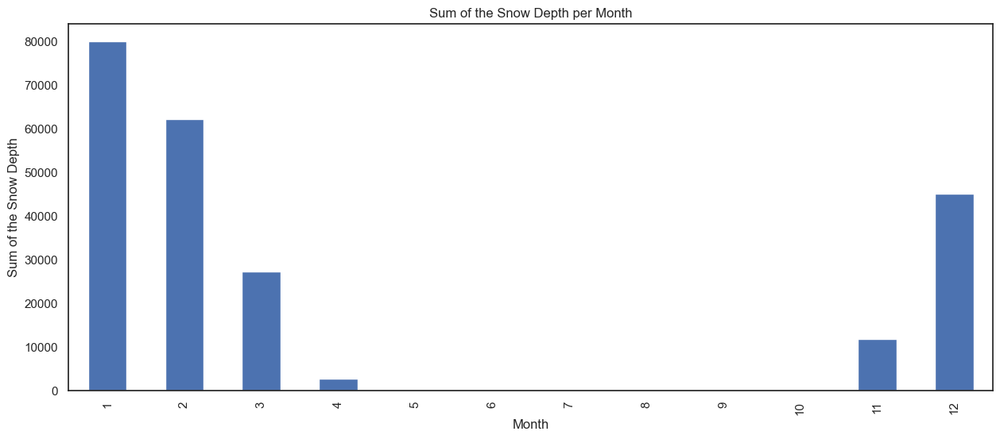

In [338]:
# plotting the distribution to get a better overview:
plt.figure(figsize=(15, 6))
snow_per_month.plot(kind='bar')
plt.title('Sum of the Snow Depth per Month')
plt.xlabel('Month')
plt.ylabel('Sum of the Snow Depth')

In [339]:
# now looking into the NaNs per month. 
df_nans_snow = df_weather['snow'].isna().groupby(df_weather['date'].dt.month).sum()

Text(0, 0.5, 'Number of NaNs in Snow Depth')

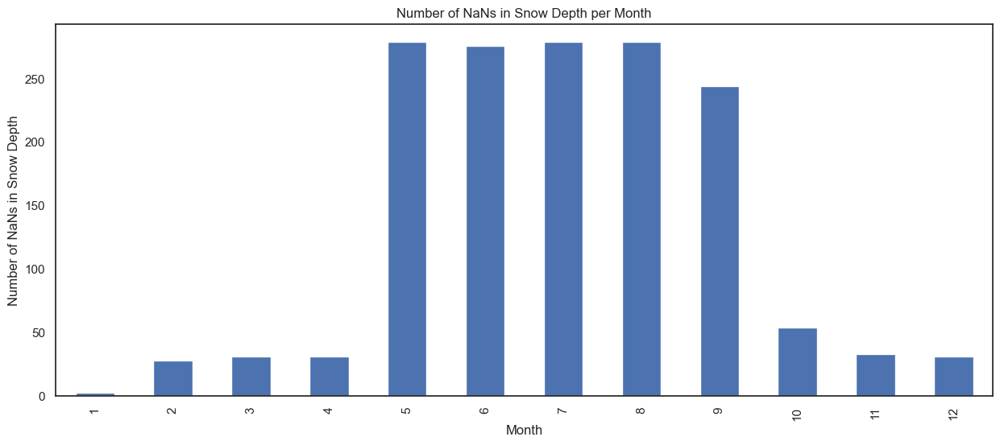

In [340]:
# plotting it to get a better overview:
plt.figure(figsize=(15, 6))
df_nans_snow.plot(kind='bar')
plt.title('Number of NaNs in Snow Depth per Month')
plt.xlabel('Month')
plt.ylabel('Number of NaNs in Snow Depth')

<span style='color: violet'>As you can see: There are "real" NaNs to handle, but from June to September, there is no snow.<br>
So I will exclude the months June to September for checking the outliers and the medians</span>
<span style='color: violet'>
<b>Steps to do:</b>
<ol>
    <li>Filtering the months by excluding June to September</li>
    <li>Looking into the outliers of the filtered DataFrame, correct it.</li>
    <li>Calculating the medians like I did with rest of the variables</li> 
</ol>
</span>

In [341]:
# DataFrame excluding June to September and looking only into the values > 0
df_snow_wintertime = df_weather[((df_weather['date'].dt.month < 6) | (df_weather['date'].dt.month >9)) & (df_weather['snow']>0)][['date','snow']]
df_snow_wintertime.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3095 entries, 3 to 2211
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    3095 non-null   datetime64[ns]
 1   snow    3095 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 72.5 KB


In [342]:
# checking the outliers only for wintertime
outliers_IQR_normal(df_snow_wintertime, 'snow', 'is_outlier_snow')

lower limit:  -75.0 number of outliers:  0 out of  3095 
upper limit:  205.0 number of outliers:  171 out of  3095 
outliers:
 is_outlier_snow
suspected    171
Name: count, dtype: int64


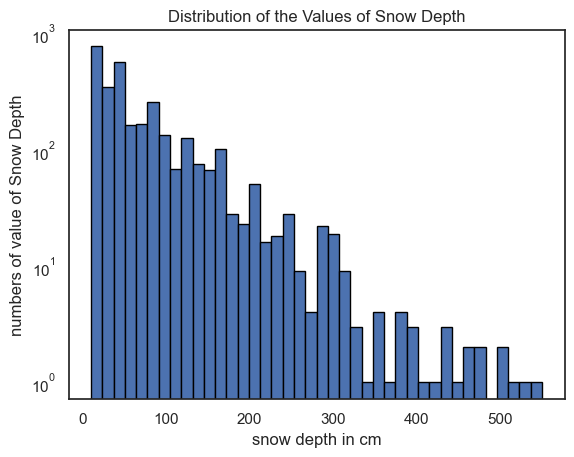

In [343]:
# the  lower and upper limit = 0. That couldn't be right
# Looking first into the distribution of all values of snow depth:
plt.hist(df_snow_wintertime['snow'], bins=40,log=True, edgecolor='black')
plt.title("Distribution of the Values of Snow Depth")
plt.ylabel("numbers of value of Snow Depth")
plt.xlabel("snow depth in cm")
plt.show()
# the Histogram shows that there are a lot "0" for snow depth.
# I decided only to look into the days, where the snow depth is > 0. So I adapted the filter

In [344]:
# Marking all outliers in wind speed:
outliers_IQR_normal(df_weather, 'wspd', 'is_outlier_wspd')

lower limit:  -1.5499999999999998 number of outliers:  0 out of  14490 
upper limit:  18.849999999999998 number of outliers:  603 out of  14490 
outliers:
 is_outlier_wspd
normal       23814
suspected      603
Name: count, dtype: int64


In [345]:
# Marking all outliers in wind peak gust:
outliers_IQR_normal(df_weather, 'wpgt', 'is_outlier_wpgt')

lower limit:  -4.599999999999998 number of outliers:  0 out of  14475 
upper limit:  69.0 number of outliers:  497 out of  14475 
outliers:
 is_outlier_wpgt
normal       23920
suspected      497
Name: count, dtype: int64


In [346]:
# Marking all outliers in pressure:
outliers_IQR_normal(df_weather, 'pres', 'is_outlier_pres')

lower limit:  996.6 number of outliers:  179 out of  14554 
upper limit:  1036.6 number of outliers:  118 out of  14554 
outliers:
 is_outlier_pres
normal       24120
suspected      297
Name: count, dtype: int64


<h3 id=comparingmedian> 9.) Comparing the median of data with and without the outliers</h2>

<h4 id=coomparingriver>9.1.) Comparing The Medians Of The River Data </h4>

In [347]:
# function to find out all the difference of the medians:

def diff_median(median_incl, median_excl):
    median1 = median_incl.median()
    median2 = median_excl.median()
    
    diff_median_perc = (median1 - median2)/median1 * 100
    print("general median: ", median1, "\nmedian excluding outliers: ", median2,
        "\nThe general mean differs ", round(diff_median_perc, 2), ' percent from the median of the data excluding the outliers')

In [348]:
# water level max:
diff_median(df_river['level_max'],df_river[df_river['is_outlier_level_max'] != 'suspected']['level_max'])

general median:  86.0 
median excluding outliers:  84.0 
The general mean differs  2.33  percent from the median of the data excluding the outliers


In [349]:
# water level avg:
diff_median(df_river['level_avg'], df_river[df_river['is_outlier_level_avg'] != 'suspected']['level_avg'])

general median:  78.0 
median excluding outliers:  76.0 
The general mean differs  2.56  percent from the median of the data excluding the outliers


In [350]:
# flow rate max:
diff_median(df_river['flow_max'], df_river[df_river['is_outlier_flow_max'] != 'suspected']['flow_max'])

general median:  59.2 
median excluding outliers:  56.6 
The general mean differs  4.39  percent from the median of the data excluding the outliers


In [351]:
# flow rate avg:
diff_median(df_river['flow_avg'], df_river[df_river['is_outlier_flow_avg'] != 'suspected']['flow_avg'])

general median:  51.2 
median excluding outliers:  48.7 
The general mean differs  4.88  percent from the median of the data excluding the outliers


In [352]:
# concentration of suspended solids:
diff_median(df_river['concent_solids'], df_river[df_river['is_outlier_concent_solids'] != 'suspected']['concent_solids'])

general median:  12.02 
median excluding outliers:  11.11 
The general mean differs  7.57  percent from the median of the data excluding the outliers


In [353]:
# reservoir water level avg:
diff_median(df_reservoir['reservoir_avg'], df_reservoir[df_reservoir['is_outlier_reservoir_avg'] != 'suspected']['reservoir_avg'])

general median:  249.0 
median excluding outliers:  249.0 
The general mean differs  0.0  percent from the median of the data excluding the outliers


In [354]:
# reservoir water level max:
diff_median(df_reservoir['reservoir_max'], df_reservoir[df_reservoir['is_outlier_reservoir_max'] != 'suspected']['reservoir_max'])

general median:  250.0 
median excluding outliers:  249.0 
The general mean differs  0.4  percent from the median of the data excluding the outliers


<h4 id=comparingweather>9.2.) Comparing The Medians Of The Weather Data </h4>

In [355]:
# reservoir water level min:
diff_median(df_reservoir['reservoir_min'], df_reservoir[df_reservoir['is_outlier_reservoir_min'] != 'suspected']['reservoir_min'])

general median:  249.0 
median excluding outliers:  248.0 
The general mean differs  0.4  percent from the median of the data excluding the outliers


In [356]:
# weather: tavg
diff_median(df_weather['tavg'], df_weather[df_weather['is_outlier_tavg'] != 'suspected']['tavg'])

general median:  10.0 
median excluding outliers:  10.0 
The general mean differs  0.0  percent from the median of the data excluding the outliers


In [357]:
# weather: tmin
diff_median(df_weather['tmin'], df_weather[df_weather['is_outlier_tmin'] != 'suspected']['tmin'])

general median:  6.0 
median excluding outliers:  6.0 
The general mean differs  0.0  percent from the median of the data excluding the outliers


In [358]:
# weather: tmax
diff_median(df_weather['tmax'], df_weather[df_weather['is_outlier_tmax'] != 'suspected']['tmax'])

general median:  14.4 
median excluding outliers:  14.4 
The general mean differs  0.0  percent from the median of the data excluding the outliers


In [359]:
# weather: snow (only wintertimes and values > 0, see section "outliers")
diff_median(df_snow_wintertime['snow'], df_snow_wintertime[df_snow_wintertime['is_outlier_snow'] != 'suspected']['snow'])
# it seems NaNs equal "0", only if there is snow you the columns contains values, so I need to investigate the available data, finding out, if there are outliers and check the medians

general median:  50.0 
median excluding outliers:  50.0 
The general mean differs  0.0  percent from the median of the data excluding the outliers


In [360]:
df_weather['prcp'].median()
diff_median(df_weather['prcp'], df_weather[df_weather['is_outlier_prcp'] != 'suspected']['prcp'])
# it seems NaNs equal "0", only if there is snow you the columns contains values, so I need to investigate the available data, finding out, if there are outliers and check the medians

general median:  0.0 
median excluding outliers:  0.0 
The general mean differs  nan  percent from the median of the data excluding the outliers


In [361]:
# weather:wspd
diff_median(df_weather['wspd'], df_weather[df_weather['is_outlier_wspd'] != 'suspected']['wspd'])

general median:  8.3 
median excluding outliers:  7.9 
The general mean differs  4.82  percent from the median of the data excluding the outliers


In [362]:
# weather: wpgt
diff_median(df_weather['wpgt'], df_weather[df_weather['is_outlier_wpgt'] != 'suspected']['wpgt'])

general median:  30.6 
median excluding outliers:  29.9 
The general mean differs  2.29  percent from the median of the data excluding the outliers


In [363]:
# weather: pres
diff_median(df_weather['pres'], df_weather[df_weather['is_outlier_pres'] != 'suspected']['pres'])

general median:  1016.4 
median excluding outliers:  1016.5 
The general mean differs  -0.01  percent from the median of the data excluding the outliers


<span style='color: violet'> RESULT: THE DIFFERENCES BETWEEN THE MEDIANS WITH OR WITHOUT OUTLIERS ARE All UNDER 10%</span>

<h2 id=duplicates>B.) Removing Duplicates</h2>

<h2 id=nans> C.) Handling NaNs</h2>
- because it is daily data, ther are "un-dected" Nans (missing days): how to handle that?
- the "official" Nans is the result of joining a the variables althouhg they have different time frames. But I need to verify this (maybe in the steps before joining?)

In [364]:
df_river.isna().sum()

date                                    0
flow_avg                                0
flow_max                             4383
flow_min                             4383
level_avg                            5479
level_max                            5479
level_min                            5479
concent_solids                       2875
water_temp_avg                       8758
water_temp_max                       8758
water_temp_min                       8758
alert_level                             0
is_flood_event                          0
flood_group                             0
is_outlier_level_max                    0
is_outlier_level_max_extreme            0
is_outlier_flow_max                     0
is_outlier_flow_max_extreme             0
is_outlier_level_avg                    0
is_outlier_level_avg_extreme            0
is_outlier_flow_avg                     0
is_outlier_flow_avg_extreme             0
is_outlier_concent_solids               0
is_outlier_concent_solids_extreme 

In [365]:
# Check the numbers of data per year of every variable of flow rate, to check if there are missing values by missing data
# creating a DataFrame with the numbers of rows in each year:

data_per_year = df_flow_rate.groupby(df_flow_rate['date'].dt.year)['flow_max'].count()

Text(0, 0.5, 'Number of records')

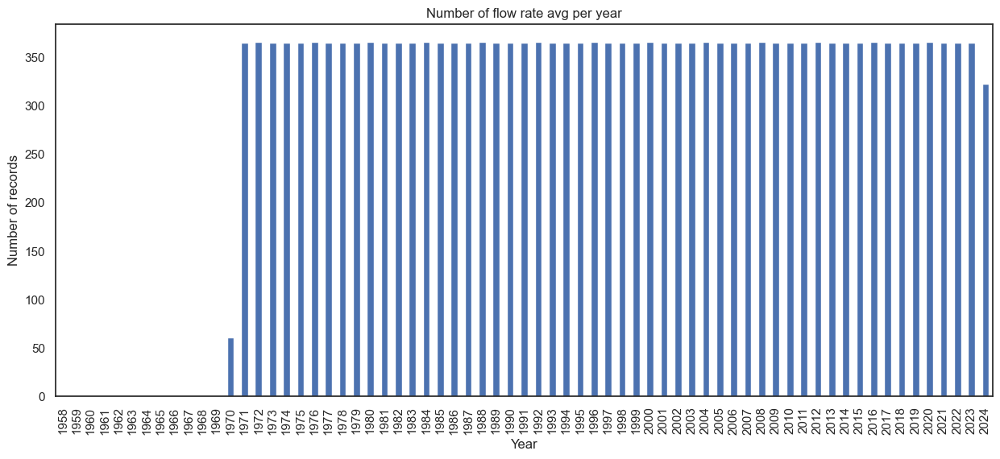

In [370]:
# plotting a bar chart to visualize, how many data is available per year to detect, if there are missing values by missing wholesome records

plt.figure(figsize=(15, 6))
data_per_year.plot(kind='bar')
plt.title('Number of flow rate avg per year')
plt.xlabel('Year')
plt.ylabel('Number of records')

<span style='color: red;'>I always recommend to do the group by in one cell, print the result dataframe to see the output is what you wanted and, in another cell, do the plot!</span>
<span style='color: green;'>done</span>

<span style='color: red;'>What do you want to check with this plot? If you have missing days from a specific year? It would be great to know why you are plotting this and what you interpret from it. Probably if that's what you want to check (if you have data for all days in all years), I would have use a different title.</span><br>
<span style='color: green;'>that's plot show that there are rows for every year, except 1958 - I assume the recording startet later in that year - and except in 2024, because the year <br>is still ongoing! Maybe a plot isn't really necessary: To count the numbers, could be also an approach and would be more acurate</span>

In [367]:
df_reservoir.isna().sum()

date                                0
reservoir_avg                       0
reservoir_max                       7
reservoir_min                       7
is_outlier_reservoir_avg            0
is_outlier_reservoir_avg_extreme    0
is_outlier_reservoir_max            0
is_outlier_reservoir_max_extreme    0
is_outlier_reservoir_min            0
is_outlier_reservoir_min_extreme    0
dtype: int64

In [368]:
df_weather.isna().sum()

date                   0
tavg                   0
tmin                   0
tmax                   0
prcp                   0
snow                1568
wdir               14632
wspd                9927
wpgt                9942
pres                9863
tsun                   5
is_outlier_tavg        0
is_outlier_tmin        0
is_outlier_tmax        0
is_outlier_prcp        0
is_outlier_snow        0
is_outlier_wspd        0
is_outlier_wpgt        0
is_outlier_pres        0
dtype: int64

# ARCHIVE

In [369]:
# checking NaNs:
df_river_flow_rate.isna().sum()

NameError: name 'df_river_flow_rate' is not defined

In [ ]:
# checking, if there are NaNs after June 2011
df_river_flow_rate_nans = df_river_flow_rate[(df_river_flow_rate['Maximum']).isna() | (df_river_flow_rate['Minimum'].isna())]
df_river_flow_rate_nans

# NaNs of Maximum and Minimum after 31.10.1970, afterwards no NaNs

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.58,"74,4",NaN,NaN,Geprueft
1,02.11.58,"77,9",NaN,NaN,Geprueft
2,03.11.58,"72,2",NaN,NaN,Geprueft
3,04.11.58,93,NaN,NaN,Geprueft
4,05.11.58,121,NaN,NaN,Geprueft
...,...,...,...,...,...
4378,27.10.70,"56,2",NaN,NaN,Geprueft
4379,28.10.70,"59,5",NaN,NaN,Geprueft
4380,29.10.70,"67,4",NaN,NaN,Geprueft
4381,30.10.70,"74,9",NaN,NaN,Geprueft


In [ ]:
# loading and putting all dataframes together: water_quality
df_water_quality = df_concat('../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv','../datasets/river/fluesse-schwebstoff/16005701_01.01.2024_31.08.2024_tmw_0.csv', ";")


dataframe for is completed. There are 21250 rows.


In [ ]:
df_water_quality.head(10)
# first data from 01.10.1965

,Zeitpunkt,Schwebstoff-Konzentration [g/m^3],Prüfstatus,Schwebstoff-Fracht [t],Prüfstatus.1,Schwebstoff-Abtrag [t/m^2],Prüfstatus.2,Schwebstoff-Transport [kg/s],Prüfstatus.3
0,31.10.65,25,Rohdaten,"47,85",Rohdaten,"0,02",Rohdaten,"0,55",Rohdaten
1,01.11.65,"18,06",Rohdaten,"32,47",Rohdaten,"0,01",Rohdaten,"0,38",Rohdaten
2,02.11.65,"11,57",Rohdaten,"20,55",Rohdaten,"0,01",Rohdaten,"0,24",Rohdaten
3,03.11.65,"11,11",Rohdaten,"27,77",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten
4,04.11.65,"9,88",Rohdaten,"26,54",Rohdaten,"0,01",Rohdaten,"0,31",Rohdaten
5,05.11.65,"5,87",Rohdaten,"16,67",Rohdaten,"0,01",Rohdaten,"0,19",Rohdaten
6,06.11.65,"5,56",Rohdaten,"14,31",Rohdaten,"0,01",Rohdaten,"0,17",Rohdaten
7,07.11.65,"5,56",Rohdaten,"12,34",Rohdaten,0,Rohdaten,"0,14",Rohdaten
8,08.11.65,"6,79",Rohdaten,"13,54",Rohdaten,"0,01",Rohdaten,"0,16",Rohdaten
9,09.11.65,"12,04",Rohdaten,"27,42",Rohdaten,"0,01",Rohdaten,"0,32",Rohdaten


In [ ]:
df_water_quality.info()
# no NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 21250 entries, 0 to 233
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Zeitpunkt                          21250 non-null  object
 1   Schwebstoff-Konzentration [g/m^3]  21250 non-null  object
 2   Prüfstatus                         21250 non-null  object
 3   Schwebstoff-Fracht [t]             21250 non-null  object
 4   Prüfstatus.1                       21250 non-null  object
 5   Schwebstoff-Abtrag [t/m^2]         21250 non-null  object
 6   Prüfstatus.2                       21250 non-null  object
 7   Schwebstoff-Transport [kg/s]       21250 non-null  object
 8   Prüfstatus.3                       21250 non-null  object
dtypes: object(9)
memory usage: 1.6+ MB


In [ ]:
# loading and putting all dataframes together: water_level
df_water_level = df_concat('../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv', '../datasets/river/fluesse-wasserstand/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 18567 rows.


In [ ]:
df_water_level.head(10)
# first data from 01.11.1973

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.73,50,58,44,Geprueft
1,02.11.73,45,53,43,Geprueft
2,03.11.73,49,57,43,Geprueft
3,04.11.73,45,57,31,Geprueft
4,05.11.73,46,52,35,Geprueft
5,06.11.73,49,54,43,Geprueft
6,07.11.73,51,54,43,Geprueft
7,08.11.73,48,54,40,Geprueft
8,09.11.73,46,53,33,Geprueft
9,10.11.73,43,50,38,Geprueft


In [ ]:
df_water_level.info()
# no NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       18567 non-null  object
 1   Mittelwert  18567 non-null  int64 
 2   Maximum     18567 non-null  int64 
 3   Minimum     18567 non-null  int64 
 4   Prüfstatus  18567 non-null  object
dtypes: int64(3), object(2)
memory usage: 870.3+ KB


In [ ]:
# loading and putting all dataframes together: daily_water_temperature
df_daily_water_temperature = df_concat('/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv','/Users/natalie/Documents/_DA_course/finalProject_/finalProjectNatalie/datasets/river/fluesse-wassertemperatur/16005701_01.01.2024_31.08.2024_tmw_0.csv', ';')

dataframe for is completed. There are 15288 rows.


In [ ]:
df_daily_water_temperature.head(10)
# data from 01.11.1980

,Datum,Mittelwert,Maximum,Minimum,Prüfstatus
0,01.11.80,"8,1","8,1","8,1",Geprueft
1,02.11.80,"7,3","7,3","7,3",Geprueft
2,03.11.80,"5,8","5,8","5,8",Geprueft
3,04.11.80,"5,6","5,6","5,6",Geprueft
4,05.11.80,"4,8","4,8","4,8",Geprueft
5,06.11.80,"4,7","4,7","4,7",Geprueft
6,07.11.80,"6,1","6,1","6,1",Geprueft
7,08.11.80,"7,7","7,7","7,7",Geprueft
8,09.11.80,"7,5","7,5","7,5",Geprueft
9,10.11.80,"7,6","7,6","7,6",Geprueft


In [ ]:
df_daily_water_temperature.info()
# non NaNs

<class 'pandas.core.frame.DataFrame'>
Index: 15288 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Datum       15288 non-null  object
 1   Mittelwert  15288 non-null  object
 2   Maximum     15288 non-null  object
 3   Minimum     15288 non-null  object
 4   Prüfstatus  15288 non-null  object
dtypes: object(5)
memory usage: 716.6+ KB


In [ ]:
# creating 1 dataframe for the water-variables river flow rate, water quality: suspended solids, water level, daily water temperatures
# checking all columns and potientially rename them:
#df_river_flow_rate.columns: done
#df_water_level.columns
#df_water_quality.columns
#df_daily_water_temperature.columns

In [ ]:
# renaming the columns of df_river_flow_rate:
df_river_flow_rate = df_river_flow_rate.rename(columns={'Mittelwert' : 'avg_flow_rate',
                                   'Maximum' : 'max_flow_rate',
                                   'Minimum' : 'min_flow_rate'})
df_river_flow_rate.columns


Index(['Datum', 'avg_flow_rate', 'max_flow_rate', 'min_flow_rate',
       'Prüfstatus'],
      dtype='object')

In [ ]:
# dropping the column 'Prüfstatus'
df_river_flow_rate = df_river_flow_rate.drop(columns='Prüfstatus')
df_river_flow_rate.columns

Index(['Datum', 'avg_flow_rate', 'max_flow_rate', 'min_flow_rate'], dtype='object')

In [ ]:
# Changing the order of the columns
cols_river = df_river.columns.to_list()
cols_river

['avg_water_temperature',
 'max_water_temperature',
 'min_water_temperature',
 'avg_water_level',
 'max_water_level',
 'min_water_level',
 'suspended_solids_concentration',
 'suspended_solid_load',
 'suspended_sediment_erosion',
 'suspended_sediment_transport',
 'avg_flow_rate',
 'max_flow_rate',
 'min_flow_rate',
 'date']

In [ ]:
# putting 'date' at first place
cols_river.insert(0, cols_river.pop(cols_river.index('date')))
df_river= df_river[cols_river]
df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,1980-11-01,"8,1","8,1","8,1",71,86,59,"5,57","25,56","0,01","0,3","47,9","63,4",37
1,1980-11-02,"7,3","7,3","7,3",59,62,54,"5,1","21,54","0,01","0,25","36,7","39,6","32,7"
2,1980-11-03,"5,8","5,8","5,8",68,83,48,"5,14","20,16","0,01","0,23","45,8",60,"27,9"
3,1980-11-04,"5,6","5,6","5,6",77,80,73,"7,6","31,26","0,01","0,36","53,4","56,9","49,9"
4,1980-11-05,"4,8","4,8","4,8",77,89,70,"9,03","37,83","0,01","0,44","54,1","66,5",47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,"16,6","17,6","15,8",130,137,121,NaN,NaN,NaN,NaN,66,"76,7",53
15284,2024-08-28,"17,8",19,"16,6",117,121,113,NaN,NaN,NaN,NaN,"47,5",53,"42,2"
15285,2024-08-29,"18,7","19,6","17,7",114,116,110,NaN,NaN,NaN,NaN,"43,2","46,1","38,5"
15286,2024-08-30,"19,1","19,8","18,1",114,116,108,NaN,NaN,NaN,NaN,"43,5","46,1","36,3"


In [ ]:
# adding columns year and month:
df_river['year'] = df_river['date'].dt.year
df_river['month'] = df_river['date'].dt.month
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  object        
 2   max_water_temperature           15288 non-null  object        
 3   min_water_temperature           15288 non-null  object        
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15258 non-null  object        
 8   suspended_solid_load            15258 non-null  object        
 9   suspended_sediment_erosion      15258 non-null  object        
 10  suspended_sediment_transport    15258 non-null  object        
 11  av

In [ ]:
# first replacing the "," with "." so that I can convert the strings into floats:

df_river['avg_water_temperature'] = df_river['avg_water_temperature'].str.replace(',', '.')
df_river['max_water_temperature'] = df_river['max_water_temperature'].str.replace(',', '.')
df_river['min_water_temperature'] = df_river['min_water_temperature'].str.replace(',', '.')
df_river['suspended_solids_concentration'] = df_river['suspended_solids_concentration'].str.replace(',', '.')
df_river['suspended_solid_load'] = df_river['suspended_solid_load'].str.replace(',', '.') 
df_river['suspended_sediment_erosion'] = df_river['suspended_sediment_erosion'].str.replace(',', '.')
df_river['suspended_sediment_transport'] = df_river['suspended_sediment_transport'].str.replace(',', '.')
df_river['avg_flow_rate'] = df_river['avg_flow_rate'].str.replace(',', '.')
df_river['max_flow_rate'] = df_river['max_flow_rate'].str.replace(',', '.')
df_river['min_flow_rate'] = df_river['min_flow_rate'].str.replace(',', '.')     

df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.3,47.9,63.4,37,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.1,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.6,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47,1980,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,16.6,17.6,15.8,130,137,121,NaN,NaN,NaN,NaN,66,76.7,53,2024,8
15284,2024-08-28,17.8,19,16.6,117,121,113,NaN,NaN,NaN,NaN,47.5,53,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,NaN,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,NaN,NaN,NaN,NaN,43.5,46.1,36.3,2024,8


In [ ]:
# changing all objects (but date, month, year) into float64
df_river['avg_water_temperature'] = df_river['avg_water_temperature'].astype(dtype='float64')
df_river['max_water_temperature'] = df_river['max_water_temperature'].astype(dtype='float64')
df_river['min_water_temperature'] = df_river['min_water_temperature'].astype(dtype='float64')
df_river['suspended_solids_concentration'] = df_river['suspended_solids_concentration'].astype(dtype='float64')
df_river['suspended_solid_load'] = df_river['suspended_solid_load'].astype(dtype='float64')
df_river['suspended_sediment_erosion'] = df_river['suspended_sediment_erosion'].astype(dtype='float64')
df_river['suspended_sediment_transport'] = df_river['suspended_sediment_transport'].astype(dtype='float64')
df_river['avg_flow_rate'] = df_river['avg_flow_rate'].astype(dtype='float64')
df_river['max_flow_rate'] = df_river['max_flow_rate'].astype(dtype='float64')
df_river['min_flow_rate'] = df_river['min_flow_rate'].astype(dtype='float64')
 
df_river.info()            

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15258 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
df_river.isna().sum()

date                               0
avg_water_temperature              0
max_water_temperature              0
min_water_temperature              0
avg_water_level                    0
max_water_level                    0
min_water_level                    0
suspended_solids_concentration    30
suspended_solid_load              30
suspended_sediment_erosion        30
suspended_sediment_transport      30
avg_flow_rate                      0
max_flow_rate                      0
min_flow_rate                      0
year                               0
month                              0
dtype: int64

In [ ]:
df_river.groupby('year')['date'].count()

year
1980     61
1981    365
1982    365
1983    365
1984    366
1985    365
1986    365
1987    365
1988    366
1989    365
1990    365
1991    365
1992    366
1993    365
1994    365
1995    365
1996    366
1997    365
1998    365
1999    365
2000    366
2001    365
2002    365
2003    365
2004    366
2005    365
2006    365
2007    365
2008    366
2009    361
2010    365
2011    365
2012    267
2013    320
2014    365
2015    365
2016    366
2017    361
2018    365
2019    365
2020    360
2022    166
2023    365
2024    244
Name: date, dtype: int64

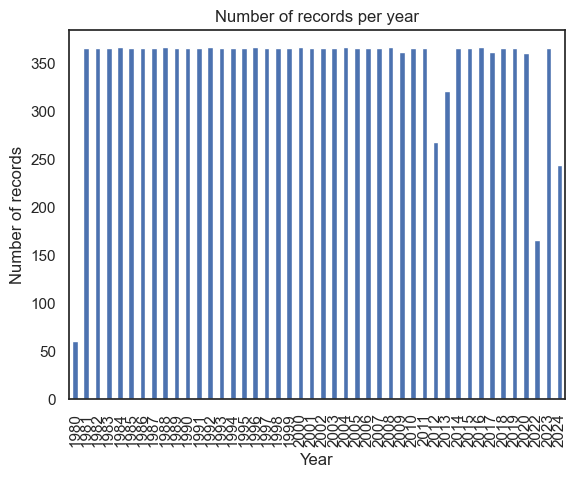

In [ ]:
# plot of records per year:
data_per_year = df_river.groupby('year').size()

data_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [ ]:
# how much data is missing in 1980, 2012, 2013 and 2022?
num_missing_records_1980 =  366 - df_river['year'][df_river['year']==1980].count()
num_missing_records_2012 =  366 - df_river['year'][df_river['year']==2012].count()
num_missing_records_2013 =  365 - df_river['year'][df_river['year']==2013].count()
num_missing_records_2022 =  365 - df_river['year'][df_river['year']==2022].count()
num_missing_records_2024 =  365 - df_river['year'][df_river['year']==2024].count()

print('Missing data for: 1980:', num_missing_records_1980, '2012:', num_missing_records_2012, '2013:', num_missing_records_2013, '2022:', num_missing_records_2022, '2024:', num_missing_records_2024)

Missing data for: 1980: 305 2012: 99 2013: 45 2022: 199 2024: 121


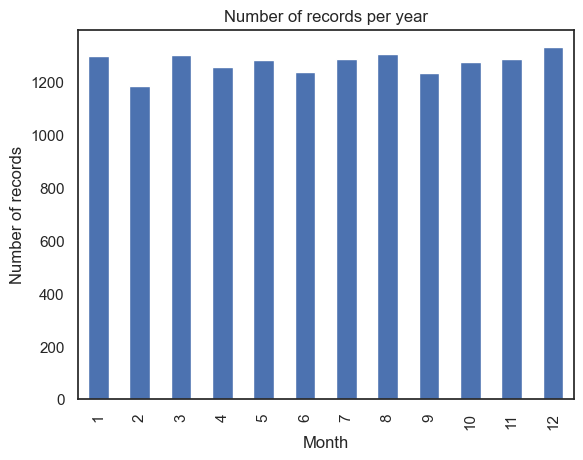

In [ ]:
# plot of records per month:
data_per_month_river = df_river.groupby('month').size()

data_per_month_river.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Month')
plt.ylabel('Number of records')
#plt.show()

In [ ]:
df_river_suspended_nans = df_river[df_river['suspended_solids_concentration'].isna()]
df_river_suspended_nans

# no data of water quality from 19.07.2022 until 07.08.22 and after 21.08.24
# deleting all rows after 21.08.
# what shall I do with the data in 2022? Maybe fill them with the mean of 2 weeks before and 2 weeks after?
# looking into it:

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of suspended solids concentration the monthly mean
df_river.groupby('month')['suspended_solids_concentration'].mean()


month
1     11.566006
2     13.412763
3     17.059093
4     15.863943
5     26.262615
6     35.792935
7     52.707526
8     34.954255
9     15.906783
10    13.360877
11    11.295578
12    11.554039
Name: suspended_solids_concentration, dtype: float64

In [ ]:
# getting the mean of suspended concentration in the month July:
mean_concentration_july = df_river['suspended_solids_concentration'][df_river['month'] == 7].mean()
round(mean_concentration_july,2)

52.71

In [ ]:
# getting the right part of the dataframe for the july NaNs:
df_river_suspended_nans_july = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==7)]
df_river_suspended_nans_july

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14513,2022-07-19,19.9,20.5,19.1,94,103,88,NaN,NaN,NaN,NaN,34.1,42.6,28.4,2022,7
14514,2022-07-20,20.4,21.4,19.6,99,107,93,NaN,NaN,NaN,NaN,39.1,47.3,32.6,2022,7
14515,2022-07-21,20.1,21.3,19.3,98,102,93,NaN,NaN,NaN,NaN,37.7,41.6,32.6,2022,7
14516,2022-07-22,19.6,20.5,18.8,92,95,87,NaN,NaN,NaN,NaN,32.0,34.4,27.7,2022,7
14517,2022-07-23,19.9,20.4,19.6,89,91,87,NaN,NaN,NaN,NaN,29.5,30.9,27.7,2022,7
14518,2022-07-24,19.8,20.7,19.1,89,94,87,NaN,NaN,NaN,NaN,29.7,33.5,27.7,2022,7
14519,2022-07-25,20.6,21.5,19.8,89,96,85,NaN,NaN,NaN,NaN,29.1,31.7,26.2,2022,7
14520,2022-07-26,20.3,21.3,19.8,100,109,92,NaN,NaN,NaN,NaN,39.7,49.8,31.7,2022,7
14521,2022-07-27,19.3,19.7,19.1,93,95,91,NaN,NaN,NaN,NaN,32.5,34.4,30.9,2022,7
14522,2022-07-28,19.1,20.2,18.4,93,99,90,NaN,NaN,NaN,NaN,32.9,38.3,30.0,2022,7


In [ ]:
# fill in the July-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month'] == 7), 'suspended_solids_concentration'] = round(mean_concentration_july,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15271 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
# getting the mean of suspended concentration in the month august:
mean_concentration_august = df_river['suspended_solids_concentration'][df_river['month'] == 8].mean()
round(mean_concentration_august,2)

34.95

In [ ]:
# getting the right part of the dataframe for the august NaNs:
df_river_suspended_nans_august = df_river[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8)]
df_river_suspended_nans_august

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
14526,2022-08-01,19.4,19.8,18.9,90,92,86,NaN,NaN,NaN,NaN,29.8,31.7,26.9,2022,8
14527,2022-08-02,20.0,20.7,19.5,91,93,89,NaN,NaN,NaN,NaN,30.9,32.6,29.2,2022,8
14528,2022-08-03,20.4,21.1,19.8,96,103,90,NaN,NaN,NaN,NaN,35.5,42.6,30.0,2022,8
14529,2022-08-04,20.7,21.5,19.7,98,103,93,NaN,NaN,NaN,NaN,31.8,36.0,27.8,2022,8
14530,2022-08-05,21.1,21.5,20.5,93,96,90,NaN,NaN,NaN,NaN,27.9,30.3,25.5,2022,8
14531,2022-08-06,20.4,21.2,19.4,89,97,86,NaN,NaN,NaN,NaN,24.7,30.3,22.8,2022,8
14532,2022-08-07,19.0,19.4,18.6,87,89,85,NaN,NaN,NaN,NaN,23.4,24.8,22.8,2022,8
15278,2024-08-22,17.6,18.4,16.7,131,136,125,NaN,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,NaN,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,NaN,NaN,NaN,NaN,60.5,67.7,51.6,2024,8


In [ ]:
# fill in the august-NaNs with the mean:
df_river.loc[(df_river['suspended_solids_concentration'].isna()) & (df_river['month']==8), 'suspended_solids_concentration'] = round(mean_concentration_august,2)
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
df_river.tail(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
15278,2024-08-22,17.6,18.4,16.7,131,136,125,34.95,NaN,NaN,NaN,68.0,75.2,58.8,2024,8
15279,2024-08-23,18.0,19.1,16.9,127,130,121,34.95,NaN,NaN,NaN,61.8,66.2,53.0,2024,8
15280,2024-08-24,18.8,20.0,17.6,126,131,120,34.95,NaN,NaN,NaN,60.5,67.7,51.6,2024,8
15281,2024-08-25,18.3,19.7,17.5,121,144,111,34.95,NaN,NaN,NaN,52.7,87.5,39.7,2024,8
15282,2024-08-26,16.4,17.4,16.1,142,150,131,34.95,NaN,NaN,NaN,84.2,96.9,67.7,2024,8
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8
15287,2024-08-31,19.1,19.7,18.2,109,115,104,34.95,NaN,NaN,NaN,37.7,44.8,32.0,2024,8


In [ ]:
df_river.shape

(15288, 16)

In [ ]:
df_river_raw= df_river.copy()

## WEATHER:

In [ ]:
# WEATHER:
# Loading the xls-files into DataFrames (first: 2011-06-01 to 2016, second: 2017 to 2024-09-05)
path_weather_2017_to_now = "../datasets/weather/weather20170102-20240905.xlsx"
path_weather_jun2011_to_2016 = "../datasets/weather/weather20110601-20161231.xlsx"

df_weather_jun2011_to_2016 = pd.read_excel(path_weather_jun2011_to_2016)
df_weather_2017_to_now = pd.read_excel(path_weather_2017_to_now)


In [ ]:
# dataframe 2011 - 2016:
df_weather_jun2011_to_2016

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480
...,...,...,...,...,...,...,...,...,...,...,...
2036,2016-12-27,2.7,0.8,4.2,0.0,NaN,274.0,17.3,47.9,1040.5,90
2037,2016-12-28,2.9,-1.4,5.0,0.0,NaN,272.0,10.8,34.9,1043.3,108
2038,2016-12-29,0.7,-2.4,5.8,0.0,NaN,104.0,7.2,24.5,1041.1,402
2039,2016-12-30,-3.6,-5.3,-1.1,0.0,NaN,322.0,5.0,13.7,1040.2,336


In [ ]:
# dataframe 2017 - now:
df_weather_2017_to_now

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2017-01-02,-2.4,-5.4,0.8,3.2,NaN,279.0,10.4,33.5,1022.7,18.0
1,2017-01-03,-0.9,-2.1,0.6,0.0,40.0,257.0,11.2,37.1,1026.7,216.0
2,2017-01-04,0.4,-0.9,1.3,2.2,30.0,260.0,26.6,73.1,1016.0,0.0
3,2017-01-05,-3.3,-7.1,-0.2,0.0,50.0,318.0,15.1,63.7,1025.9,0.0
4,2017-01-06,-9.3,-13.0,-6.5,0.0,50.0,25.0,5.8,19.4,1040.9,300.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# checking if they were loades completely:
print("rows for 2011 until 2016:", df_weather_jun2011_to_2016.shape[0])
print("rows for 2017 until now:", df_weather_2017_to_now.shape[0])

rows for 2011 until 2016: 2041
rows for 2017 until now: 2804


In [ ]:
#one dataframe with all the data of the weather:
df_weather = pd.concat([df_weather_jun2011_to_2016, df_weather_2017_to_now])
df_weather.head()

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0


In [ ]:
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_weather.columns

Index(['date', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt',
       'pres', 'tsun'],
      dtype='object')

In [ ]:
# How much NaNs do we have?
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow    2749
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
dtype: int64

In [ ]:
# changing date into a dateformat:
df_weather['datenew'] = pd.to_datetime(df_weather['date'])
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,datenew
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0,2011-06-01
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0,2011-06-02
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0,2011-06-03
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0,2011-06-04
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0,2011-06-05
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0,2024-09-01
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0,2024-09-02
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024-09-03
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-09-04


In [ ]:
# putting datenew on the first position:
cols_weather = df_weather.columns.to_list()
cols_weather.insert(0, cols_weather.pop(cols_weather.index('datenew')))
df_weather = df_weather[cols_weather]
df_weather


,datenew,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# dropping 'date'
df_weather = df_weather.drop(columns='date')

In [ ]:
# renaming datenew into date
df_weather = df_weather.rename(columns={'datenew':'date'})
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,NaN,65.0,7.2,22.0,1013.9,564.0
2800,2024-09-02,22.0,18.4,27.2,0.0,NaN,328.0,7.6,30.2,1012.8,493.0
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0
2802,2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# NaNs in windspeed and tmax and wpgt: I will do the same as for the missing values in the water dataframe. filling it with the means of the month. So first I have to add the columns year and month:
# adding columns year and month:
df_weather['year'] = df_weather['date'].dt.year
df_weather['month'] = df_weather['date'].dt.month
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    2096 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4788 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


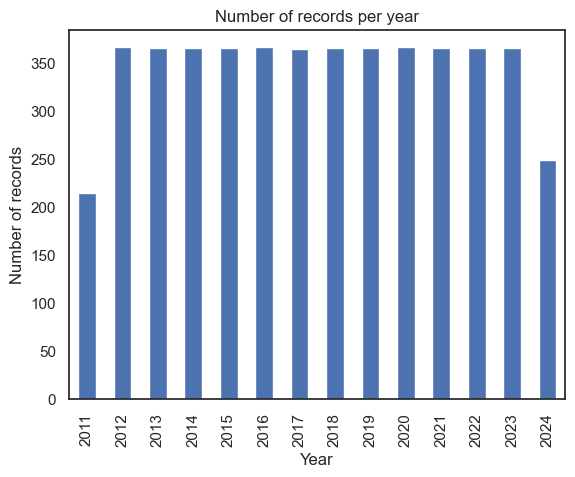

In [ ]:
# plot of records per year:
data_per_year_weather = df_weather.groupby('year').size()

data_per_year_weather.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()

In [ ]:
missing_records = {}
# For-Schleife für die Jahre 2011 bis 2024
for year in range(2011, 2024):
    # Bestimme, ob das Jahr ein Schaltjahr ist
    days_in_year = 366 if year % 4 == 0 else 365
    
    # Berechne die Anzahl der fehlenden Datensätze für das jeweilige Jahr
    num_missing_records = days_in_year - df_weather['year'][df_weather['year'] == year].count()
    
    # Speichere die fehlenden Datensätze im Dictionary
    missing_records[year] = num_missing_records

# Ausgabe der fehlenden Datensätze
print(missing_records)

{2011: 151, 2012: 0, 2013: 0, 2014: 0, 2015: 0, 2016: 0, 2017: 1, 2018: 0, 2019: 0, 2020: 0, 2021: 0, 2022: 0, 2023: 0}


In [ ]:
# es fehlt nur ein Datensatz in 2017. I will leave it by that.

In [ ]:
# NaNs snow: I will fill in for everry missing value a '0', because it is obvious, that it isn't documented in summer
df_weather['snow'] = df_weather['snow'].fillna(0)
df_weather

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2799,2024-09-01,23.2,17.4,29.5,0.0,0.0,65.0,7.2,22.0,1013.9,564.0,2024,9
2800,2024-09-02,22.0,18.4,27.2,0.0,0.0,328.0,7.6,30.2,1012.8,493.0,2024,9
2801,2024-09-03,22.8,16.8,28.9,0.0,0.0,294.0,5.4,18.7,1013.9,658.0,2024,9
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2024,9


In [ ]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       5
snow       0
wdir     192
wspd      57
wpgt      59
pres       4
tsun       2
year       0
month      0
dtype: int64

In [ ]:
# tmax is only in September 2024, so I leave it (because I will cut it off)
# then look into wspd
df_weather_wspd_nans = df_weather[df_weather['wspd'].isna()]
df_weather_wspd_nans

# no data of wspd in Dez, Jan, Feb and Sept
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
927,2013-12-14,0.9,-4.1,7.3,2.3,0.0,NaN,NaN,46.4,1030.9,306.0,2013,12
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wspd'].mean()


month
1     11.504852
2     11.704310
3     11.221092
4     10.548974
5     10.032754
6      9.601429
7      9.421429
8      8.710369
9      8.426410
10     8.732506
11     9.210000
12    10.619900
Name: wspd, dtype: float64

In [ ]:
# getting the mean of wspd in the month January:
mean_wspd_jan = df_weather['wspd'][df_weather['month'] == 1].mean()
round(mean_wspd_jan,2)


11.5

In [ ]:
# getting the right part of the dataframe for the july NaNs:
df_weather_wspd_nans_jan = df_weather[(df_weather['wspd'].isna()) & (df_weather['month']==1)]
df_weather_wspd_nans_jan

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,NaN,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,NaN,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,NaN,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,NaN,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,NaN,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,NaN,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,NaN,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,NaN,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,NaN,NaN,1026.1,0.0,2015,1
1319,2015-01-10,13.6,10.5,16.3,6.2,0.0,NaN,NaN,NaN,1016.1,342.0,2015,1


In [ ]:
# fill in the July-NaNs with the mean:
df_weather.loc[(df_weather['wspd'].isna()) & (df_weather['month'] == 1), 'wspd'] = round(mean_wspd_jan,2)
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4819 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
def fillna_mean_month(col, month):

    # getting the mean of wspd in the month January:
    mean_variable_month = df_weather[col][df_weather['month'] == month].mean()
    mean_varibale_month = round(mean_variable_month,2)

    df_weather.loc[(df_weather[col].isna()) & (df_weather['month'] == month), col] = round(mean_variable_month,2)
    df_weather.info()

In [ ]:
fillna_mean_month('wspd',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4824 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
fillna_mean_month('wspd',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4844 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
fillna_mean_month('wspd',12)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4786 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# looking over the means grouped by month to possibly fill in the NaNs of wspd the monthly mean
df_weather.groupby('month')['wpgt'].mean()

month
1     37.428571
2     38.334483
3     37.491067
4     36.617436
5     36.278055
6     36.292143
7     36.726959
8     34.092379
9     29.828462
10    30.134491
11    30.587179
12    35.424566
Name: wpgt, dtype: float64

In [ ]:
# looking into wpgt
df_weather_wpgt_nans = df_weather[df_weather['wpgt'].isna()]
df_weather_wpgt_nans

# no data of wpgt in may, jan, feb, sept, august
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
1084,2014-05-20,18.0,9.4,25.7,0.0,0.0,131.0,7.90,NaN,1012.3,756.0,2014,5
1310,2015-01-01,-2.9,-5.8,2.4,0.0,230.0,NaN,11.50,NaN,1038.1,354.0,2015,1
1311,2015-01-02,0.9,-5.6,6.3,6.2,180.0,NaN,11.50,NaN,1033.4,162.0,2015,1
1312,2015-01-03,2.9,1.1,8.4,19.7,20.0,NaN,11.50,NaN,1026.2,0.0,2015,1
1313,2015-01-04,1.5,1.1,2.0,0.1,0.0,NaN,11.50,NaN,1031.0,0.0,2015,1
1314,2015-01-05,1.7,0.3,4.7,0.0,0.0,NaN,11.50,NaN,1033.5,156.0,2015,1
1315,2015-01-06,2.4,-1.3,7.7,0.0,0.0,NaN,11.50,NaN,1026.4,342.0,2015,1
1316,2015-01-07,1.9,-1.1,3.7,1.1,0.0,NaN,11.50,NaN,1030.4,0.0,2015,1
1317,2015-01-08,5.5,-0.1,9.4,1.0,0.0,NaN,11.50,NaN,1029.3,0.0,2015,1
1318,2015-01-09,7.9,5.0,10.5,2.4,0.0,NaN,11.50,NaN,1026.1,0.0,2015,1


In [ ]:
# filling the missing data in january with the all over mean of january
fillna_mean_month('wpgt',1)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4817 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in february with the all over mean of january
fillna_mean_month('wpgt',2)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4837 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in may with the all over mean of may
fillna_mean_month('wpgt',5)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4839 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in sept with the all over mean of september
fillna_mean_month('wpgt',9)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4844 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# filling the missing data in august with the all over mean of august
fillna_mean_month('wpgt',8)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4840 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
# then look into prcp
df_weather_prcp_nans = df_weather[df_weather['prcp'].isna()]
df_weather_prcp_nans

# no data of prcp in april (September I will delete)
# deleting all rows after in September 2024

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
455,2018-04-02,9.5,1.9,16.5,NaN,0.0,178.0,9.00,25.20,1011.2,600.0,2018,4
456,2018-04-03,15.9,10.0,22.6,NaN,0.0,178.0,9.70,45.40,1005.8,480.0,2018,4
457,2018-04-04,15.4,8.8,23.3,NaN,0.0,199.0,12.60,65.20,1005.2,576.0,2018,4
2802,2024-09-04,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9
2803,2024-09-05,NaN,NaN,NaN,NaN,0.0,NaN,8.43,29.83,NaN,NaN,2024,9


In [ ]:
# filling the missing data in april with the all over mean of april
fillna_mean_month('prcp',4)

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
df_weather.shape

(4845, 13)

In [ ]:
df_river.shape

(15288, 16)

In [ ]:
# copy of weather data:
df_weather_raw = df_weather.copy()

## Step 3: deeper look into the data
### a. river:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [ ]:
# looking into the datatypes
df_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   avg_water_temperature           15288 non-null  float64       
 2   max_water_temperature           15288 non-null  float64       
 3   min_water_temperature           15288 non-null  float64       
 4   avg_water_level                 15288 non-null  int64         
 5   max_water_level                 15288 non-null  int64         
 6   min_water_level                 15288 non-null  int64         
 7   suspended_solids_concentration  15288 non-null  float64       
 8   suspended_solid_load            15258 non-null  float64       
 9   suspended_sediment_erosion      15258 non-null  float64       
 10  suspended_sediment_transport    15258 non-null  float64       
 11  av

In [ ]:
df_river

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15283,2024-08-27,16.6,17.6,15.8,130,137,121,34.95,NaN,NaN,NaN,66.0,76.7,53.0,2024,8
15284,2024-08-28,17.8,19.0,16.6,117,121,113,34.95,NaN,NaN,NaN,47.5,53.0,42.2,2024,8
15285,2024-08-29,18.7,19.6,17.7,114,116,110,34.95,NaN,NaN,NaN,43.2,46.1,38.5,2024,8
15286,2024-08-30,19.1,19.8,18.1,114,116,108,34.95,NaN,NaN,NaN,43.5,46.1,36.3,2024,8


In [ ]:
df_river.describe().T

,count,mean,min,25%,50%,75%,max,std
date,15288,2001-12-09 16:02:21.287284224,1980-11-01 00:00:00,1991-04-19 18:00:00,2001-10-05 12:00:00,2012-03-27 06:00:00,2024-08-31 00:00:00,NaN
avg_water_temperature,15288.0,9.912055,0.2,5.5,9.6,14.1,21.8,4.830674
max_water_temperature,15288.0,10.198947,0.5,5.7,9.9,14.3,22.4,4.955
min_water_temperature,15288.0,9.631279,-0.1,5.3,9.3,13.8,21.4,4.732989
avg_water_level,15288.0,84.137232,19.0,59.0,78.0,99.0,495.0,35.951824
max_water_level,15288.0,93.129579,25.0,68.0,86.0,108.0,542.0,39.541371
min_water_level,15288.0,75.599359,11.0,52.0,70.0,91.0,451.0,33.177899
suspended_solids_concentration,15288.0,21.659735,1.05,6.66,10.82,17.75,2000.97,74.59221
suspended_solid_load,15258.0,231.565058,1.49,21.4525,43.35,98.615,50194.83,1305.091107
suspended_sediment_erosion,15258.0,0.082023,0.0,0.01,0.02,0.04,17.68,0.459831


In [ ]:
# creating a report, automatically in an html-file:
# profile_report_river = df_river.profile_report()
# profile_report_river.to_file(output_file='output_river_level.html')

In [ ]:
#profile_report_river

## Step 3: deeper look into the data
### b. weather:
- standard numbers
- eventually some visualizations to get a clearer view
- profile in pandas

In [ ]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tavg    4843 non-null   float64       
 2   tmin    4843 non-null   float64       
 3   tmax    4843 non-null   float64       
 4   prcp    4843 non-null   float64       
 5   snow    4845 non-null   float64       
 6   wdir    4653 non-null   float64       
 7   wspd    4845 non-null   float64       
 8   wpgt    4845 non-null   float64       
 9   pres    4841 non-null   float64       
 10  tsun    4843 non-null   float64       
 11  year    4845 non-null   int32         
 12  month   4845 non-null   int32         
dtypes: datetime64[ns](1), float64(10), int32(2)
memory usage: 492.1 KB


In [ ]:
df_weather.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4845,2018-01-17 13:53:23.219814144,2011-06-01 00:00:00,2014-09-24 00:00:00,2018-01-18 00:00:00,2021-05-13 00:00:00,2024-09-05 00:00:00,NaN
tavg,4843.0,10.959529,-12.6,4.9,10.9,17.1,29.5,7.643796
tmin,4843.0,6.705245,-16.6,1.4,6.7,12.2,21.5,6.633847
tmax,4843.0,15.640058,-9.7,8.6,15.6,22.9,36.9,9.034461
prcp,4843.0,2.631505,0.0,0.0,0.0,2.5,91.5,5.945939
snow,4845.0,4.945304,0.0,0.0,0.0,0.0,420.0,24.262493
wdir,4653.0,197.098431,0.0,100.0,233.0,265.0,359.0,92.313677
wspd,4845.0,9.955102,0.7,7.2,9.0,11.5,36.7,4.202105
wpgt,4845.0,34.937653,9.4,24.1,31.7,42.1,119.9,14.691284
pres,4841.0,1016.882813,980.0,1012.1,1016.8,1021.7,1044.9,8.139639


In [ ]:
# creating a report, automatically in an html-file:
#profile_report_weather = df_weather.profile_report()
#profile_report_weather.to_file(output_file='output_weather.html')

In [ ]:
#profile_report_weather

 ## Step 4: Data cleaning

## 4.1 Nans


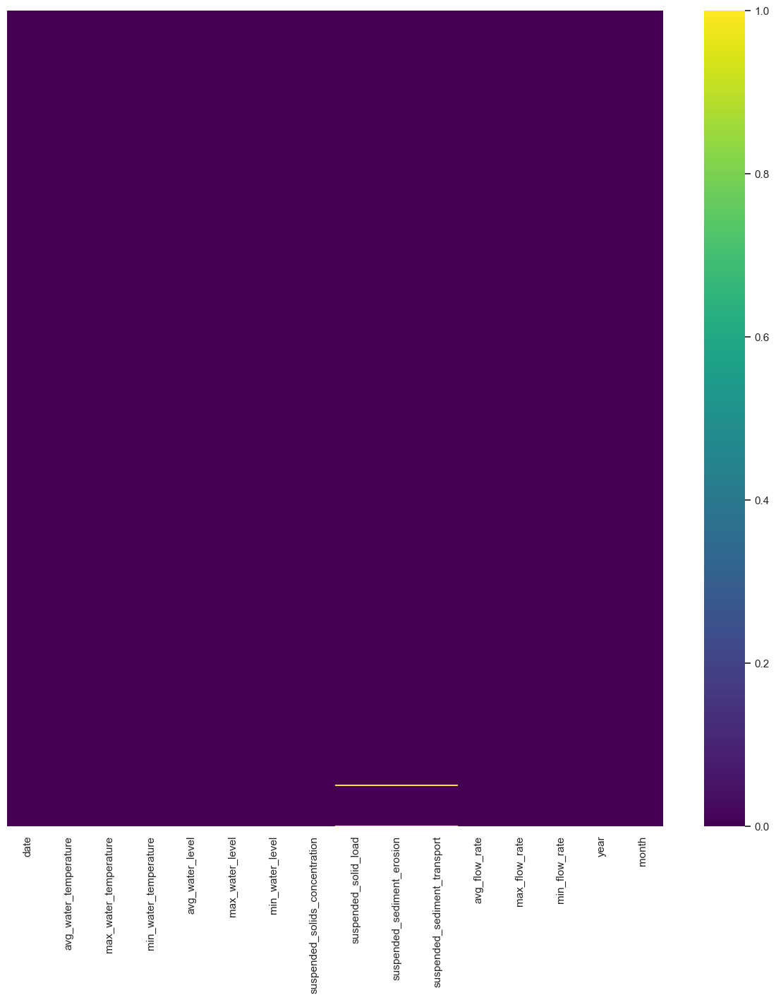

In [ ]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_river.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

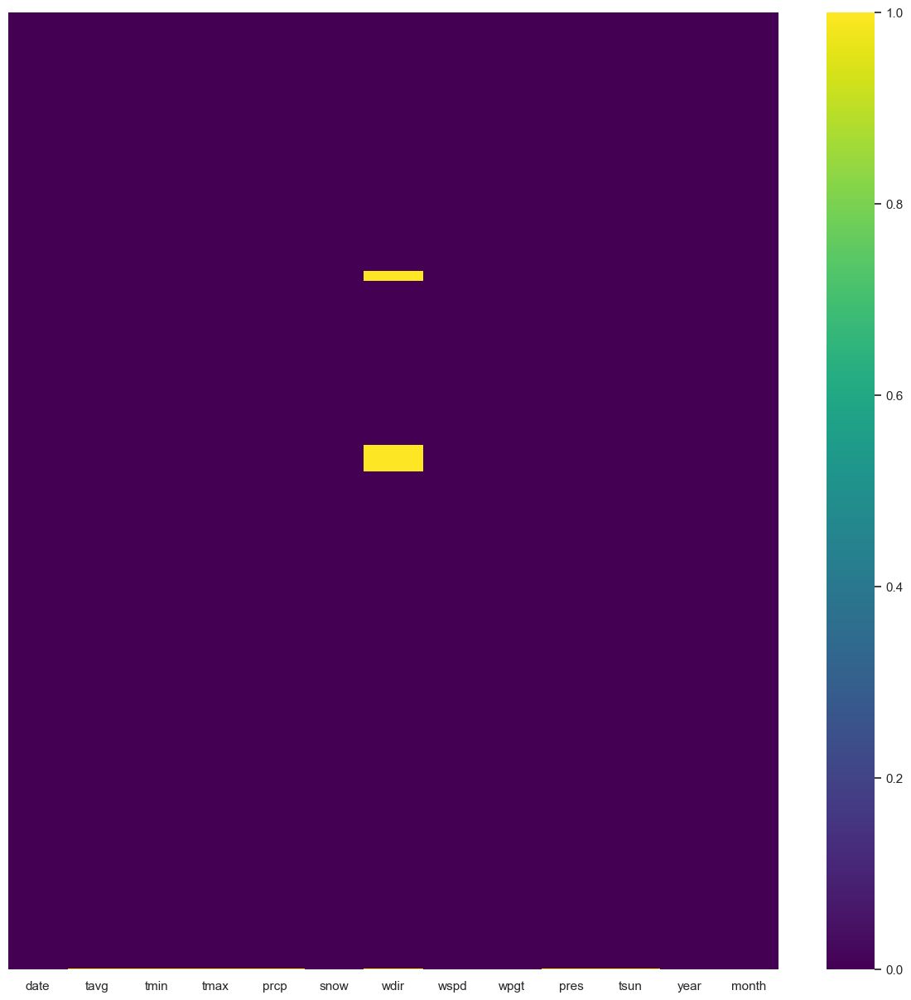

In [ ]:
# Heatmap of the nans river
sns.set(rc={'figure.figsize':(15, 15)})
sns.heatmap(df_weather.isnull(), yticklabels=False, cbar=True, cmap='viridis')

plt.show()

In [ ]:
df_weather.isna().sum()

date       0
tavg       2
tmin       2
tmax       2
prcp       2
snow       0
wdir     192
wspd       0
wpgt       0
pres       4
tsun       2
year       0
month      0
dtype: int64

## 4.2 dropping duplicates

In [ ]:
# check the number of rows before dropping duplicates RIVER
df_river.shape

(15288, 16)

In [ ]:
# drop duplicates RIVER
df_river_duplicates= df_river.drop_duplicates()
df_river_duplicates.shape

(15288, 16)

In [ ]:
# check the number of rows before dropping duplicates WEATHER
df_weather.shape

(4845, 13)

In [ ]:
df_weather_duplicates = df_weather.drop_duplicates()
df_weather_duplicates.shape

(4845, 13)

In [ ]:
### NO DUPLICATES AT ALL

## 4.3 managing outliers

In [ ]:
df_river.head(10)

,date,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate,year,month
0,1980-11-01,8.1,8.1,8.1,71,86,59,5.57,25.56,0.01,0.30,47.9,63.4,37.0,1980,11
1,1980-11-02,7.3,7.3,7.3,59,62,54,5.10,21.54,0.01,0.25,36.7,39.6,32.7,1980,11
2,1980-11-03,5.8,5.8,5.8,68,83,48,5.14,20.16,0.01,0.23,45.8,60.0,27.9,1980,11
3,1980-11-04,5.6,5.6,5.6,77,80,73,7.60,31.26,0.01,0.36,53.4,56.9,49.9,1980,11
4,1980-11-05,4.8,4.8,4.8,77,89,70,9.03,37.83,0.01,0.44,54.1,66.5,47.0,1980,11
5,1980-11-06,4.7,4.7,4.7,75,82,64,5.59,22.19,0.01,0.26,51.4,58.8,41.3,1980,11
6,1980-11-07,6.1,6.1,6.1,62,72,44,4.58,16.04,0.01,0.19,39.4,48.8,24.8,1980,11
7,1980-11-08,7.7,7.7,7.7,56,65,43,11.34,40.00,0.01,0.46,34.5,42.2,24.0,1980,11
8,1980-11-09,7.5,7.5,7.5,55,64,43,13.53,42.45,0.02,0.49,33.3,41.2,24.0,1980,11
9,1980-11-10,7.6,7.6,7.6,48,60,40,15.29,42.92,0.02,0.50,27.8,37.6,21.8,1980,11


In [ ]:
df_weather.head(10)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,year,month
0,2011-06-01,11.5,9.7,13.3,4.2,0.0,288.0,14.0,44.6,1021.7,0.0,2011,6
1,2011-06-02,13.4,10.9,17.1,0.0,0.0,42.0,10.8,32.8,1026.9,6.0,2011,6
2,2011-06-03,18.0,12.8,23.8,0.0,0.0,77.0,15.1,43.6,1022.9,378.0,2011,6
3,2011-06-04,20.6,14.6,27.8,0.0,0.0,80.0,12.2,31.3,1013.7,570.0,2011,6
4,2011-06-05,19.8,13.9,27.1,4.7,0.0,269.0,9.7,67.7,1007.7,480.0,2011,6
5,2011-06-06,16.9,12.7,24.6,13.1,0.0,244.0,8.6,55.1,1005.6,264.0,2011,6
6,2011-06-07,19.4,12.1,25.2,0.0,0.0,121.0,9.0,34.9,1004.3,624.0,2011,6
7,2011-06-08,15.5,12.5,19.3,1.9,0.0,261.0,12.6,51.5,1006.3,18.0,2011,6
8,2011-06-09,13.7,12.3,15.4,0.4,0.0,310.0,7.6,19.8,1014.9,0.0,2011,6
9,2011-06-10,14.4,10.9,18.6,0.0,0.0,329.0,6.8,21.2,1015.5,150.0,2011,6


In [ ]:
# don't have to differate in categorical and numerical, because there are only numerical variables
# RIVER:
#for col in df_river:
#  OutLiersBox(df_river, col)

In [ ]:
# looking deeper into the outliers water_level, suspendeds_solids-concentration, flow_rate
Q1 = df_river['avg_water_level'].quantile(.25)
Q3 = df_river['avg_water_level'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("water_level (avg): ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_water_level = df_river[(df_river['avg_water_level']) > upper_limit]
num_outliers_avg_water_level.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 563 rows -> a lot! in 43 years

water_level (avg):  40.0 lower limit=  -1.0 upper_limit=  159.0


563

In [ ]:
df_river['year'][df_river['avg_water_level']>159.0].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
# looking deeper into the outliers suspendeds_solids-concentration, flow_rate
Q1 = df_river['suspended_solids_concentration'].quantile(.25)
Q3 = df_river['suspended_solids_concentration'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'suspended_solids_concentration': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_sus_solids_concentration = df_river[(df_river['suspended_solids_concentration']) > upper_limit]
num_outliers_sus_solids_concentration.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 1390 rows -> a lot, in 43 years

'suspended_solids_concentration':  11.09 lower limit=  -9.974999999999998 upper_limit=  34.385


1390

In [ ]:
df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
df_river['date'][df_river['suspended_solids_concentration']>34.385] == df_river['date'][df_river['avg_water_level']>159.0]

ValueError: Can only compare identically-labeled Series objects

In [ ]:
# looking deeper into the outliers of flow_rate
Q1 = df_river['avg_flow_rate'].quantile(.25)
Q3 = df_river['avg_flow_rate'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("'avg_flow_rate': ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_avg_flow_rate = df_river[(df_river['avg_flow_rate']) > upper_limit]
num_outliers_avg_flow_rate.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 854 rows -> a lot! in 43 years

'avg_flow_rate':  43.9 lower limit=  -33.74999999999999 upper_limit=  141.85


854

In [ ]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique()

array([1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991,
       1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2022, 2023, 2024],
      dtype=int32)

In [ ]:
df_river['year'][df_river['avg_flow_rate']>141.85].unique() == df_river['year'][df_river['suspended_solids_concentration']>34.385].unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [ ]:
# WEATHER:
#for col in df_weather:
   # OutLiersBox(df_weather, col)

# Creating the final dataframe

columns for swimming: 
- `max water temperature`
- `avg water level`
- `suspended solids concentration`
- `max flow rate`
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


## 1. river
- max water temperature: > 18 °C*
- avg water level: < 120 cm
- suspended solids concentration < 25 m3/s
- max flow rate: < 75 m3/s*


In [ ]:
df_river_final = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_river_final

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [ ]:
df_river_final.tail(20)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
15268,2024-08-12,21.3,108,487.95,43.5
15269,2024-08-13,21.4,113,487.97,48.8
15270,2024-08-14,21.0,118,487.96,54.5
15271,2024-08-15,20.8,134,487.95,87.5
15272,2024-08-16,20.6,117,487.95,60.3
15273,2024-08-17,20.3,115,487.97,53.0
15274,2024-08-18,20.2,117,487.88,67.7
15275,2024-08-19,18.6,167,487.77,167.0
15276,2024-08-20,17.3,165,487.72,155.0
15277,2024-08-21,18.0,143,481.78,95.4


In [ ]:
df_river_final.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

## 2. weather
- `max temperature`
- `total precipitation`
- `avg windspeed`
- `peak gust`

additional columns for ice-bath:
- `snow_depth`


In [ ]:
# creating dataframe to observate the suitability to go swimming in the Isar, values of the weather:
#df_swimming_weather = 
cols_weather_drop = ['tavg', 
                     'tmin',
                     'wdir',
                     'pres', 
                     'tsun',
                     'year',
                     'month'
                    ]
cols_weather_drop
df_weather_final = df_weather.drop(columns=cols_weather_drop)
df_weather_final


,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.00,44.60
1,2011-06-02,17.1,0.0,0.0,10.80,32.80
2,2011-06-03,23.8,0.0,0.0,15.10,43.60
3,2011-06-04,27.8,0.0,0.0,12.20,31.30
4,2011-06-05,27.1,4.7,0.0,9.70,67.70
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,0.0,7.20,22.00
2800,2024-09-02,27.2,0.0,0.0,7.60,30.20
2801,2024-09-03,28.9,0.0,0.0,5.40,18.70
2802,2024-09-04,NaN,NaN,0.0,8.43,29.83


In [ ]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   snow    4845 non-null   float64       
 4   wspd    4845 non-null   float64       
 5   wpgt    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [ ]:
df_weather_final.isna().sum()

date    0
tmax    2
prcp    2
snow    0
wspd    0
wpgt    0
dtype: int64

In [ ]:
# rows in Septemeber 2024 I drop:
df_weather_final = df_swimming_weather[df_swimming_weather['date']<='2024-08-31']
df_weather_final

,date,tmax,prcp,snow,wspd,wpgt
0,2011-06-01,13.3,4.2,0.0,14.0,44.60
1,2011-06-02,17.1,0.0,0.0,10.8,32.80
2,2011-06-03,23.8,0.0,0.0,15.1,43.60
3,2011-06-04,27.8,0.0,0.0,12.2,31.30
4,2011-06-05,27.1,4.7,0.0,9.7,67.70
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,0.0,8.6,31.70
2795,2024-08-28,29.6,0.0,0.0,5.0,34.09
2796,2024-08-29,31.2,0.0,0.0,6.1,23.80
2797,2024-08-30,30.8,0.0,0.0,6.1,24.50


In [ ]:
df_weather_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4840 entries, 0 to 2798
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4840 non-null   datetime64[ns]
 1   tmax    4840 non-null   float64       
 2   prcp    4840 non-null   float64       
 3   snow    4840 non-null   float64       
 4   wspd    4840 non-null   float64       
 5   wpgt    4840 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 264.7 KB


## 3. creating df_final

In [ ]:
#joining swimming-water and swimming-weather to one dataframe 

df_final= pd.merge(df_weather_final, df_river_final, 
                       how='left', on='date')
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 378.2 KB


In [ ]:
df_final.isna().sum()

date                                0
tmax                                0
prcp                                0
snow                                0
wspd                                0
wpgt                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

# 4. adding a variable "swimming" yes/no (1/0), "swimming_hardcore" yes/no (1/0) and "ice-bath" yes/no(1/0)

`swimming = 1, if...`
- `max water temperature: > 18 °C`
- `avg water level: > 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 75 m3/s`
- `max temperature: > 25 °C`
- `total precipitation < 30 mm/day`
- `avg windspeed <30km/h`
- `peak gust <50km/h`


In [ ]:
def determine_swimming(row):
	if (row['max_water_temperature'] > 18.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 75.0) and \
		(row['tmax'] > 25.0) and \
		(row['prcp'] < 30.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming']=df_final.apply(determine_swimming,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.swimming.value_counts()

swimming
0    4639
1     201
Name: count, dtype: int64

In [ ]:
def determine_swimming_hardcore_new(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0) and \
		(row['swimming'] == 0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore_new']=df_final.apply(determine_swimming_hardcore_new,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.swimming_hardcore_new.value_counts()

swimming_hardcore_new
0    4404
1     436
Name: count, dtype: int64

In [ ]:
df_final['swimming_hardcore'].value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [ ]:
# creating a 2nd variable swimming_hardcore with other conditions
def determine_swimming_hardcore(row):
	if (row['max_water_temperature'] > 15.0) and \
		(row['avg_water_level'] < 160.0) and \
		(row['suspended_solids_concentration'] < 80.0) and \
		(row['max_flow_rate'] < 90.0) and \
		(row['tmax'] > 20.0) and \
		(row['prcp'] < 60.0) and \
		(row['wspd'] < 30.0) and \
		(row['wpgt'] < 50.0):
		return 1
	return 0

#Apply to each row
df_final['swimming_hardcore']=df_final.apply(determine_swimming_hardcore,axis=1)

In [ ]:
df_final.swimming_hardcore.value_counts()

swimming_hardcore
0    4203
1     637
Name: count, dtype: int64

In [ ]:
# creating a 3rd variable "ice_bath":

def determine_ice_bath(row):
	if (row['max_water_temperature'] < 11.0) and \
		(row['avg_water_level'] < 120.0) and \
		(row['suspended_solids_concentration'] < 25.0) and \
		(row['max_flow_rate'] < 65.0) and \
		(row['tmax'] > -10.0) and \
		(row['prcp'] < 15.0) and \
		(row['wspd'] < 11.0) and \
		(row['wpgt'] < 50.0) and \
		(row['snow'] < 30.0):
		return 1
	return 0

#Apply to each row
df_final['ice_bath']=df_final.apply(determine_ice_bath,axis=1)

# !!!! for the presentation just remove it and talk about it
# checking limit values by myself and play a little bit around

In [ ]:
df_final.ice_bath.value_counts()

ice_bath
0    4087
1     753
Name: count, dtype: int64

In [ ]:
df_final = df_final.drop(columns=['swimming_harcore_new', 'swimming_harcore_new_new'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   snow                            4840 non-null   float64       
 4   wspd                            4840 non-null   float64       
 5   wpgt                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  swimming                        4840 non-null   int64         
 11  swim

In [ ]:
df_final.describe().T

,count,mean,min,25%,50%,75%,max,std
date,4840,2018-01-15 01:52:45.619834624,2011-06-01 00:00:00,2014-09-22 18:00:00,2018-01-15 12:00:00,2021-05-09 06:00:00,2024-08-31 00:00:00,NaN
tmax,4840.0,15.632066,-9.7,8.6,15.6,22.9,36.9,9.031521
prcp,4840.0,2.633136,0.0,0.0,0.0,2.5,91.5,5.947421
snow,4840.0,4.950413,0.0,0.0,0.0,0.0,420.0,24.274503
wspd,4840.0,9.957729,0.7,7.2,9.0,11.5,36.7,4.203328
wpgt,4840.0,34.946771,9.4,24.1,31.7,42.1,119.9,14.695314
max_water_temperature,4122.0,11.254755,0.5,6.5,11.0,15.8,21.9,5.104476
avg_water_level,4122.0,91.763464,27.0,67.0,87.0,108.0,339.0,36.047982
suspended_solids_concentration,4122.0,28.684668,1.39,5.1825,8.805,14.57,2000.97,128.84849
max_flow_rate,4122.0,72.761815,14.8,35.4,56.2,89.475,603.0,57.466374


In [ ]:
df_final.head(20)

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath
0,2011-06-01,13.3,4.2,0.0,14.0,44.6,16.1,107.0,126.14,192.0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.8,13.2,82.0,114.69,98.7,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.6,14.8,62.0,90.89,60.0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.3,16.4,52.0,67.09,42.4,0,1,0
4,2011-06-05,27.1,4.7,0.0,9.7,67.7,17.1,49.0,43.29,43.6,0,0,0
5,2011-06-06,24.6,13.1,0.0,8.6,55.1,17.1,63.0,21.59,70.4,0,0,0
6,2011-06-07,25.2,0.0,0.0,9.0,34.9,16.7,56.0,16.26,45.5,0,1,0
7,2011-06-08,19.3,1.9,0.0,12.6,51.5,16.5,52.0,14.40,42.3,0,0,0
8,2011-06-09,15.4,0.4,0.0,7.6,19.8,14.9,52.0,12.55,45.2,0,0,0
9,2011-06-10,18.6,0.0,0.0,6.8,21.2,13.8,61.0,11.20,59.6,0,0,0


In [ ]:
df_final.to_csv("data_isar.csv", sep=';', decimal=',', index=False)

In [ ]:
df_final

,date,tmax,prcp,snow,wspd,wpgt,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate,swimming,swimming_hardcore,ice_bath,swimming_hardcore_new
0,2011-06-01,13.3,4.2,0.0,14.0,44.60,16.1,107.0,126.14,192.0,0,0,0,0
1,2011-06-02,17.1,0.0,0.0,10.8,32.80,13.2,82.0,114.69,98.7,0,0,0,0
2,2011-06-03,23.8,0.0,0.0,15.1,43.60,14.8,62.0,90.89,60.0,0,0,0,0
3,2011-06-04,27.8,0.0,0.0,12.2,31.30,16.4,52.0,67.09,42.4,0,1,0,1
4,2011-06-05,27.1,4.7,0.0,9.7,67.70,17.1,49.0,43.29,43.6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,0.0,8.6,31.70,17.6,130.0,34.95,76.7,0,1,0,1
4836,2024-08-28,29.6,0.0,0.0,5.0,34.09,19.0,117.0,34.95,53.0,0,1,0,1
4837,2024-08-29,31.2,0.0,0.0,6.1,23.80,19.6,114.0,34.95,46.1,0,1,0,1
4838,2024-08-30,30.8,0.0,0.0,6.1,24.50,19.8,114.0,34.95,46.1,0,1,0,1


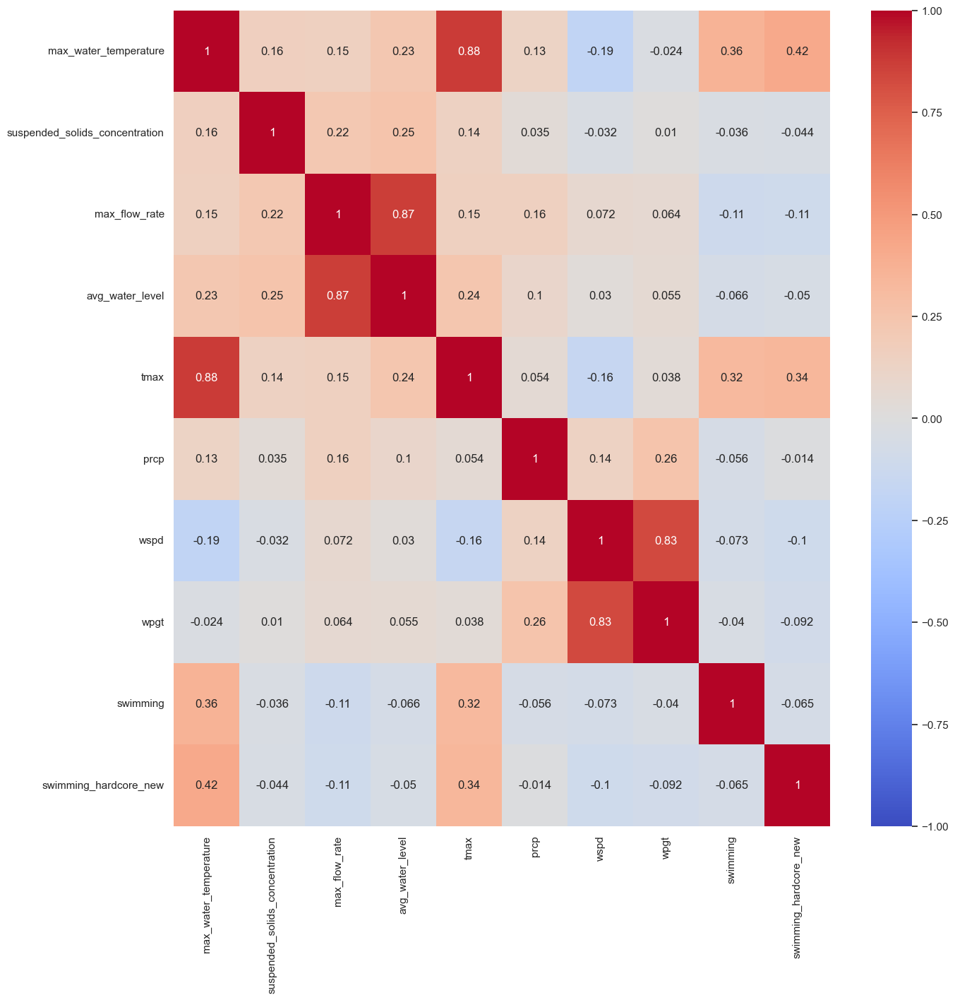

In [ ]:
# heatmap with all the variables and swimming-variables:
df_final_heatmap_swimming = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','swimming', 'swimming_hardcore_new']]
# Berechne die Korrelationsmatrix
correlation_matrix = df_final_heatmap_swimming.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

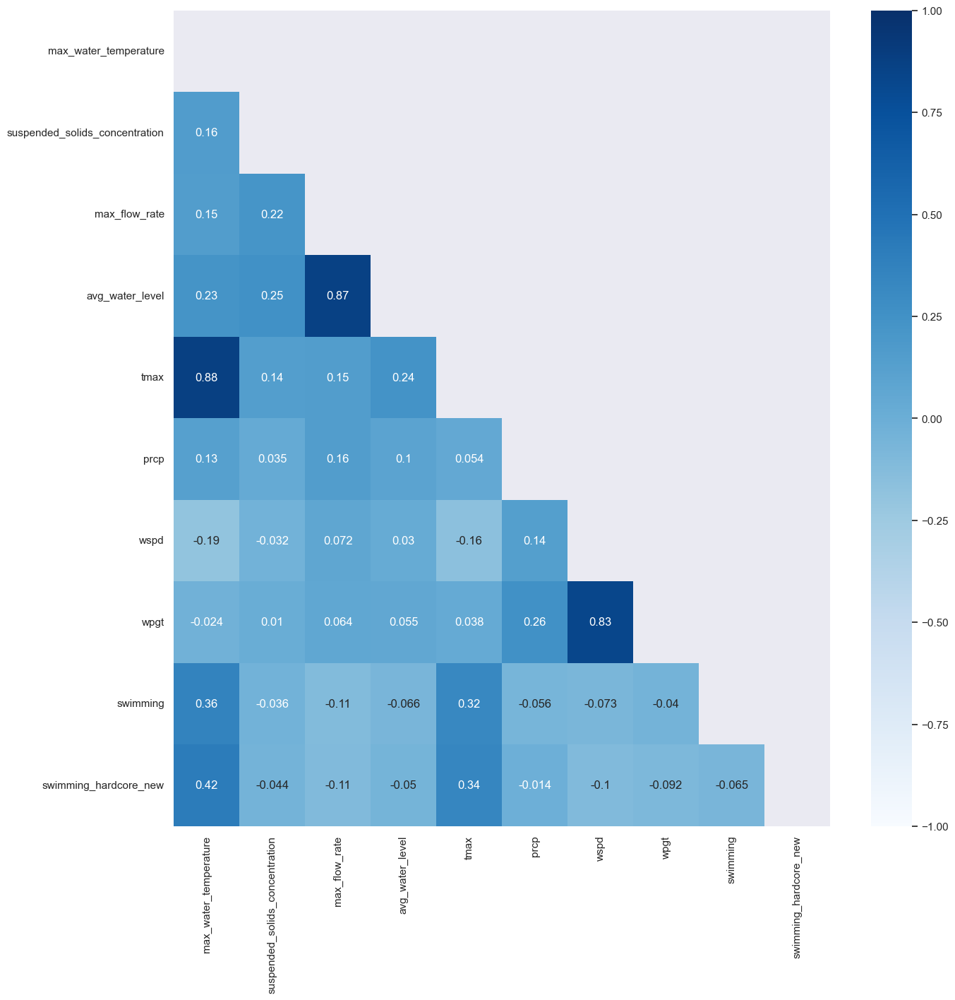

In [ ]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

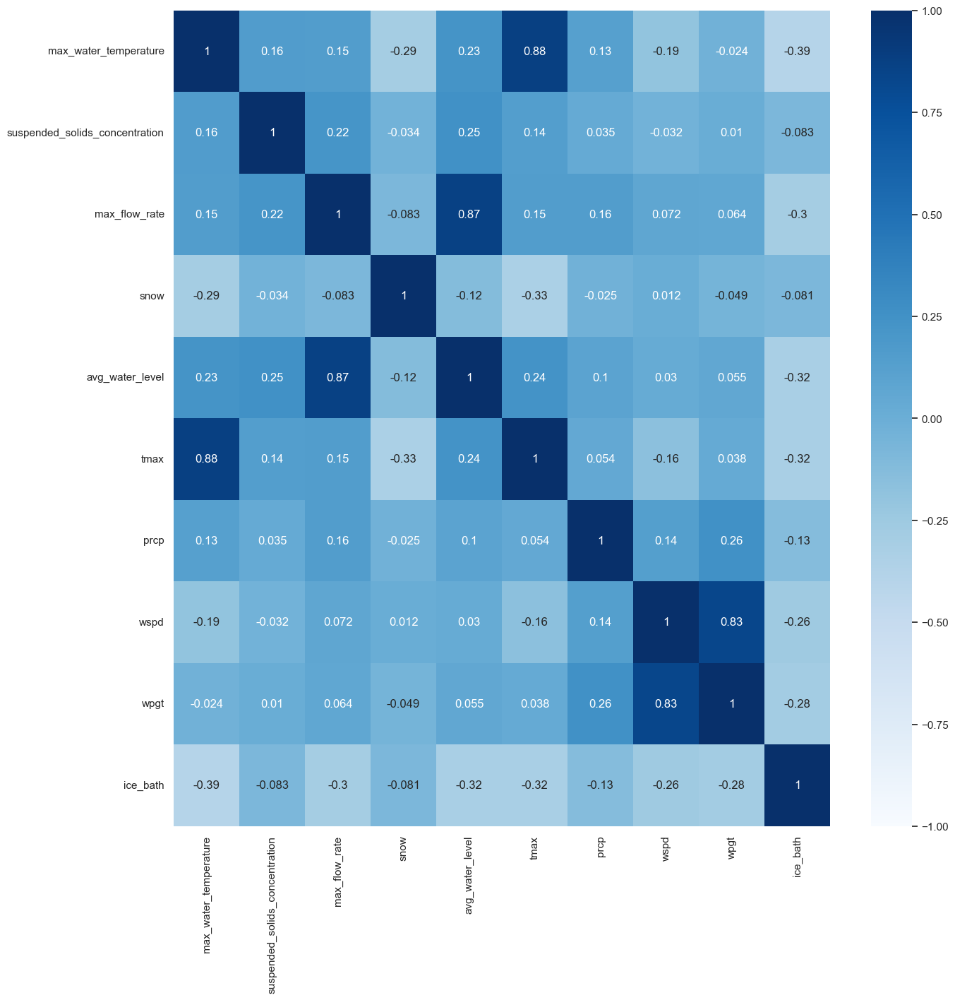

In [ ]:
# heatmap with all the variables and ice-bath-variables:
df_final_heatmap_ice = df_final[['max_water_temperature', 'suspended_solids_concentration', 'max_flow_rate','snow','avg_water_level', 'tmax', 'prcp', 'wspd', 'wpgt','ice_bath']]
# Berechne die Korrelationsmatrix
correlation_matrix_ice = df_final_heatmap_ice.corr()

# Erstelle die Heatmap
sns.heatmap(correlation_matrix_ice, annot=True, cmap="Blues", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

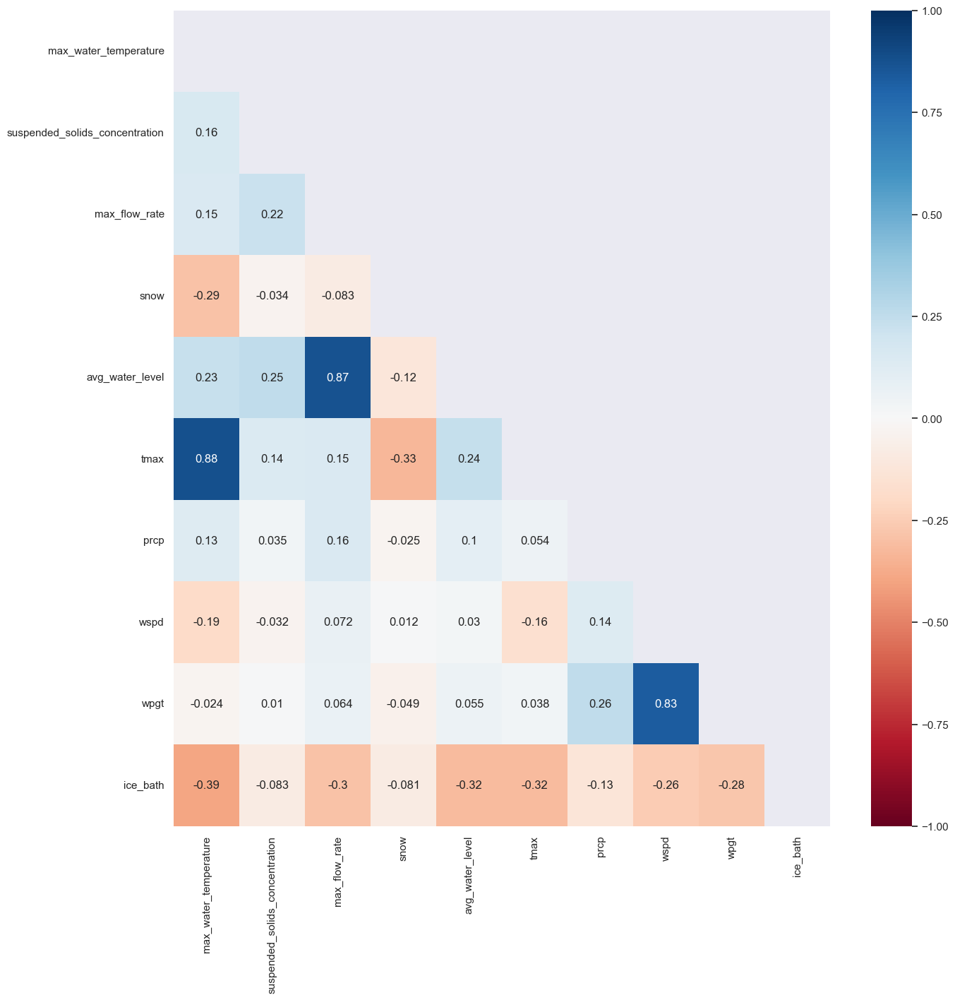

In [ ]:
# Erstelle eine Maske für das obere Dreieck
mask = np.triu(np.ones_like(correlation_matrix_ice, dtype=bool))

# Erstelle die Heatmap mit der Maske
sns.heatmap(correlation_matrix_ice, mask=mask, annot=True, cmap="RdBu", vmin=-1, vmax=1)

# Zeige die Heatmap
plt.show()

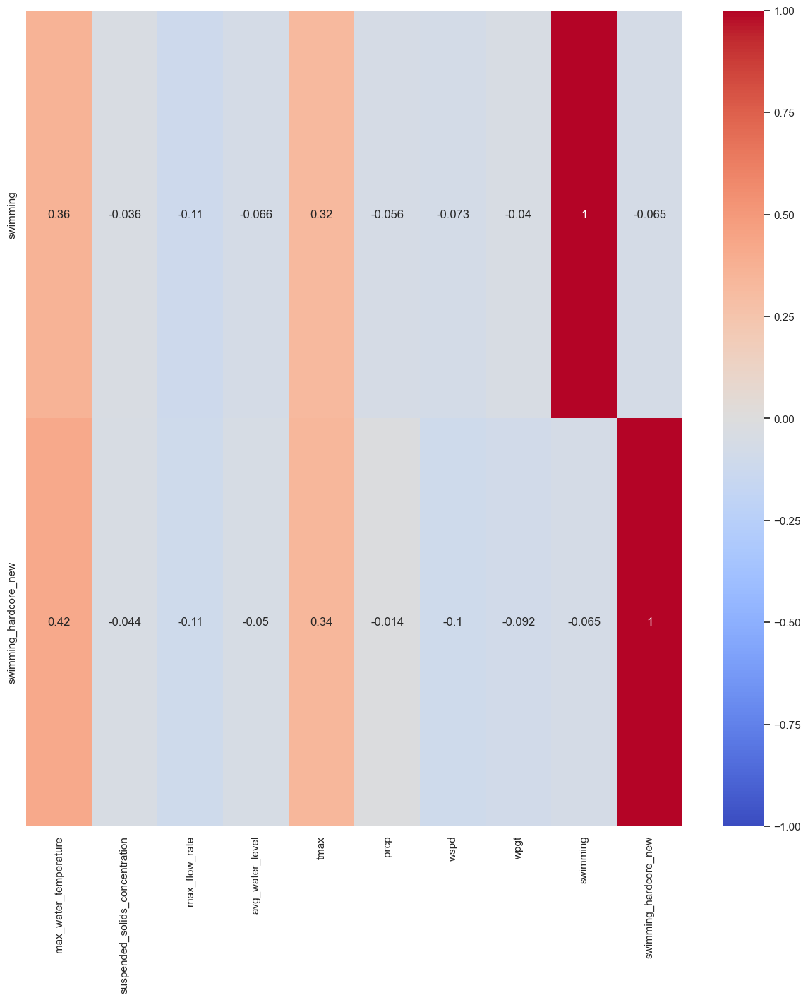

In [ ]:
# Filtere die Korrelationen nur für die zwei Zielvariablen (Var1, Var2)
correlation_focus = correlation_matrix.loc[['swimming', 'swimming_hardcore_new'], :]

# Heatmap für die zwei Variablen erstellen
sns.heatmap(correlation_focus, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

plt.show()

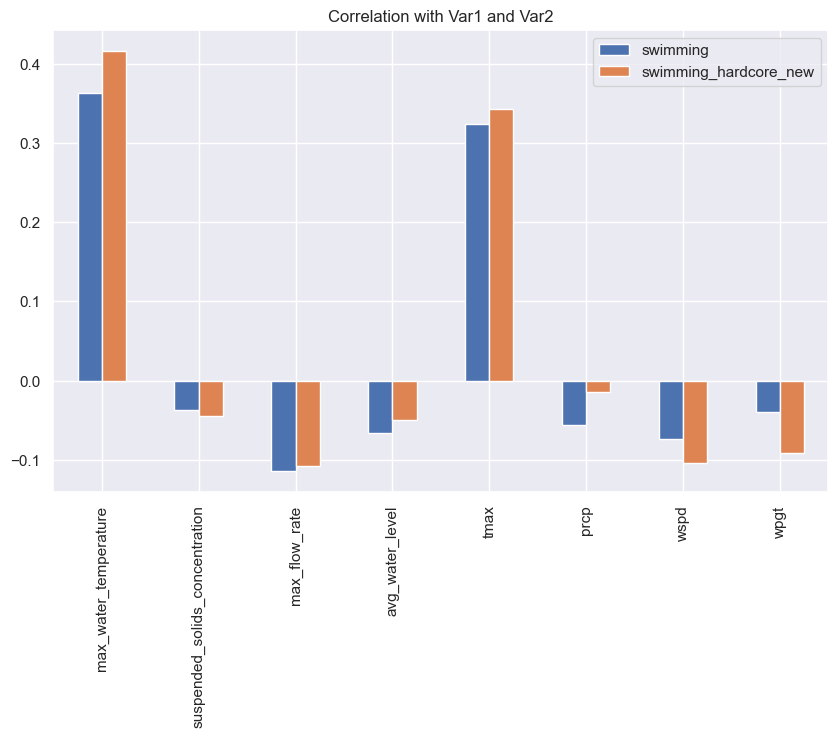

In [ ]:
# Korrelationen berechnen
correlation_focus = correlation_matrix[['swimming', 'swimming_hardcore_new']].drop(['swimming', 'swimming_hardcore_new'])

# Balkendiagramm erstellen
correlation_focus.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation with Var1 and Var2')
plt.show()

AttributeError: 'AxesImage' object has no property 'mask'

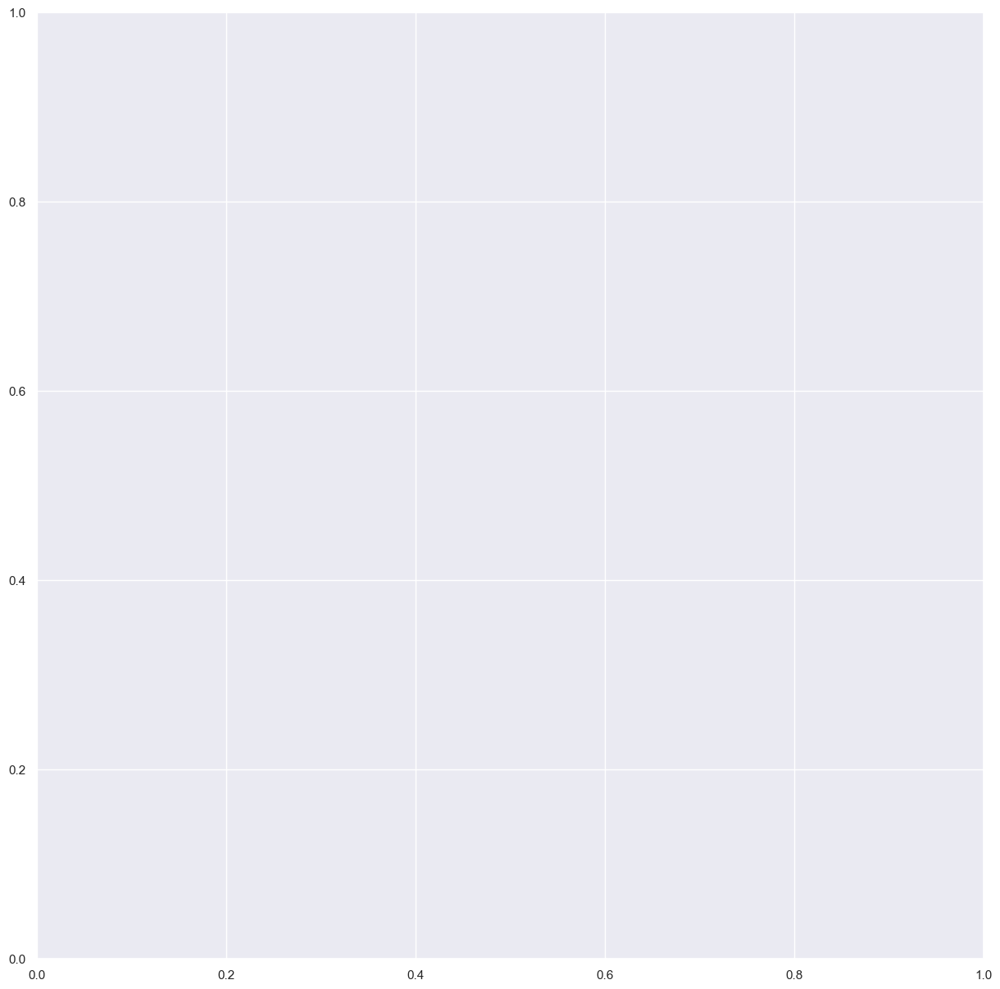

In [ ]:
# Heatmap mit Matplotlib und benutzerdefinierten Anpassungen
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest', vmax=1, vmin=0)
plt.colorbar()
plt.title('Custom Heatmap')
plt.grid(which='major', color='black', linestyle='-', linewidth=1)
plt.show()

## Creating A DataFrame For Water Quality

In [ ]:
df_water_quality

,Datum,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport
0,31.10.65,25,"47,85","0,02","0,55"
1,01.11.65,"18,06","32,47","0,01","0,38"
2,02.11.65,"11,57","20,55","0,01","0,24"
3,03.11.65,"11,11","27,77","0,01","0,32"
4,04.11.65,"9,88","26,54","0,01","0,31"
...,...,...,...,...,...
229,17.08.24,"487,97","1909,53","0,67","22,1"
230,18.08.24,"487,88","2010,8","0,71","23,27"
231,19.08.24,"487,77","5288,8","1,86","61,21"
232,20.08.24,"487,72","5090,98","1,79","58,92"


In [ ]:
df_concentration = df_water_quality[['Datum','suspended_solids_concentration']]
df_concentration

,Datum,suspended_solids_concentration
0,31.10.65,25
1,01.11.65,"18,06"
2,02.11.65,"11,57"
3,03.11.65,"11,11"
4,04.11.65,"9,88"
...,...,...
229,17.08.24,"487,97"
230,18.08.24,"487,88"
231,19.08.24,"487,77"
232,20.08.24,"487,72"


In [ ]:
# changing "Datum" into datetime for analyzing
df_concentration['date'] = pd.to_datetime(df_concentration['Datum'], dayfirst=True)
df_concentration

,Datum,suspended_solids_concentration,date
0,31.10.65,25,2065-10-31
1,01.11.65,"18,06",2065-11-01
2,02.11.65,"11,57",2065-11-02
3,03.11.65,"11,11",2065-11-03
4,04.11.65,"9,88",2065-11-04
...,...,...,...
229,17.08.24,"487,97",2024-08-17
230,18.08.24,"487,88",2024-08-18
231,19.08.24,"487,77",2024-08-19
232,20.08.24,"487,72",2024-08-20


In [ ]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [ ]:
# adding year, month into the dataframe
df_concentration['year']= df_concentration['date'].dt.year
df_concentration['month'] = df_concentration['date'].dt.month
df_concentration

,Datum,suspended_solids_concentration,date,year,month
0,31.10.65,25,2065-10-31,2065,10
1,01.11.65,"18,06",2065-11-01,2065,11
2,02.11.65,"11,57",2065-11-02,2065,11
3,03.11.65,"11,11",2065-11-03,2065,11
4,04.11.65,"9,88",2065-11-04,2065,11
...,...,...,...,...,...
229,17.08.24,"487,97",2024-08-17,2024,8
230,18.08.24,"487,88",2024-08-18,2024,8
231,19.08.24,"487,77",2024-08-19,2024,8
232,20.08.24,"487,72",2024-08-20,2024,8


In [ ]:
# dropping "Datum"
df_concentration= df_concentration.drop(columns='Datum')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,"18,06",2065-11-01,2065,11
2,"11,57",2065-11-02,2065,11
3,"11,11",2065-11-03,2065,11
4,"9,88",2065-11-04,2065,11
...,...,...,...,...
229,"487,97",2024-08-17,2024,8
230,"487,88",2024-08-18,2024,8
231,"487,77",2024-08-19,2024,8
232,"487,72",2024-08-20,2024,8


In [ ]:
# replacing komma into dot
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].str.replace(',', '.')
df_concentration

,suspended_solids_concentration,date,year,month
0,25,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [ ]:
df_concentration_test = df_concentration[df_concentration['date']object.freq1000]
df_concentration

TypeError: Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`

In [ ]:
#changing suspended_solids_concentration into a float
df_concentration['suspended_solids_concentration'] = df_concentration['suspended_solids_concentration'].astype(dtype='float64')
df_concentration


,suspended_solids_concentration,date,year,month
0,25.00,2065-10-31,2065,10
1,18.06,2065-11-01,2065,11
2,11.57,2065-11-02,2065,11
3,11.11,2065-11-03,2065,11
4,9.88,2065-11-04,2065,11
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


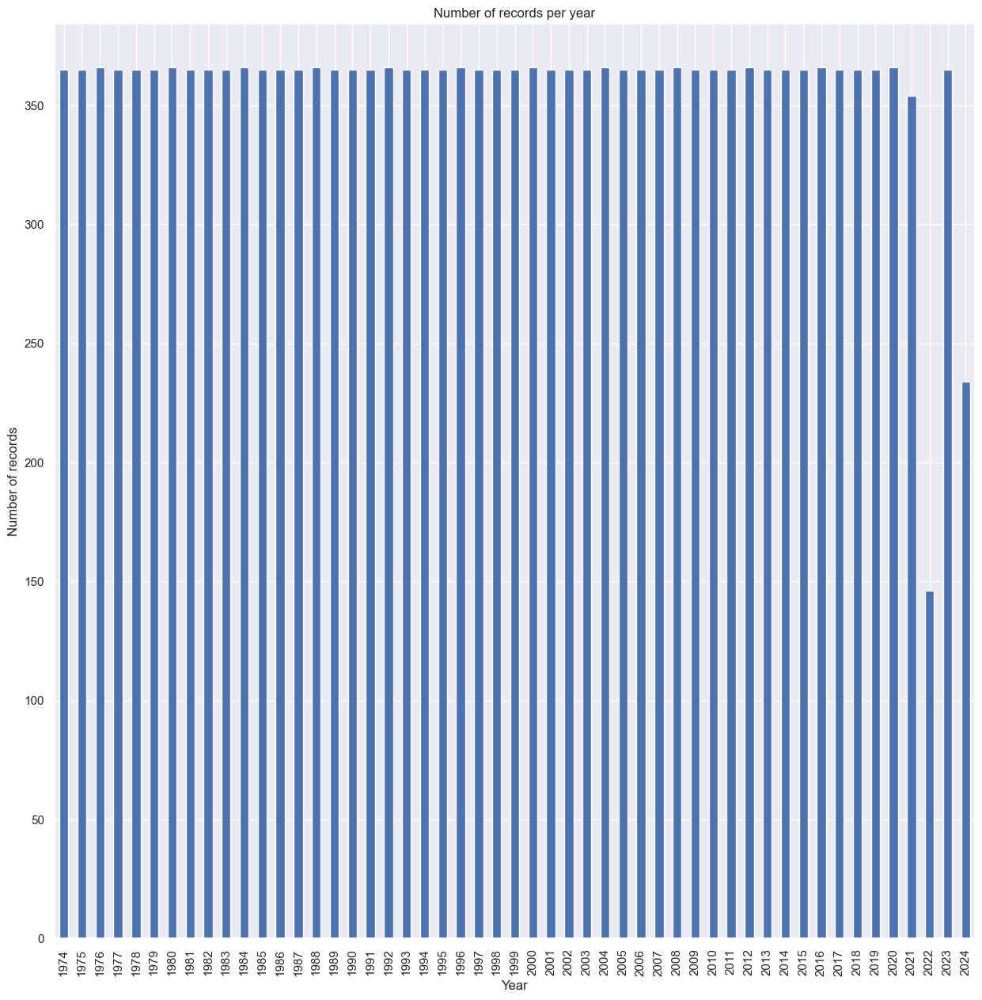

In [ ]:
# plot of records per year to find out, if there's a lot of missing data
concentration_per_year = df_concentration.groupby('year').size()

concentration_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [ ]:
df_concentration.year.unique()

array([2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021, 2022, 2023, 2024], dtype=int32)

In [ ]:
duplicate_indices = df_concentration[df_concentration.index.duplicated()]
print(duplicate_indices)

     suspended_solids_concentration       date  year  month
0                              9.24 2024-01-01  2024      1
1                              9.23 2024-01-02  2024      1
2                              9.22 2024-01-03  2024      1
3                              9.15 2024-01-04  2024      1
4                              9.02 2024-01-05  2024      1
..                              ...        ...   ...    ...
229                          487.97 2024-08-17  2024      8
230                          487.88 2024-08-18  2024      8
231                          487.77 2024-08-19  2024      8
232                          487.72 2024-08-20  2024      8
233                          481.78 2024-08-21  2024      8

[234 rows x 4 columns]


In [ ]:
df_concentration = df_concentration[df_concentration['year'] <= 2024]
df_concentration

,suspended_solids_concentration,date,year,month
2984,7.77,1974-01-01,1974,1
2985,8.38,1974-01-02,1974,1
2986,10.34,1974-01-03,1974,1
2987,16.67,1974-01-04,1974,1
2988,18.40,1974-01-05,1974,1
...,...,...,...,...
229,487.97,2024-08-17,2024,8
230,487.88,2024-08-18,2024,8
231,487.77,2024-08-19,2024,8
232,487.72,2024-08-20,2024,8


In [ ]:
# there a data from 1900, which were interpretated as 2000. So have to manipulate the year
#df_concentration.loc[df_concentration['date'] >'2024-09-09', 'date'] = df_concentration['date'] - pd.DateOffset(years=100)
#df_concentration

In [ ]:
# exporting the quality data
df_concentration.to_csv("data_quality.csv", sep=';', decimal=',', index=False)

## Creating A DataFrame For Water Level

In [ ]:
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level
0,01.11.73,50,58,44
1,02.11.73,45,53,43
2,03.11.73,49,57,43
3,04.11.73,45,57,31
4,05.11.73,46,52,35
...,...,...,...,...
239,27.08.24,130,137,121
240,28.08.24,117,121,113
241,29.08.24,114,116,110
242,30.08.24,114,116,108


In [ ]:
# changing "Datum" into datetime for analyzing
df_water_level['date'] = pd.to_datetime(df_water_level['Datum'], dayfirst=True)
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date
0,01.11.73,50,58,44,2073-11-01
1,02.11.73,45,53,43,2073-11-02
2,03.11.73,49,57,43,2073-11-03
3,04.11.73,45,57,31,2073-11-04
4,05.11.73,46,52,35,2073-11-05
...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27
240,28.08.24,117,121,113,2024-08-28
241,29.08.24,114,116,110,2024-08-29
242,30.08.24,114,116,108,2024-08-30


In [ ]:
# adding year, month into the dataframe
df_water_level['year'] = df_water_level['date'].dt.year
df_water_level['month'] = df_water_level['date'].dt.month
df_water_level

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
0,01.11.73,50,58,44,2073-11-01,2073,11
1,02.11.73,45,53,43,2073-11-02,2073,11
2,03.11.73,49,57,43,2073-11-03,2073,11
3,04.11.73,45,57,31,2073-11-04,2073,11
4,05.11.73,46,52,35,2073-11-05,2073,11
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [ ]:
# no replacing necessesary, because they are integers
df_water_level.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18567 entries, 0 to 243
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Datum            18567 non-null  object        
 1   avg_water_level  18567 non-null  int64         
 2   max_water_level  18567 non-null  int64         
 3   min_water_level  18567 non-null  int64         
 4   date             18567 non-null  datetime64[ns]
 5   year             18567 non-null  int32         
 6   month            18567 non-null  int32         
dtypes: datetime64[ns](1), int32(2), int64(3), object(1)
memory usage: 1015.4+ KB


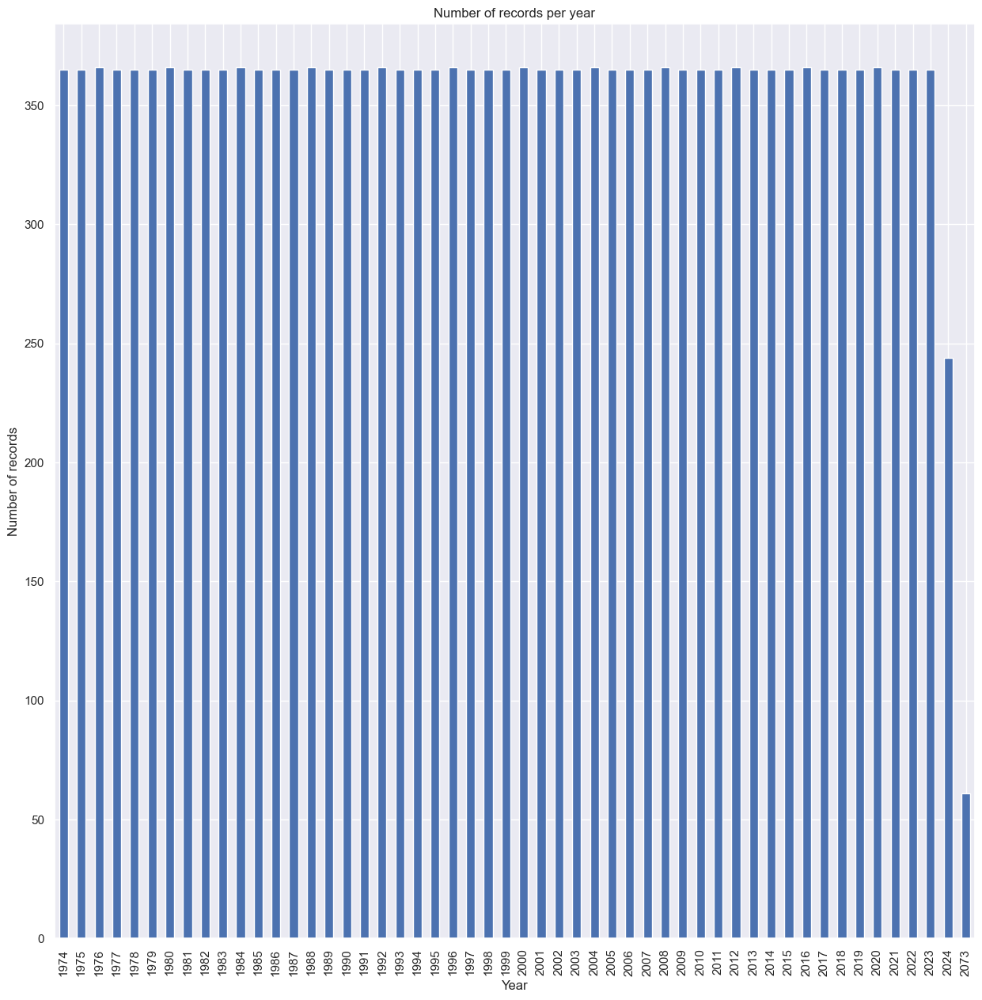

In [ ]:
# finding out, if there a missing data:
# plot of records per year to find out, if there's a lot of missing data
water_level_per_year = df_water_level.groupby('year').size()

water_level_per_year.plot(kind='bar')
plt.title('Number of records per year')
plt.xlabel('Year')
plt.ylabel('Number of records')
plt.show()
#sns.barplot(x=df_river['year'],
#            y=df_river['year'].count())
#plt.show()
#len(df_river[df_river['year'] == 2016])

In [ ]:
df_water_level_new = df_water_level[df_water_level['year'] <= 2024]
df_water_level_new

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month
61,01.01.74,46,54,38,1974-01-01,1974,1
62,02.01.74,44,55,35,1974-01-02,1974,1
63,03.01.74,51,55,47,1974-01-03,1974,1
64,04.01.74,56,64,45,1974-01-04,1974,1
65,05.01.74,53,57,33,1974-01-05,1974,1
...,...,...,...,...,...,...,...
239,27.08.24,130,137,121,2024-08-27,2024,8
240,28.08.24,117,121,113,2024-08-28,2024,8
241,29.08.24,114,116,110,2024-08-29,2024,8
242,30.08.24,114,116,108,2024-08-30,2024,8


In [ ]:
# adding 3 columns: water alert level 1, 2, 3 and 4
# there are specific actions the city of munich take if the water level reaches one of them
# water alert level 1 = 240 cm, 300 cm, 380 cm, 520 cm

df_water_level_new['water_alert_level1'] = df_water_level_new['max_water_level']

In [ ]:
def determine_alert(row):
	if (row['max_water_level'] > 520.0):
		return 4
	elif (row['max_water_level'] > 380.0):
	    return 3
	elif (row['max_water_level'] > 300.0):
		return 2
	elif (row['max_water_level'] > 240.0):
		return 1
	return 0


#Apply to each row
df_water_level_new['water_alert_level']=df_water_level_new.apply(determine_alert,axis=1)


In [ ]:
df_water_level_new.isna().sum()

Datum                0
avg_water_level      0
max_water_level      0
min_water_level      0
date                 0
year                 0
month                0
water_alert_level    0
dtype: int64

In [ ]:
df_water_level_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18506 entries, 61 to 243
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Datum              18506 non-null  object        
 1   avg_water_level    18506 non-null  int64         
 2   max_water_level    18506 non-null  int64         
 3   min_water_level    18506 non-null  int64         
 4   date               18506 non-null  datetime64[ns]
 5   year               18506 non-null  int32         
 6   month              18506 non-null  int32         
 7   water_alert_level  18506 non-null  int64         
dtypes: datetime64[ns](1), int32(2), int64(4), object(1)
memory usage: 1.1+ MB


In [ ]:
df_water_level_new['water_alert_level'].value_counts()

water_alert_level
0    18336
1      116
2       36
3       17
4        1
Name: count, dtype: int64

In [ ]:

df_water_level_new[df_water_level_new['max_water_level']>520.0]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level
11619,24.08.05,495,542,451,2005-08-24,2005,8,1


In [ ]:
# creating 4 variables: 

def determine_alert1(row):
	if (row['water_alert_level'] == 1):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert1']=df_water_level_new.apply(determine_alert1,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 1]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
259,18.07.74,255,295,201,1974-07-18,1974,7,1,1,1.0,1.0,1.0,1,0
261,20.07.74,254,273,238,1974-07-20,1974,7,1,1,1.0,1.0,1.0,1,0
262,21.07.74,237,250,228,1974-07-21,1974,7,1,1,1.0,1.0,1.0,1,0
263,22.07.74,222,244,202,1974-07-22,1974,7,1,1,1.0,1.0,1.0,1,0
607,01.07.75,237,278,177,1975-07-01,1975,7,1,1,1.0,1.0,1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,06.06.24,230,247,221,2024-06-06,2024,6,1,1,1.0,1.0,1.0,1,0
158,07.06.24,262,266,247,2024-06-07,2024,6,1,1,1.0,1.0,1.0,1,0
159,08.06.24,240,268,220,2024-06-08,2024,6,1,1,1.0,1.0,1.0,1,0
161,10.06.24,239,250,212,2024-06-10,2024,6,1,1,1.0,1.0,1.0,1,0


In [ ]:
df_water_level_new['alert1'].value_counts()

alert1
0    18390
1      116
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert2(row):
	if (row['water_alert_level'] == 2):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert2']=df_water_level_new.apply(determine_alert2,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 2]



,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
260,19.07.74,275,301,257,1974-07-19,1974,7,2,0,1,NaN,NaN,0,1
1369,01.08.77,286,330,195,1977-08-01,1977,8,2,0,1,NaN,NaN,0,1
2054,17.06.79,238,312,181,1979-06-17,1979,6,2,0,1,NaN,NaN,0,1
2057,20.06.79,304,322,283,1979-06-20,1979,6,2,0,1,NaN,NaN,0,1
2817,19.07.81,247,317,175,1981-07-19,1981,7,2,0,1,NaN,NaN,0,1
2821,23.07.81,308,358,267,1981-07-23,1981,7,2,0,1,NaN,NaN,0,1
4297,07.08.85,313,351,273,1985-08-07,1985,8,2,0,1,NaN,NaN,0,1
4298,08.08.85,299,347,273,1985-08-08,1985,8,2,0,1,NaN,NaN,0,1
7883,02.06.95,276,313,227,1995-06-02,1995,6,2,0,1,NaN,NaN,0,1
7884,03.06.95,316,334,296,1995-06-03,1995,6,2,0,1,NaN,NaN,0,1


In [ ]:
df_water_level_new['alert2'].value_counts()

alert2
0    18470
1       36
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert3(row):
	if (row['water_alert_level'] == 3):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert3']=df_water_level_new.apply(determine_alert3,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 3]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
2055,18.06.79,383,424,312,1979-06-18,1979,6,3,0,0,1,NaN,0,0
2056,19.06.79,358,402,322,1979-06-19,1979,6,3,0,0,1,NaN,0,0
2818,20.07.81,389,424,317,1981-07-20,1981,7,3,0,0,1,NaN,0,0
2819,21.07.81,387,395,382,1981-07-21,1981,7,3,0,0,1,NaN,0,0
2820,22.07.81,376,390,358,1981-07-22,1981,7,3,0,0,1,NaN,0,0
9333,22.05.99,442,469,334,1999-05-22,1999,5,3,0,0,1,NaN,0,0
9334,23.05.99,450,467,434,1999-05-23,1999,5,3,0,0,1,NaN,0,0
9335,24.05.99,432,436,425,1999-05-24,1999,5,3,0,0,1,NaN,0,0
9336,25.05.99,414,439,389,1999-05-25,1999,5,3,0,0,1,NaN,0,0
9337,26.05.99,350,391,311,1999-05-26,1999,5,3,0,0,1,NaN,0,0


In [ ]:
df_water_level_new.alert3.value_counts()

alert3
0    18489
1       17
Name: count, dtype: int64

In [ ]:
# creating 4 variables: 

def determine_alert4(row):
	if (row['water_alert_level'] == 4):
		return 1
	else:
		return 0
	
# Apply to each row:

df_water_level_new['alert4']=df_water_level_new.apply(determine_alert4,axis=1)

df_water_level_new[df_water_level_new['water_alert_level'] == 4]

,Datum,avg_water_level,max_water_level,min_water_level,date,year,month,water_alert_level,alert1,alert2,alert3,alert4,water_alert1,water_alert2
11619,24.08.05,495,542,451,2005-08-24,2005,8,4,0,0,0,1,0,0


In [ ]:
df_water_level_new.to_csv("waterlevel.csv", sep=';', decimal=",", index=False)

In [ ]:
df_water_level_new[df_water_level_new['month']==12].describe().T
                   # df_water_level_new['max_water_level']>200) &

,count,mean,min,25%,50%,75%,max,std
avg_water_level,1550.0,67.024516,20.0,48.0,61.0,82.0,206.0,27.55415
max_water_level,1550.0,74.153548,21.0,54.0,69.0,89.0,223.0,30.060123
min_water_level,1550.0,60.507097,16.0,43.0,54.0,75.0,188.0,25.581115
date,1550,1999-06-16 17:45:36,1974-12-01 00:00:00,1986-12-16 06:00:00,1999-06-16 12:00:00,2011-12-15 18:00:00,2023-12-31 00:00:00,NaN
year,1550.0,1998.5,1974.0,1986.0,1998.5,2011.0,2023.0,14.435527
month,1550.0,12.0,12.0,12.0,12.0,12.0,12.0,0.0
water_alert_level,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert1,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert2,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
alert3,1550.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## DataFrame Floods (water level, flow rate and precitation)


In [ ]:
#

# Looking deeper into the data

# HiER NOCHMAL CHECKEN UND DANN RAUSWERFEN!!!!

# ICE BATH
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`


In [ ]:
df_river.columns

Index(['date', 'avg_water_temperature', 'max_water_temperature',
       'min_water_temperature', 'avg_water_level', 'max_water_level',
       'min_water_level', 'suspended_solids_concentration',
       'suspended_solid_load', 'suspended_sediment_erosion',
       'suspended_sediment_transport', 'avg_flow_rate', 'max_flow_rate',
       'min_flow_rate', 'year', 'month'],
      dtype='object')

In [ ]:
df_ice_bath_river = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration', 'max_flow_rate']]
df_ice_bath_river

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,1980-11-01,8.1,71,5.57,63.4
1,1980-11-02,7.3,59,5.10,39.6
2,1980-11-03,5.8,68,5.14,60.0
3,1980-11-04,5.6,77,7.60,56.9
4,1980-11-05,4.8,77,9.03,66.5
...,...,...,...,...,...
15283,2024-08-27,17.6,130,34.95,76.7
15284,2024-08-28,19.0,117,34.95,53.0
15285,2024-08-29,19.6,114,34.95,46.1
15286,2024-08-30,19.8,114,34.95,46.1


In [ ]:
df_ice_bath_river.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15288 entries, 0 to 15287
Data columns (total 5 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            15288 non-null  datetime64[ns]
 1   max_water_temperature           15288 non-null  float64       
 2   avg_water_level                 15288 non-null  int64         
 3   suspended_solids_concentration  15288 non-null  float64       
 4   max_flow_rate                   15288 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 597.3 KB


In [ ]:
df_ice_bath_river.isna().sum()

date                              0
max_water_temperature             0
avg_water_level                   0
suspended_solids_concentration    0
max_flow_rate                     0
dtype: int64

- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath_weather = df_weather[['date', 'tmax', 'prcp', 'wspd', 'wpgt', 'snow']]
df_ice_bath_weather

,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.00,44.60,0.0
1,2011-06-02,17.1,0.0,10.80,32.80,0.0
2,2011-06-03,23.8,0.0,15.10,43.60,0.0
3,2011-06-04,27.8,0.0,12.20,31.30,0.0
4,2011-06-05,27.1,4.7,9.70,67.70,0.0
...,...,...,...,...,...,...
2799,2024-09-01,29.5,0.0,7.20,22.00,0.0
2800,2024-09-02,27.2,0.0,7.60,30.20,0.0
2801,2024-09-03,28.9,0.0,5.40,18.70,0.0
2802,2024-09-04,NaN,NaN,8.43,29.83,0.0


In [ ]:
df_ice_bath_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4845 entries, 0 to 2803
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    4845 non-null   datetime64[ns]
 1   tmax    4843 non-null   float64       
 2   prcp    4843 non-null   float64       
 3   wspd    4845 non-null   float64       
 4   wpgt    4845 non-null   float64       
 5   snow    4845 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 265.0 KB


In [ ]:
# rows in Septemeber 2024 I drop:
df_ice_bath_weather = df_ice_bath_weather[df_ice_bath_weather['date']<='2024-08-31']
df_ice_bath_weather


,date,tmax,prcp,wspd,wpgt,snow
0,2011-06-01,13.3,4.2,14.0,44.60,0.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0
2,2011-06-03,23.8,0.0,15.1,43.60,0.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0
4,2011-06-05,27.1,4.7,9.7,67.70,0.0
...,...,...,...,...,...,...
2794,2024-08-27,24.6,0.0,8.6,31.70,0.0
2795,2024-08-28,29.6,0.0,5.0,34.09,0.0
2796,2024-08-29,31.2,0.0,6.1,23.80,0.0
2797,2024-08-30,30.8,0.0,6.1,24.50,0.0


In [ ]:
#joining water and weather datasets by date:
df_ice_bath = pd.merge(df_ice_bath_weather, df_ice_bath_river, how='left', on='date')
df_ice_bath

,date,tmax,prcp,wspd,wpgt,snow,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
0,2011-06-01,13.3,4.2,14.0,44.60,0.0,16.1,107.0,126.14,192.0
1,2011-06-02,17.1,0.0,10.8,32.80,0.0,13.2,82.0,114.69,98.7
2,2011-06-03,23.8,0.0,15.1,43.60,0.0,14.8,62.0,90.89,60.0
3,2011-06-04,27.8,0.0,12.2,31.30,0.0,16.4,52.0,67.09,42.4
4,2011-06-05,27.1,4.7,9.7,67.70,0.0,17.1,49.0,43.29,43.6
...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,24.6,0.0,8.6,31.70,0.0,17.6,130.0,34.95,76.7
4836,2024-08-28,29.6,0.0,5.0,34.09,0.0,19.0,117.0,34.95,53.0
4837,2024-08-29,31.2,0.0,6.1,23.80,0.0,19.6,114.0,34.95,46.1
4838,2024-08-30,30.8,0.0,6.1,24.50,0.0,19.8,114.0,34.95,46.1


In [ ]:
df_ice_bath.isna().sum()

date                                0
tmax                                0
prcp                                0
wspd                                0
wpgt                                0
snow                                0
max_water_temperature             718
avg_water_level                   718
suspended_solids_concentration    718
max_flow_rate                     718
dtype: int64

## Adding a variable "ice_bath"
`ice_bath = 1, if...`
- `max water temperature: < 11 °C`
- `avg water level: < 120 cm`
- `suspended solids concentration < 25 m3/s`
- `max flow rate: < 65 m3/s`
- `max temperature: > -10 °C`
- `total precipitation < 15 mm/day`
- `avg windspeed <20km/h`
- `peak gust <50km/h`
- `snow_depth < 30cm`

In [ ]:
df_ice_bath['ice_bath'].value_counts()

ice_bath
0    3874
1     966
Name: count, dtype: int64

In [ ]:
df_ice_bath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4840 entries, 0 to 4839
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date                            4840 non-null   datetime64[ns]
 1   tmax                            4840 non-null   float64       
 2   prcp                            4840 non-null   float64       
 3   wspd                            4840 non-null   float64       
 4   wpgt                            4840 non-null   float64       
 5   snow                            4840 non-null   float64       
 6   max_water_temperature           4122 non-null   float64       
 7   avg_water_level                 4122 non-null   float64       
 8   suspended_solids_concentration  4122 non-null   float64       
 9   max_flow_rate                   4122 non-null   float64       
 10  ice_bath                        4840 non-null   int64         
dtypes: d

In [ ]:
df_ice_bath.to_csv("ice_bath.csv", index=False)

# TESTSTATION

## result over all columns by using OutLiersBox:
- variables with suspected outliers: Social support, Generosity, Perceptions of corruption
- should I substitute them with the frequent value? 

In [ ]:
# other observations for the outliers:
data_social_support = happy_data_clean['Social support']
data_social_support
sns.distplot(data_social_support)#, kde=True)
plt.title('Histogram of social support')
plt.show()

NameError: name 'happy_data_clean' is not defined

In [ ]:
# how much outliers are there in social Support?
Q1 = happy_data_clean['Social support'].quantile(.25)
Q3 = happy_data_clean['Social support'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For social support: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Social support']) < lower_limit]
num_outliers_social_support#.shape[0] #['Social support'].counts()

# Conclusion: only 7 outliers. delete?

In [ ]:
# how much outliers are there in perception of corruption?
Q1 = happy_data_clean['Perceptions of corruption'].quantile(.25)
Q3 = happy_data_clean['Perceptions of corruption'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Perceptions of corruption: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Perceptions of corruption']) > upper_limit]
num_outliers_social_support.shape[0] #['Perceptions of corruption'].counts()

# Conclusion: 31 rows -> not that few. so I have to substitute the outliers with the mode? Median?

In [ ]:
# how much outliers are there in generosity?
Q1 = happy_data_clean['Generosity'].quantile(.25)
Q3 = happy_data_clean['Generosity'].quantile(.75)
IQR = Q3 - Q1
lower_limit = (Q1 - 1.5 * IQR)
upper_limit = (Q3 + 1.5 * IQR)

print("For Generosity: IQR: ", IQR, "lower limit= ", lower_limit, "upper_limit= ", upper_limit)

num_outliers_social_support = happy_data_clean[(happy_data_clean['Generosity']) > upper_limit]
num_outliers_social_support#.shape[0] #['Generosity'].counts()

# Conclusion: only 4 rows. Delete?

In [ ]:
happy_data_IQR = happy_data_clean.copy()
for column in happy_data_IQR:
    #print(column)
    if happy_data_IQR[column].dtype != 'object':
        Q1 = happy_data_IQR[column].quantile(.25)
        Q3 = happy_data_IQR[column].quantile(.75)
        IQR = Q3 - Q1
        lower_limit = (Q1 - 1.5 * IQR)
        upper_limit = (Q3 + 1.5 * IQR)
        
        print(column,lower_limit, upper_limit)
        happy_data_IQR=happy_data_IQR[(happy_data_IQR[column] > lower_limit) &
                      (happy_data_IQR[column] < upper_limit)]

In [ ]:
data_social_support.describe()

In [ ]:
# using apply and lambda to do it for all columns faster.

happy_data_clean.apply(lambda col: OutLiersBox(happy_data_clean, happy_data_clean.columns[col]))

In [ ]:
# Exercise 1.Tell a story with your dataset, to try to answer the following question:

"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

## Step 5: Formating the data for answering the questions
- creating new datasats, selected one
- trying out graphs

In [ ]:
# because there are 2 years I split the dataset in 2 years
happy_data_2018 = happy_data_clean[(happy_data.year == 2018)]
happy_data_2019 = happy_data_clean[(happy_data.year == 2019)]

In [ ]:
happy_data_2018

In [ ]:
happy_data_2019

In [ ]:
# nans in healthy life expectancy: are they distributed over the 2 years?
happy_data_2018['Healthy life expectancy'].isnull().sum()
happy_data_2018 = happy_data_2018.drop(columns='year')
happy_data_2018

In [ ]:
happy_data_2019['Healthy life expectancy'].isnull().sum()
happy_data_2019 = happy_data_2019.drop(columns='year')
happy_data_2019

In [ ]:
#looking into the dataset of Healthy life expectancy, where are values:
happy_data_2018_country_health = happy_data_2018[['Country or region', 'Healthy life expectancy']]
happy_data_2018_country_health['Healthy life expectancy'].unique()

# später weiter! Gerade nicht so wichtig.

In [ ]:
# numerical variables

numerical_happy_data = happy_data_clean.select_dtypes(include=['int64','float'])
numerical_happy_data
numerical_happy_data1 = numerical_happy_data.drop(columns="Healthy life expectancy")

In [ ]:
# categorical variables

categorical_happy_data = happy_data_clean.select_dtypes(include=['category', 'object'])
categorical_happy_data

In [ ]:
"Which factors are more important to live a happier life? As a result, people and countries can focus on the more significant factors to achieve a higher happiness level "

# To achieve this goal use the different funcionalities from 
# the visualization libraries that you have seen in the module

In [ ]:
# plotting correlations between the score and the dimensions
sns.pairplot(numerical_happy_data1)
plt.show()

In [ ]:
# because nothing works, I start with on variable: score and GDP per capita
#fig = sns.scatterplot(happy_data_2018, x='Score', y='GDP per capita')
#fig.show()
#Healthy life expectancy	Freedom to make life choices	Generosity	Perceptions of corruption

fig, ax = plt.subplot(3, 2, figsize=(20, 20))

# Option 1 : Scatter plot by default
sns.scatterplot(data=happy_data_clean, x='Score', y='GDP per capita', 
                alpha=0.7, ax=ax[0][0])


# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Social support', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

# Option 3 : Add style & color
sns.scatterplot(data=happy_data_clean, x='Score', y='Freedom to make life choices', 
                style=df['gender'].to_list(), 
                color='green',
                alpha=0.5, ax=ax[1][0])

# Option 4 : add size & color 
sns.scatterplot(data=happy_data_clean, x='Score', y='Generosity', 
                size=df['parental level of education'].to_list(), 
                color='brown', alpha=0.5, ax=ax[1][1])
sns:scatterplot(data=happy_data_clean, x="Score", y=)

# Option 2 : Add a hue
sns.scatterplot(data=happy_data_clean, x='Score', y='Perception of corruption', 
                hue=df['gender'].to_list(),
                alpha=0.7, ax=ax[0][1])

plt.show()

In [ ]:
# - 2 Variables
# - visualizations is the focus
# - find questions I want to answer

In [ ]:
import plotly.express as px
fig = px.histogram(df_river, x="year", y="suspended_sediment_transport")
fig.show()

#suspended_solids_concentration  15258 non-null  object        
# 11  suspended_solid_load            15258 non-null  object        
## 12  suspended_sediment_erosion      15258 non-null  object        
# 13  suspended_sediment_transport    15258 non-null  object 

In [ ]:
# suspended solids under 20, 25
df_solids_under_25 = df_river[df_river['suspended_solids_concentration'] < 25]
df_solids_under_20 = df_river[df_river['suspended_solids_concentration'] <= 20]


In [ ]:
df_solids_under_20.shape[0]

12125

In [ ]:
df_solids_under_25.shape[0]

13104

In [ ]:
# river flow rate under 75
df_river_flowrate_under_50 = df_river[df_river['avg_flow_rate'] < 50]

In [ ]:
df_river_flowrate_under_50.shape[0]

7663

In [ ]:
# precipitation:
df_weather_prcp_under_40 = df_weather[df_weather['prcp']<40]

In [ ]:
df_weather_prcp_under_40.shape[0]

4821

In [ ]:
# temperature (avg) over 25°C
df_temp_over_25 = df_weather[df_weather['tmax']>=25]

In [ ]:
df_temp_over_25.shape[0]

873

In [ ]:
# distribution temperature:
fig_temp = px.histogram(df_weather, x="date", y="tavg")
fig_temp.show()

In [ ]:
# RIVER - water quality
# first loading all the files into seperate DataFrames for each variable
# Jan - August 2024:
path_water_quality = "../datasets/river/fluesse-schwebstoff/16005701_beginn_bis_31.12.2023_tmw_0.csv"
path_water_level = "../datasets/river/fluesse-wasserstand/16005701_beginn_bis_31.12.2023_tmw_0-1.csv"
path_daily_water_temperatures = "../datasets/river/fluesse-wassertemperatur/16005701_beginn_bis_31.12.2023_tmw_0.csv"

df_river_flow_rate = pd.read_csv(path_river_flow_rate, sep=";")
#df_river_water_quality = pd.read_csv(path_water_quality, sep=";")
df_river_water_level = pd.read_csv(path_water_level, sep=";")
#df_river_daily_water_temperatures = pd.read_csv(path_daily_water_temperatures, sep=";")

df_river_flow_rate
#df_river_water_quality
#df_river_water_level
#df_river_daily_water_temperatures

# JOINING RIVER AND WEATHER

In [ ]:
df_merged = pd.merge(df_river, df_weather, how='left', on = 'date')
df_merged

ValueError: The column label 'date' is not unique.

In [ ]:
df_merged.shape

(15288, 27)

In [ ]:
df_merged.tail(20)

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
15268,2024-08-12,8,2024,12.08.24,"20,6","21,3","19,8",108,114,104,...,25.5,18.4,31.7,0.0,0.0,49.0,5.8,28.1,1012.3,660.0
15269,2024-08-13,8,2024,13.08.24,"20,7","21,4","19,7",113,118,108,...,24.8,18.9,32.6,1.2,0.0,168.0,9.7,57.2,1010.2,656.0
15270,2024-08-14,8,2024,14.08.24,"20,2",21,"19,1",118,122,113,...,23.0,17.1,31.0,4.1,0.0,235.0,9.0,54.7,1011.6,654.0
15271,2024-08-15,8,2024,15.08.24,"19,8","20,8","18,5",134,144,117,...,22.4,16.7,28.2,0.0,0.0,38.0,6.5,23.8,1016.4,786.0
15272,2024-08-16,8,2024,16.08.24,"19,7","20,6","18,7",117,126,107,...,24.5,19.0,29.8,0.5,0.0,313.0,5.0,23.4,1015.1,558.0
15273,2024-08-17,8,2024,17.08.24,"19,8","20,3","19,1",115,121,106,...,22.4,19.1,26.1,2.4,0.0,309.0,6.1,27.4,1012.5,303.0
15274,2024-08-18,8,2024,18.08.24,"19,3","20,2","18,6",117,131,105,...,19.1,16.3,21.9,54.5,0.0,269.0,9.7,40.7,1009.0,20.0
15275,2024-08-19,8,2024,19.08.24,"17,5","18,6","16,7",167,192,127,...,15.7,14.6,17.0,5.7,0.0,293.0,9.7,31.7,1016.1,0.0
15276,2024-08-20,8,2024,20.08.24,"16,9","17,3","16,5",165,185,148,...,17.3,15.7,20.1,0.0,0.0,102.0,6.1,22.3,1013.5,59.0
15277,2024-08-21,8,2024,21.08.24,"17,3",18,"16,7",143,149,135,...,17.7,12.5,22.2,0.4,0.0,263.0,9.7,43.2,1016.6,276.0


In [ ]:
df_merged.head(30)

,date,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,...,avg_water_level,max_water_level,min_water_level,suspended_solids_concentration,suspended_solid_load,suspended_sediment_erosion,suspended_sediment_transport,avg_flow_rate,max_flow_rate,min_flow_rate
0,2011-06-01,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,...,107.0,153.0,52.0,"126,14","1803,93","0,64","20,88",116,192,"36,4"
1,2011-06-02,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,...,82.0,98.0,69.0,"114,69","1619,08","0,57","18,74","74,9","98,7","57,1"
2,2011-06-03,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,...,62.0,71.0,54.0,"90,89","1239,12","0,44","14,34",49,60,"38,7"
3,2011-06-04,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,...,52.0,57.0,44.0,"67,09","859,16","0,3","9,94","36,7","42,4","28,6"
4,2011-06-05,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,...,49.0,58.0,41.0,"43,29","479,2","0,17","5,55","33,5","43,6","25,7"
5,2011-06-06,16.9,12.7,24.6,13.1,NaN,244.0,8.6,55.1,1005.6,...,63.0,78.0,51.0,"21,59","134,88","0,05","1,56","49,9","70,4","35,2"
6,2011-06-07,19.4,12.1,25.2,0.0,NaN,121.0,9.0,34.9,1004.3,...,56.0,60.0,50.0,"16,26","68,38","0,02","0,79","41,8","45,5","34,6"
7,2011-06-08,15.5,12.5,19.3,1.9,NaN,261.0,12.6,51.5,1006.3,...,52.0,57.0,47.0,"14,4","60,78","0,02","0,7","37,3","42,3","31,7"
8,2011-06-09,13.7,12.3,15.4,0.4,NaN,310.0,7.6,19.8,1014.9,...,52.0,59.0,44.0,"12,55","53,18","0,02","0,62","37,5","45,2","28,5"
9,2011-06-10,14.4,10.9,18.6,0.0,NaN,329.0,6.8,21.2,1015.5,...,61.0,70.0,47.0,"11,2","48,66","0,02","0,56","48,3","59,6","31,4"


In [ ]:
df_merged.isna().sum()

date                                  0
month                                 0
year                                  0
Datum                                 0
avg_water_temperature                 0
max_water_temperature                 0
min_water_temperature                 0
avg_water_level                       0
max_water_level                       0
min_water_level                       0
suspended_solids_concentration       30
suspended_solid_load                 30
suspended_sediment_erosion           30
suspended_sediment_transport         30
avg_flow_rate                         0
max_flow_rate                         0
min_flow_rate                         0
tavg                              11166
tmin                              11166
tmax                              11166
prcp                              11169
snow                              13751
wdir                              11355
wspd                              11221
wpgt                              11222


In [ ]:
# looking only into the timeframe june 2011 until August 2024:
df_merged_2011_2024 = df_merged[(df_merged['date']>= '2011-06-01') & (df_merged['date']<='2024-08-31')]
df_merged_2011_2024

,date,month,year,Datum,avg_water_temperature,max_water_temperature,min_water_temperature,avg_water_level,max_water_level,min_water_level,...,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2011-06-01,6.0,2011.0,01.06.11,"14,3","16,1","12,9",107.0,153.0,52.0,...,11.5,9.7,13.3,4.2,NaN,288.0,14.0,44.6,1021.7,0.0
1,2011-06-02,6.0,2011.0,02.06.11,"12,8","13,2","12,5",82.0,98.0,69.0,...,13.4,10.9,17.1,0.0,NaN,42.0,10.8,32.8,1026.9,6.0
2,2011-06-03,6.0,2011.0,03.06.11,"13,6","14,8","12,7",62.0,71.0,54.0,...,18.0,12.8,23.8,0.0,NaN,77.0,15.1,43.6,1022.9,378.0
3,2011-06-04,6.0,2011.0,04.06.11,"15,1","16,4","13,9",52.0,57.0,44.0,...,20.6,14.6,27.8,0.0,NaN,80.0,12.2,31.3,1013.7,570.0
4,2011-06-05,6.0,2011.0,05.06.11,"16,3","17,1","15,3",49.0,58.0,41.0,...,19.8,13.9,27.1,4.7,NaN,269.0,9.7,67.7,1007.7,480.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,2024-08-27,8.0,2024.0,27.08.24,"16,6","17,6","15,8",130.0,137.0,121.0,...,18.3,12.9,24.6,0.0,NaN,87.0,8.6,31.7,1019.9,380.0
4836,2024-08-28,8.0,2024.0,28.08.24,"17,8",19,"16,6",117.0,121.0,113.0,...,21.3,14.3,29.6,0.0,NaN,NaN,5.0,NaN,1017.0,691.0
4837,2024-08-29,8.0,2024.0,29.08.24,"18,7","19,6","17,7",114.0,116.0,110.0,...,22.9,15.6,31.2,0.0,NaN,138.0,6.1,23.8,1017.4,773.0
4838,2024-08-30,8.0,2024.0,30.08.24,"19,1","19,8","18,1",114.0,116.0,108.0,...,22.5,15.2,30.8,0.0,NaN,93.0,6.1,24.5,1016.9,763.0


In [ ]:
df_merged_2011_2024.isna().sum()

date                                 0
month                              718
year                               718
Datum                              718
avg_water_temperature              718
max_water_temperature              718
min_water_temperature              718
avg_water_level                    718
max_water_level                    718
min_water_level                    718
suspended_solids_concentration     748
suspended_solid_load               748
suspended_sediment_erosion         748
suspended_sediment_transport       748
avg_flow_rate                      718
max_flow_rate                      718
min_flow_rate                      718
tavg                                 0
tmin                                 0
tmax                                 0
prcp                                 3
snow                              2745
wdir                               190
wspd                                55
wpgt                                57
pres                     

In [ ]:
df_river_nans = df_river[['date', 'max_water_temperature', 'avg_water_level', 'suspended_solids_concentration','max_flow_rate']][
    (df_river['month'].isna() | 
     df_river['year'].isna() | 
     df_river['max_water_temperature'].isna() |
     df_river['avg_water_level'].isna() | 
     df_river['suspended_solids_concentration'].isna() | 
     df_river['max_flow_rate'].isna()
     )
     ]
df_river_nans.tail(30)

,date,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
14513,2022-07-19,20.5,94,NaN,42.6
14514,2022-07-20,21.4,99,NaN,47.3
14515,2022-07-21,21.3,98,NaN,41.6
14516,2022-07-22,20.5,92,NaN,34.4
14517,2022-07-23,20.4,89,NaN,30.9
14518,2022-07-24,20.7,89,NaN,33.5
14519,2022-07-25,21.5,89,NaN,31.7
14520,2022-07-26,21.3,100,NaN,49.8
14521,2022-07-27,19.7,93,NaN,34.4
14522,2022-07-28,20.2,93,NaN,38.3


In [ ]:
df_swimming_nans = df_swimming[
    (df_swimming['month'].isna() | 
     df_swimming['year'].isna() | 
     df_swimming['max_water_temperature'].isna() |
     df_swimming['avg_water_level'].isna() | 
     df_swimming['suspended_solids_concentration'].isna() | 
     df_swimming['max_flow_rate'].isna()
     )
     ]
df_swimming_nans.head()


,date,tmax,prcp,wspd,wpgt,month,year,max_water_temperature,avg_water_level,suspended_solids_concentration,max_flow_rate
401,2012-07-06,24.6,18.5,8.6,32.4,NaN,NaN,NaN,NaN,NaN,NaN
402,2012-07-07,24.5,0.6,7.9,22.7,NaN,NaN,NaN,NaN,NaN,NaN
403,2012-07-08,26.5,2.5,11.2,62.3,NaN,NaN,NaN,NaN,NaN,NaN
404,2012-07-09,24.2,0.0,6.1,22.3,NaN,NaN,NaN,NaN,NaN,NaN
405,2012-07-10,26.8,0.3,7.9,27.7,NaN,NaN,NaN,NaN,NaN,NaN
